### Importing the necessary libraries and intial setup steps

In [1]:
# The libraries needed are imported below
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os.path
import re
from mlxtend.frequent_patterns import apriori, association_rules
from sklearn.cluster import KMeans
from pathlib import Path 
import missingno as msno
import pickle
from numpy import mean
from numpy import std
from sklearn.model_selection import cross_val_score, cross_validate, RepeatedStratifiedKFold, train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression, SGDClassifier, LinearRegression, RANSACRegressor
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.utils import resample
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, BaggingClassifier, StackingClassifier, StackingRegressor
from sklearn.datasets import make_classification
from sklearn.metrics import accuracy_score, mean_absolute_error, mean_squared_error, confusion_matrix, classification_report, r2_score, roc_curve, roc_auc_score
from sklearn.neural_network import MLPClassifier    #Multi-Layer Preceptron
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder 
from sklearn.svm import SVC, SVR            #Support Vector Classifier and regressor
from keras.wrappers.scikit_learn import KerasRegressor
from xgboost import XGBClassifier, XGBRegressor
from lightgbm import LGBMClassifier
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from sklearn.decomposition import PCA 
import plotly.graph_objects as go
import warnings

# Ignore warnings
warnings.filterwarnings("ignore")

%matplotlib inline

C:\Users\USCHIP\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [2]:
# Read in the csv file into pandas library
car_df = pd.read_csv("UserCarData_no_bracket.csv")

In [3]:
# View the initial insight of the dataset
car_df.head()

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,sold
0,1,Maruti,2014,450000,145500,East,District of Columbia,Washington,Diesel,Individual,Manual,First_Owner,23.40,1248,74.00,190Nm@ 2000rpm,5,Y
1,2,Skoda,2014,370000,120000,East,New York,New York City,Diesel,Individual,Manual,Second_Owner,21.14,1498,103.52,250Nm@ 1500-2500rpm,5,Y
2,3,Honda,2006,158000,140000,Central,Illinois,Chicago,Petrol,Individual,Manual,Third_Owner,17.70,1497,78.00,"12.7@ 2,700@kgm@ rpm@",5,Y
3,4,Hyundai,2010,225000,127000,Central,Illinois,Chicago,Diesel,Individual,Manual,First_Owner,23.00,1396,90.00,22.4 kgm @ 1750-2750rpm,5,Y
4,5,Maruti,2007,130000,120000,East,New York,New York City,Petrol,Individual,Manual,First_Owner,16.10,1298,88.20,"11.5@ 4,500@kgm@ rpm@",5,Y


In [4]:
# Run the describe function for initial description of the dataframe
car_df.describe()

,Sales_ID,year,selling_price,km_driven,mileage,engine,max_power,seats
count,7906.000000,7906.000000,7.906000e+03,7.906000e+03,7906.000000,7906.000000,7906.000000,7906.000000
mean,4070.106248,2013.983936,6.498137e+05,6.918866e+04,19.419861,1458.708829,91.587374,5.416393
std,2345.770159,3.863695,8.135827e+05,5.679230e+04,4.036263,503.893057,35.747216,0.959208
min,1.000000,1994.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,32.800000,2.000000
25%,2037.250000,2012.000000,2.700000e+05,3.500000e+04,16.780000,1197.000000,68.050000,5.000000
50%,4076.500000,2015.000000,4.500000e+05,6.000000e+04,19.300000,1248.000000,82.000000,5.000000
75%,6102.000000,2017.000000,6.900000e+05,9.542500e+04,22.320000,1582.000000,102.000000,5.000000
max,8128.000000,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,14.000000


In [5]:
# Check for columns with empty rows
car_df.isnull().sum()

Sales_ID             0
name                 0
year                 0
selling_price        0
km_driven            0
Region               0
State or Province    0
City                 0
fuel                 0
seller_type          0
transmission         0
owner                0
mileage              0
engine               0
max_power            0
torque               0
seats                0
sold                 0
dtype: int64

In [6]:
# Get more initial insights about the dataset and to ensure if columns have their data in required formats
car_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7906 entries, 0 to 7905
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Sales_ID           7906 non-null   int64  
 1   name               7906 non-null   object 
 2   year               7906 non-null   int64  
 3   selling_price      7906 non-null   int64  
 4   km_driven          7906 non-null   int64  
 5   Region             7906 non-null   object 
 6   State or Province  7906 non-null   object 
 7   City               7906 non-null   object 
 8   fuel               7906 non-null   object 
 9   seller_type        7906 non-null   object 
 10  transmission       7906 non-null   object 
 11  owner              7906 non-null   object 
 12  mileage            7906 non-null   float64
 13  engine             7906 non-null   int64  
 14  max_power          7906 non-null   float64
 15  torque             7906 non-null   object 
 16  seats              7906 

<AxesSubplot:>

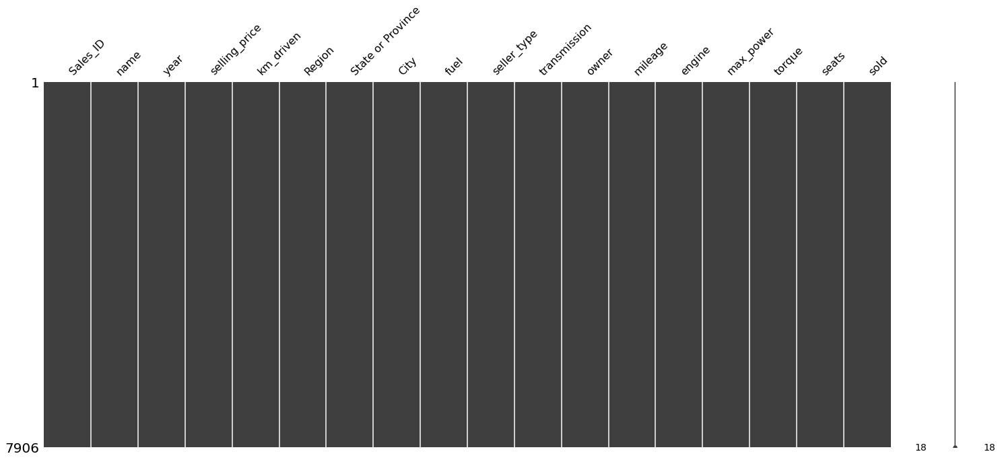

In [7]:
# Visualizing the Nullity Matrix( that is the positional matrix of missing values).

msno.matrix(car_df)

#### Since no column has an empty row, I would explore each column individually to know more about the data


### Data Cleaning and initial exploration

In [8]:
# Converting Indian rupees to dollar to represent the US market as prices where given in indian rupees.
# Exchange rate as at 18-07-2022 is 1RUP = 0.012USD
exchange_rate = 0.012
car_df["selling_price"] = car_df["selling_price"]*exchange_rate
car_df["selling_price"] = car_df["selling_price"].astype("int64") 

In [9]:
# Droping duplicate columns
car_df.drop_duplicates(inplace=True)

In [10]:
# Function to perfrom cleaning and other tasks
class initial_view:
    
    global name
    global year
    global selling_price
    global km_driven
    global region
    global state_province
    global city
    global fuel
    global seller_type
    global transmission
    global owner
    global mileage
    global engine
    global max_power
    global torque
    global seats
    global sold
    
    
    def  __init__(self, df, series):
        self.series = series
        self.df = df
                       
    # Get unique values:
    def get_unique(self):
        unique_result = self.df[self.series].unique()
        #return print("The following are the unique data entries for {} \n {}".format(self.series,unique_result))
        return unique_result

    # Get mode which is most frequent occurence
    def get_mode(self):
        mode_result = self.df[self.series].mode()
        #return print("The most sort after item on the {} series is {}".format(self.series, mode_result))
        return mode_result

    # Get mean value
    def get_mean(self):
        mean_result = self.df[self.series].mean()
        #return print("The mean of {} series is {}".format(self.series, mean_result))
        return mean_result
    
    # Get median value
    def get_median(self):
        median_result = self.df[self.series].median()
        #return print("The median of {} series is {}".format(self.series, median_result))
        return int(median_result)

    # Value count
    def get_count(self):
        count_result = self.df[self.series].value_counts()
        return count_result

    # Describe a series
    def get_describe(self):
        describe_result = self.df[self.series].describe()
        return describe_result
    
    # Checking the series for null values
    def get_isnull(self):
        isnull_result_1 = self.df[self.series].isnull().sum()
        isnull_result_2 = self.df[self.series].isnull()
        return isnull_result_1, isnull_result_2
    
      # Run all initial view class methods without the mean method. This to be used where data type is non-numerical
    def run_all_init(self):
        try:
            a = self.get_unique()
            b = self.get_mode()
            c = self.get_count()
            d = self.get_describe()
            f,g = self.get_isnull()
            group_1 = [a, b, c, d, g]
            print_version_run_all_v1 = print(
                "Unique Value:\n",a,"\n\n",
                "Mode Value:\n",b,"\n\n",
                "Count of Unique Values:\n",c,"\n\n",
                "Description of the Series:\n",d,"\n\n",
                "Sum of null rows:\n",f,"\n\n",
            )
            return [print_version_run_all_v1, group_1]
        except:
            return print("Error detected!, your query cannot be carried out at this time. Contact Wallace.")

    # Run all initial view class methods with the mean method. This to be used where data type is numerical
    def run_all_init_num(self):
        try:
            a = self.get_unique()
            b = self.get_mode()
            c = self.get_count()
            d = self.get_describe()
            e = self.get_median()
            f,g = self.get_isnull()
            h = self.get_mean()
            group_2 = [a, b, c, d, e, g, h]
            print_version_run_all_v2 = print(
                "Unique Value:\n",a,"\n\n",
                "Mode Value:\n",b,"\n\n",
                "Count of Unique Values:\n",c,"\n\n",
                "Description of the Series:\n",d,"\n\n",
                "Median value:\n",e,"\n\n",
                "Sum of null rows:\n",f,"\n\n",
                "Mean values:\n",h,"\n\n",
            )
            return [print_version_run_all_v2, group_2]
        except:
            error_code = print(
                "Error detected!. If you have used a string data type kindly use the query for version 1 \n",
                " which is: \n:"
                "(new_column_name).run_all_init \n",
                         "else contact Wallace")
            return error_code
        
    
# Defining names for calling column classes
name = initial_view(car_df,"name")     # For name column
year = initial_view(car_df,"year")     # For year column
selling_price = initial_view(car_df,"selling_price")     # For selling_price column
km_driven = initial_view(car_df,"km_driven")        # For km_driven column
region = initial_view(car_df,"Region")         # For region column
state_province = initial_view(car_df,"State or Province")      # For state or province column
city = initial_view(car_df,"City")      # For city column
fuel = initial_view(car_df,"fuel")      # For fuel column
seller_type = initial_view(car_df,"seller_type")       # For seller_type column
transmission = initial_view(car_df,"transmission")      # For transmission column
owner = initial_view(car_df,"owner")        # For owner column
mileage = initial_view(car_df,"mileage")        # For mileage column
engine = initial_view(car_df,"engine")        # For engine column
max_power = initial_view(car_df,"max_power")       # For max_power column
torque = initial_view(car_df,"torque")         # For torque column
seats = initial_view(car_df,"seats")         # For seats column
sold = initial_view(car_df,"sold")         # For sold column


In [11]:
  
"""
# Below is the new name catelogue for all columns to serve as instances for our exploration class initial view

name 
year
selling_price
km_driven
Region
State or Province
City
fuel
seller_type
transmission
owner
mileage
engine
max_power
torque
seats
sold

"""

'\n# Below is the new name catelogue for all columns to serve as instances for our exploration class initial view\n\nname \nyear\nselling_price\nkm_driven\nRegion\nState or Province\nCity\nfuel\nseller_type\ntransmission\nowner\nmileage\nengine\nmax_power\ntorque\nseats\nsold\n\n'

####  Cleaning and initial exploration of the name column

In [12]:
# Using the run all init method to find out unique characteristics of the name data
_, name_array = name.run_all_init()

Unique Value:
 ['Maruti' 'Skoda' 'Honda' 'Hyundai' 'Toyota' 'Ford' 'Renault' 'Mahindra'
 'Tata' 'Chevrolet' 'Datsun' 'Jeep' 'Mercedes' 'Mitsubishi' 'Audi'
 'Volkswagen' 'BMW' 'Nissan' 'Lexus' 'Jaguar' 'Land' 'MG' 'Volvo' 'Daewoo'
 'Kia' 'Fiat' 'Force' 'Ambassador' 'Ashok' 'Isuzu' 'Opel'] 

 Mode Value:
 0    Maruti
Name: name, dtype: object 

 Count of Unique Values:
 Maruti        2367
Hyundai       1360
Mahindra       758
Tata           719
Honda          466
Toyota         452
Ford           388
Chevrolet      230
Renault        228
Volkswagen     185
BMW            118
Skoda          104
Nissan          81
Jaguar          71
Volvo           67
Datsun          65
Mercedes        54
Fiat            41
Audi            40
Lexus           34
Jeep            31
Mitsubishi      14
Force            6
Land             6
Isuzu            5
Kia              4
Ambassador       4
Daewoo           3
MG               3
Ashok            1
Opel             1
Name: name, dtype: int64 

 Description 

####  Cleaning and initial exploration of the year column

In [13]:
_, year_array = year.run_all_init_num()

Unique Value:
 [2014 2006 2010 2007 2017 2001 2011 2013 2005 2009 2016 2012 2002 2015
 2018 2019 2008 2020 1999 2000 2003 2004 1994 1998 1997 1995 1996] 

 Mode Value:
 0    2017
Name: year, dtype: int64 

 Count of Unique Values:
 2017    1010
2016     856
2018     806
2015     775
2013     668
2012     621
2014     620
2019     583
2011     570
2010     375
2009     231
2008     201
2007     173
2006     102
2005      76
2020      74
2004      51
2003      37
2002      19
2000      15
1999      14
1998       9
1997       9
2001       6
1994       2
1996       2
1995       1
Name: year, dtype: int64 

 Description of the Series:
 count    7906.000000
mean     2013.983936
std         3.863695
min      1994.000000
25%      2012.000000
50%      2015.000000
75%      2017.000000
max      2020.000000
Name: year, dtype: float64 

 Median value:
 2015 

 Sum of null rows:
 0 

 Mean values:
 2013.9839362509485 




####  Cleaning and initial exploration of the selling price column

In [14]:
_, selling_price_array = selling_price.run_all_init_num()

Unique Value:
 [  5400   4440   1896   2700   1560   5280   1152    540   4200   2400
   6000   1104   3360   2160   4800   9336   1800   8160   2088  11400
   6300   7200   6900   3300   3600   2640   3059   8040   8760   7800
   3960   4392  13788   5100  25200  11100   8100   9839   4680  18000
   8400  17400  13080  10200  19800  21000  19080  20279  17100   3180
   2280   7560   6480   5376   8940  12300   2820  20400  14400   7320
  30000   5819   3780   3480   5460   4212   6420   2100   6780   1440
   8700   2220   7380   3240   7500  10392   4500   6264   5423   5700
   9360   7140  13680   4320   1260   1620   8280  47700  61800  38400
  49200  54000  72000  45480  69600  22379  32400   9540  40800  31800
  70200  11700   9660  31500   9732   6600   7740  30600   7188  10500
  10739   4080  18300  25800  22800  34800 120000   1920   6180    480
   5760   5844   4632   1200   5880   4140   1020   2580   3840   5519
    780   8640   9600   6240   6960   5040  15000   9960   402

In [15]:
####  Cleaning and initial exploration of the km_driven column

In [16]:
_, km_driven = km_driven.run_all_init_num()

Unique Value:
 [ 145500  120000  140000  127000   45000  175000    5000   90000  169000
   68000  100000   40000   70000   53000   80000   50000   72000   35000
   28000   25000    2388   16200   10000   15000   42000   60000   76000
   28900   86300   23300   32600   10300   77000   99000   27800   49800
  151000   54700   64000   63000  127700   33900   59000  110000  147000
   30000  135000    9850   78000  170000   49000   32000   38000   44000
   12000   55500   61500  150000   37800  114000   48000   69000   13000
   76139   65000    1303   31800   20000   17000   21000   37000   29500
    7500   19000   41000   39000   22000   47000   72200   49900    9000
   11000   95000   18000   46100   16000    9654   24300   42163    8000
   71000    9500   36600   14000  120600   86000    7800   31377   75000
   93000  125000   13500  162500   92500  158000    2000  181000  193000
  122358   95200   33033   63063  207890    7976   16500   99361   33000
   80100  160000   26000   29000   5

####  Cleaning and initial exploration of the Region column

In [17]:
_, region_array = region.run_all_init()

Unique Value:
 ['East' 'Central' 'West' 'South'] 

 Mode Value:
 0    Central
Name: Region, dtype: object 

 Count of Unique Values:
 Central    2376
West       1976
East       1939
South      1615
Name: Region, dtype: int64 

 Description of the Series:
 count        7906
unique          4
top       Central
freq         2376
Name: Region, dtype: object 

 Sum of null rows:
 0 




####  Cleaning and initial exploration of the State or Province column

In [18]:
_, state_province_array = state_province.run_all_init()

Unique Value:
 ['District of Columbia' 'New York' 'Illinois' 'California' 'Texas'
 'Massachusetts' 'Washington' 'Georgia' 'North Carolina' 'Florida'
 'Pennsylvania' 'Michigan' 'Iowa' 'Oregon' 'New Mexico' 'Maryland'
 'Montana' 'Arkansas' 'Arizona' 'Maine' 'Vermont' 'New Jersey'
 'Connecticut' 'Oklahoma' 'Tennessee' 'Alabama' 'Wisconsin'
 'South Carolina' 'New Hampshire' 'Idaho' 'Minnesota' 'Ohio' 'Kansas'
 'Utah' 'Virginia' 'Nebraska' 'West Virginia' 'Colorado' 'Indiana'
 'Kentucky' 'Missouri' 'North Dakota' 'Rhode Island' 'Louisiana' 'Wyoming'
 'Nevada' 'Mississippi' 'Delaware' 'South Dakota'] 

 Mode Value:
 0    California
Name: State or Province, dtype: object 

 Count of Unique Values:
 California              901
Texas                   499
New York                491
Illinois                489
Florida                 425
Ohio                    321
Michigan                305
Washington              295
Pennsylvania            235
North Carolina          222
Indiana            

####  Cleaning and initial exploration of the city column

In [19]:
_, city_array = city.run_all_init()

Unique Value:
 ['Washington' 'New York City' 'Chicago' ... 'Elkhart' 'Mooresville'
 'Lunenburg'] 

 Mode Value:
 0    New York City
Name: City, dtype: object 

 Count of Unique Values:
 New York City    196
Los Angeles      191
Seattle           92
Chicago           88
Boston            75
                ... 
Walpole            1
Lexington          1
Gardner            1
Easthampton        1
Lunenburg          1
Name: City, Length: 1310, dtype: int64 

 Description of the Series:
 count              7906
unique             1310
top       New York City
freq                196
Name: City, dtype: object 

 Sum of null rows:
 0 




####  Cleaning and initial exploration of the Fuel column

In [20]:
_, fuel_array = fuel.run_all_init()

Unique Value:
 ['Diesel' 'Petrol' 'LPG' 'CNG'] 

 Mode Value:
 0    Diesel
Name: fuel, dtype: object 

 Count of Unique Values:
 Diesel    4299
Petrol    3520
CNG         52
LPG         35
Name: fuel, dtype: int64 

 Description of the Series:
 count       7906
unique         4
top       Diesel
freq        4299
Name: fuel, dtype: object 

 Sum of null rows:
 0 




####  Cleaning and initial exploration of the Seller Type column

In [21]:
_, seller_type_array = seller_type.run_all_init()

Unique Value:
 ['Individual' 'Dealer' 'Trustmark_Dealer'] 

 Mode Value:
 0    Individual
Name: seller_type, dtype: object 

 Count of Unique Values:
 Individual          6563
Dealer              1107
Trustmark_Dealer     236
Name: seller_type, dtype: int64 

 Description of the Series:
 count           7906
unique             3
top       Individual
freq            6563
Name: seller_type, dtype: object 

 Sum of null rows:
 0 




####  Cleaning and initial exploration of the Transmision column

In [22]:
_, transmission_array = transmission.run_all_init()

Unique Value:
 ['Manual' 'Automatic'] 

 Mode Value:
 0    Manual
Name: transmission, dtype: object 

 Count of Unique Values:
 Manual       6865
Automatic    1041
Name: transmission, dtype: int64 

 Description of the Series:
 count       7906
unique         2
top       Manual
freq        6865
Name: transmission, dtype: object 

 Sum of null rows:
 0 




####  Cleaning and initial exploration of the Owner column

In [23]:
_, owner_array = owner.run_all_init()

Unique Value:
 ['First_Owner' 'Second_Owner' 'Third_Owner' 'Fourth_Above_Owner'
 'Test_Drive_Car'] 

 Mode Value:
 0    First_Owner
Name: owner, dtype: object 

 Count of Unique Values:
 First_Owner           5215
Second_Owner          2016
Third_Owner            510
Fourth_Above_Owner     160
Test_Drive_Car           5
Name: owner, dtype: int64 

 Description of the Series:
 count            7906
unique              5
top       First_Owner
freq             5215
Name: owner, dtype: object 

 Sum of null rows:
 0 




####  Cleaning and initial exploration of the Mileage column

In [24]:
_, mileage_array = mileage.run_all_init_num()

Unique Value:
 [23.4  21.14 17.7  23.   16.1  20.14 17.3  23.59 20.   19.01 19.3  18.9
 18.15 24.52 19.7  22.54 21.   25.5  26.59 21.5  20.3  21.4  24.7  18.2
 16.8  24.3  14.   18.6  33.44 23.95 17.   20.63 13.93 16.   17.8  18.5
 12.55 12.99 14.8  13.5  26.   20.65 27.3  11.36 17.68 14.28 18.53 14.84
 21.12 20.36 21.27 18.16 22.   25.1  20.51 21.66 25.2  22.9  16.02 20.54
 22.77 15.71 23.1  19.02 19.81 26.2  16.47 15.04 19.1  21.79 18.8  21.21
 15.37 11.79 19.   14.3  15.8  15.1  19.09 22.32 21.9  14.53 21.63 20.85
 20.45 19.67 23.01 20.77 17.92 17.01 22.37 19.33  9.5  12.83 22.48 16.78
 14.67 15.   13.96 18.   12.07 26.21 10.8  16.3  13.6  14.74 15.6  19.56
 22.69 19.16 18.12 12.1  17.5  42.   20.4  21.1  19.44 13.   21.43 22.95
 16.2  15.3  28.09 17.4  19.4  26.6  17.6  28.4  14.1  25.17 22.74 17.57
 16.95 19.49 17.21 13.2  14.2  26.8  25.4  11.5  27.28 17.97 12.8  16.55
 12.05 14.07 21.02 11.57 17.9  15.96 17.1  17.19 21.01 24.   25.6  21.38
 23.84 23.08 14.24 20.71 15.64 14.5  16

In [25]:
  
"""
# Below is the new name catelogue for all columns to serve as instances for our exploration class initial view

name 
year
selling_price
km_driven
Region
State or Province
City
fuel
seller_type
transmission
owner
mileage
engine
max_power
torque
seats
sold

"""

'\n# Below is the new name catelogue for all columns to serve as instances for our exploration class initial view\n\nname \nyear\nselling_price\nkm_driven\nRegion\nState or Province\nCity\nfuel\nseller_type\ntransmission\nowner\nmileage\nengine\nmax_power\ntorque\nseats\nsold\n\n'

####  Cleaning and initial exploration of the Engine column

In [26]:
_, engine_array = engine.run_all_init_num()

Unique Value:
 [1248 1498 1497 1396 1298 1197 1061  796 1364 1399 1461  993 1198 1199
  998 1591 2179 1368 2982 2494 2143 2477 1462 2755 1968 1798 1196 1373
 1598 1998 1086 1194 1172 1405 1582  999 2487 1999 3604 2987 1995 1451
 1969 2967 2497 1797 1991 2362 1493 1599 1341 1794  799 1193 2696 1495
 1186 1047 2498 2956 2523 1120  624 1496 1984 2354  814  793 1799  936
 1956 1997 1499 1948 2997 2489 2499 2609 2953 1150 1994 1388 1527 2199
  995 2993 1586 1390  909 2393 3198 1339 2835 2092 1595 2496 1596 1597
 2596 2148 1299 1590 2231 2694 2200 1795 1896 1796 1422 1489 2359 2197
 2999 1781 2650 1343 2446 3498 2198 2776 1950] 

 Mode Value:
 0    1248
Name: engine, dtype: int64 

 Count of Unique Values:
 1248    1017
1197     832
998      453
796      443
2179     389
        ... 
2835       1
1489       1
1422       1
2496       1
1950       1
Name: engine, Length: 121, dtype: int64 

 Description of the Series:
 count    7906.000000
mean     1458.708829
std       503.893057
min       62

####  Cleaning and initial exploration of the Max Power column

In [27]:
_, max_power_array = max_power.run_all_init_num()

Unique Value:
 [ 74.    103.52   78.     90.     88.2    81.86   57.5    37.     67.1
  68.1   108.45   60.     73.9    67.     82.     88.5    46.3    88.73
  64.1    98.6    88.8    83.81   83.1    47.3    73.8    34.2    35.
  81.83   40.3   121.3   138.03  160.77  117.3   116.3    83.14   67.05
 168.5   100.    120.7    98.63  175.56  103.25  171.5   100.6   174.33
 187.74  170.     78.9    88.76   86.8   108.495 108.62   93.7   103.6
  98.59  189.     67.04   68.05   58.2    82.85   81.8    73.    120.
  94.68  160.     65.    155.     69.01  126.32  138.1    83.8   126.2
  98.96   62.1    86.7   188.    214.56  177.    280.    148.31  254.79
 190.    177.46  204.    141.    117.6   241.4   282.    150.    147.5
 108.5   103.5   183.    181.04  157.7   164.7    91.1   400.     68.
  75.     85.8    87.2    53.    118.    103.2    83.     84.     58.16
 147.94   74.02   53.3    80.     88.7    97.7   121.36  162.    140.
  94.    100.57   82.9    83.11   70.    153.86  121.    126.

####  Cleaning and initial exploration of the Torque column

In [28]:
import numpy as np

In [29]:
_, torque_array = torque.run_all_init()

Unique Value:
 ['190Nm@ 2000rpm' '250Nm@ 1500-2500rpm' '12.7@ 2,700@kgm@ rpm@'
 '22.4 kgm @ 1750-2750rpm' '11.5@ 4,500@kgm@ rpm@' '113.75nm@ 4000rpm'
 '7.8@ 4,500@kgm@ rpm@' '59Nm@ 2500rpm' '170Nm@ 1800-2400rpm'
 '160Nm@ 2000rpm' '248Nm@ 2250rpm' '78Nm@ 4500rpm' '84Nm@ 3500rpm'
 '115Nm@ 3500-3600rpm' '200Nm@ 1750rpm' '62Nm@ 3000rpm'
 '219.7Nm@ 1500-2750rpm' '114Nm@ 3500rpm' '115Nm@ 4000rpm' '69Nm@ 3500rpm'
 '172.5Nm@ 1750rpm' '6.1kgm@ 3000rpm' '114.7Nm@ 4000rpm' '60Nm@ 3500rpm'
 '90Nm@ 3500rpm' '151Nm@ 4850rpm' '104Nm@ 4000rpm' '320Nm@ 1700-2700rpm'
 '250Nm@ 1750-2500rpm' '145Nm@ 4600rpm' '146Nm@ 4800rpm'
 '343Nm@ 1400-3400rpm' '200Nm@ 1400-3400rpm' '200Nm@ 1250-4000rpm'
 '400Nm@ 2000-2500rpm' '138Nm@ 4400rpm' '360Nm@ 1200-3400rpm'
 '200Nm@ 1200-3600rpm' '380Nm@ 1750-2500rpm' '173Nm@ 4000rpm'
 '400Nm@ 1750-3000rpm' '400Nm@ 1400-2800rpm' '200Nm@ 1750-3000rpm'
 '111.7Nm@ 4000rpm' '219.6Nm@ 1500-2750rpm' '112Nm@ 4000rpm'
 '250Nm@ 1500-3000rpm' '130Nm@ 4000rpm' '205Nm@ 1750-3250rpm'
 '280N

In [30]:
#car_df["torque"] = car_df["torque"].astype(str)

In [31]:
car_df["torque"].replace(["at","AT","At","aT","(",")","/"], "@", inplace=True)

In [32]:
#torque_split_1 =  str(car_df["torque"]).split("@").split("/")
car_df["torque_split_1"] =  car_df.torque.str.split("@")
#car_df["torque_split_2"] =  car_df.torque_new.str.split("at")
#car_df["torque_split_3"] =  car_df.torque_new.str.split("nm")
#car_df["torque_split_4"] =  car_df.torque_new.str.split("kgs")
#car_df["torque_split_5"] =  car_df.torque_new.str.split("(")

In [33]:
car_df["torque_split_nm"] = car_df.torque_split_1.str.get(0)
car_df["torque_split_rpm"] = car_df.torque_split_1.str.get(1)
car_df["torque_split_nm_1"] = car_df.torque_split_1.str.get(2)
car_df["torque_split_rpm_2"] = car_df.torque_split_1.str.get(3)

In [34]:
#car_df["torque"] = car_df["torque"].replace(["at","AT","At","aT","(",")","/"], "@")

In [35]:
#car_df["torque12"] = re.sub(r"[\(\)]","@",car_df["torque_new"])

In [36]:
car_df["torque_splitnm"]=car_df.torque_split_nm
car_df["torque_splitkgm"]=car_df.torque_split_nm
car_df["torque_splitnnm_kgm"]=car_df.torque_split_nm

for e,i in car_df.iterrows():
    if "nm" in i.torque_split_nm.lower():
        j = i.torque_split_nm.lower().strip("nm" and "nm " and " nm" and " nm ")
        car_df.loc[[e],"torque_splitnm"] = j
        print(car_df.torque_splitnm[e])
        #car_df["torque_splitnm"][e]=j
        print(j)
    elif "kgm" in i.torque_split_nm.lower():
        j = i.torque_split_nm.lower().strip("kgm" and "kgm " and " kgm" and " kgm ")
        car_df.loc[[e],"torque_splitnm"] = j
        #car_df["torque_splitnnm"][e] = i
    
    elif "nm" or "kgm" not in i.torque_split_nm.lower():
        car_df.loc[[e],"torque_splitnm"] = i.torque_split_nm.lower()
    

190
190
250
250
113.75
113.75
59
59
170
170
160
160
248
248
78
78
190
190
84
84
115
115
200
200
62
62
219.7
219.7
160
160
200
200
190
190
200
200
114
114
115
115
69
69
172.5
172.5
84
84
59
59
200
200
114.7
114.7
200
200
60
60
90
90
151
151
104
104
320
320
59
59
250
250
145
145
146
146
115
115
200
200
90
90
343
343
200
200
200
200
200
200
400
400
200
200
138
138
200
200
360
360
200
200
380
380
173
173
400
400
400
400
200
200
111.7
111.7
219.6
219.6
190
190
112
112
115
115
250
250
200
200
90
90
250
250
200
200
200
200
111.7
111.7
190
190
343
343
190
190
130
130
250
250
200
200
205
205
280
280
90
90
104
104
69
69
69
69
99.04
99.04
77
77
110
110
99.04
99.04
153
153
90
90
113.7
113.7
190
190
114
114
62
62
219.7
219.7
90
90
200
200
113
113
101
101
115
115
290
290
120
120
151
151
250
250
96
96
360
360
135
135
259.8
259.8
219.6
219.6
173
173
90
90
200
200
115
115
90
90
200
200
259.9
259.9
205
205
190
190
91
91
90
90
62
62
200
200
96.1
96.1
200
200
109
109
400
400
202
202
430
430
347
347
382
38

84
84
85
85
110
110
180
180
101
101
190
190
148
148
74.5
74.5
90.3
90.3
200
200
108.5
108.5
59
59
260
260
90
90
85
85
117
117
219.66
219.66
113.75
113.75
114
114
62
62
115
115
111.8
111.8
101
101
116
116
145
145
200
200
190
190
59
59
113
113
90
90
400
400
90
90
115
115
200
200
200
200
110
110
115
115
62
62
245
245
72
72
113
113
195
195
114.7
114.7
200
200
140
140
114.7
114.7
114
114
135
135
190
190
190
190
200
200
200
200
219.66
219.66
290
290
320
320
250
250
108
108
62
62
180.4
180.4
160
160
190
190
205
205
160
160
190.25
190.25
209
209
436.39
436.39
148
148
320
320
222
222
113
113
190
190
320
320
190
190
219.7
219.7
111.8
111.8
190
190
146
146
69
69
72
72
190
190
160
160
205
205
248
248
190
190
172
172
90
90
90
90
135.3
135.3
190.24
190.24
280
280
114.7
114.7
69
69
101
101
200
200
113
113
98
98
90
90
190
190
59
59
160
160
125
125
300
300
190
190
200
200
330
330
170
170
96.1
96.1
150
150
109
109
114
114
248
248
190.25
190.25
248
248
130
130
248
248
85
85
219.6
219.6
250
250
62
62
320


190
190
78
78
190
190
190
190
90
90
114
114
114.7
114.7
150
150
90
90
62
62
160
160
62
62
90
90
259.9
259.9
72
72
114
114
160
160
77
77
113.75
113.75
200
200
190
190
91
91
77
77
190
190
190
190
90
90
200
200
74.5
74.5
114
114
85
85
170
170
77
77
114
114
99
99
101
101
170
170
197
197
240
240
145
145
200
200
343
343
99
99
330
330
106.5
106.5
280
280
190
190
305
305
190
190
205
205
90
90
62
62
150
150
200
200
113.75
113.75
170
170
200
200
330
330
200
200
90.3
90.3
171
171
145
145
320
320
115
115
135
135
259.8
259.8
108
108
200
200
90
90
69
69
72
72
195
195
72
72
90
90
77
77
113
113
190
190
90
90
142.5
142.5
151
151
77
77
190
190
330
330
195
195
114
114
219.7
219.7
200
200
259.88
259.88
77
77
200
200
200
200
172
172
247
247
160
160
109
109
104
104
108.5
108.5
113.75
113.75
205
205
230
230
200
200
94.14
94.14
99
99
111.7
111.7
190.24
190.24
190
190
250
250
259.9
259.9
90
90
219.7
219.7
219.7
219.7
96.1
96.1
259.8
259.8
90.3
90.3
85
85
170
170
77
77
360
360
114
114
115
115
245
245
69
69
115


200
200
115
115
190
190
190
190
195
195
400
400
160
160
190
190
114
114
220
220
200
200
111.7
111.7
113
113
190
190
112
112
215
215
215
215
115
115
170
170
160
160
259.8
259.8
259.8
259.8
59
59
219.7
219.7
200
200
104
104
190
190
114.73
114.73
200
200
259.8
259.8
420.7
420.7
360
360
215
215
350
350
90
90
259.8
259.8
72
72
360
360
90
90
190
190
330
330
69
69
170
170
200
200
128
128
135.4
135.4
101
101
190
190
290
290
114
114
290
290
90
90
115
115
114
114
190
190
280
280
180
180
180
180
219.6
219.6
114
114
135.4
135.4
113
113
91
91
140
140
90
90
280
280
343
343
200
200
219.7
219.7
200
200
190
190
180.4
180.4
219.7
219.7
200
200
91
91
114
114
240
240
69
69
250
250
180.4
180.4
160
160
90
90
195
195
102
102
145
145
219.7
219.7
74.5
74.5
69
69
330
330
145
145
320
320
330
330
69
69
69
69
135
135
131
131
69
69
74.5
74.5
200
200
74.5
74.5
195
195
190
190
59
59
98
98
219.7
219.7
130
130
195
195
400
400
321
321
138
138
200
200
205
205
240
240
114
114
69
69
195
195
135
135
113
113
200
200
180.4
18

110
110
350
350
153
153
600
600
300
300
300
300
110
110
343
343
146
146
113
113
90
90
113
113
360
360
200
200
260
260
400
400
200
200
85
85
78
78
114.7
114.7
200
200
62
62
290
290
62
62
219.66
219.66
90
90
111.8
111.8
90
90
90.3
90.3
59
59
200
200
430
430
202
202
430
430
320
320
400
400
213
213
90
90
190
190
110
110
200
200
113
113
132
132
113
113
190.24
190.24
400
400
400
400
110
110
153
153
350
350
180.4
180.4
320
320
69
69
190
190
190
190
200
200
205
205
190
190
69
69
115
115
172.5
172.5
72
72
190
190
84
84
200
200
200
200
343
343
200
200
74.5
74.5
190
190
200
200
96
96
150
150
110
110
190
190
205
205
200
200
205
205
99.04
99.04
205
205
200
200
114.7
114.7
69
69
140
140
190
190
200
200
320
320
110
110
135
135
219.7
219.7
219.7
219.7
450
450
90
90
321
321
250
250
190
190
190
190
51
51
140
140
205
205
135
135
190
190
330
330
90.3
90.3
113
113
330
330
330
330
110
110
215
215
160
160
330
330
190
190
113
113
153
153
90
90
69
69
90.3
90.3
205
205
160
160
114
114
114
114
113
113
195
195
19

200
200
200
200
200
200
114
114
113
113
90
90
62
62
400
400
104
104
114.7
114.7
59
59
200
200
195
195
190
190
74.5
74.5
190
190
135
135
240
240
240
240
250
250
108
108
74.5
74.5
104
104
91
91
57
57
113.75
113.75
259.8
259.8
135
135
113.7
113.7
175
175
110
110
111.8
111.8
146
146
111.7
111.7
110
110
104
104
110
110
111.8
111.8
114
114
114
114
114
114
90
90
154.9
154.9
160
160
114.73
114.73
320
320
140
140
140
140
160
160
114.7
114.7
99.04
99.04
145
145
200
200
240
240
108
108
259.9
259.9
90
90
113.75
113.75
450
450
343
343
380
380
330
330
300
300
248
248
62
62
146
146
330
330
190
190
190
190
190
190
90
90
112
112
90
90
151
151
219.7
219.7
62
62
219.7
219.7
59
59
259.8
259.8
209
209
190
190
90
90
113
113
200
200
146
146
195
195
160
160
90
90
113
113
69
69
113
113
113
113
320
320
113.7
113.7
190
190
90
90
173
173
109
109
115
115
320
320
62
62
72
72
104
104
200
200
113.75
113.75
69
69
219.66
219.66
190
190
200
200
200
200
200
200
200
200
215
215
400
400
113
113
215
215
300
300
230
230
200


85
85
113
113
114
114
170
170
171
171
250
250
104
104
114
114
62
62
69
69
215
215
200
200
320
320
240
240
113.75
113.75
350
350
180
180
180
180
110
110
330
330
115
115
110
110
114
114
69
69
145
145
104
104
114
114
114
114
114
114
91
91
114
114
200
200
104
104
190
190
115
115
171
171
190
190
171
171
215
215
300
300
90
90
90
90
114.7
114.7
72
72
114.7
114.7
400
400
400
400
140
140
219.66
219.66
77
77
109
109
91
91
190
190
114.7
114.7
343
343
327
327
400
400
200
200
300
300
200
200
104
104
320
320
180
180
113
113
240
240
90
90
99.04
99.04
151
151
200
200
135.3
135.3
90
90
74.5
74.5
74.5
74.5
200
200
96.1
96.1
62
62
113
113
190
190
190
190
114.7
114.7
190
190
90
90
90
90
74.5
74.5
90
90
135
135
160
160
343
343
305
305
259.9
259.9
85
85
259.8
259.8
91
91
59
59
180
180
113
113
190
190
200
200
69
69
90
90
110
110
90
90
90
90
190
190
330
330
115
115
113
113
90
90
200
200
160
160
190
190
182.5
182.5
150
150
180
180
190
190
190
190
112
112
96.1
96.1
101
101
247
247
113.75
113.75
190
190
96.1
96.

In [37]:
pos_nm_empty = car_df[car_df["torque_splitnm"].isnull()].index
len(pos_nm_empty)

0

In [41]:
car_df["torque_splitnm"].unique()

array(['190', '250', '12.7', '22.4', '11.5', '113.75', '7.8', '59', '170',
       '160', '248', '78', '84', '115', '200', '62', '219.7', '114', '69',
       '172.5', '6.1', '114.7', '60', '90', '151', '104', '320', '145',
       '146', '343', '400', '138', '360', '380', '173', '111.7', '219.6',
       '112', '130', '205', '280', '99.04', '77', '110', '153', '113.7',
       '113', '101', '290', '120', '96', '135', '259.8', '259.9', '91',
       '96.1', '109', '202', '430', '347', '382', '620', '500', '550',
       '490', '177.5', '300', '260', '213', '224', '640', '95', '13.1',
       '71', '14.9', '117', '72', '11.4', '140', '134', '150', '340',
       '240', '330', '12.5', '111.8', '11.8', '135.4', '190.25', '20.4',
       '247', '223', '180', '195', '154.9', '114.73', '108', '190.24',
       '420', '100', '51', '132', '350', '218', '24', '13.5', '85',
       '74.5', '180.4', '230', '219.66', '245', '204', '14.3', '125',
       '172', '102', '8.5', '106.5', '108.5', '144.15', '99', '1

In [42]:
car_df["torque_splitnm"].replace(["400 nm /2000 rp"], 400, inplace=True)
car_df["torque_splitnm"].replace(["210 / 1900"], 210, inplace=True)

In [43]:
car_df["torque_splitnm"] = car_df["torque_splitnm"].astype(float)

In [44]:
nm_kgm_conv_val = 9.8066
for e,i in enumerate(car_df.torque_splitnm):
    if i < 50:
        i = i * nm_kgm_conv_val
        car_df.loc[[e],"torque_splitnm"] = j

In [45]:
car_df["torque_splitnm"] = car_df["torque_splitnm"].astype(float)

In [46]:
car_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,...,seats,sold,torque_split_1,torque_split_nm,torque_split_rpm,torque_split_nm_1,torque_split_rpm_2,torque_splitnm,torque_splitkgm,torque_splitnnm_kgm
0,1,Maruti,2014,5400,145500,East,District of Columbia,Washington,Diesel,Individual,...,5,Y,"[190Nm, 2000rpm]",190Nm,2000rpm,NaN,NaN,190.0,190Nm,190Nm
1,2,Skoda,2014,4440,120000,East,New York,New York City,Diesel,Individual,...,5,Y,"[250Nm, 1500-2500rpm]",250Nm,1500-2500rpm,NaN,NaN,250.0,250Nm,250Nm
2,3,Honda,2006,1896,140000,Central,Illinois,Chicago,Petrol,Individual,...,5,Y,"[12.7, 2,700, kgm, rpm, ]",12.7,"2,700",kgm,rpm,140.0,12.7,12.7
3,4,Hyundai,2010,2700,127000,Central,Illinois,Chicago,Diesel,Individual,...,5,Y,"[22.4 kgm , 1750-2750rpm]",22.4 kgm,1750-2750rpm,NaN,NaN,140.0,22.4 kgm,22.4 kgm
4,5,Maruti,2007,1560,120000,East,New York,New York City,Petrol,Individual,...,5,Y,"[11.5, 4,500, kgm, rpm, ]",11.5,"4,500",kgm,rpm,140.0,11.5,11.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7901,8124,Hyundai,2013,3840,110000,Central,Texas,Plano,Petrol,Individual,...,5,N,"[113.7Nm, 4000rpm]",113.7Nm,4000rpm,NaN,NaN,113.7,113.7Nm,113.7Nm
7902,8125,Hyundai,2007,1620,119000,Central,Texas,Port Arthur,Diesel,Individual,...,5,N,"[24, 1,900-2,750, kgm, rpm, ]",24,"1,900-2,750",kgm,rpm,140.0,24,24
7903,8126,Maruti,2009,4584,120000,Central,Texas,Port Arthur,Diesel,Individual,...,5,N,"[190Nm, 2000rpm]",190Nm,2000rpm,NaN,NaN,190.0,190Nm,190Nm
7904,8127,Tata,2013,3480,25000,East,Massachusetts,Lunenburg,Diesel,Individual,...,5,N,"[140Nm, 1800-3000rpm]",140Nm,1800-3000rpm,NaN,NaN,140.0,140Nm,140Nm


In [47]:
len(car_df.torque_splitnm)

7906

In [48]:
car_df.torque_splitnm.unique()

array([190.  , 250.  , 140.  , 113.75,  59.  , 170.  , 160.  , 248.  ,
        78.  ,  84.  , 115.  , 200.  ,  62.  , 219.7 , 114.  ,  69.  ,
       172.5 , 114.7 ,  60.  ,  90.  , 151.  , 104.  , 320.  , 145.  ,
       146.  , 343.  , 400.  , 138.  , 360.  , 380.  , 173.  , 111.7 ,
       219.6 , 112.  , 130.  , 205.  , 280.  ,  99.04,  77.  , 110.  ,
       153.  , 113.7 , 113.  , 101.  , 290.  , 120.  ,  96.  , 135.  ,
       259.8 , 259.9 ,  91.  ,  96.1 , 109.  , 202.  , 430.  , 347.  ,
       382.  , 620.  , 500.  , 550.  , 490.  , 177.5 , 300.  , 260.  ,
       213.  , 224.  , 640.  ,  95.  ,  71.  , 117.  ,  72.  , 134.  ,
       150.  , 340.  , 240.  , 330.  , 111.8 , 135.4 , 190.25, 247.  ,
       223.  , 180.  , 195.  , 154.9 , 114.73, 108.  , 190.24, 420.  ,
       100.  ,  51.  , 132.  , 350.  , 218.  ,  85.  ,  74.5 , 180.4 ,
       230.  , 219.66, 245.  , 204.  , 125.  , 172.  , 102.  , 106.5 ,
       108.5 , 144.15,  99.  , 142.5 , 196.  , 209.  , 220.  , 171.  ,
      

In [49]:
car_df.torque_split_rpm

0             2000rpm
1        1500-2500rpm
2               2,700
3        1750-2750rpm
4               4,500
            ...      
7901          4000rpm
7902      1,900-2,750
7903          2000rpm
7904     1800-3000rpm
7905     1800-3000rpm
Name: torque_split_rpm, Length: 7906, dtype: object

In [50]:
pos_empty = car_df[car_df["torque_split_rpm"].isnull()].index
pos_empty

Int64Index([ 139,  361,  399,  631, 1050, 1069, 1088, 1107, 1663, 1774, 2073,
            2548, 2581, 2986, 3151, 3307, 3411, 3719, 4096, 4115, 4135, 4199,
            4246, 4291, 4683, 4944, 5418, 5462, 5622, 5997, 6040, 6238, 6376,
            6395, 6508, 6770, 6958, 7096, 7307, 7322, 7644, 7712],
           dtype='int64')

In [51]:
car_df.torque[pos_empty]

139                400Nm
361                400Nm
399                400Nm
631                400Nm
1050               400Nm
1069               400Nm
1088               400Nm
1107               400Nm
1663               400Nm
1774               400Nm
2073    400 Nm /2000 rpm
2548               400Nm
2581               400Nm
2986               400Nm
3151               400Nm
3307               400Nm
3411               400Nm
3719               400Nm
4096               400Nm
4115               400Nm
4135               400Nm
4199               400Nm
4246          210 / 1900
4291               400Nm
4683               400Nm
4944               400Nm
5418          210 / 1900
5462               400Nm
5622          210 / 1900
5997               400Nm
6040               400Nm
6238          210 / 1900
6376               400Nm
6395               400Nm
6508               400Nm
6770               400Nm
6958          210 / 1900
7096          210 / 1900
7307               480Nm
7322          210 / 1900


In [52]:
car_df.loc[2073, "torque_split_rpm"] = str(2000)
car_df.loc[2073]

Sales_ID                             2138
name                                 Land
year                                 2013
selling_price                       19800
km_driven                           64788
Region                            Central
State or Province                   Texas
City                             Victoria
fuel                               Diesel
seller_type                        Dealer
transmission                    Automatic
owner                         First_Owner
mileage                               0.0
engine                               2179
max_power                           115.0
torque                   400 Nm /2000 rpm
seats                                   5
sold                                    N
torque_split_1         [400 Nm /2000 rpm]
torque_split_nm          400 Nm /2000 rpm
torque_split_rpm                     2000
torque_split_nm_1                     NaN
torque_split_rpm_2                    NaN
torque_splitnm                    

In [53]:
car_df.torque[pos_empty].unique()

array(['400Nm', '400 Nm /2000 rpm', '210 / 1900', '480Nm'], dtype=object)

In [54]:
car_df.loc[7322]

Sales_ID                       7533
name                          Skoda
year                           2007
selling_price                  2340
km_driven                    175000
Region                      Central
State or Province           Indiana
City                      Mishawaka
fuel                         Diesel
seller_type              Individual
transmission                 Manual
owner                  Second_Owner
mileage                        18.7
engine                         1896
max_power                      66.0
torque                   210 / 1900
seats                             5
sold                              N
torque_split_1         [210 / 1900]
torque_split_nm          210 / 1900
torque_split_rpm                NaN
torque_split_nm_1               NaN
torque_split_rpm_2              NaN
torque_splitnm                210.0
torque_splitkgm          210 / 1900
torque_splitnnm_kgm      210 / 1900
Name: 7322, dtype: object

In [55]:
rpm_nm_400_resolve = car_df[lambda x:x.torque_splitnm==400]
rpm_nm_400_resolve

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,...,seats,sold,torque_split_1,torque_split_nm,torque_split_rpm,torque_split_nm_1,torque_split_rpm_2,torque_splitnm,torque_splitkgm,torque_splitnnm_kgm
49,52,Mitsubishi,2013,13080,151000,West,Washington,Seattle,Diesel,Dealer,...,7,Y,"[400Nm, 2000-2500rpm]",400Nm,2000-2500rpm,NaN,NaN,400.0,400Nm,400Nm
57,60,Audi,2013,20279,50000,East,Massachusetts,Boston,Diesel,Dealer,...,5,Y,"[400Nm, 1750-3000rpm]",400Nm,1750-3000rpm,NaN,NaN,400.0,400Nm,400Nm
58,61,Mercedes,2013,17100,59000,East,Massachusetts,Boston,Diesel,Dealer,...,5,Y,"[400Nm, 1400-2800rpm]",400Nm,1400-2800rpm,NaN,NaN,400.0,400Nm,400Nm
126,132,Audi,2018,47700,31800,West,Washington,Seattle,Diesel,Dealer,...,5,Y,"[400nm, 1750-3000rpm]",400nm,1750-3000rpm,NaN,NaN,400.0,400nm,400nm
132,138,BMW,2018,45480,29500,West,California,Los Angeles,Diesel,Dealer,...,5,Y,"[400Nm, 1750-2500rpm]",400Nm,1750-2500rpm,NaN,NaN,400.0,400Nm,400Nm
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7644,7863,Volvo,2019,45600,20000,Central,Texas,Lufkin,Diesel,Individual,...,5,N,[400Nm],400Nm,NaN,NaN,NaN,400.0,400Nm,400Nm
7654,7873,BMW,2019,64800,7500,Central,Texas,Lubbock,Diesel,Dealer,...,5,N,"[400Nm, 1750-2500rpm]",400Nm,1750-2500rpm,NaN,NaN,400.0,400Nm,400Nm
7655,7874,BMW,2019,66000,8500,Central,Texas,Lufkin,Diesel,Dealer,...,5,N,"[400Nm, 1750-2500rpm]",400Nm,1750-2500rpm,NaN,NaN,400.0,400Nm,400Nm
7702,7921,Tata,2017,16800,70000,East,West Virginia,Clarksburg,Diesel,Individual,...,7,N,"[400Nm, 1750-2500rpm]",400Nm,1750-2500rpm,NaN,NaN,400.0,400Nm,400Nm


In [56]:
rpm_nm_400_resolve.torque_split_rpm.unique()

array([' 2000-2500rpm', ' 1750-3000rpm', ' 1400-2800rpm', ' 1750-2500rpm',
       nan, '2000', ' 1750-2750rpm', ' 175-2750rpm', ' 2800rpm'],
      dtype=object)

In [57]:
rpm_nm_400_resolve.torque_split_rpm.mode()

0     1750-2500rpm
Name: torque_split_rpm, dtype: object

In [58]:
a = np.mean([2000,2500])
b = np.mean([1750,2500])
c = np.mean([1400,2800])
d = np.mean([1750,3000])

value_400 = int(round(np.mean([a,b,c,d]),0))
value_400 = str(value_400)
print("a:", a )
print("b:", b )
print("c:", c )
print("d:", d )
print("e:", value_400 )

a: 2250.0
b: 2125.0
c: 2100.0
d: 2375.0
e: 2212


In [59]:
rpm_nm_210_resolve = car_df[lambda x:x.torque_splitnm==210]
rpm_nm_210_resolve

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,...,seats,sold,torque_split_1,torque_split_nm,torque_split_rpm,torque_split_nm_1,torque_split_rpm_2,torque_splitnm,torque_splitkgm,torque_splitnnm_kgm
1357,1401,Mahindra,2018,7920,74250,Central,Texas,Carrollton,Diesel,Dealer,...,7,Y,"[210nm, 1600-2200rpm]",210nm,1600-2200rpm,NaN,NaN,210.0,210nm,210nm
1401,1448,Mahindra,2015,5340,40200,Central,Kansas,Leawood,Diesel,Dealer,...,7,Y,"[210nm, 1600-2200rpm]",210nm,1600-2200rpm,NaN,NaN,210.0,210nm,210nm
3066,3165,Mahindra,2015,5340,40200,West,Oregon,Oregon City,Diesel,Dealer,...,7,N,"[210nm, 1600-2200rpm]",210nm,1600-2200rpm,NaN,NaN,210.0,210nm,210nm
3072,3171,Mahindra,2015,5340,62000,West,Oregon,Oregon City,Diesel,Dealer,...,7,N,"[210nm, 1600-2200rpm]",210nm,1600-2200rpm,NaN,NaN,210.0,210nm,210nm
4246,4374,Skoda,2006,3360,150000,West,Washington,Bremerton,Diesel,Individual,...,5,N,[210 / 1900],210 / 1900,NaN,NaN,NaN,210.0,210 / 1900,210 / 1900
5418,5573,Skoda,2007,3600,155000,West,Arizona,Gilbert,Diesel,Individual,...,5,N,[210 / 1900],210 / 1900,NaN,NaN,NaN,210.0,210 / 1900,210 / 1900
5622,5786,Skoda,2007,1320,120000,Central,Texas,Sulphur Springs,Diesel,Individual,...,5,N,[210 / 1900],210 / 1900,NaN,NaN,NaN,210.0,210 / 1900,210 / 1900
5777,5946,Mahindra,2015,5340,40200,West,Oregon,Gresham,Diesel,Dealer,...,7,N,"[210nm, 1600-2200rpm]",210nm,1600-2200rpm,NaN,NaN,210.0,210nm,210nm
5783,5952,Mahindra,2015,5340,62000,West,Oregon,Eugene,Diesel,Dealer,...,7,N,"[210nm, 1600-2200rpm]",210nm,1600-2200rpm,NaN,NaN,210.0,210nm,210nm
6238,6419,Skoda,2003,1200,250000,Central,Texas,Arlington,Diesel,Individual,...,5,N,[210 / 1900],210 / 1900,NaN,NaN,NaN,210.0,210 / 1900,210 / 1900


In [60]:
value_210 = int(round(np.mean([1600,2200]),0))
value_210 = str(value_210)
print("a:", value_210)

a: 1900


In [61]:
rpm_nm_480_resolve = car_df[lambda x:x.torque_splitnm==470]
rpm_nm_480_resolve
value_480 = int(2000)
value_480 = str(value_480)

In [62]:
for e,i in enumerate(car_df.torque_splitnm):
    if e in pos_empty:
        if i == 400:
            car_df.loc[[e],"torque_split_rpm"] = value_400
        elif i == 210:
            car_df.loc[[e],"torque_split_rpm"] = value_210
        elif i == 480:
            car_df.loc[[e],"torque_split_rpm"] = value_480

In [63]:
pos_empty = car_df[car_df["torque_split_rpm"].isnull()].index
pos_empty

Int64Index([], dtype='int64')

In [64]:
car_df.torque_splitnm[pos_empty]

Series([], Name: torque_splitnm, dtype: float64)

In [65]:
car_df.torque[pos_empty]

Series([], Name: torque, dtype: object)

In [66]:
car_df.loc[pos_empty]

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,...,seats,sold,torque_split_1,torque_split_nm,torque_split_rpm,torque_split_nm_1,torque_split_rpm_2,torque_splitnm,torque_splitkgm,torque_splitnnm_kgm


In [67]:
car_df.torque_split_rpm.astype(str)

0             2000rpm
1        1500-2500rpm
2               2,700
3        1750-2750rpm
4               4,500
            ...      
7901          4000rpm
7902      1,900-2,750
7903          2000rpm
7904     1800-3000rpm
7905     1800-3000rpm
Name: torque_split_rpm, Length: 7906, dtype: object

In [68]:
car_df["torque_split_rpm"]=car_df.torque_split_rpm

for e,i in car_df.iterrows():
    if "rpm" in i.torque_split_rpm.lower():
        j = i.torque_split_rpm.lower().strip("rpm" and "rpm " and " rpm" and " rpm ")
        car_df.loc[[e],"torque_splitrpm"] = j
        print(car_df.torque_splitrpm[e])
        #car_df["torque_splitnm"][e]=j
        
    if "rpm" not in i.torque_split_rpm.lower():
        car_df.loc[[e],"torque_splitrpm"] = i.torque_split_rpm.lower()
    print(j)

2000
2000
1500-2500
1500-2500
1500-2500
1750-2750
1750-2750
1750-2750
4000
4000
4000
2500
2500
1800-2400
1800-2400
2000
2000
2250
2250
4500
4500
2000
2000
3500
3500
3500-3600
3500-3600
1750
1750
1750-2750
1750-2750
3000
3000
1500-2750
1500-2750
2000
2000
1750
1750
2000
2000
1750
1750
3500
3500
4000
4000
3500
3500
1750
1750
3500
3500
2500
2500
1750
1750
3000
3000
4000
4000
1750
1750
3500
3500
3500
3500
4850
4850
4000
4000
1700-2700
1700-2700
2500
2500
1750-2500
1750-2500
4600
4600
4800
4800
4000
4000
1750
1750
3500
3500
1400-3400
1400-3400
1400-3400
1400-3400
1250-4000
1250-4000
1750
1750
2000-2500
2000-2500
1750
1750
4400
4400
1750
1750
1200-3400
1200-3400
1200-3600
1200-3600
1750-2500
1750-2500
4000
4000
1750-3000
1750-3000
1400-2800
1400-2800
1750-3000
1750-3000
4000
4000
1500-2750
1500-2750
2000
2000
4000
4000
4000
4000
1500-3000
1500-3000
1750
1750
3500
3500
1500-3000
1500-3000
1750
1750
1750
1750
4000
4000
2000
2000
1400-3400
1400-3400
2000
2000
4000
4000
1500-2500
1500-2500
1200-

2000
2000
3000
3000
3000
1750
1750
1600-2800
1600-2800
2500
2500
4000
4000
3500-3600
3500-3600
4000
4000
4200
4200
1750-3250
1750-3250
4200
4200
1600-1800
1600-1800
1400-3400
1400-3400
3500-3600
3500-3600
1500-2500
1500-2500
4000
4000
1400-2200
1400-2200
3000
3000
3000
3000
2000
2000
3000
3000
3500
3500
4500
4500
1400-2600
1400-2600
3500
3500
2500
2500
1440-1500
1440-1500
2000
2000
2000
2000
4250
4250
1800-2200
1800-2200
3500
3500
1440-1500
1440-1500
1600-2800
1600-2800
4000
4000
3500
3500
3500
3500
4000
4000
3000
3000
1440-1500
1440-1500
1800
1800
1500-2750
1500-2750
4000
4000
1600-2800
1600-2800
1700-2200
1700-2200
3600
3600
4000
4000
3500-3600
3500-3600
1750-2750
1750-2750
3500
3500
3500
1400-2200
1400-2200
2500
2500
1440-2200
1440-2200
1440-1500
1440-1500
1440-1500
1440-1500
4000
4000
1750-3000
1750-3000
1750-2500
1750-2500
4000
4000
4250
4250
1500-2500
1500-2500
1440-1500
1440-1500
1440-1500
1440-1500
1400-3400
1400-3400
4000
4000
4250
4250
1500-2500
1500-2500
4400
4400
4200
4200


1750
1750
1600-2200
1600-2200
4000
4000
1750
1750
1750-2500
1750-2500
1750
1750
2000
2000
4750
4750
4000
4000
1750
1750
1750
1600-2800
1600-2800
4500
4500
2000
2000
4000
4000
1750-2800
1750-2800
4500
4500
1440-1500
1440-1500
1800-2800
1800-2800
2000
2000
3500
3500
1700-2700
1700-2700
2500
2500
1800-2800
1800-2800
1440-1500
1440-1500
1750
1750
1800-2400
1800-2400
2000
2000
2500
2500
1750
1750
1750
1750
2000
2000
1500-2750
1500-2750
1500-2750
3500
3500
2000
2000
2000
2000
1750-3000
1750-3000
4500
4500
4000
4000
1500-2750
1500-2750
3000
3000
1750
1750
1800-2800
1800-2800
4500
4500
1750
1750
2000
2000
4200
4200
4200
4200
1400-2200
1400-2200
4800
4800
1400-2200
1400-2200
1600-2800
1600-2800
4500
4500
3500
3500
2500
2500
2000
2000
3500
3500
3500
3500
1750-2250
1750-2250
3500
3500
2000
2000
3000
3000
2000
2000
3500
3500
3500
1750
1750
1440-2200
1440-2200
4000
4000
3500
3500
2000
2000
1500-2750
1500-2750
2500
2500
1750-2500
1750-2500
4000
4000
1750-2750
1750-2750
3500
3500
2000
2000
1750-2500


4400
4400
1500-2500
1500-2500
1900-2750
1900-2750
4850
4850
2000
2000
3750-3800
3750-3800
2000
2000
2500
2500
1600-2800
1600-2800
1700-2700
1700-2700
2500
2500
2500
1700-2700
1700-2700
1700-2700
1750-2500
1750-2500
4400
4400
2500
2500
4,000
4,000
3500
3500
3200
3200
5000
5000
4000
4000
4200
4200
1400-2200
1400-2200
4000
4000
1750-2750
1750-2750
3000
3000
2500
2500
4386
4386
2500
2500
4,000
4,000
1500-2750
1500-2750
2700
2700
1750-2500
1750-2500
2000
2000
2250
2250
4200
4200
4000+/-500
4000+/-500
3500
3500
1750
1750
3500
3500
4000
4000
1440-1500
1440-1500
3000-4300
3000-4300
2000
2000
3000
3000
2000
2000
2500
2500
3500
3500
4400
4400
1440-1500
1440-1500
4100
4100
1750-4000
1750-4000
4000
4000
3000
3000
3500
3500
3500
3500
3500
3500
3500
1400-2200
1400-2200
1800-2800
1800-2800
1700-2700
1700-2700
4200
4200
3500
3500
1400-2200
1400-2200
4800
4800
1500-3000
1500-3000
4800
4800
1750
1750
4000
4000
1500-2500
1500-2500
2000
2000
1600-2800
1600-2800
1750
1750
4000
4000
1200-3600
1200-3600
4200

1700-2700
1700-2700
2000
2000
2000
2000
2500
2500
2500
1440-1500
1440-1500
3500
3500
3500
3500
2000
2000
1750
1750
4200
4200
4000
4000
2500
2500
1500-3000
1500-3000
1400-2200
1400-2200
1900-2750
1900-2750
1900-2750
3000
3000
1700-2700
1700-2700
4500
4500
3500
3500
1750-2500
1750-2500
1600-2800
1600-2800
1600-2800
2000
2000
3500
3500
4000
4000
1750
1750
4000
4000
4600
4600
1750-3000
1750-3000
4000
4000
4200
4200
3500
3500
1750-2500
1750-2500
3600-5200
3600-5200
1750-2500
1750-2500
1500-3000
1500-3000
1500-3000
4500
4500
3500
3500
2000
2000
4800
4800
1200-3600
1200-3600
4200
4200
3000
3000
4200
4200
1750-2250
1750-2250
1750-2500
1750-2500
1750-2500
1750-2500
4800
4800
3800
3800
1500-2750
1500-2750
1750-3250
1750-3250
3500
3500
2000
2000
4200
4200
3000
3000
4200
4200
1750-2250
1750-2250
4500
4500
4000
4000
2400-4000
2400-4000
3750
3750
4000
4000
1750-3000
1750-3000
1200-3400
1200-3400
4850
4850
4000
4000
1900-2750
1900-2750
2000
2000
1900-2750
1900-2750
4200
4200
1750-3000
1750-3000
2000


3400
3400
1600-2800
1600-2800
4000
4000
4000
4000
4,000
4,000
4400
4400
3000
3000
4000
4000
3500
3500
1700-2700
1700-2700
1440-1500
1440-1500
1440-1500
1440-1500
2000
2000
1500-4000
1500-4000
4000
4000
1440-1500
1440-1500
3000
3000
4386
4386
1500-2750
1500-2750
2000
2000
4500
4500
1900-2750
1900-2750
1500-2800
1500-2800
1900-2750
1900-2750
1500-2750
1500-2750
4200
4200
4200
4000
4000
4000
4000
2000
2000
1900-2750
1900-2750
4000
4000
2000
2000
1800-2400
1800-2400
1500-2750
1500-2750
1500-3000
1500-3000
3500
3500
1750-2250
1750-2250
1900-2750
1900-2750
4000
4000
1800-2400
1800-2400
4000
4000
1750
1750
3500
3500
2250
2250
1750-3000
1750-3000
1500-2800
1500-2800
3500
3500
3000
3000
2500
2500
2500
2000
2000
1750-3000
1750-3000
2000
2000
1750
1750
1600-2800
1600-2800
1750
1750
3000
3000
2000
2000
2000
2000
4000
4000
3300
3300
1500-2750
1500-2750
1800-2400
1800-2400
2000
2000
2000
2000
2000
2000
1500-2500
1500-2500
2000
2000
4800
4800
4200
4200
2000
2000
1200-3400
1200-3400
4000
4000
4000
170

4200
4000
4000
1900-2750
1900-2750
1750-2500
1750-2500
1500-3500
1500-3500
4200
4200
1400-2800
1400-2800
1750-2500
1750-2500
1800-2800
1800-2800
1750-3250
1750-3250
1500-2750
1500-2750
1500-3000
1500-3000
1750-2500
1750-2500
1750-4000
1750-4000
4000
4000
3000
3000
4000
4000
3000
3000
1500-2500
1500-2500
1500-2500
1500-2500
1700-2700
1700-2700
1800-2800
1800-2800
1750
1750
3500
3500
4000
4000
3000
3000
1800-2800
1800-2800
1750-2500
1750-2500
3600-5200
3600-5200
1750-2500
1750-2500
1500-3000
1500-3000
1500-3000
4500
4500
3500
3500
2000
2000
4800
4800
1200-3600
1200-3600
4200
4200
3000
3000
4200
4200
1750-2250
1750-2250
1750-2500
1750-2500
1750-2500
1750-2500
4800
4800
3800
3800
1500-2750
1500-2750
3500
3500
1750
1750
3500
3500
1800-3000
1800-3000
1750-3000
1750-3000
2600
2600
1750
1750
4000
4000
3500
3500
1750
1750
2000
2000
4000
4000
1400-2200
1400-2200
3500
3500
2000
2000
1400-2200
1400-2200
1400-2200
1400-2200
1400-2200
2250
2250
3000
3000
2700
2700
4000
4000
4000
4000
4500
4500
1750-

1800-2000
1800-2000
3500
3500
1750
1750
1500-2750
1500-2750
1750-3250
1750-3250
4000
4000
3500
3500
3500
3500
4000
4000
1750
1750
4200
4200
3000
3000
4200
4200
3500
3500
3500
3500
2500
2500
3000
3000
3500
3500
3500
4000
4000
1600-2800
1600-2800
2000-3500
2000-3500
3500
3500
3500
3500
4000
4000
4000
4000
1900-2750
1900-2750
3000-4300
3000-4300
3000
3000
1750-3000
1750-3000
1750-2750
1750-2750
4200
4200
4800
4800
3500
3500
2000
2000
1750-2500
1750-2500
2000
2000
3500
3500
2500
2500
1750
1750
1800-2800
1800-2800
1750-2500
1750-2500
3600-5200
3600-5200
1750-2500
1750-2500
1500-3000
1500-3000
1500-3000
4500
4500
3500
3500
2000
2000
4800
4800
1200-3600
1200-3600
4200
4200
3000
3000
4200
4200
1750-2250
1750-2250
1750-2500
1750-2500
1750-2500
1750-2500
4800
4800
3800
3800
1500-2750
1500-2750
3500
3500
3500
3500
1750
1750
1700-2200
1700-2200
1700-2200
3500
3500
2000
2000
1600-2800
1600-2800
3500
3500
1400-2200
1400-2200
1400-2200
1400-2600
1400-2600
1400-2600
4000
4000
3500
3500
2000
2000
3500


2000
2000
4000
4000
3500
3500
1800-2800
1800-2800
2000
2000
3000
3000
3000
1900-2750
1900-2750
1750-2500
1750-2500
1500~4500
1500~4500
1750-3000
1750-3000
1900-2750
1900-2750
4250
4250
1750
1750
1750
1750
1600-2800
1600-2800
4800
4800
4800
3000
3000
3000-4300
3000-4300
2000
2000
1400-3400
1400-3400
2000
2000
2000
4250
4250
4200
4200
3500
3500
4000
4000
1600-2800
1600-2800
4500
4500
4250
4250
1400-3400
1400-3400
1200-3600
1200-3600
2000
2000
1500-2500
1500-2500
1600-2800
1600-2800
1900-2750
1900-2750
4800
4800
1750-2500
1750-2500
2000
2000
4000
4000
2000
2000
2000
2000
2000
1600-2800
1600-2800
1500-2750
1500-2750
1800-2600
1800-2600
1750-4000
1750-4000
3000-4300
3000-4300
1750
1750
4000
4000
1750
1750
1500-4100
1500-4100
4000
4000
4386
4386
1500-4100
1500-4100
1750
1750
1500-2750
1500-2750
2000
2000
3500
3500
4750
4750
2000
2000
5000
5000
1750
1750
4,000
4,000
1800-2800
1800-2800
1750
1750
1750-2750
1750-2750
1750-2750
4250
4250
1500-2750
1500-2750
1800-3000
1800-3000
3500
3500
1750
175

4250
4250
2000
2000
1500-2750
1500-2750
2000
2000
2000
2000
2000
2000
1500-2500
1500-2500
1500-2500
3500
3500
4000
4000
2000
2000
1750-2500
1750-2500
3600-5200
3600-5200
1750-2500
1750-2500
1500-3000
1500-3000
1500-3000
4500
4500
3500
3500
2000
2000
4800
4800
1200-3600
1200-3600
4200
4200
3000
3000
4200
4200
1750-2250
1750-2250
1750-2500
1750-2500
1750-2500
1750-2500
4800
4800
3800
3800
1500-2750
1500-2750
1750-2500
1750-2500
3600-5200
3600-5200
1750-2500
1750-2500
1500-3000
1500-3000
1500-3000
4500
4500
3500
3500
2000
2000
4800
4800
1200-3600
1200-3600
4200
4200
3000
3000
4200
4200
1750-2250
1750-2250
1750-2500
1750-2500
1750-2500
1750-2500
4800
4800
3800
3800
1500-2750
1500-2750
2000
2000
3000
3000
1750-2750
1750-2750
4500
4500
1600-2800
1600-2800
1600-2800
1500-2500
1500-2500
1800-2800
1800-2800
1750
1750
1750
1750
1700-2700
1700-2700
3500-3600
3500-3600
2250
2250
4800
4800
1500-4000
1500-4000
1500-2750
1500-2750
3750
3750
1400-2200
1400-2200
1800-2800
1800-2800
2500
2500
1900-2750


1500-2750
1500-2750
1750
1750
2000
2000
1900-2750
1900-2750
1500-3000
1500-3000
1750
1750
1500-2500
1500-2500
1500-2500
1500-2500
1900-2750
1900-2750
2000
2000
2000
2000
3000
3000
2000
2000
1600-2800
1600-2800
4250
4250
4800
4800
4000
4000
1750
1750
3000
3000
1750
1750
2000
2000
1500-2750
1500-2750
1500-2750
1500-2750
1500-2750
1500-2750
4000
4000
3400
3400
4500
4500
1800
1800
1600-2800
1600-2800
1500-2500
1500-2500
1500-2500
1750
1750
4200
4200
1750-2500
1750-2500
2000
2000
1750-2500
1750-2500
4800
4800
1750
1750
2000
2000
1500-3000
1500-3000
1200-3400
1200-3400
4000
4000
1900
1900
4000
4000
2000
2000
1600-3200
1600-3200
2800
2800
4500
4500
3500
3500
1400-2800
1400-2800
1800-2000
1800-2000
1900-2750
1900-2750
1750-2500
1750-2500
1750
1750
1400-2600
1400-2600
2000
2000
1500-2750
1500-2750
1500-2750
1500-2750
1750
1750
1400-3400
1400-3400
2000
2000
1500-3000
1500-3000
2000
2000
2000
2000
1500-2500
1500-2500
2000
2000
4800
4800
2000
2000
1750
1750
4600
4600
2000
2000
3500
3500
4000
4000


3500
3500
4400
4400
4000
4000
3500-3600
3500-3600
1400-3400
1400-3400
1750
1750
1500-2750
1500-2750
1750
1750
1400-3400
1400-3400
4200
4200
4850
4850
3500
3500
1750-2500
1750-2500
4000
4000
2000
2000
3500
3500
4600
4600
3000
3000
4000
4000
1900-2750
1900-2750
2000
2000
4000
4000
1750
1750
1750
1750
3000
3000
1600-2800
1600-2800
1750-3000
1750-3000
1750-3000
1400-3400
1400-3400
1750
1750
1500-2750
1500-2750
1750
1750
1400-3400
1400-3400
4200
4200
4850
4850
3500
3500
1750-2500
1750-2500
4000
4000
2000
2000
3500
3500
4600
4600
3000
3000
4000
4000
1900-2750
1900-2750
2000
2000
4000
4000
1750
1750
1750
1750
4000
4000
1800-3000
1800-3000
4000
4000
1750
1750
4000
4000
4000
4000
3500
3500
3500
3500
3000
3000
3500
3500
3500
1900
1900
3700
3700
1750-3000
1750-3000
1500-3000
1500-3000
2000
2000
1750-2750
1750-2750
3500
3500
4500
4500
1500-2750
1500-2750
2000
2000
2000
2000
2000
2000
2000
2000
1750-3000
1750-3000
2500
2500
1700-2700
1700-2700
3500
3500
3500
2000
2000
1400-2200
1400-2200
1800-2500


In [69]:
car_df["torque_splitrpm"].unique()

array(['2000', '1500-2500', ' 2,700', '1750-2750', ' 4,500', '4000',
       '2500', '1800-2400', '2250', '4500', '3500', '3500-3600', '1750',
       '3000', '1500-2750', '4850', '1700-2700', '1750-2500', '4600',
       '4800', '1400-3400', '1250-4000', '2000-2500', '4400', '1200-3400',
       '1200-3600', '1750-3000', '1400-2800', '1500-3000', '1750-3250',
       '1350-4600', '3750', '3800', '4200', '1800-2800', '4250',
       '1500~4500', '1750-2800', '1900-2750', '1900', '3600-5200', '4300',
       '1750-2250', '1600-2400', '1250-5000', '1600-1800', '1600-3600',
       '2212', '1600', '2750', '4700', '1750-4000', '1200-4000',
       '1200-1400', '1740', '3000-4300', '3200', '4386', '4,000',
       '1500-4000', '1800-3250', '1600-2800', ' 3,500', ' 3,200',
       '1800-3000', ' 1400-3400', '1800-2000', '1600-2200', '1440-1500',
       '1400-2200', '2000-3500', '1400-2600', '2700', '1250-5300',
       ' 3,000', ' 1,900-2,750', ' 2,500', '1400-3200', '2000-2750',
       ' 1,800-3,000', 

In [70]:
for e,i in car_df.iterrows():
    j = i["torque_splitrpm"].replace(",","")
    #j = float(i.torque_split_rpm01.translate(None, "rpm"))
    car_df.loc[[e],"torque_splitrpm"] = j

In [71]:
car_df["torque_splitrpm"].unique()

array(['2000', '1500-2500', ' 2700', '1750-2750', ' 4500', '4000', '2500',
       '1800-2400', '2250', '4500', '3500', '3500-3600', '1750', '3000',
       '1500-2750', '4850', '1700-2700', '1750-2500', '4600', '4800',
       '1400-3400', '1250-4000', '2000-2500', '4400', '1200-3400',
       '1200-3600', '1750-3000', '1400-2800', '1500-3000', '1750-3250',
       '1350-4600', '3750', '3800', '4200', '1800-2800', '4250',
       '1500~4500', '1750-2800', '1900-2750', '1900', '3600-5200', '4300',
       '1750-2250', '1600-2400', '1250-5000', '1600-1800', '1600-3600',
       '2212', '1600', '2750', '4700', '1750-4000', '1200-4000',
       '1200-1400', '1740', '3000-4300', '3200', '4386', '1500-4000',
       '1800-3250', '1600-2800', ' 3500', ' 3200', '1800-3000',
       ' 1400-3400', '1800-2000', '1600-2200', '1440-1500', '1400-2200',
       '2000-3500', '1400-2600', '2700', '1250-5300', ' 3000',
       ' 1900-2750', ' 2500', '1400-3200', '2000-2750', ' 1800-3000',
       '5000', '1800-2200'

In [72]:
car_df.torque_splitrpm.astype(str)

0             2000
1        1500-2500
2             2700
3        1750-2750
4             4500
           ...    
7901          4000
7902     1900-2750
7903          2000
7904     1800-3000
7905     1800-3000
Name: torque_splitrpm, Length: 7906, dtype: object

In [73]:
car_df["torque_splitrpm"].unique()

array(['2000', '1500-2500', ' 2700', '1750-2750', ' 4500', '4000', '2500',
       '1800-2400', '2250', '4500', '3500', '3500-3600', '1750', '3000',
       '1500-2750', '4850', '1700-2700', '1750-2500', '4600', '4800',
       '1400-3400', '1250-4000', '2000-2500', '4400', '1200-3400',
       '1200-3600', '1750-3000', '1400-2800', '1500-3000', '1750-3250',
       '1350-4600', '3750', '3800', '4200', '1800-2800', '4250',
       '1500~4500', '1750-2800', '1900-2750', '1900', '3600-5200', '4300',
       '1750-2250', '1600-2400', '1250-5000', '1600-1800', '1600-3600',
       '2212', '1600', '2750', '4700', '1750-4000', '1200-4000',
       '1200-1400', '1740', '3000-4300', '3200', '4386', '1500-4000',
       '1800-3250', '1600-2800', ' 3500', ' 3200', '1800-3000',
       ' 1400-3400', '1800-2000', '1600-2200', '1440-1500', '1400-2200',
       '2000-3500', '1400-2600', '2700', '1250-5300', ' 3000',
       ' 1900-2750', ' 2500', '1400-3200', '2000-2750', ' 1800-3000',
       '5000', '1800-2200'

In [74]:
car_df[lambda x:x.torque_splitrpm == "38.7kgm"]

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,...,sold,torque_split_1,torque_split_nm,torque_split_rpm,torque_split_nm_1,torque_split_rpm_2,torque_splitnm,torque_splitkgm,torque_splitnnm_kgm,torque_splitrpm
751,779,Ford,2013,12900,110000,Central,Michigan,Detroit,Diesel,Individual,...,Y,"[380Nm, 38.7kgm, , 2500rpm]",380Nm,38.7kgm,,2500rpm,380.0,380Nm,380Nm,38.7kgm


In [75]:
car_df.loc[[751],"torque_splitrpm"] = str(2500)

In [76]:
car_df[lambda x:x.torque_splitrpm == "11.2"]

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,...,sold,torque_split_1,torque_split_nm,torque_split_rpm,torque_split_nm_1,torque_split_rpm_2,torque_splitnm,torque_splitkgm,torque_splitnnm_kgm,torque_splitrpm
1941,2001,Honda,2011,4200,80000,East,Massachusetts,Wellesley,Petrol,Individual,...,Y,"[110, 11.2, , 4800]",110,11.2,,4800,110.0,110,110,11.2


In [77]:
car_df.loc[[1941],"torque_splitrpm"] = str(4800)

In [78]:
car_df[lambda x:x.torque_splitrpm == " 21800"]

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,...,sold,torque_split_1,torque_split_nm,torque_split_rpm,torque_split_nm_1,torque_split_rpm_2,torque_splitnm,torque_splitkgm,torque_splitnnm_kgm,torque_splitrpm
5265,5416,Tata,2005,2700,188000,West,Washington,Lynnwood,Diesel,Individual,...,N,"[190, 21,800, kgm, rpm, ]",190,"21,800",kgm,rpm,190.0,190,190,21800


In [79]:
car_df.loc[[5265],"torque_splitrpm"] = str(21800)

In [80]:
car_df.loc[5265]

Sales_ID                                      5416
name                                          Tata
year                                          2005
selling_price                                 2700
km_driven                                   188000
Region                                        West
State or Province                       Washington
City                                      Lynnwood
fuel                                        Diesel
seller_type                             Individual
transmission                                Manual
owner                                  First_Owner
mileage                                       12.3
engine                                        1948
max_power                                     90.0
torque                       190@ 21,800@kgm@ rpm@
seats                                            7
sold                                             N
torque_split_1         [190,  21,800, kgm,  rpm, ]
torque_split_nm                

In [81]:
car_df["torque_splitrpm"].astype(str )

0             2000
1        1500-2500
2             2700
3        1750-2750
4             4500
           ...    
7901          4000
7902     1900-2750
7903          2000
7904     1800-3000
7905     1800-3000
Name: torque_splitrpm, Length: 7906, dtype: object

In [82]:
#for e,i in car_df.iterrows():
for e,i in enumerate(car_df.torque_splitrpm):
    str(i)
    try:
        if "+/-" in i:
            j = i.split("+/-")
            j[0]=int(j[0])
            j[1]=int(j[1])
            j[0]=j[0]-j[1]
            j[1]=j[0]+j[1]
            k = (j[0] + j[1])/2
            k = round(k,0)
            k = int(k)
            car_df.loc[[e],"torque_splitrpm"] = k

        elif "-" in i:
            j = i.split("-")
            j[0]=int(j[0])
            j[1]=int(j[1])
            k = (j[0] + j[1])/2
            k = round(k,0)
            k = int(k)
            car_df.loc[[e],"torque_splitrpm"] = k

        elif "~" in i:
            j = i.split("~")
            j[0]=int(j[0])
            j[1]=int(j[1])
            k = (j[0] + j[1])/2
            k = round(k,0)
            k = int(k)
            car_df.loc[[e],"torque_splitrpm"] = k
    
    except:
        i = round(i,0)
        i = int(i)
        car_df.loc[[e],"torque_splitrpm"] = i

In [83]:
len(car_df["torque_splitrpm"])

7906

In [84]:
car_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,...,sold,torque_split_1,torque_split_nm,torque_split_rpm,torque_split_nm_1,torque_split_rpm_2,torque_splitnm,torque_splitkgm,torque_splitnnm_kgm,torque_splitrpm
0,1,Maruti,2014,5400,145500,East,District of Columbia,Washington,Diesel,Individual,...,Y,"[190Nm, 2000rpm]",190Nm,2000rpm,NaN,NaN,190.0,190Nm,190Nm,2000
1,2,Skoda,2014,4440,120000,East,New York,New York City,Diesel,Individual,...,Y,"[250Nm, 1500-2500rpm]",250Nm,1500-2500rpm,NaN,NaN,250.0,250Nm,250Nm,2000
2,3,Honda,2006,1896,140000,Central,Illinois,Chicago,Petrol,Individual,...,Y,"[12.7, 2,700, kgm, rpm, ]",12.7,"2,700",kgm,rpm,140.0,12.7,12.7,2700
3,4,Hyundai,2010,2700,127000,Central,Illinois,Chicago,Diesel,Individual,...,Y,"[22.4 kgm , 1750-2750rpm]",22.4 kgm,1750-2750rpm,NaN,NaN,140.0,22.4 kgm,22.4 kgm,2250
4,5,Maruti,2007,1560,120000,East,New York,New York City,Petrol,Individual,...,Y,"[11.5, 4,500, kgm, rpm, ]",11.5,"4,500",kgm,rpm,140.0,11.5,11.5,4500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7901,8124,Hyundai,2013,3840,110000,Central,Texas,Plano,Petrol,Individual,...,N,"[113.7Nm, 4000rpm]",113.7Nm,4000rpm,NaN,NaN,113.7,113.7Nm,113.7Nm,4000
7902,8125,Hyundai,2007,1620,119000,Central,Texas,Port Arthur,Diesel,Individual,...,N,"[24, 1,900-2,750, kgm, rpm, ]",24,"1,900-2,750",kgm,rpm,140.0,24,24,2325
7903,8126,Maruti,2009,4584,120000,Central,Texas,Port Arthur,Diesel,Individual,...,N,"[190Nm, 2000rpm]",190Nm,2000rpm,NaN,NaN,190.0,190Nm,190Nm,2000
7904,8127,Tata,2013,3480,25000,East,Massachusetts,Lunenburg,Diesel,Individual,...,N,"[140Nm, 1800-3000rpm]",140Nm,1800-3000rpm,NaN,NaN,140.0,140Nm,140Nm,2400


In [85]:
car_df["torque_splitrpm"].unique()

array(['2000', 2000, ' 2700', 2250, ' 4500', '4000', '2500', 2100, '2250',
       '4500', '3500', 3550, '1750', '3000', 2125, '4850', 2200, '4600',
       '4800', 2400, 2625, '4400', 2300, 2375, 2500, 2975, '3750', '3800',
       '4200', '4250', 3000, 2275, 2325, '1900', 4400, '4300', 3125, 1700,
       2600, '2212', '1600', '2750', '4700', 2875, 1300, '1740', 3650,
       '3200', '4386', 2750, 2525, ' 3500', ' 3200', 1900, 1470, 1800,
       '2700', 3275, ' 3000', ' 2500', '5000', '1800', 1950, '3600', 1820,
       '4388', ' 2000', 2150, 1650, '2600', ' 1800', ' 4200', ' 4100',
       3750, '4750', 2950, '3300', '4100', 1750, '3100', ' 3750', ' 3800',
       '3400', 3775, ' 4400', '1850', 2225, '1500', 1875, '2650', ' 3400',
       ' 1900', 3200, ' 2600', 1500, ' 4800', 2800, ' 4000', 4000, 3325,
       '2800', 1462, '2200', 3175, ' 4250', 3100, '2400', ' 4700',
       '21800', 2050, ' 4300', 2340, '3700'], dtype=object)

In [86]:
car_df.torque_splitrpm = car_df["torque_splitrpm"].astype(int)
car_df.torque_splitnm = car_df["torque_splitnm"].astype(float)

In [87]:
car_df["torque_split_nm_1"].unique()

array([nan, 'kgm', '', 'NM'], dtype=object)

In [88]:
car_df["torque_split_rpm_2"].unique()

array([nan, ' rpm', ' 2500rpm', ' 4800'], dtype=object)

In [89]:
df_2500rpm = car_df[lambda x:x.torque_split_rpm_2 == " 2500rpm"]
df_2500rpm

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,...,sold,torque_split_1,torque_split_nm,torque_split_rpm,torque_split_nm_1,torque_split_rpm_2,torque_splitnm,torque_splitkgm,torque_splitnnm_kgm,torque_splitrpm
751,779,Ford,2013,12900,110000,Central,Michigan,Detroit,Diesel,Individual,...,Y,"[380Nm, 38.7kgm, , 2500rpm]",380Nm,38.7kgm,,2500rpm,380.0,380Nm,380Nm,2500


In [90]:
df_2500rpm = car_df[lambda x:x.torque_split_rpm_2 == " 4800"]
df_2500rpm

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,...,sold,torque_split_1,torque_split_nm,torque_split_rpm,torque_split_nm_1,torque_split_rpm_2,torque_splitnm,torque_splitkgm,torque_splitnnm_kgm,torque_splitrpm
1941,2001,Honda,2011,4200,80000,East,Massachusetts,Wellesley,Petrol,Individual,...,Y,"[110, 11.2, , 4800]",110,11.2,,4800,110.0,110,110,4800


In [91]:
car_df.torque_splitrpm.unique()

array([ 2000,  2700,  2250,  4500,  4000,  2500,  2100,  3500,  3550,
        1750,  3000,  2125,  4850,  2200,  4600,  4800,  2400,  2625,
        4400,  2300,  2375,  2975,  3750,  3800,  4200,  4250,  2275,
        2325,  1900,  4300,  3125,  1700,  2600,  2212,  1600,  2750,
        4700,  2875,  1300,  1740,  3650,  3200,  4386,  2525,  1470,
        1800,  3275,  5000,  1950,  3600,  1820,  4388,  2150,  1650,
        4100,  4750,  2950,  3300,  3100,  3400,  3775,  1850,  2225,
        1500,  1875,  2650,  2800,  3325,  1462,  3175, 21800,  2050,
        2340,  3700])

In [92]:
car_df.loc[2073]

Sales_ID                             2138
name                                 Land
year                                 2013
selling_price                       19800
km_driven                           64788
Region                            Central
State or Province                   Texas
City                             Victoria
fuel                               Diesel
seller_type                        Dealer
transmission                    Automatic
owner                         First_Owner
mileage                               0.0
engine                               2179
max_power                           115.0
torque                   400 Nm /2000 rpm
seats                                   5
sold                                    N
torque_split_1         [400 Nm /2000 rpm]
torque_split_nm          400 Nm /2000 rpm
torque_split_rpm                     2212
torque_split_nm_1                     NaN
torque_split_rpm_2                    NaN
torque_splitnm                    

In [93]:
car_df.drop(labels=["torque", "torque_split_1", "torque_split_nm", "torque_split_rpm", "torque_split_nm_1", "torque_split_rpm_2", "torque_splitkgm", "torque_splitnnm_kgm"], axis=1, inplace=True)

In [94]:
car_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm
0,1,Maruti,2014,5400,145500,East,District of Columbia,Washington,Diesel,Individual,Manual,First_Owner,23.40,1248,74.00,5,Y,190.0,2000
1,2,Skoda,2014,4440,120000,East,New York,New York City,Diesel,Individual,Manual,Second_Owner,21.14,1498,103.52,5,Y,250.0,2000
2,3,Honda,2006,1896,140000,Central,Illinois,Chicago,Petrol,Individual,Manual,Third_Owner,17.70,1497,78.00,5,Y,140.0,2700
3,4,Hyundai,2010,2700,127000,Central,Illinois,Chicago,Diesel,Individual,Manual,First_Owner,23.00,1396,90.00,5,Y,140.0,2250
4,5,Maruti,2007,1560,120000,East,New York,New York City,Petrol,Individual,Manual,First_Owner,16.10,1298,88.20,5,Y,140.0,4500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7901,8124,Hyundai,2013,3840,110000,Central,Texas,Plano,Petrol,Individual,Manual,First_Owner,18.50,1197,82.85,5,N,113.7,4000
7902,8125,Hyundai,2007,1620,119000,Central,Texas,Port Arthur,Diesel,Individual,Manual,Fourth_Above_Owner,16.80,1493,110.00,5,N,140.0,2325
7903,8126,Maruti,2009,4584,120000,Central,Texas,Port Arthur,Diesel,Individual,Manual,First_Owner,19.30,1248,73.90,5,N,190.0,2000
7904,8127,Tata,2013,3480,25000,East,Massachusetts,Lunenburg,Diesel,Individual,Manual,First_Owner,23.57,1396,70.00,5,N,140.0,2400


####  Cleaning and initial exploration of the Seats column

In [95]:
_, seats_array = seats.run_all_init_num()

Unique Value:
 [ 5  4  7  8  6  9 10 14  2] 

 Mode Value:
 0    5
Name: seats, dtype: int64 

 Count of Unique Values:
 5     6254
7     1120
8      235
4      133
9       80
6       62
10      19
2        2
14       1
Name: seats, dtype: int64 

 Description of the Series:
 count    7906.000000
mean        5.416393
std         0.959208
min         2.000000
25%         5.000000
50%         5.000000
75%         5.000000
max        14.000000
Name: seats, dtype: float64 

 Median value:
 5 

 Sum of null rows:
 0 

 Mean values:
 5.4163926132051605 




####  Cleaning and initial exploration of the Sold column

In [96]:
_, sold_array = sold.run_all_init()

Unique Value:
 ['Y' 'N'] 

 Mode Value:
 0    N
Name: sold, dtype: object 

 Count of Unique Values:
 N    5906
Y    2000
Name: sold, dtype: int64 

 Description of the Series:
 count     7906
unique       2
top          N
freq      5906
Name: sold, dtype: object 

 Sum of null rows:
 0 




In [97]:
# General description after data cleaning
round(car_df.describe().T,2)

,count,mean,std,min,25%,50%,75%,max
Sales_ID,7906.0,4070.11,2345.77,1.0,2037.25,4076.5,6102.00,8128.0
year,7906.0,2013.98,3.86,1994.0,2012.00,2015.0,2017.00,2020.0
selling_price,7906.0,7797.73,9763.00,359.0,3240.00,5400.0,8280.00,120000.0
km_driven,7906.0,69188.66,56792.30,1.0,35000.00,60000.0,95425.00,2360457.0
mileage,7906.0,19.42,4.04,0.0,16.78,19.3,22.32,42.0
engine,7906.0,1458.71,503.89,624.0,1197.00,1248.0,1582.00,3604.0
max_power,7906.0,91.59,35.75,32.8,68.05,82.0,102.00,400.0
seats,7906.0,5.42,0.96,2.0,5.00,5.0,5.00,14.0
torque_splitnm,7906.0,175.85,89.73,51.0,113.00,154.9,202.00,789.0
torque_splitrpm,7906.0,2886.45,990.23,1300.0,2000.00,2400.0,4000.00,21800.0


In [98]:
"""
As seen above so far, non of the columns have an empty cell. However the only column that needed to be taken care of is the torque column as it  has the 
"""

'\nAs seen above so far, non of the columns have an empty cell. However the only column that needed to be taken care of is the torque column as it  has the \n'

### Data Exploration and visualisations

#### Visualising the name column

In [99]:
name_count = car_df["name"].value_counts()
name_count

Maruti        2367
Hyundai       1360
Mahindra       758
Tata           719
Honda          466
Toyota         452
Ford           388
Chevrolet      230
Renault        228
Volkswagen     185
BMW            118
Skoda          104
Nissan          81
Jaguar          71
Volvo           67
Datsun          65
Mercedes        54
Fiat            41
Audi            40
Lexus           34
Jeep            31
Mitsubishi      14
Force            6
Land             6
Isuzu            5
Kia              4
Ambassador       4
Daewoo           3
MG               3
Ashok            1
Opel             1
Name: name, dtype: int64

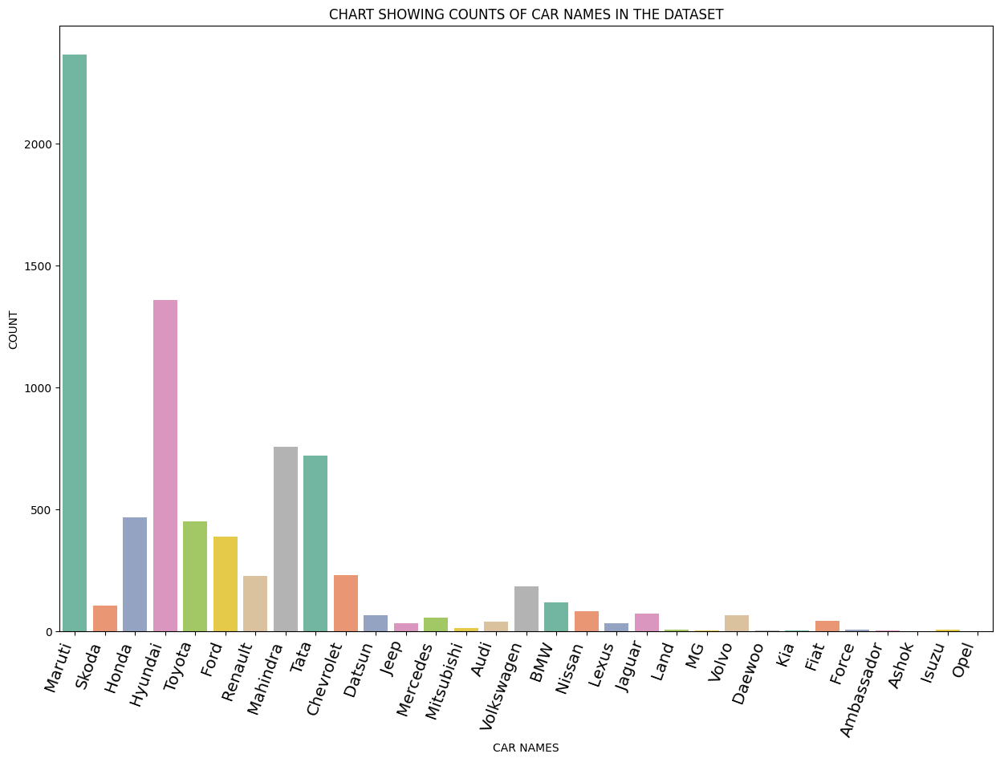

In [100]:
name_count_plot = plt.figure(figsize=(15,10), dpi = 100 )
name_count_chart = sns.countplot(data = car_df,x ="name", palette='Set2')
name_count_chart.set_xticklabels(name_count_chart.get_xticklabels(), rotation=70, horizontalalignment='right',fontweight='light', fontsize='x-large')
name_count_chart.set(xlabel='CAR NAMES', ylabel='COUNT', )
plt.title('CHART SHOWING COUNTS OF CAR NAMES IN THE DATASET')
plt.show()

In [101]:
car_df.name.unique()

array(['Maruti', 'Skoda', 'Honda', 'Hyundai', 'Toyota', 'Ford', 'Renault',
       'Mahindra', 'Tata', 'Chevrolet', 'Datsun', 'Jeep', 'Mercedes',
       'Mitsubishi', 'Audi', 'Volkswagen', 'BMW', 'Nissan', 'Lexus',
       'Jaguar', 'Land', 'MG', 'Volvo', 'Daewoo', 'Kia', 'Fiat', 'Force',
       'Ambassador', 'Ashok', 'Isuzu', 'Opel'], dtype=object)

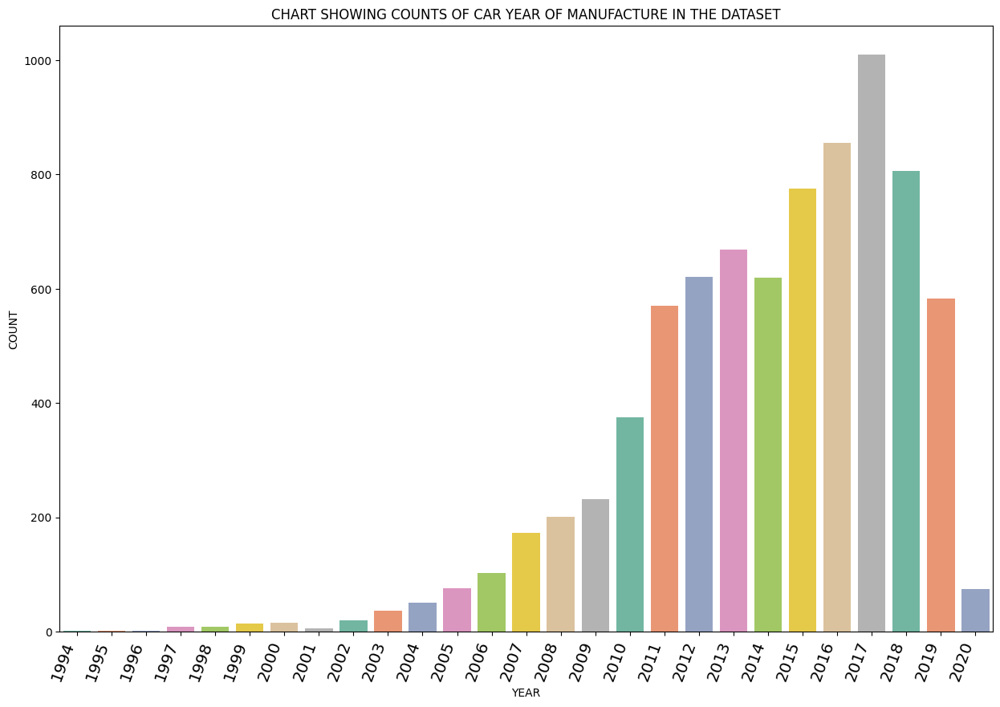

In [102]:
# Year of the car
year_count_plot = plt.figure(figsize=(15,10), dpi = 100 )
year_count_chart = sns.countplot(data = car_df,x ="year", palette='Set2')
year_count_chart.set_xticklabels(year_count_chart.get_xticklabels(), rotation=70, horizontalalignment='right',fontweight='light', fontsize='x-large')
year_count_chart.set(xlabel='YEAR', ylabel='COUNT', )
plt.title('CHART SHOWING COUNTS OF CAR YEAR OF MANUFACTURE IN THE DATASET')
plt.show()

In [103]:
car_df["selling_price_grouped"] = car_df.groupby(['name', 'selling_price'])['selling_price'].transform('mean')

In [104]:
car_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
0,1,Maruti,2014,5400,145500,East,District of Columbia,Washington,Diesel,Individual,Manual,First_Owner,23.40,1248,74.00,5,Y,190.0,2000,5400.0
1,2,Skoda,2014,4440,120000,East,New York,New York City,Diesel,Individual,Manual,Second_Owner,21.14,1498,103.52,5,Y,250.0,2000,4440.0
2,3,Honda,2006,1896,140000,Central,Illinois,Chicago,Petrol,Individual,Manual,Third_Owner,17.70,1497,78.00,5,Y,140.0,2700,1896.0
3,4,Hyundai,2010,2700,127000,Central,Illinois,Chicago,Diesel,Individual,Manual,First_Owner,23.00,1396,90.00,5,Y,140.0,2250,2700.0
4,5,Maruti,2007,1560,120000,East,New York,New York City,Petrol,Individual,Manual,First_Owner,16.10,1298,88.20,5,Y,140.0,4500,1560.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7901,8124,Hyundai,2013,3840,110000,Central,Texas,Plano,Petrol,Individual,Manual,First_Owner,18.50,1197,82.85,5,N,113.7,4000,3840.0
7902,8125,Hyundai,2007,1620,119000,Central,Texas,Port Arthur,Diesel,Individual,Manual,Fourth_Above_Owner,16.80,1493,110.00,5,N,140.0,2325,1620.0
7903,8126,Maruti,2009,4584,120000,Central,Texas,Port Arthur,Diesel,Individual,Manual,First_Owner,19.30,1248,73.90,5,N,190.0,2000,4584.0
7904,8127,Tata,2013,3480,25000,East,Massachusetts,Lunenburg,Diesel,Individual,Manual,First_Owner,23.57,1396,70.00,5,N,140.0,2400,3480.0


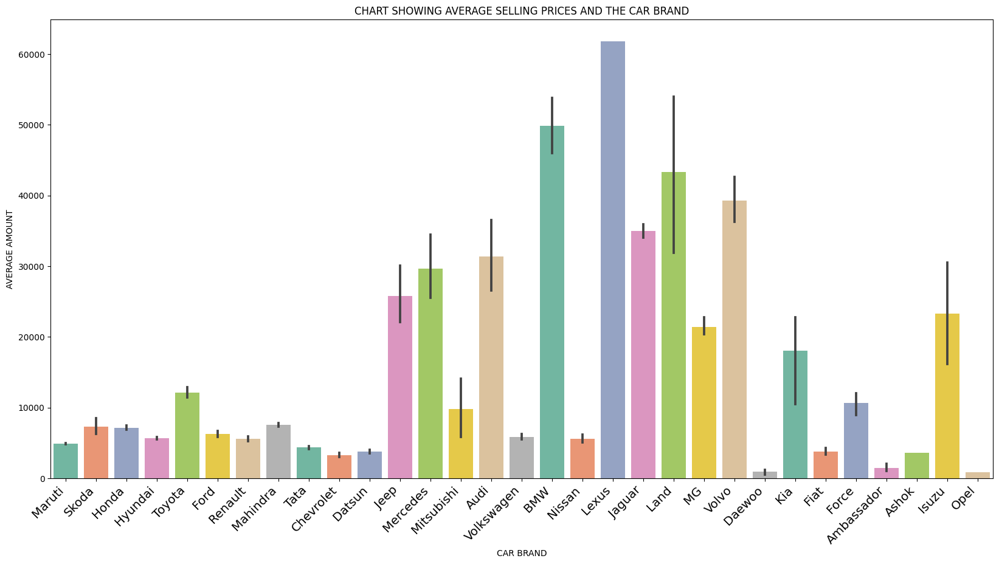

In [105]:
# Using the box plot to show age concentration in our religion dataset, spot deviations and outliers 

selling_price_gp_plot = plt.figure(figsize=(20,10), dpi = 100 )
selling_price_gp_chart = sns.barplot(data = car_df, x="name", y="selling_price_grouped", palette='Set2')
selling_price_gp_chart.set(xlabel='CAR BRAND', ylabel='AVERAGE AMOUNT')
selling_price_gp_chart.set_xticklabels(selling_price_gp_chart.get_xticklabels(), rotation=45, horizontalalignment='right',fontweight='light', fontsize='x-large')
plt.title('CHART SHOWING AVERAGE SELLING PRICES AND THE CAR BRAND')
plt.show()

### Vehicle brands exploration function

In [106]:
class make_report:
    def __init__(self, df, df_name):
        self.df = df
        self.df_name = df_name
        
    def year_report(self):
        return self.df["year"].value_counts()

    def selling_price_report(self):
        selling_price_plot= plt.figure(figsize=(20,10), dpi = 100 )
        selling_price_chart = sns.barplot(data = self.df, x="name", y="selling_price", palette='Set2')
        selling_price_chart.set(xlabel='CAR BRAND', ylabel='AVERAGE AMOUNT')
        selling_price_chart.set_xticklabels(selling_price_chart.get_xticklabels(), rotation=45, horizontalalignment='right',fontweight='light', fontsize='x-large')
        plt.title("CHART SHOWING SELLING PRICES OF ",self.df_name," BRAND")
        plt.show()
        return selling_price_plot
        
        
    

In [107]:
class make_report: 
    
    def __init__(self, df, df_car_name):
        self.df = df
        self.df_car_name = df_car_name
        
    def year_report(self):
        result = self.df["year"].value_counts()
        return print("\nYear\n:", result)

    def selling_price_report(self):
        result = (self.df).selling_price.value_counts()[0:50]
        return print("\nSelling Price:\n", result)
    
    def kilo_driven_report(self):
        result = (self.df).km_driven.value_counts()[0:50]
        return print("\nKM Driven:\n", result)
    
    def region_report(self):
        result  = (self.df).Region.value_counts()[0:50]
        return print("\nRegion report:\n", result)
    
    def city_report(self):
        result = (self.df).City.value_counts()[0:50]
        return print("\nCity:\n", result)
    
    def state_province_report(self):
        result = (self.df)["State or Province"].value_counts()[0:50]
        return print("\nState o Province:\n", result)
    
    def fuel_report(self):
        result = (self.df).fuel.value_counts()
        return print("\nFuel Type:\n", result)
    
    def seller_type_report(self):
        result = (self.df).seller_type.value_counts()
        return print("\nSeller Type:\n", result)
    
    def transmission_report(self):
        result = (self.df).transmission.value_counts()
        return print("\nTransmission:\n", result)
    
    def owner_report(self):
        result = (self.df).owner.value_counts()
        return print("\nOwner:\n", result)
    
    def sold_report(self):
        result = (self.df).sold.value_counts()
        return print("\nSold:\n", result)
    
    def sold_stats_report(self):
        sold_status = initial_view(self.df,"sold").run_all_init() 
        x_value = ["Yes", "No"]
        y_value = [sold_status[1][2][1], sold_status[1][2][0]]
        sold_status_plot = plt.figure(figsize=(15,10), dpi = 100 )
        sold_status_chart = sns.barplot(x= x_value, y= y_value, palette='Set2' )
        sold_status_chart.set_xticklabels(sold_status_chart.get_xticklabels(), rotation=0, horizontalalignment='right',fontweight='light', fontsize='x-large')
        sold_status_chart.set(xlabel='SALES', ylabel='COUNT')
        titles = ("CHART SHOWING "+self.df_car_name+" SALES RATIO").upper()
        plt.title(titles)
        for p in sold_status_chart.patches:
            height = p.get_height()
            sold_status_chart.text(p.get_x()+p.get_width()/2., height + 1, "{:1.2f}".format((height/len(self.df))*100) + "%", ha="center")  
        plt.show()
        return sold_status_plot
           
    def main_prog(self):
        self.year_report()
        self.selling_price_report()
        self.kilo_driven_report()
        self.region_report()
        self.city_report()
        self.state_province_report()
        self.fuel_report()
        self.seller_type_report()
        self.transmission_report()
        self.owner_report()
        self.sold_report()
        if (self.df).name.unique() not in ["Ambassador", "Isuzu", "Opel", "Ashok"]:
            self.sold_stats_report()
        
    
    

In [108]:
# Check sheet
car_df[lambda x: x.sold == "Y"].fuel.value_counts()

Diesel    1052
Petrol     935
CNG          7
LPG          6
Name: fuel, dtype: int64

#### Murati

In [109]:
murati_df = car_df[lambda x:x["name"] =="Maruti"]
murati_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
0,1,Maruti,2014,5400,145500,East,District of Columbia,Washington,Diesel,Individual,Manual,First_Owner,23.40,1248,74.00,5,Y,190.0,2000,5400.0
4,5,Maruti,2007,1560,120000,East,New York,New York City,Petrol,Individual,Manual,First_Owner,16.10,1298,88.20,5,Y,140.0,4500,1560.0
6,7,Maruti,2007,1152,175000,West,California,Los Angeles,LPG,Individual,Manual,First_Owner,17.30,1061,57.50,5,Y,140.0,4500,1152.0
7,8,Maruti,2001,540,5000,West,California,Los Angeles,Petrol,Individual,Manual,Second_Owner,16.10,796,37.00,4,Y,59.0,2500,540.0
11,12,Maruti,2005,1104,100000,Central,Texas,Houston,Petrol,Individual,Manual,Second_Owner,17.30,993,60.00,5,Y,78.0,4500,1104.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7894,8117,Maruti,2017,4080,45000,South,North Carolina,Mooresville,Petrol,Individual,Manual,First_Owner,23.95,998,67.10,5,N,90.0,3500,4080.0
7895,8118,Maruti,2015,7500,50000,South,North Carolina,Monroe,Diesel,Individual,Manual,First_Owner,26.59,1248,74.00,5,N,190.0,2000,7500.0
7897,8120,Maruti,2017,4320,80000,South,North Carolina,Monroe,Petrol,Individual,Manual,First_Owner,20.51,998,67.04,5,N,90.0,3500,4320.0
7899,8122,Maruti,2013,3120,50000,Central,Texas,Plano,Petrol,Individual,Manual,Second_Owner,18.90,998,67.10,5,N,90.0,3500,3120.0



Year
: 2017    293
2018    274
2016    244
2015    214
2013    191
2014    170
2012    158
2019    142
2011    123
2010    119
2009     91
2007     63
2008     61
2006     43
2005     36
2020     33
2004     28
2003     22
2002     15
1999     11
2000     10
1997      9
1998      8
2001      5
1996      2
1994      1
1995      1
Name: year, dtype: int64

Selling Price:
 7200    86
7800    85
3600    64
4200    61
4800    48
3000    46
6600    44
2700    42
8400    42
1800    40
6000    39
2400    39
5400    37
9000    36
8880    35
1440    34
2640    31
3240    26
3840    26
9600    25
2880    24
1920    24
3720    23
3120    22
1200    22
1560    20
2160    19
2040    18
7500    18
4560    17
5640    17
5040    16
840     16
3300    16
3960    16
2280    15
1320    15
7320    15
5160    15
4680    15
6300    15
4919    15
4440    15
1500    15
8100    15
5519    15
4500    15
780     15
540     14
3900    14
Name: selling_price, dtype: int64

KM Driven:
 70000     171
50000     136
6

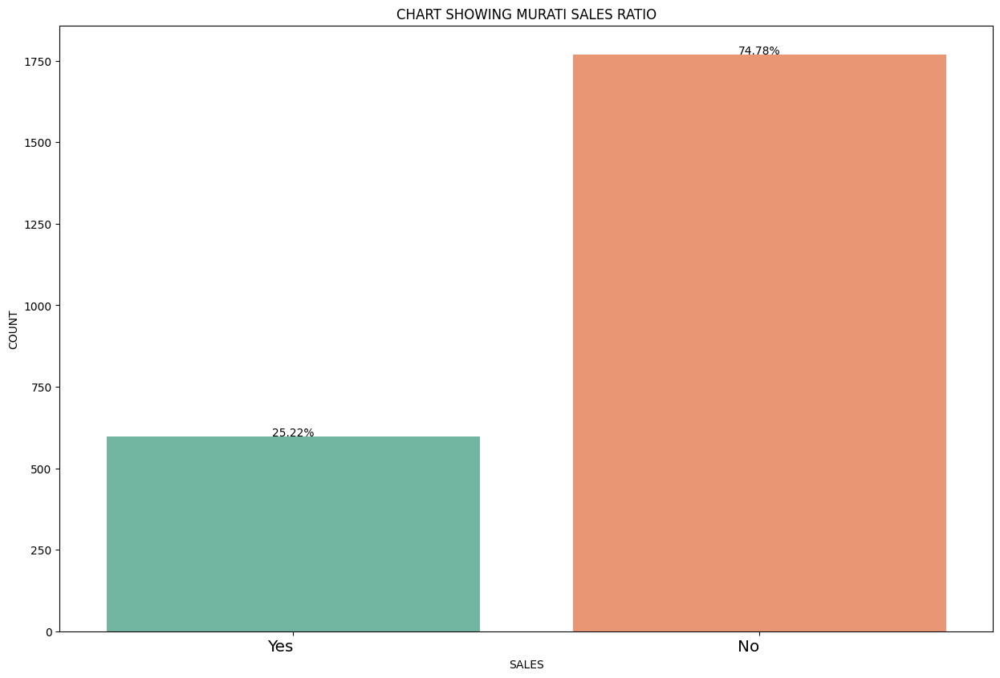

In [110]:
# Exploring the vehicles with name murati
murati_data = make_report(murati_df,"Murati").main_prog()
murati_data

Unique Value:
 ['Y' 'N'] 

 Mode Value:
 0    N
Name: sold, dtype: object 

 Count of Unique Values:
 N    1770
Y     597
Name: sold, dtype: int64 

 Description of the Series:
 count     2367
unique       2
top          N
freq      1770
Name: sold, dtype: object 

 Sum of null rows:
 0 




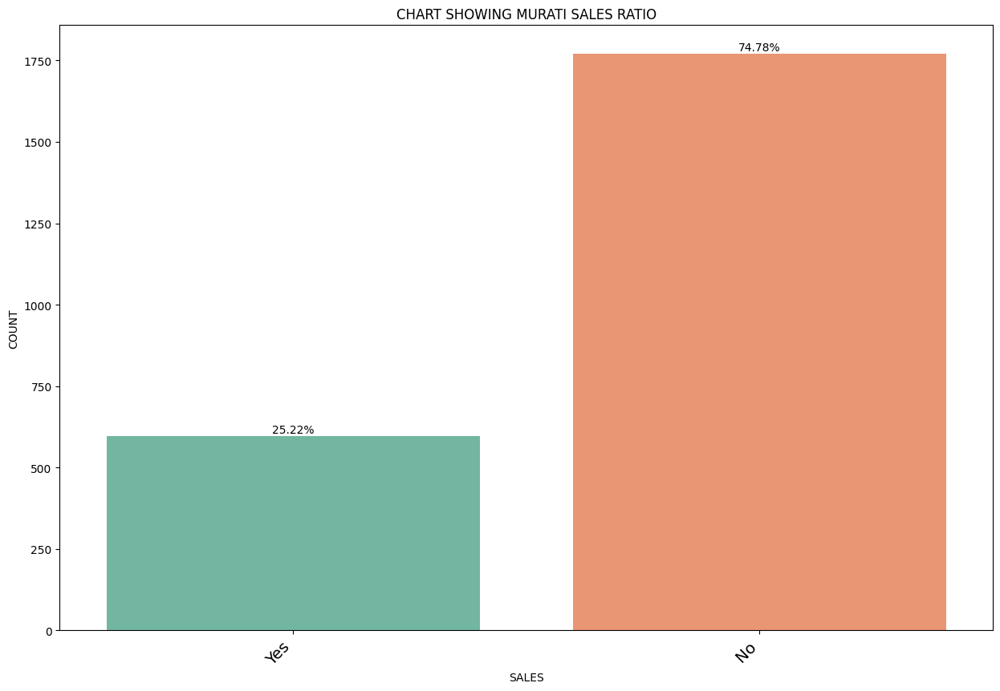

In [111]:
murati_sold = initial_view(murati_df,"sold").run_all_init()  
murati_sold[1][2]
murati_x = ["Yes", "No"]
murati_y = [murati_sold[1][2][1], murati_sold[1][2][0]]
murati_sold_plot = plt.figure(figsize=(15,10), dpi = 100 )
murati_sold_chart = sns.barplot(x=murati_x, y=murati_y, palette='Set2' )
murati_sold_chart.set_xticklabels(murati_sold_chart.get_xticklabels(), rotation=45, horizontalalignment='right',fontweight='light', fontsize='x-large')
murati_sold_chart.set(xlabel='SALES', ylabel='COUNT')
plt.title('CHART SHOWING MURATI SALES RATIO')
for p in murati_sold_chart.patches:
    height = p.get_height()
    murati_sold_chart.text(p.get_x()+p.get_width()/2., height + 10, "{:1.2f}".format((height/len(murati_df))*100) + "%", ha="center")

plt.show()

In [112]:
murati_sold[1][2][0]

1770

In [113]:
murati_df.selling_price.value_counts()[0:30]

7200    86
7800    85
3600    64
4200    61
4800    48
3000    46
6600    44
2700    42
8400    42
1800    40
6000    39
2400    39
5400    37
9000    36
8880    35
1440    34
2640    31
3240    26
3840    26
9600    25
2880    24
1920    24
3720    23
3120    22
1200    22
1560    20
2160    19
2040    18
7500    18
4560    17
Name: selling_price, dtype: int64

#### Skoda

In [114]:
# Exploring vehicle brand skoda
skoda_df = car_df[lambda x:x["name"] =="Skoda"]
skoda_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
1,2,Skoda,2014,4440,120000,East,New York,New York City,Diesel,Individual,Manual,Second_Owner,21.14,1498,103.52,5,Y,250.0,2000,4440.0
134,141,Skoda,2018,22379,50000,West,California,San Diego,Petrol,Dealer,Automatic,First_Owner,14.67,1798,177.46,5,Y,250.0,3125,22379.0
149,156,Skoda,2016,7740,11000,East,Massachusetts,Boston,Petrol,Dealer,Automatic,First_Owner,14.30,1598,103.50,5,Y,153.0,3800,7740.0
374,388,Skoda,2016,7740,11000,Central,Michigan,Detroit,Petrol,Dealer,Automatic,First_Owner,14.30,1598,103.50,5,Y,153.0,3800,7740.0
412,427,Skoda,2016,7740,11000,West,California,Los Angeles,Petrol,Dealer,Automatic,First_Owner,14.30,1598,103.50,5,Y,153.0,3800,7740.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7413,7628,Skoda,2007,3300,200000,East,New Jersey,Livingston,Diesel,Individual,Manual,Second_Owner,16.60,1896,122.40,5,N,140.0,1900,3300.0
7450,7666,Skoda,2013,4740,35000,Central,Michigan,Warren,Petrol,Individual,Automatic,Second_Owner,14.30,1598,103.50,5,N,153.0,3800,4740.0
7587,7805,Skoda,2011,4932,64481,South,Mississippi,Meridian,Diesel,Dealer,Manual,Second_Owner,20.50,1598,103.50,5,N,250.0,2000,4932.0
7657,7876,Skoda,2016,7740,11000,South,Mississippi,Olive Branch,Petrol,Dealer,Automatic,First_Owner,14.30,1598,103.50,5,N,153.0,3800,7740.0



Year
: 2016    37
2012    11
2013    10
2011     8
2018     6
2007     6
2017     5
2014     4
2015     4
2019     3
2008     3
2010     2
2006     2
2005     2
2003     1
Name: year, dtype: int64

Selling Price:
 7740     30
3000      6
4740      3
3600      3
10800     3
7800      3
1200      2
22379     2
6000      2
3540      2
7200      2
2520      2
8100      2
4560      2
10320     1
39012     1
5700      1
7920      1
1320      1
3240      1
5100      1
4440      1
7680      1
11400     1
10200     1
4080      1
3900      1
4260      1
2340      1
4620      1
3300      1
4932      1
9000      1
2280      1
3840      1
5460      1
4919      1
4800      1
31200     1
8700      1
4500      1
2640      1
10020     1
2388      1
1680      1
2759      1
13200     1
3480      1
3360      1
19200     1
Name: selling_price, dtype: int64

KM Driven:
 11000     31
120000     8
100000     5
35000      5
50000      4
90000      3
140000     3
150000     3
40000      3
110000     2
60000   

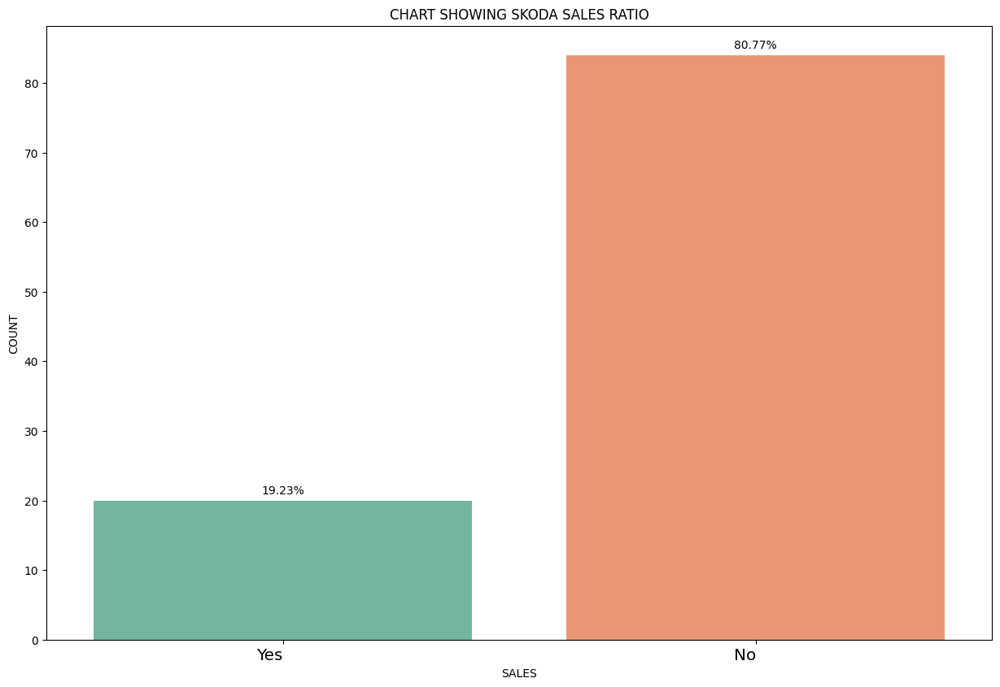

In [115]:
# Exploring the vehicles with name murati
skoda_data = make_report(skoda_df, "Skoda").main_prog()
skoda_data

Unique Value:
 ['Y' 'N'] 

 Mode Value:
 0    N
Name: sold, dtype: object 

 Count of Unique Values:
 N    84
Y    20
Name: sold, dtype: int64 

 Description of the Series:
 count     104
unique      2
top         N
freq       84
Name: sold, dtype: object 

 Sum of null rows:
 0 




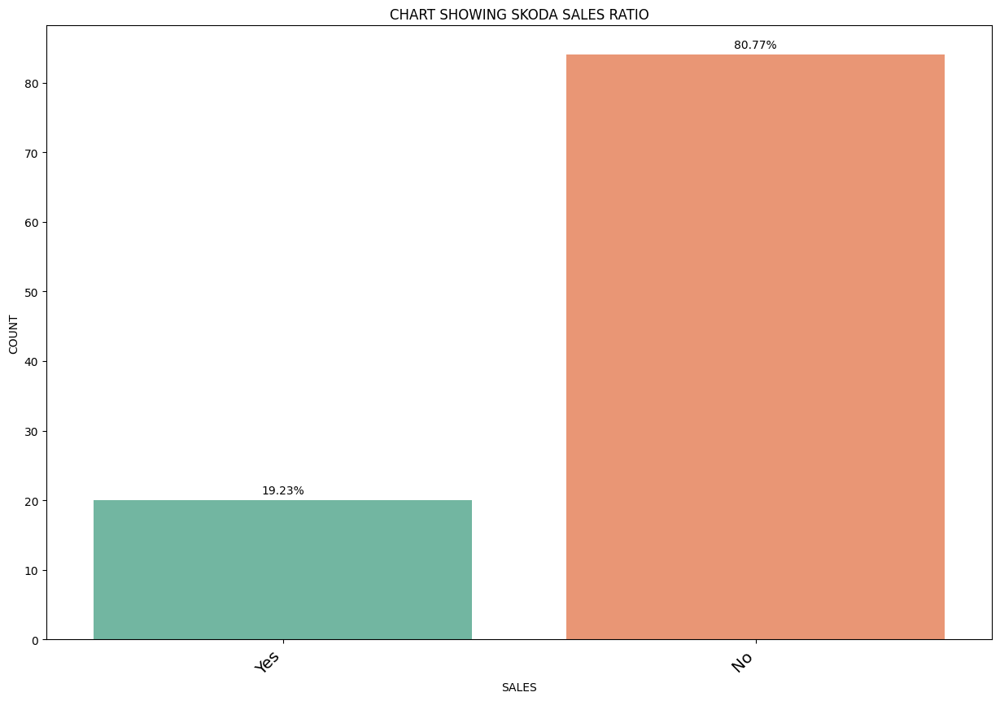

In [116]:
skoda_sold = initial_view(skoda_df,"sold").run_all_init()  
skoda_sold[1][2]
skoda_x = ["Yes", "No"]
skoda_y = [skoda_sold[1][2][1], skoda_sold[1][2][0]]
skoda_sold_plot = plt.figure(figsize=(15,10), dpi = 100 )
skoda_sold_chart = sns.barplot(x=skoda_x, y=skoda_y, palette='Set2' )
skoda_sold_chart.set_xticklabels(skoda_sold_chart.get_xticklabels(), rotation=45, horizontalalignment='right',fontweight='light', fontsize='x-large')
skoda_sold_chart.set(xlabel='SALES', ylabel='COUNT')
plt.title('CHART SHOWING SKODA SALES RATIO')
for p in skoda_sold_chart.patches:
    height = p.get_height()
    skoda_sold_chart.text(p.get_x()+p.get_width()/2., height + 1, "{:1.2f}".format((height/len(skoda_df))*100) + "%", ha="center")

plt.show()

### Honda

In [117]:
honda_df = car_df[lambda x:x["name"] =="Honda"]
honda_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
2,3,Honda,2006,1896,140000,Central,Illinois,Chicago,Petrol,Individual,Manual,Third_Owner,17.7,1497,78.00,5,Y,140.0,2700,1896.0
20,22,Honda,2017,11400,50000,East,New York,New York City,Diesel,Individual,Manual,First_Owner,25.5,1498,98.60,5,Y,200.0,1750,11400.0
40,43,Honda,2018,11100,28900,East,New York,New York City,Petrol,Dealer,Manual,First_Owner,17.8,1497,117.30,5,Y,145.0,4600,11100.0
41,44,Honda,2013,5100,86300,East,New York,New York City,Petrol,Dealer,Manual,First_Owner,16.8,1497,116.30,5,Y,146.0,4800,5100.0
48,51,Honda,2015,5100,49800,East,New York,New York City,Diesel,Dealer,Manual,First_Owner,24.7,1498,98.63,5,Y,200.0,1750,5100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7844,8065,Honda,2015,7200,28161,West,Washington,Seatac,Petrol,Dealer,Manual,First_Owner,17.8,1497,117.30,5,N,145.0,4600,7200.0
7849,8071,Honda,2015,4919,60000,West,New Mexico,Alamogordo,Diesel,Individual,Manual,First_Owner,25.8,1498,98.60,5,N,200.0,1750,4919.0
7860,8082,Honda,2005,1320,100000,West,Wyoming,Casper,Petrol,Individual,Automatic,Second_Owner,12.0,1493,100.00,5,N,140.0,4600,1320.0
7882,8105,Honda,2006,1920,70000,West,California,Laguna Hills,Petrol,Individual,Manual,Second_Owner,16.9,1497,100.00,5,N,140.0,4800,1920.0



Year
: 2016    76
2017    69
2015    63
2019    58
2014    37
2018    29
2013    23
2012    18
2006    16
2008    15
2009    12
2011    12
2010    12
2007    11
2005     6
2004     6
2020     2
2002     1
Name: year, dtype: int64

Selling Price:
 6600     38
9348     31
7200     18
6000     16
7800     14
8400     14
5400     12
4200     11
9000      9
3900      8
8040      7
11400     7
3000      7
8100      7
11100     6
10200     6
9600      6
7500      5
1800      5
8700      5
6720      5
8280      5
10800     5
5100      5
6300      4
6960      4
4800      4
3600      4
12000     4
5580      4
6900      4
5819      4
4020      4
5700      4
5760      4
10320     4
2400      4
4500      3
3720      3
10080     3
7560      3
2640      3
8160      3
2759      3
7620      3
13200     3
9839      3
3480      3
6480      2
2376      2
Name: selling_price, dtype: int64

KM Driven:
 56494     32
7032      31
120000    28
50000     23
110000    19
100000    19
30000     18
80000     18
4

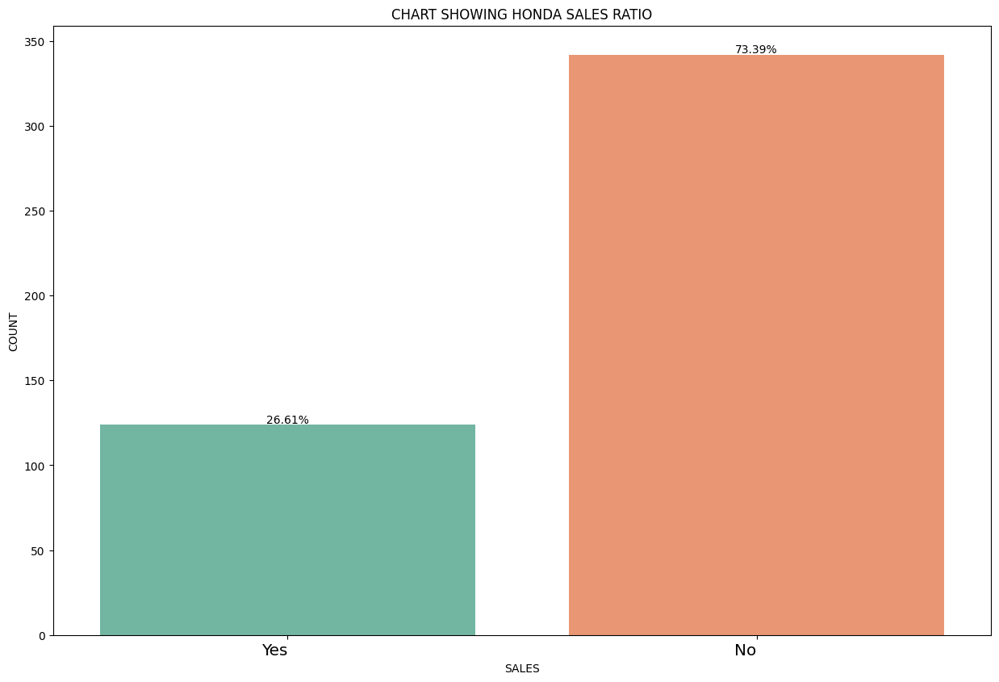

In [118]:
# Exploring the vehicles with name murati
honda_data = make_report(honda_df, "Honda").main_prog()
honda_data

### Hyundai

In [119]:
hyundai_df = car_df[lambda x:x["name"] =="Hyundai"]
hyundai_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
3,4,Hyundai,2010,2700,127000,Central,Illinois,Chicago,Diesel,Individual,Manual,First_Owner,23.00,1396,90.00,5,Y,140.00,2250,2700.0
5,6,Hyundai,2017,5280,45000,East,New York,New York City,Petrol,Individual,Manual,First_Owner,20.14,1197,81.86,5,Y,113.75,4000,5280.0
16,18,Hyundai,2012,6000,53000,Central,Texas,Dallas,Diesel,Individual,Manual,Second_Owner,23.00,1396,90.00,5,Y,140.00,2250,6000.0
18,20,Hyundai,2016,8160,100000,East,New York,New York City,Diesel,Individual,Manual,First_Owner,22.54,1396,88.73,5,Y,219.70,2125,8160.0
31,34,Hyundai,2018,8760,2388,West,Washington,Seattle,Petrol,Individual,Manual,First_Owner,18.60,1197,81.83,5,Y,114.70,4000,8760.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7896,8119,Hyundai,2013,4560,25000,South,North Carolina,Mooresville,Petrol,Individual,Manual,First_Owner,18.50,1197,82.85,5,N,113.70,4000,4560.0
7898,8121,Hyundai,2008,1440,191000,South,North Carolina,Mooresville,Petrol,Individual,Manual,First_Owner,17.92,1086,62.10,5,N,96.10,3000,1440.0
7900,8123,Hyundai,2014,5700,80000,Central,Texas,Plano,Diesel,Individual,Manual,Second_Owner,22.54,1396,88.73,5,N,219.70,2125,5700.0
7901,8124,Hyundai,2013,3840,110000,Central,Texas,Plano,Petrol,Individual,Manual,First_Owner,18.50,1197,82.85,5,N,113.70,4000,3840.0



Year
: 2017    195
2015    150
2016    145
2018    132
2014    131
2012    112
2013    110
2011     91
2019     82
2010     66
2008     43
2009     37
2007     24
2005     11
2006     11
2020     10
2003      5
2004      4
2002      1
Name: year, dtype: int64

Selling Price:
 5400     63
6000     42
6600     40
4200     40
3600     34
8400     33
7200     32
4800     30
7800     29
3000     27
2400     23
2160     21
2640     20
1800     18
4560     17
3840     17
9600     16
6300     16
10200    15
9000     14
3240     14
5100     14
2040     13
3360     13
6840     12
3300     12
4320     12
6900     12
2700     12
1440     11
4080     11
4500     11
2520     11
12000    10
5040     10
5760     10
3480     10
12600    10
7080      9
6960      9
2580      9
5700      9
13200     9
2280      9
5640      9
7320      9
1320      9
1980      9
3960      9
1920      8
Name: selling_price, dtype: int64

KM Driven:
 80000     97
60000     83
70000     82
40000     68
50000     65
120000    

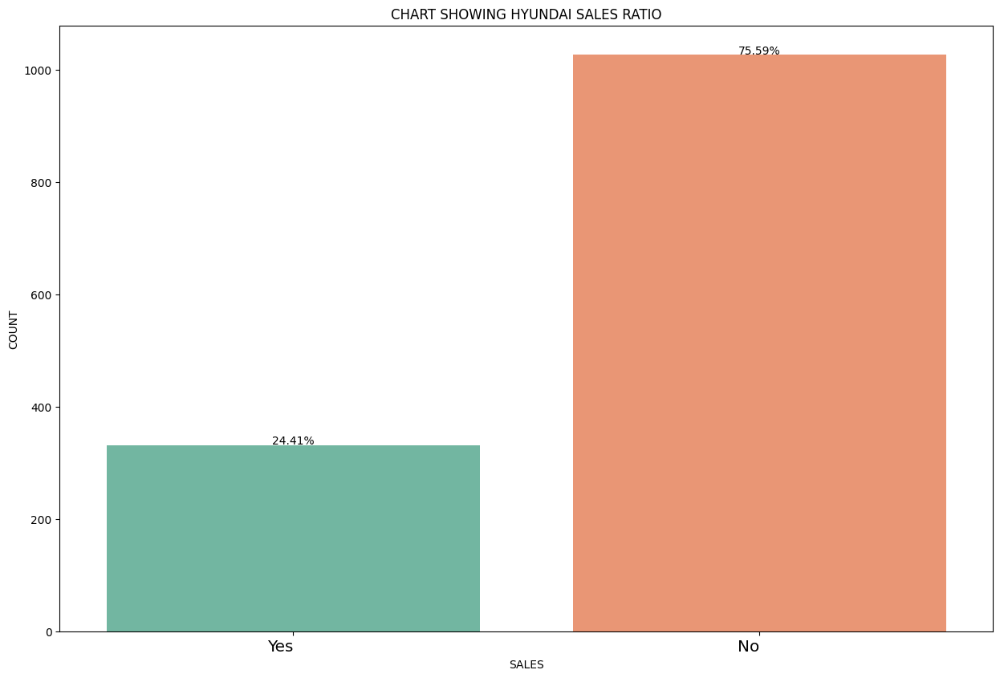

In [120]:
# Exploring the vehicles with name murati
hyundai_data = make_report(hyundai_df, "Hyundai").main_prog()
hyundai_data

### Toyota

In [121]:
toyota_df = car_df[lambda x:x["name"] =="Toyota"]
toyota_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
8,9,Toyota,2011,4200,90000,West,California,Los Angeles,Diesel,Individual,Manual,First_Owner,23.59,1364,67.10,5,Y,170.0,2100,4200.0
45,48,Toyota,2014,18000,77000,West,Washington,Seattle,Diesel,Dealer,Manual,First_Owner,12.55,2982,168.50,7,Y,343.0,2400,18000.0
46,49,Toyota,2013,8400,99000,East,New York,New York City,Diesel,Dealer,Manual,First_Owner,12.99,2494,100.00,7,Y,200.0,2400,8400.0
53,56,Toyota,2016,19800,127700,East,Massachusetts,Boston,Diesel,Dealer,Automatic,Second_Owner,11.36,2755,171.50,7,Y,360.0,2300,19800.0
54,57,Toyota,2016,11400,99000,South,Georgia,Atlanta,Diesel,Dealer,Manual,First_Owner,12.99,2494,100.60,7,Y,200.0,2400,11400.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7755,7974,Toyota,2015,16800,170000,East,Ohio,Columbus,Diesel,Individual,Manual,First_Owner,12.99,2494,100.60,7,N,200.0,2400,16800.0
7850,8072,Toyota,2010,5100,200000,West,New Mexico,Alamogordo,Diesel,Individual,Manual,Second_Owner,12.80,2494,102.00,7,N,140.0,2400,5100.0
7856,8078,Toyota,2009,6600,250000,West,New Mexico,Alamogordo,Diesel,Individual,Manual,First_Owner,12.80,2494,102.00,7,N,140.0,2400,6600.0
7889,8112,Toyota,2014,5100,50000,South,North Carolina,New Bern,Diesel,Individual,Manual,First_Owner,23.59,1364,67.06,5,N,170.0,2100,5100.0



Year
: 2016    66
2013    64
2015    52
2017    51
2014    37
2011    33
2012    32
2018    32
2010    24
2009    11
2007    10
2008    10
2006     8
2019     6
2005     6
2020     5
2004     3
2003     1
2002     1
Name: year, dtype: int64

Selling Price:
 9000     43
24000    37
7500     32
9600     12
6600     12
8400      9
12600     9
10800     9
3600      9
5400      8
12000     7
7800      7
4200      7
7200      6
18000     6
5100      6
13200     6
19800     6
4800      6
16800     5
21600     5
11400     5
8760      5
6000      5
38400     5
21000     4
14400     4
4919      4
22200     4
10200     4
17400     3
6300      3
16560     3
9360      3
10920     3
1800      3
23100     3
6840      3
22800     3
5760      3
20400     3
37200     2
3900      2
34800     2
12960     2
3720      2
10439     2
4440      2
9960      2
10739     2
Name: selling_price, dtype: int64

KM Driven:
 120000    38
68089     32
79328     31
25538     29
90000     17
80000     16
100000    15
600

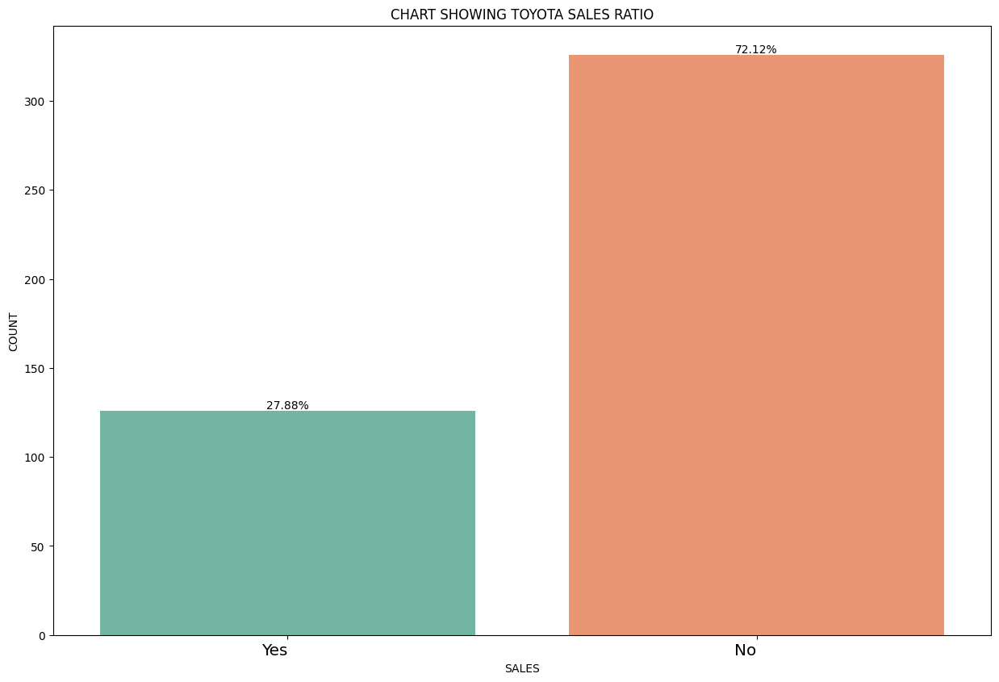

In [122]:
# Exploring the vehicles with name murati
toyota_data = make_report(toyota_df, "Toyota").main_prog()
toyota_data

### Ford

In [123]:
ford_df = car_df[lambda x:x["name"] =="Ford"]
ford_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
9,10,Ford,2013,2400,169000,Central,Texas,Houston,Diesel,Individual,Manual,First_Owner,20.00,1399,68.10,5,Y,160.0,2000,2400.0
63,66,Ford,2017,7200,25000,East,District of Columbia,Washington,Petrol,Individual,Manual,Third_Owner,18.16,1196,86.80,5,Y,112.0,4000,7200.0
78,82,Ford,2015,7320,90000,Central,Illinois,Chicago,Diesel,Individual,Manual,First_Owner,22.77,1498,98.59,5,Y,205.0,2500,7320.0
102,107,Ford,2020,4800,5000,Central,Texas,Houston,Petrol,Individual,Manual,Second_Owner,19.00,1194,94.68,5,Y,120.0,4250,4800.0
117,123,Ford,2017,10200,76139,East,New York,New York City,Diesel,Individual,Manual,First_Owner,23.00,1498,98.96,5,Y,205.0,2500,10200.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7861,8083,Ford,2007,1500,110000,West,Washington,Yakima,Diesel,Individual,Manual,Third_Owner,17.80,1399,68.00,5,N,140.0,2000,1500.0
7874,8096,Ford,2012,3120,194000,West,California,Visalia,Diesel,Individual,Manual,First_Owner,20.00,1399,68.00,5,N,160.0,2000,3120.0
7876,8098,Ford,2018,10560,65000,Central,Indiana,East Chicago,Diesel,Individual,Manual,First_Owner,23.00,1498,98.96,5,N,205.0,2500,10560.0
7887,8110,Ford,2018,9000,24000,West,California,Laguna Hills,Diesel,Individual,Manual,First_Owner,24.40,1498,98.63,5,N,215.0,2375,9000.0



Year
: 2018    54
2011    48
2017    45
2015    43
2012    39
2016    32
2013    27
2019    24
2010    23
2014    21
2009     9
2008     7
2007     4
2006     3
2003     3
2005     3
2004     2
2020     1
Name: year, dtype: int64

Selling Price:
 8400     14
3600     13
6000     13
3000     13
11400    12
6600     12
7200     11
2400     11
4200      8
7800      8
2700      8
10200     7
2160      7
4800      7
10800     7
3900      7
2759      6
7440      6
1800      5
6840      5
2640      5
9600      5
2280      5
1920      5
8700      5
6360      4
2880      4
5760      4
2520      4
8100      4
9000      4
11700     3
11100     3
8160      3
6180      3
3840      3
7188      3
5700      3
5519      3
3120      3
3360      3
8280      3
2459      3
4440      3
5400      3
2040      3
1680      3
2100      3
7320      2
1440      2
Name: selling_price, dtype: int64

KM Driven:
 70000     23
80000     22
60000     22
110000    17
90000     17
30000     17
40000     15
120000    15
1

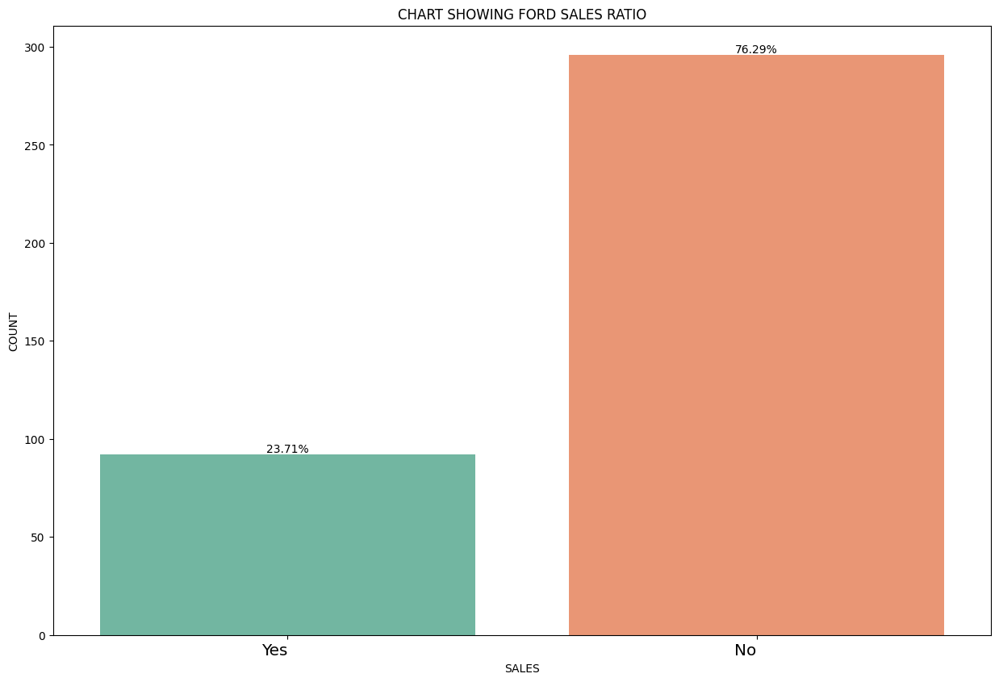

In [124]:
# Exploring the vehicles with name murati
ford_data = make_report(ford_df, "Ford").main_prog()
ford_data

### Renault

In [125]:
renault_df = car_df[lambda x:x["name"] =="Renault"]
renault_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
10,11,Renault,2014,6000,68000,East,New York,New York City,Diesel,Individual,Manual,Second_Owner,19.01,1461,108.45,5,Y,248.0,2250,6000.0
119,125,Renault,2018,4200,25000,East,Massachusetts,Boston,Petrol,Individual,Manual,First_Owner,23.01,999,67.00,5,Y,91.0,4250,4200.0
213,222,Renault,2018,4020,30000,South,Georgia,Atlanta,Petrol,Individual,Manual,First_Owner,25.17,799,53.30,5,Y,72.0,4386,4020.0
228,238,Renault,2016,3240,44000,East,District of Columbia,Washington,Petrol,Individual,Manual,First_Owner,25.17,799,53.30,5,Y,72.0,4386,3240.0
305,318,Renault,2016,2759,40000,East,District of Columbia,Washington,Petrol,Individual,Manual,First_Owner,25.17,799,53.30,5,Y,72.0,4386,2759.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7783,8003,Renault,2016,7440,7000,South,Tennessee,Greeneville,Diesel,Dealer,Manual,First_Owner,21.04,1461,83.80,8,N,200.0,1900,7440.0
7784,8004,Renault,2011,7200,43000,East,New York,Glen Cove,Petrol,Dealer,Automatic,First_Owner,13.40,1997,135.10,5,N,190.0,3700,7200.0
7814,8035,Renault,2015,7200,160000,East,Maine,Auburn,Diesel,Individual,Manual,First_Owner,19.01,1461,108.45,5,N,248.0,2250,7200.0
7825,8046,Renault,2017,9000,20171,East,Ohio,Lancaster,Diesel,Dealer,Automatic,First_Owner,19.87,1461,108.50,5,N,245.0,1750,9000.0



Year
: 2016    46
2017    40
2018    37
2019    22
2013    22
2012    21
2015    21
2014    18
2011     1
Name: year, dtype: int64

Selling Price:
 3600     16
4200     13
7200     12
4800      9
3480      8
7800      7
6000      7
6600      6
4680      5
3900      5
3780      5
5400      5
3000      5
2640      4
3840      4
3120      4
10800     4
3720      3
7440      3
4320      3
10560     3
4740      3
3960      3
3180      3
12600     3
3240      3
8340      3
6240      3
4080      3
6420      3
2940      2
9000      2
2880      2
12000     2
3300      2
5100      2
8280      2
4560      2
8400      2
5819      2
15180     2
4919      2
4020      2
5760      2
6960      2
8100      2
4500      2
6840      2
5700      1
4980      1
Name: selling_price, dtype: int64

KM Driven:
 30000     17
50000     14
120000    12
25000     11
60000     11
80000     10
100000     9
90000      9
35000      8
20000      8
40000      7
5000       7
10000      5
15000      5
65000      4
110000   

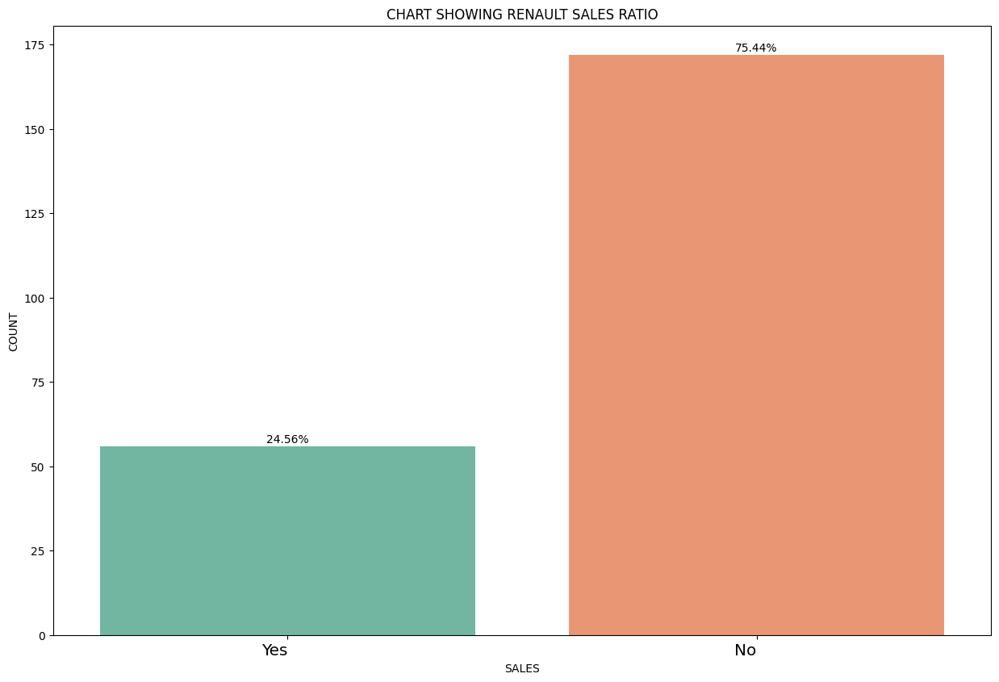

In [126]:
# Exploring the vehicles with name murati
renault_data = make_report(renault_df, "Renault").main_prog()
renault_data

### Mahindra

In [127]:
mahindra_df = car_df[lambda x:x["name"] =="Mahindra"]
mahindra_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
14,16,Mahindra,2016,4800,40000,East,Massachusetts,Boston,Petrol,Individual,Manual,First_Owner,18.15,1198,82.0,5,Y,115.0,3550,4800.0
19,21,Mahindra,2011,2088,100000,East,New York,New York City,Diesel,Individual,Manual,Second_Owner,21.00,1461,64.1,5,Y,160.0,2000,2088.0
101,106,Mahindra,2014,7500,70000,East,Pennsylvania,Philadelphia,Diesel,Individual,Automatic,Second_Owner,11.79,2179,120.0,8,Y,290.0,2300,7500.0
106,111,Mahindra,2019,20400,32000,East,New York,New York City,Diesel,Individual,Manual,First_Owner,15.10,2179,155.0,7,Y,360.0,2275,20400.0
182,189,Mahindra,2016,5400,15000,West,California,Los Angeles,Petrol,Individual,Manual,Second_Owner,18.15,1198,82.0,6,Y,115.0,3550,5400.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7726,7945,Mahindra,2016,4200,100000,South,Virginia,Danville,Petrol,Individual,Manual,Second_Owner,18.15,1198,82.0,5,N,115.0,3550,4200.0
7748,7967,Mahindra,2017,8820,70000,West,Nevada,Reno,Diesel,Individual,Manual,First_Owner,18.49,1493,100.0,7,N,240.0,2200,8820.0
7802,8023,Mahindra,2014,7200,70000,East,Ohio,Mentor,Diesel,Individual,Manual,First_Owner,15.96,2523,62.1,7,N,195.0,1800,7200.0
7847,8068,Mahindra,2011,4320,100000,West,New Mexico,Alamogordo,Diesel,Individual,Manual,Fourth_Above_Owner,13.50,2179,115.0,5,N,277.5,1950,4320.0



Year
: 2016    92
2014    90
2015    88
2017    76
2013    72
2012    68
2011    68
2018    63
2019    42
2010    24
2009    18
2008    16
2007    16
2006     8
2020     5
2003     5
2005     5
2004     2
Name: year, dtype: int64

Selling Price:
 4800     29
6600     29
5400     28
7200     28
9000     26
8400     23
6000     22
7800     21
3000     18
9600     18
11400    15
10200    15
3600     14
4200     14
12000    13
10800    12
13200    11
7920      9
12600     9
3840      9
2400      9
5340      8
6119      8
14400     8
5160      8
18000     7
2759      6
6300      6
16200     6
4560      5
5700      5
4440      5
8520      5
2160      5
7500      5
8160      5
1800      5
8640      5
3720      5
4500      5
5760      5
3900      5
6360      5
15600     5
10680     4
7440      4
6480      4
9300      4
4320      4
5040      4
Name: selling_price, dtype: int64

KM Driven:
 120000    100
70000      50
110000     45
80000      43
100000     42
60000      38
50000      36
90000  

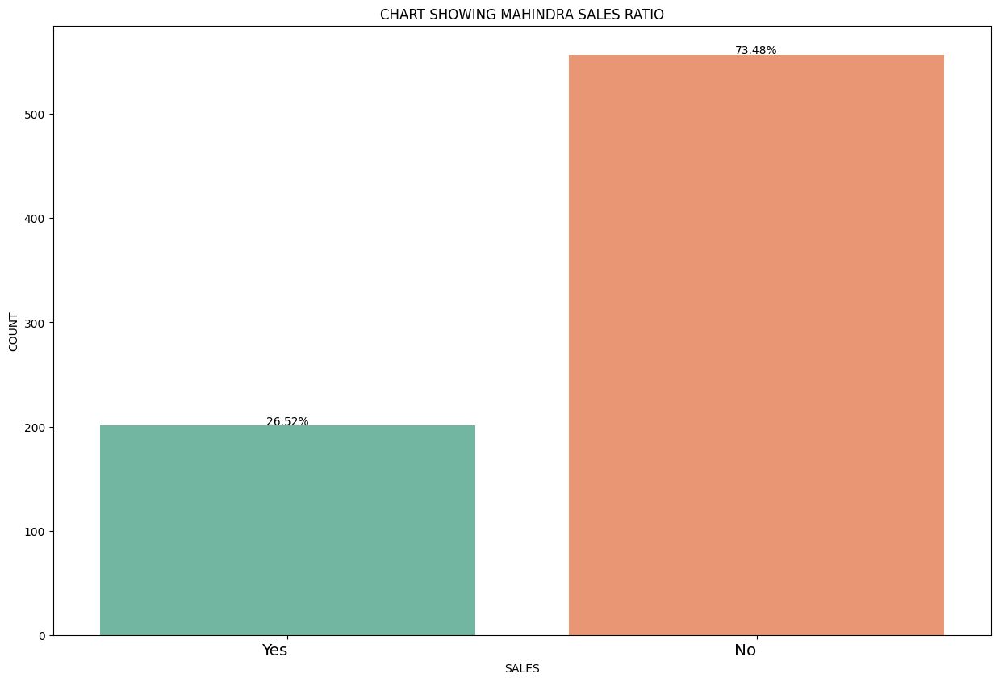

In [128]:
# Exploring the vehicles with name murati
mahindra_data = make_report(mahindra_df, "Mahindra").main_prog()
mahindra_data

### Tata

In [129]:
tata_df = car_df[lambda x:x["name"] =="Tata"]
tata_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
23,25,Tata,2018,6000,35000,East,New York,New York City,Petrol,Individual,Manual,First_Owner,20.30,1199,83.81,5,Y,114.0,3500,6000.0
37,40,Tata,2011,5100,60000,South,North Carolina,Charlotte,Diesel,Individual,Manual,Second_Owner,13.93,2179,138.03,7,Y,320.0,2200,5100.0
59,62,Tata,2011,3180,120000,East,Pennsylvania,Philadelphia,Diesel,Individual,Manual,First_Owner,21.12,1248,88.80,5,Y,200.0,2375,3180.0
97,102,Tata,2010,2400,100000,East,District of Columbia,Washington,Diesel,Individual,Manual,Second_Owner,18.80,1248,90.00,5,Y,200.0,2375,2400.0
105,110,Tata,2010,3600,48000,Central,Illinois,Chicago,Petrol,Individual,Manual,First_Owner,15.80,1172,65.00,5,Y,96.0,3000,3600.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7868,8090,Tata,2011,552,25000,West,Washington,Yakima,Petrol,Individual,Manual,Second_Owner,26.00,624,35.00,4,N,140.0,3000,552.0
7873,8095,Tata,2012,2400,80868,West,California,Visalia,Petrol,Individual,Manual,Third_Owner,13.70,1368,88.80,5,N,116.0,4750,2400.0
7879,8101,Tata,2018,9600,85000,Central,Indiana,Elkhart,Diesel,Individual,Manual,Second_Owner,21.50,1497,108.50,5,N,260.0,2125,9600.0
7904,8127,Tata,2013,3480,25000,East,Massachusetts,Lunenburg,Diesel,Individual,Manual,First_Owner,23.57,1396,70.00,5,N,140.0,2400,3480.0



Year
: 2017    88
2012    83
2011    83
2018    73
2015    65
2013    57
2010    56
2014    35
2009    33
2016    32
2019    29
2008    28
2007    27
2020     9
2006     8
2004     6
2005     5
2000     1
2002     1
Name: year, dtype: int64

Selling Price:
 2400     35
3000     34
6036     30
1800     28
3600     25
5400     25
4200     19
4800     18
6000     17
1200     14
2520     10
6600     10
1680     10
1320      9
2100      9
3480      8
3360      8
2759      8
1560      8
1080      8
1620      8
840       7
2160      7
7200      7
2700      7
3900      7
2040      7
6300      7
2640      6
1140      6
1440      6
960       6
10200     6
5100      6
1020      6
6240      6
1920      5
1500      5
2280      5
4560      5
7800      5
3120      5
5519      5
780       5
540       5
4680      4
15000     4
3300      4
3720      4
4080      4
Name: selling_price, dtype: int64

KM Driven:
 120000    82
110000    65
80000     48
50000     40
90000     39
60000     36
70000     35
100

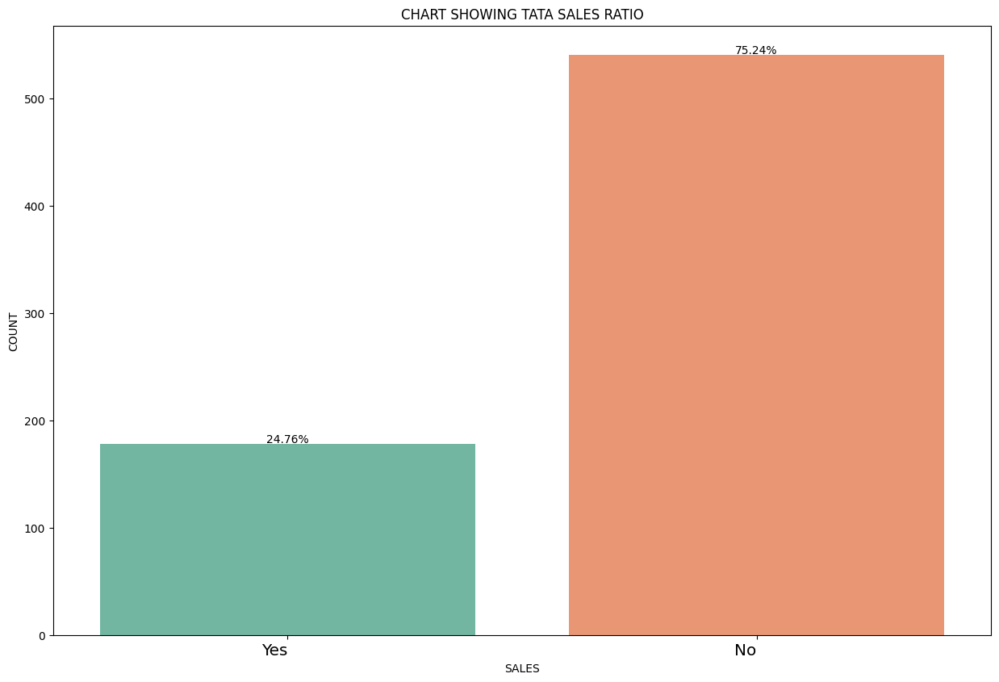

In [130]:
# Exploring the vehicles with name murati
tata_data = make_report(tata_df, "Tata").main_prog()
tata_data

### Chevrolet

In [131]:
chevrolet_df = car_df[lambda x:x["name"] =="Chevrolet"]
chevrolet_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
26,28,Chevrolet,2013,3600,70000,East,Massachusetts,Boston,Diesel,Individual,Manual,First_Owner,18.2,1248,73.80,7,Y,172.5,1750,3600.0
297,309,Chevrolet,2012,1440,60000,West,California,San Diego,Petrol,Individual,Manual,Third_Owner,18.6,1199,79.40,5,Y,108.0,4400,1440.0
452,467,Chevrolet,2016,5040,110000,West,California,Los Angeles,Diesel,Individual,Manual,Second_Owner,18.2,1248,73.74,7,Y,172.5,1750,5040.0
457,472,Chevrolet,2011,6000,99500,East,New York,New York City,Diesel,Individual,Manual,Third_Owner,11.5,1991,147.90,7,Y,320.0,2000,6000.0
481,496,Chevrolet,2013,2040,70000,South,Florida,Miami,Petrol,Individual,Manual,Second_Owner,18.6,1199,79.40,5,Y,108.0,4400,2040.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7845,8066,Chevrolet,2010,1379,60000,West,Idaho,Moscow,Petrol,Individual,Manual,Second_Owner,18.0,995,62.00,5,N,90.3,4200,1379.0
7846,8067,Chevrolet,2010,1680,60000,West,Idaho,Moscow,Petrol,Individual,Manual,Second_Owner,18.0,995,62.00,5,N,90.3,4200,1680.0
7857,8079,Chevrolet,2011,1379,100000,Central,Texas,Sulphur Springs,Petrol,Individual,Manual,Second_Owner,18.0,995,62.00,5,N,90.3,4200,1379.0
7862,8084,Chevrolet,2008,3600,100000,West,Wyoming,Casper,Diesel,Individual,Manual,Second_Owner,11.5,1991,147.90,7,N,320.0,2000,3600.0



Year
: 2011    38
2013    35
2012    30
2010    26
2016    25
2014    23
2015    19
2009    11
2008     9
2007     8
2017     3
2006     2
2005     1
Name: year, dtype: int64

Selling Price:
 3600    13
2400    12
1800    11
4200     8
1680     8
1440     7
1560     7
2700     5
3000     5
1500     5
1920     5
2040     5
960      4
1080     4
5040     4
6000     4
5400     4
7200     4
2280     4
3240     4
2100     4
1980     3
780      3
4919     3
4800     3
2640     3
1740     3
2520     3
4260     2
3720     2
9000     2
7800     2
6600     2
3540     2
2952     2
3360     2
7440     2
1200     2
2160     2
1379     2
1140     2
2880     2
5280     2
3480     2
5940     2
3120     2
4320     1
8100     1
5208     1
4452     1
Name: selling_price, dtype: int64

KM Driven:
 70000     28
60000     20
80000     19
50000     18
100000    14
120000    13
90000     13
110000    11
40000     10
30000      8
68000      3
56000      3
75000      2
35000      2
195000     2
76000      2
13

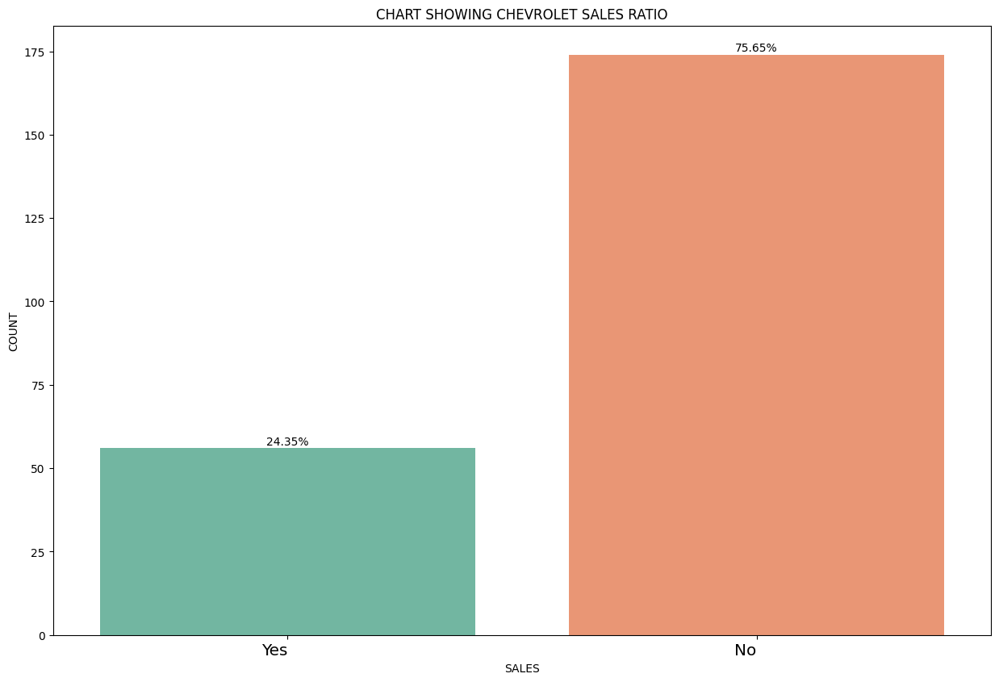

In [132]:
# Exploring the vehicles with name murati
chevrolet_data = make_report(chevrolet_df, "Chevrolet").main_prog()
chevrolet_data

### Datsun

In [133]:
datsun_df = car_df[lambda x:x["name"] =="Datsun"]
datsun_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
36,39,Datsun,2016,1800,42000,West,California,Los Angeles,Petrol,Individual,Manual,First_Owner,20.63,1198,67.00,5,Y,104.0,4000,1800.0
81,85,Datsun,2016,3300,49000,South,Florida,Miami,Petrol,Dealer,Manual,First_Owner,19.02,1198,67.05,5,Y,104.0,4000,3300.0
214,223,Datsun,2017,3948,80000,South,Georgia,Atlanta,Petrol,Individual,Manual,Second_Owner,20.63,1198,67.00,5,Y,104.0,4000,3948.0
264,275,Datsun,2019,3600,40000,West,California,Los Angeles,Petrol,Individual,Manual,First_Owner,19.02,1198,67.05,5,Y,104.0,4000,3600.0
335,349,Datsun,2016,4020,40000,South,North Carolina,Charlotte,Petrol,Dealer,Manual,First_Owner,20.63,1198,67.00,5,Y,104.0,4000,4020.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7019,7218,Datsun,2017,3336,20000,Central,Missouri,Gladstone,Petrol,Individual,Manual,First_Owner,22.50,999,67.00,5,N,91.0,4250,3336.0
7250,7459,Datsun,2017,2880,35000,West,Oregon,Klamath Falls,Petrol,Individual,Manual,First_Owner,22.50,999,67.00,5,N,91.0,4250,2880.0
7335,7547,Datsun,2016,1800,42000,East,Ohio,Medina,Petrol,Individual,Manual,First_Owner,20.63,1198,67.00,5,N,104.0,4000,1800.0
7429,7644,Datsun,2018,3360,50000,East,Maryland,Dundalk,Petrol,Individual,Manual,First_Owner,22.70,799,53.64,5,N,72.0,4386,3360.0



Year
: 2017    17
2018    16
2016    13
2015     8
2019     7
2020     2
2014     2
Name: year, dtype: int64

Selling Price:
 3600    7
4200    5
3300    4
5160    3
3948    3
3900    3
2700    3
3240    3
1800    2
3120    2
2400    2
5400    2
2759    2
2604    2
4020    2
4620    2
3960    1
2880    1
3336    1
6360    1
2640    1
3000    1
5519    1
3720    1
7080    1
2520    1
5700    1
3840    1
4800    1
6000    1
2820    1
3480    1
4680    1
3360    1
Name: selling_price, dtype: int64

KM Driven:
 35000     7
80000     5
60000     5
20000     5
10000     5
40000     4
25000     4
50000     3
5000      3
42000     2
49000     2
65000     2
31100     2
7000      2
19000     2
30000     2
71850     1
2300      1
15000     1
16500     1
33000     1
1300      1
2136      1
4000      1
70000     1
140000    1
Name: km_driven, dtype: int64

Region report:
 Central    22
East       21
South      12
West       10
Name: Region, dtype: int64

City:
 Los Angeles        3
New York City  

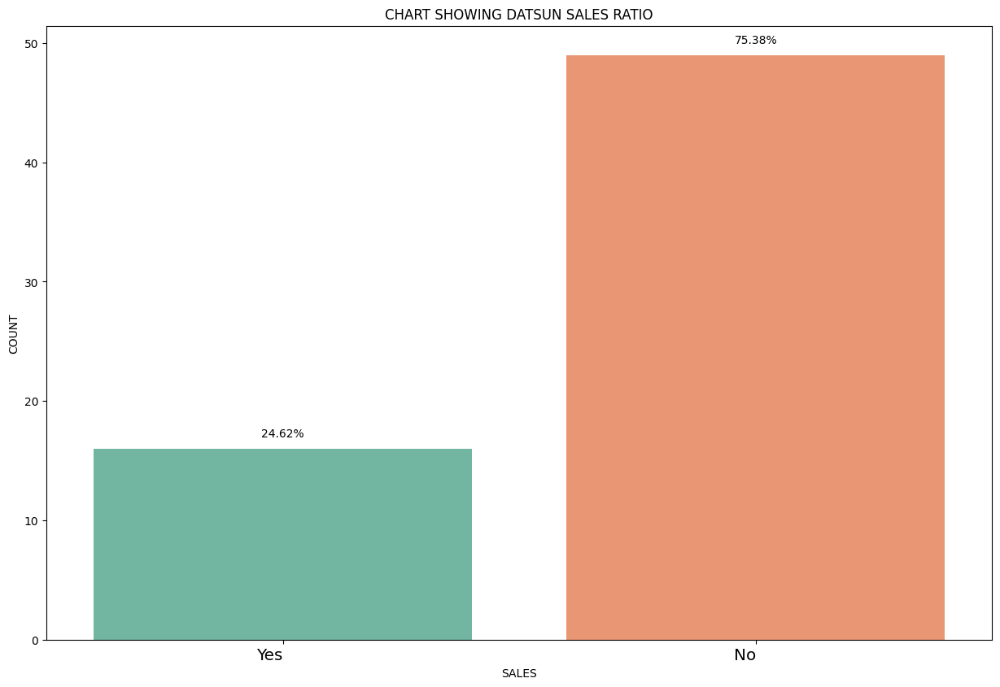

In [134]:
# Exploring the vehicles with name murati
datsun_data = make_report(datsun_df, "Datsun").main_prog()
datsun_data

### Jeep

In [135]:
jeep_df = car_df[lambda x:x["name"] =="Jeep"]
jeep_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
39,42,Jeep,2019,25200,5000,East,New York,New York City,Petrol,Individual,Automatic,First_Owner,16.0,1368,160.77,5,Y,250.0,2125,25200.0
129,135,Jeep,2017,49200,17000,West,California,Los Angeles,Petrol,Individual,Automatic,First_Owner,9.5,3604,280.00,5,Y,347.0,4300,49200.0
511,527,Jeep,2018,19200,14000,South,North Carolina,Charlotte,Diesel,Individual,Manual,First_Owner,17.1,1956,170.00,5,Y,350.0,2125,19200.0
552,570,Jeep,2017,19800,50000,East,New York,New York City,Diesel,Individual,Manual,First_Owner,17.1,1956,170.00,5,Y,350.0,2125,19800.0
1367,1411,Jeep,2017,23400,70000,Central,Texas,Cedar Hill,Diesel,Individual,Manual,First_Owner,16.3,1956,170.00,5,Y,350.0,2125,23400.0
1516,1565,Jeep,2017,49200,17000,West,Idaho,Lewiston,Petrol,Individual,Automatic,First_Owner,9.5,3604,280.00,5,Y,347.0,4300,49200.0
1716,1768,Jeep,2018,20100,80000,South,Kentucky,Murray,Diesel,Individual,Manual,First_Owner,17.1,1956,170.00,5,Y,350.0,2125,20100.0
1806,1861,Jeep,2017,49200,17000,East,New York,Auburn,Petrol,Individual,Automatic,First_Owner,9.5,3604,280.00,5,Y,347.0,4300,49200.0
1978,2039,Jeep,2017,20279,60000,South,Tennessee,Gallatin,Diesel,Individual,Manual,First_Owner,17.1,1956,170.00,5,Y,350.0,2125,20279.0
2706,2796,Jeep,2017,15900,30000,West,Colorado,Pueblo,Diesel,Individual,Manual,First_Owner,17.1,1956,170.00,5,N,350.0,2125,15900.0



Year
: 2017    20
2019     7
2018     4
Name: year, dtype: int64

Selling Price:
 49200    6
18600    4
25200    2
19800    2
20100    2
17400    2
23040    1
18240    1
22200    1
21084    1
25800    1
21600    1
18180    1
18132    1
15900    1
20279    1
23400    1
19200    1
18000    1
Name: selling_price, dtype: int64

KM Driven:
 17000     6
5000      2
14000     2
50000     2
80000     2
87500     2
22000     2
25000     1
12000     1
10000     1
24000     1
69123     1
32000     1
20000     1
15000     1
45000     1
30000     1
60000     1
70000     1
120000    1
Name: km_driven, dtype: int64

Region report:
 East       8
West       8
Central    8
South      7
Name: Region, dtype: int64

City:
 New York City      2
Los Angeles        1
Pembroke Pines     1
Bridgeton          1
Neenah             1
Mesa               1
La Vista           1
Middletown         1
Lakeland           1
Camden             1
Pottstown          1
Bossier City       1
Eagle              1
Saint Louis   

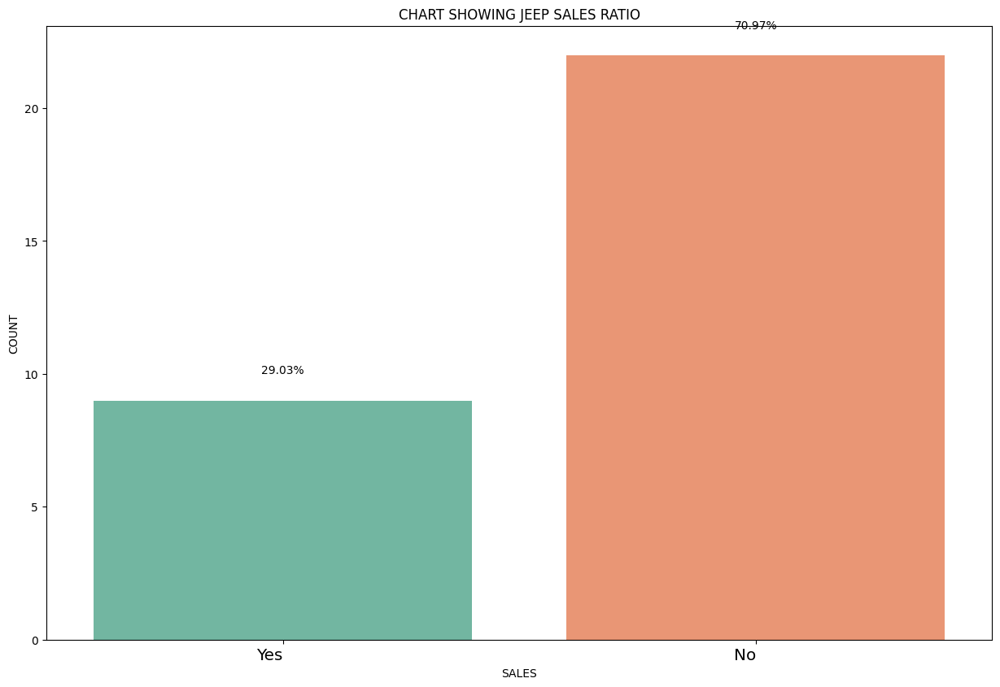

In [136]:
# Exploring the vehicles with name murati
jeep_data = make_report(jeep_df, "Jeep").main_prog()
jeep_data

### Mercedes

In [137]:
mercedes_df = car_df[lambda x:x["name"] =="Mercedes"]
mercedes_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
47,50,Mercedes,2014,17400,27800,East,New York,New York City,Diesel,Dealer,Automatic,Second_Owner,14.80,2143,120.70,5,Y,200.0,2625,17400.0
58,61,Mercedes,2013,17100,59000,East,Massachusetts,Boston,Diesel,Dealer,Automatic,First_Owner,14.84,2143,170.00,5,Y,400.0,2100,17100.0
131,137,Mercedes,2017,72000,37000,West,California,Los Angeles,Diesel,Dealer,Automatic,First_Owner,13.50,2987,254.79,5,Y,620.0,2000,72000.0
135,142,Mercedes,2016,32400,35000,West,California,San Diego,Diesel,Dealer,Automatic,First_Owner,15.00,2143,204.00,5,Y,500.0,1700,32400.0
142,149,Mercedes,2017,70200,47000,West,California,Los Angeles,Diesel,Dealer,Automatic,First_Owner,13.50,2987,282.00,5,Y,490.0,1600,70200.0
150,157,Mercedes,2018,30600,18000,Central,Illinois,Chicago,Petrol,Dealer,Automatic,First_Owner,15.04,1991,183.00,5,Y,300.0,2600,30600.0
152,159,Mercedes,2017,32400,16000,East,Massachusetts,Boston,Petrol,Dealer,Automatic,First_Owner,14.74,1991,181.04,5,Y,300.0,1300,32400.0
278,289,Mercedes,2018,55200,7976,Central,Texas,Houston,Diesel,Individual,Automatic,First_Owner,17.90,2143,170.00,5,Y,400.0,2100,55200.0
349,363,Mercedes,2013,18600,25000,West,Washington,Seattle,Diesel,Individual,Automatic,First_Owner,14.84,2143,170.00,5,Y,400.0,2100,18600.0
662,682,Mercedes,2016,36000,40000,East,Massachusetts,Boston,Diesel,Individual,Automatic,First_Owner,13.00,2143,204.00,5,Y,500.0,1700,36000.0



Year
: 2017    11
2016     8
2011     8
2014     5
2018     5
2013     4
2007     2
2015     2
2019     2
2008     2
2012     1
2005     1
2006     1
2010     1
2009     1
Name: year, dtype: int64

Selling Price:
 32400    5
72000    3
20400    2
34800    2
62400    2
12000    2
16200    2
19200    2
22200    2
55200    2
30600    2
22308    1
39600    1
39000    1
24000    1
6180     1
25200    1
8700     1
23100    1
24612    1
6000     1
14400    1
17400    1
14280    1
31200    1
7800     1
17100    1
49080    1
4800     1
15000    1
43200    1
26388    1
35400    1
9600     1
16800    1
36000    1
18600    1
70200    1
30900    1
Name: selling_price, dtype: int64

KM Driven:
 80000     4
70000     4
40000     4
37000     3
35000     3
31000     2
23000     2
42000     2
17000     2
110000    2
50000     2
120000    2
60000     2
16000     2
18000     2
48000     1
91500     1
90000     1
81500     1
6000      1
27800     1
46000     1
74000     1
100000    1
10000     1
59000    

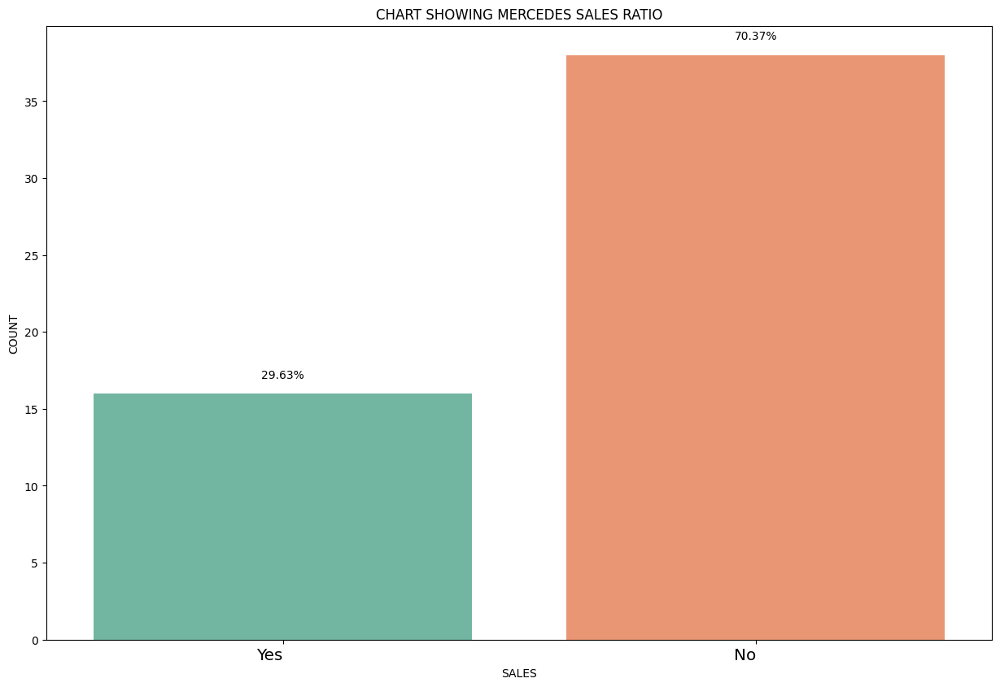

In [138]:
# Exploring the vehicles with name murati
mercedes_data = make_report(mercedes_df, "Mercedes").main_prog()
mercedes_data

### Mitsubishi

In [139]:
mutsubishi_df = car_df[lambda x:x["name"] =="Mitsubishi"]
mutsubishi_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
49,52,Mitsubishi,2013,13080,151000,West,Washington,Seattle,Diesel,Dealer,Manual,First_Owner,13.5,2477,175.56,7,Y,400.0,2250,13080.0
569,589,Mitsubishi,2013,11400,181491,Central,Illinois,Chicago,Diesel,Dealer,Manual,First_Owner,13.5,2477,175.56,7,Y,400.0,2250,11400.0
1702,1754,Mitsubishi,2011,7500,120000,Central,Illinois,Wilmette,Diesel,Individual,Manual,Second_Owner,10.5,2835,116.90,6,Y,292.0,2000,7500.0
2806,2899,Mitsubishi,2008,1920,100000,West,California,Morgan Hill,Diesel,Individual,Manual,First_Owner,14.8,1998,68.00,5,N,140.0,3000,1920.0
3433,3543,Mitsubishi,2015,20400,39000,Central,Illinois,Crystal Lake,Diesel,Individual,Manual,First_Owner,13.5,2477,175.56,7,N,400.0,2250,20400.0
3462,3573,Mitsubishi,2015,20400,39000,Central,Iowa,Sioux City,Diesel,Individual,Manual,First_Owner,13.5,2477,175.56,7,N,400.0,2250,20400.0
4130,4254,Mitsubishi,1999,1860,100000,East,Maryland,Bethesda,Diesel,Individual,Manual,Third_Owner,14.8,1998,68.00,5,N,140.0,3000,1860.0
5020,5165,Mitsubishi,2008,1980,120000,East,Ohio,Whitehall,Diesel,Individual,Manual,Third_Owner,14.8,1998,68.00,5,N,140.0,3000,1980.0
5202,5350,Mitsubishi,1999,1800,198000,East,Ohio,Shaker Heights,Diesel,Individual,Manual,Second_Owner,14.8,1998,68.00,5,N,140.0,3000,1800.0
6853,7048,Mitsubishi,2016,23400,120000,West,New Mexico,Clovis,Diesel,Individual,Manual,First_Owner,13.5,2477,175.56,7,N,400.0,2250,23400.0



Year
: 2015    4
1999    3
2013    2
2008    2
2011    1
2016    1
2000    1
Name: year, dtype: int64

Selling Price:
 1800     3
20400    2
15000    2
13080    1
11400    1
7500     1
1920     1
1860     1
1980     1
23400    1
Name: selling_price, dtype: int64

KM Driven:
 120000    3
100000    2
39000     2
198000    2
160000    2
151000    1
181491    1
280000    1
Name: km_driven, dtype: int64

Region report:
 Central    5
East       5
West       4
Name: Region, dtype: int64

City:
 Seattle           1
Chicago           1
Wilmette          1
Morgan Hill       1
Crystal Lake      1
Sioux City        1
Bethesda          1
Whitehall         1
Shaker Heights    1
Clovis            1
Lewiston          1
Tigard            1
Muskego           1
Massillon         1
Name: City, dtype: int64

State o Province:
 Illinois      3
Ohio          3
Washington    1
California    1
Iowa          1
Maryland      1
New Mexico    1
Maine         1
Oregon        1
Wisconsin     1
Name: State or Provin

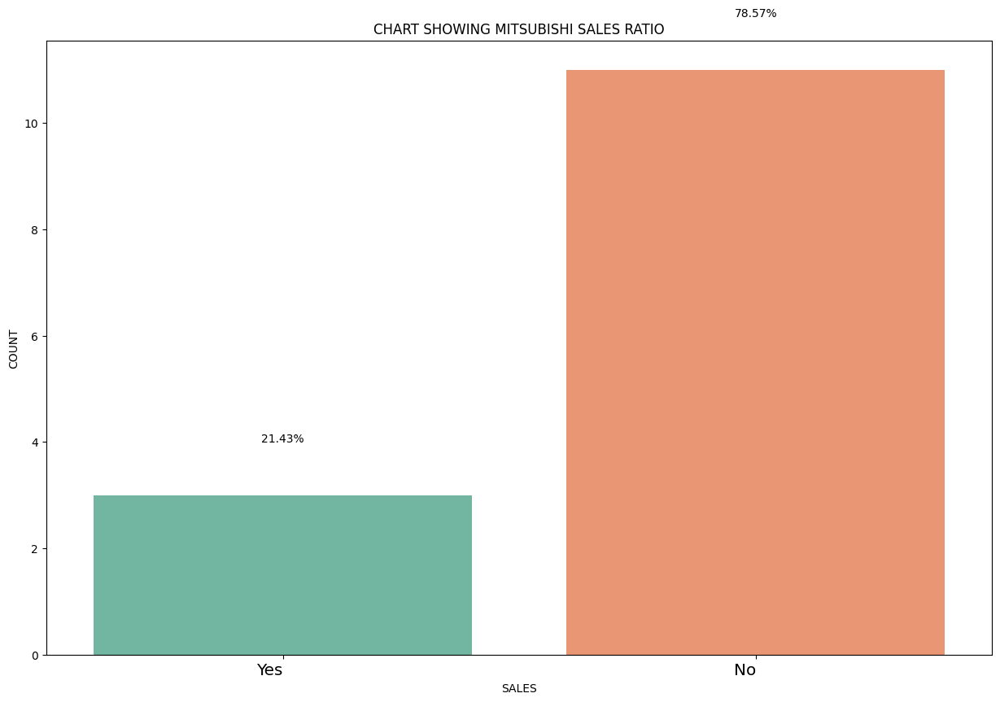

In [140]:
# Exploring the vehicles with name murati
mutsubishi_data = make_report(mutsubishi_df, "Mitsubishi").main_prog()
mutsubishi_data

### Audi

In [141]:
audi_df = car_df[lambda x:x["name"] =="Audi"]
audi_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
55,58,Audi,2013,21000,33900,South,Georgia,Atlanta,Diesel,Dealer,Automatic,Second_Owner,17.68,1968,174.33,5,Y,380.0,2125,21000.0
57,60,Audi,2013,20279,50000,East,Massachusetts,Boston,Diesel,Dealer,Automatic,First_Owner,18.53,1968,187.74,5,Y,400.0,2375,20279.0
126,132,Audi,2018,47700,31800,West,Washington,Seattle,Diesel,Dealer,Automatic,First_Owner,17.01,1968,188.00,5,Y,400.0,2375,47700.0
140,147,Audi,2015,31800,53000,West,California,Los Angeles,Diesel,Dealer,Automatic,First_Owner,12.07,2967,241.40,7,Y,550.0,2250,31800.0
878,907,Audi,2014,19200,44000,South,Georgia,Atlanta,Diesel,Individual,Automatic,Second_Owner,16.55,1968,147.51,5,Y,320.0,2125,19200.0
1368,1412,Audi,2011,15600,120000,Central,Texas,Cedar Hill,Diesel,Individual,Automatic,First_Owner,12.80,1968,167.60,5,Y,350.0,2125,15600.0
1513,1562,Audi,2018,47700,31800,West,Arizona,Chandler,Diesel,Dealer,Automatic,First_Owner,17.01,1968,188.00,5,Y,400.0,2375,47700.0
1803,1858,Audi,2018,47700,31800,South,North Carolina,Albemarle,Diesel,Dealer,Automatic,First_Owner,17.01,1968,188.00,5,Y,400.0,2375,47700.0
1918,1978,Audi,2017,33900,22000,East,New York,Ossining,Diesel,Dealer,Automatic,First_Owner,15.73,1968,174.33,5,Y,380.0,2125,33900.0
2047,2110,Audi,2017,31200,70000,Central,Illinois,Pekin,Diesel,Individual,Automatic,First_Owner,20.38,1968,143.00,5,N,320.0,2375,31200.0



Year
: 2018    10
2014     7
2013     4
2017     4
2015     3
2016     3
2019     3
2009     2
2010     2
2011     1
2012     1
Name: year, dtype: int64

Selling Price:
 47700    6
21000    3
22200    3
26400    2
33900    2
14400    2
36000    2
20279    2
74676    1
24000    1
29400    1
22787    1
12300    1
78276    1
71076    1
28500    1
32400    1
34800    1
8760     1
9720     1
33600    1
31200    1
15600    1
19200    1
31800    1
18000    1
Name: selling_price, dtype: int64

KM Driven:
 31800     6
76131     2
30000     2
60000     2
120000    2
22000     2
70000     2
110000    2
25000     1
23600     1
46000     1
33900     1
20000     1
35000     1
7800      1
230000    1
11500     1
55000     1
105000    1
15000     1
50000     1
98000     1
37000     1
26000     1
65000     1
44000     1
53000     1
8000      1
Name: km_driven, dtype: int64

Region report:
 Central    15
West        9
South       8
East        8
Name: Region, dtype: int64

City:
 Atlanta            2
S

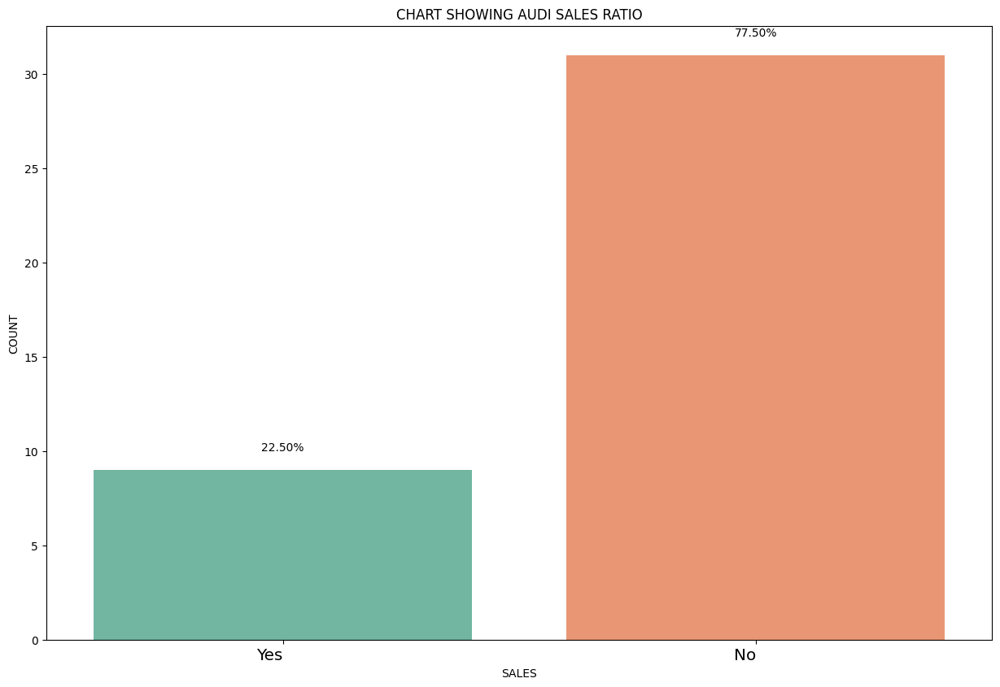

In [142]:
# Exploring the vehicles with name murati
audi_data = make_report(audi_df
                        
                        , "Audi").main_prog()
audi_data

### Volkswagen

In [143]:
volkswagen_df = car_df[lambda x:x["name"] =="Volkswagen"]
volkswagen_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
65,68,Volkswagen,2016,6480,40000,East,District of Columbia,Washington,Diesel,Individual,Manual,First_Owner,22.00,1498,108.495,5,Y,250.0,2250,6480.0
68,71,Volkswagen,2017,6000,80000,Central,Illinois,Chicago,Diesel,Individual,Manual,First_Owner,21.66,1498,108.620,5,Y,250.0,2250,6000.0
76,80,Volkswagen,2013,5400,170000,South,North Carolina,Charlotte,Diesel,Individual,Manual,First_Owner,20.54,1598,103.600,5,Y,250.0,2000,5400.0
87,92,Volkswagen,2015,5460,42000,South,North Carolina,Charlotte,Petrol,Dealer,Manual,First_Owner,16.47,1198,74.000,5,Y,110.0,3750,5460.0
89,94,Volkswagen,2012,6420,12000,East,Pennsylvania,Philadelphia,Petrol,Dealer,Manual,Second_Owner,15.04,1598,103.600,5,Y,153.0,3800,6420.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7588,7806,Volkswagen,2011,4380,65000,South,Mississippi,Meridian,Diesel,Dealer,Manual,Second_Owner,20.54,1598,103.600,5,N,250.0,2000,4380.0
7611,7829,Volkswagen,2017,7800,49060,West,California,Rancho Cucamonga,Diesel,Individual,Manual,First_Owner,22.00,1498,108.495,5,N,250.0,2250,7800.0
7618,7836,Volkswagen,2014,4692,120000,West,California,Redlands,Diesel,Individual,Manual,Second_Owner,20.14,1498,88.800,5,N,230.0,2000,4692.0
7675,7894,Volkswagen,2011,3000,140000,South,Mississippi,Horn Lake,Petrol,Individual,Automatic,Second_Owner,14.40,1598,103.600,5,N,153.0,3800,3000.0



Year
: 2011    33
2012    26
2013    22
2016    19
2017    16
2014    16
2018    16
2019    12
2015    11
2010    10
2020     3
2008     1
Name: year, dtype: int64

Selling Price:
 4800     11
4200     11
3600      9
6600      9
6720      7
7800      6
3360      5
6000      4
6900      4
7200      4
4500      4
3000      4
2700      3
3900      3
16200     3
3960      3
6780      3
9600      3
5400      3
5100      2
4320      2
11400     2
3840      2
2880      2
8340      2
4380      2
7020      2
10800     2
6480      2
4932      2
7500      2
8400      2
3300      2
8136      2
12000     2
3120      2
6948      1
5160      1
5040      1
3780      1
4692      1
3540      1
4980      1
2724      1
4620      1
4740      1
4560      1
10200     1
7440      1
10620     1
Name: selling_price, dtype: int64

KM Driven:
 120000    17
80000     17
40000     10
100000    10
90000     10
60000      9
70000      8
50000      7
110000     7
75000      3
69000      3
17000      3
66000      2
74

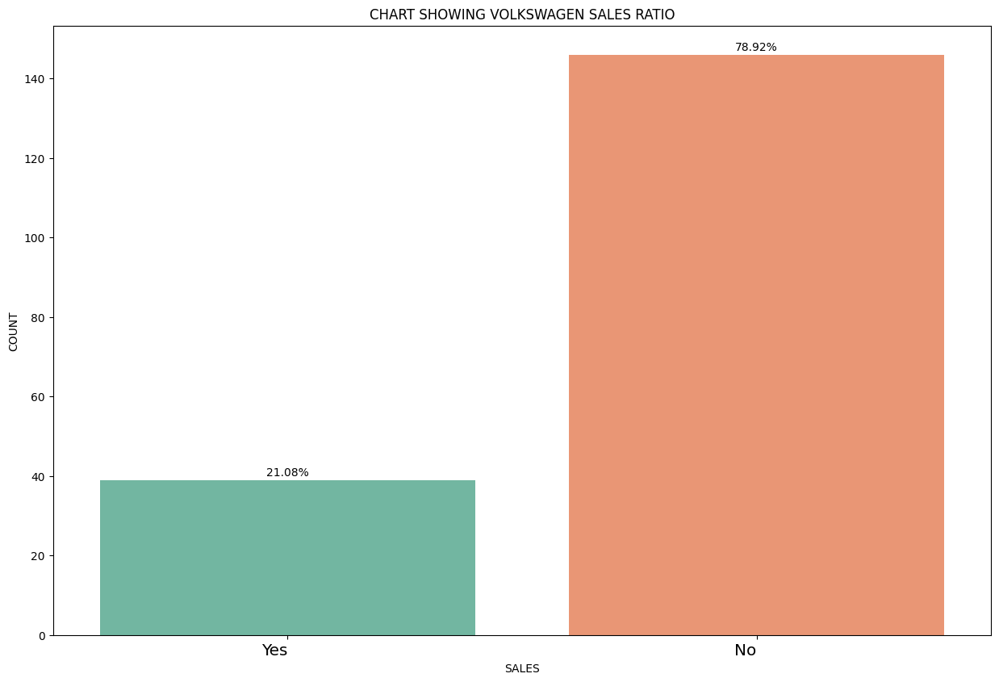

In [144]:
# Exploring the vehicles with name murati
volkswagen_data = make_report(volkswagen_df, "Volkswagen").main_prog()
volkswagen_data

### BMW

In [145]:
bmw_df = car_df[lambda x:x["name"] =="BMW"]
bmw_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
79,83,BMW,2016,30000,30000,Central,Illinois,Chicago,Petrol,Individual,Automatic,Second_Owner,15.71,1998,189.00,5,Y,280.0,2975,30000.0
132,138,BMW,2018,45480,29500,West,California,Los Angeles,Diesel,Dealer,Automatic,First_Owner,22.48,1995,187.74,5,Y,400.0,2125,45480.0
133,140,BMW,2019,69600,7500,East,New York,New York City,Diesel,Dealer,Automatic,First_Owner,16.78,1995,190.00,5,Y,400.0,2125,69600.0
143,150,BMW,2010,11700,72200,East,District of Columbia,Washington,Petrol,Dealer,Automatic,Second_Owner,10.80,2497,150.00,5,Y,250.0,2750,11700.0
159,166,BMW,2016,25800,30000,South,Florida,Miami,Diesel,Dealer,Automatic,First_Owner,22.69,1995,190.00,5,Y,400.0,2125,25800.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7589,7807,BMW,2009,11700,80000,West,Colorado,Grand Junction,Diesel,Dealer,Automatic,Second_Owner,22.48,1995,187.74,5,N,400.0,2125,11700.0
7603,7821,BMW,2012,10800,155000,South,Florida,Tallahassee,Diesel,Individual,Automatic,Second_Owner,16.07,1995,181.00,4,N,380.0,1750,10800.0
7654,7873,BMW,2019,64800,7500,Central,Texas,Lubbock,Diesel,Dealer,Automatic,First_Owner,16.78,1995,190.00,5,N,400.0,2125,64800.0
7655,7874,BMW,2019,66000,8500,Central,Texas,Lufkin,Diesel,Dealer,Automatic,First_Owner,16.78,1995,190.00,5,N,400.0,2125,66000.0



Year
: 2019    64
2018    14
2016     7
2012     6
2013     5
2011     5
2017     5
2010     4
2009     2
2007     2
2008     2
2020     1
2015     1
Name: year, dtype: int64

Selling Price:
 66000    31
64800    30
15600     4
13200     4
35400     3
72000     3
12900     3
30000     2
12000     2
62400     2
31200     2
69960     2
45480     2
38400     2
24000     2
40200     2
45000     2
25800     2
11700     2
69600     2
48000     2
9960      1
21600     1
10800     1
19800     1
34200     1
11100     1
5760      1
86400     1
46800     1
9000      1
34800     1
18000     1
Name: selling_price, dtype: int64

KM Driven:
 7500      31
8500      30
30000      6
60000      6
10000      4
140000     4
42545      3
80000      2
50000      2
39000      2
29500      2
27000      2
44000      2
18000      2
28156      2
56000      2
13663      1
96000      1
155000     1
21000      1
72200      1
12000      1
74000      1
90000      1
122000     1
40000      1
17100      1
22000      1


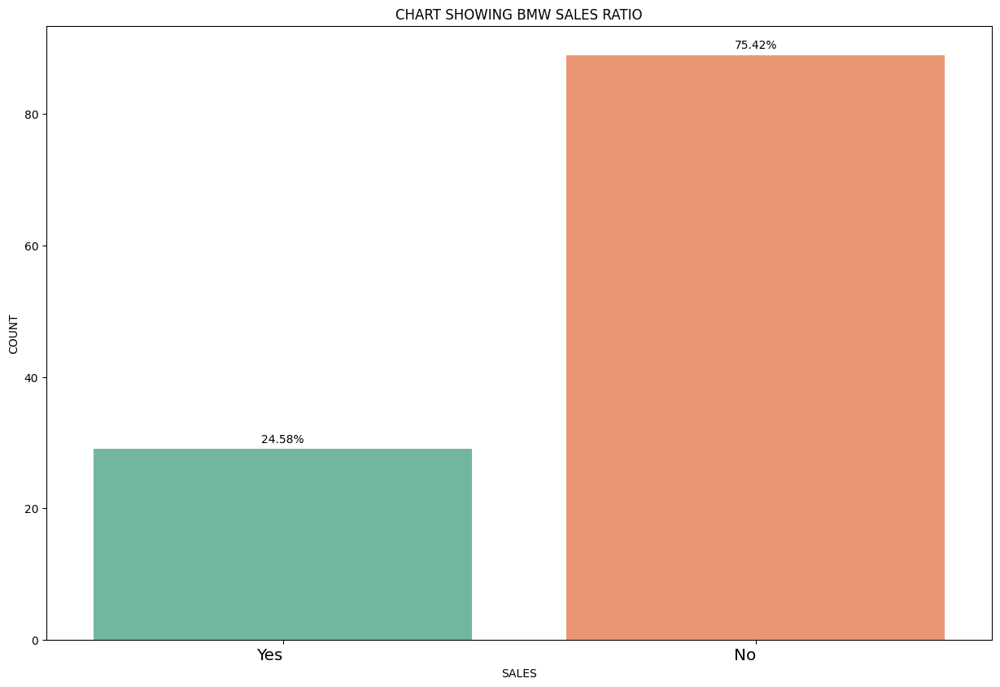

In [146]:
# Exploring the vehicles with name murati
bmw_data = make_report(bmw_df, "BMW").main_prog()
bmw_data

### Nissan

In [147]:
nissan_df = car_df[lambda x:x["name"] =="Nissan"]
nissan_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
115,121,Nissan,2014,4800,70000,East,District of Columbia,Washington,Diesel,Individual,Manual,Third_Owner,20.45,1461,83.80,5,Y,200.0,1900,4800.0
220,230,Nissan,2014,6600,37000,Central,Michigan,Detroit,Petrol,Individual,Manual,First_Owner,16.95,1498,97.70,5,Y,134.0,4000,6600.0
222,232,Nissan,2015,3600,80000,Central,Michigan,Detroit,Petrol,Individual,Manual,First_Owner,19.49,1198,67.04,5,Y,104.0,4000,3600.0
257,268,Nissan,2013,4200,90000,Central,Texas,Houston,Petrol,Individual,Automatic,Second_Owner,17.97,1498,99.60,5,Y,134.0,4000,4200.0
303,315,Nissan,2014,6660,80100,West,California,Los Angeles,Diesel,Individual,Manual,Second_Owner,19.01,1461,108.50,5,Y,248.0,2250,6660.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7549,7767,Nissan,2014,4020,71000,Central,Texas,Texarkana,Diesel,Dealer,Manual,First_Owner,21.64,1461,84.80,5,N,200.0,2000,4020.0
7590,7808,Nissan,2015,5988,61000,West,Colorado,Fountain,Diesel,Dealer,Manual,Second_Owner,22.71,1461,84.80,5,N,200.0,2000,5988.0
7605,7823,Nissan,2013,3300,80000,South,Florida,Tamarac,Petrol,Individual,Manual,Third_Owner,16.95,1498,97.70,5,N,134.0,4000,3300.0
7851,8073,Nissan,2014,5400,82000,West,Idaho,Moscow,Diesel,Individual,Manual,Second_Owner,20.45,1461,83.80,5,N,200.0,1900,5400.0



Year
: 2014    17
2015    14
2011    12
2012    11
2013     9
2017     6
2016     4
2018     4
2019     4
Name: year, dtype: int64

Selling Price:
 4200     6
3600     4
10200    3
3000     3
6960     3
3900     3
4800     2
2640     2
10320    2
4020     2
9000     2
8400     2
6300     2
9600     2
3840     2
8040     2
4440     2
3300     2
5400     2
5664     1
2520     1
5880     1
12000    1
2820     1
4152     1
6480     1
4500     1
3360     1
3720     1
6660     1
4332     1
10080    1
14400    1
5988     1
2759     1
1320     1
5700     1
6720     1
5940     1
3480     1
4680     1
6000     1
2700     1
6600     1
3059     1
2459     1
3540     1
7200     1
5760     1
2400     1
Name: selling_price, dtype: int64

KM Driven:
 90000     8
110000    8
50000     5
120000    5
35000     5
70000     4
80000     4
40000     3
60000     2
26000     2
14317     2
71000     2
55000     2
30000     2
36422     1
166000    1
91400     1
21500     1
96000     1
48000     1
212000    1
23

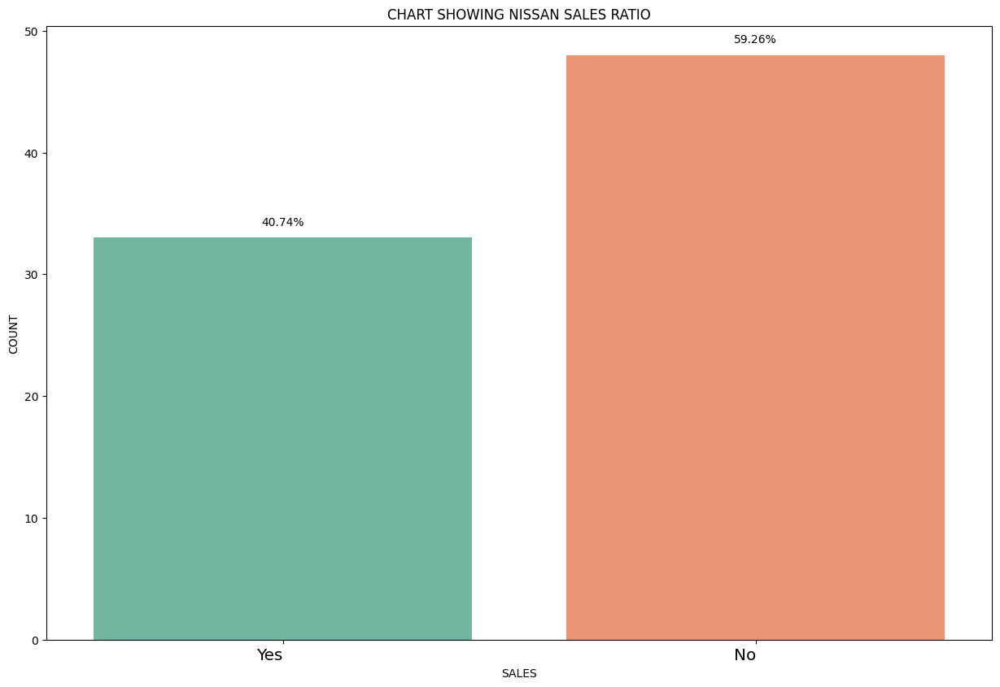

In [148]:
# Exploring the vehicles with name murati
nissan_data = make_report(nissan_df, "Nissan").main_prog()
nissan_data

### Lexus

In [149]:
lexus_df = car_df[lambda x:x["name"] =="Lexus"]
lexus_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
127,133,Lexus,2019,61800,20000,West,Washington,Seattle,Petrol,Dealer,Automatic,First_Owner,22.37,2487,214.56,5,Y,202.0,4400,61800.0
358,372,Lexus,2019,61800,20000,East,New York,New York City,Petrol,Dealer,Automatic,First_Owner,22.37,2487,214.56,5,Y,202.0,4400,61800.0
396,411,Lexus,2019,61800,20000,South,Georgia,Atlanta,Petrol,Dealer,Automatic,First_Owner,22.37,2487,214.56,5,Y,202.0,4400,61800.0
628,648,Lexus,2019,61800,20000,East,New York,New York City,Petrol,Dealer,Automatic,First_Owner,22.37,2487,214.56,5,Y,202.0,4400,61800.0
1047,1079,Lexus,2019,61800,20000,Central,Texas,Pharr,Petrol,Dealer,Automatic,First_Owner,22.37,2487,214.56,5,Y,202.0,4400,61800.0
1066,1098,Lexus,2019,61800,20000,South,North Carolina,Goldsboro,Petrol,Dealer,Automatic,First_Owner,22.37,2487,214.56,5,Y,202.0,4400,61800.0
1085,1117,Lexus,2019,61800,20000,East,New York,Elmira,Petrol,Dealer,Automatic,First_Owner,22.37,2487,214.56,5,Y,202.0,4400,61800.0
1104,1136,Lexus,2019,61800,20000,East,New York,Elmira,Petrol,Dealer,Automatic,First_Owner,22.37,2487,214.56,5,Y,202.0,4400,61800.0
1514,1563,Lexus,2019,61800,20000,West,Idaho,Lewiston,Petrol,Dealer,Automatic,First_Owner,22.37,2487,214.56,5,Y,202.0,4400,61800.0
1660,1711,Lexus,2019,61800,20000,South,Florida,Orlando,Petrol,Dealer,Automatic,First_Owner,22.37,2487,214.56,5,Y,202.0,4400,61800.0



Year
: 2019    34
Name: year, dtype: int64

Selling Price:
 61800    34
Name: selling_price, dtype: int64

KM Driven:
 20000    34
Name: km_driven, dtype: int64

Region report:
 East       11
South      10
Central     7
West        6
Name: Region, dtype: int64

City:
 New York City       2
Elmira              2
Chicago             1
Bethesda            1
Tonawanda           1
Salisbury           1
Sterling Heights    1
Gary                1
Bossier City        1
Seattle             1
Sioux Falls         1
Bethel Park         1
Poinciana           1
Castle Rock         1
Tacoma              1
Panama City         1
Royal Palm Beach    1
Pacifica            1
Newnan              1
Wilmington          1
Milton              1
Nampa               1
Rochester           1
Philadelphia        1
Prairie Village     1
Albemarle           1
Orlando             1
Lewiston            1
Goldsboro           1
Pharr               1
Atlanta             1
Warren              1
Name: City, dtype: int64



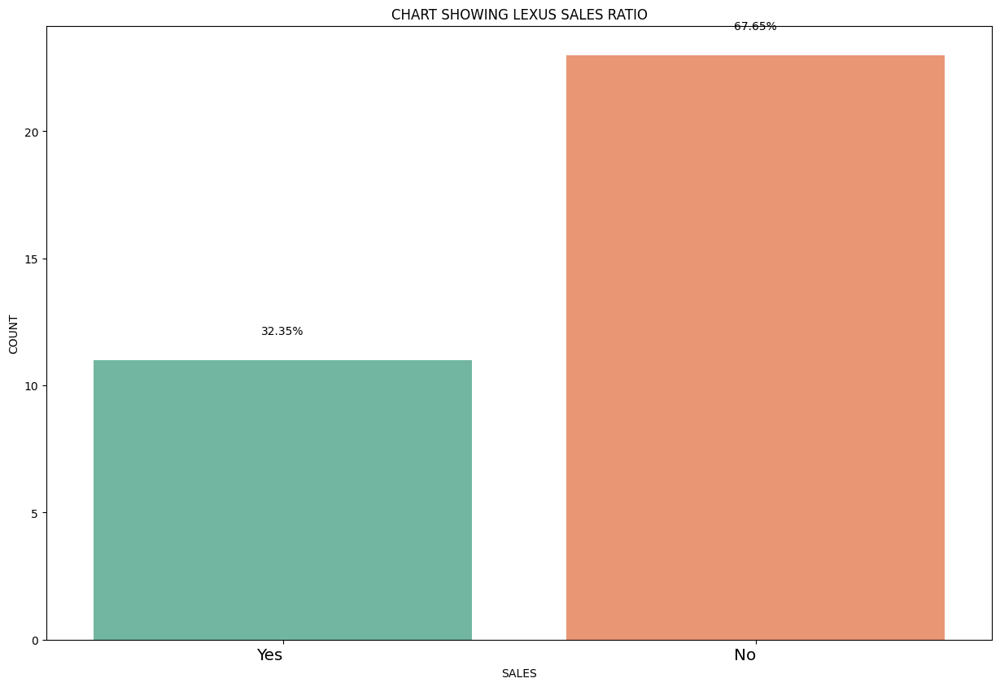

In [150]:
# Exploring the vehicles with name murati
lexus_data = make_report(lexus_df, "Lexus").main_prog()
lexus_data

### Jaguar

In [151]:
jaguar_df = car_df[lambda x:x["name"] =="Jaguar"]
jaguar_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
128,134,Jaguar,2017,38400,45000,East,New York,New York City,Diesel,Dealer,Automatic,First_Owner,19.33,1999,177.0,5,Y,430.0,2125,38400.0
145,152,Jaguar,2017,31500,9000,East,New York,New York City,Diesel,Dealer,Automatic,First_Owner,13.60,1999,177.0,5,Y,430.0,2125,31500.0
357,371,Jaguar,2017,31500,9000,West,California,Los Angeles,Diesel,Dealer,Automatic,First_Owner,13.60,1999,177.0,5,Y,430.0,2125,31500.0
359,373,Jaguar,2017,38400,45000,West,California,Los Angeles,Diesel,Dealer,Automatic,First_Owner,19.33,1999,177.0,5,Y,430.0,2125,38400.0
395,410,Jaguar,2017,31500,9000,West,California,San Francisco,Diesel,Dealer,Automatic,First_Owner,13.60,1999,177.0,5,Y,430.0,2125,31500.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6766,6960,Jaguar,2017,32532,9000,West,Washington,Tacoma,Diesel,Dealer,Automatic,First_Owner,13.60,1999,177.0,5,N,430.0,2125,32532.0
6768,6962,Jaguar,2017,38400,45000,West,Washington,Tacoma,Diesel,Dealer,Automatic,First_Owner,19.33,1999,177.0,5,N,430.0,2125,38400.0
7487,7703,Jaguar,2017,38400,45000,South,Florida,Pembroke Pines,Diesel,Dealer,Automatic,First_Owner,19.33,1999,177.0,5,N,430.0,2125,38400.0
7640,7859,Jaguar,2017,32532,9000,East,Ohio,Warren,Diesel,Dealer,Automatic,First_Owner,13.60,1999,177.0,5,N,430.0,2125,32532.0



Year
: 2017    64
2013     2
2014     2
2015     2
2016     1
Name: year, dtype: int64

Selling Price:
 38400    34
32532    18
31500    12
29400     2
24000     2
30000     1
42000     1
36000     1
Name: selling_price, dtype: int64

KM Driven:
 45000    34
9000     30
60000     2
51000     2
13500     1
35000     1
70000     1
Name: km_driven, dtype: int64

Region report:
 South      22
East       20
Central    18
West       11
Name: Region, dtype: int64

City:
 New York City        5
Poinciana            2
Los Angeles          2
Sterling Heights     2
Granger              2
Bartlett             2
Royal Palm Beach     2
Bethlehem            2
Prairie Village      2
Dundalk              2
Tacoma               2
Pflugerville         2
College Park         2
Broomfield           2
Bryant               1
Warren               1
Troy                 1
Tonawanda            1
Euless               1
Wake Forest          1
Salisbury            1
Vincennes            1
Bartlesville         1
E

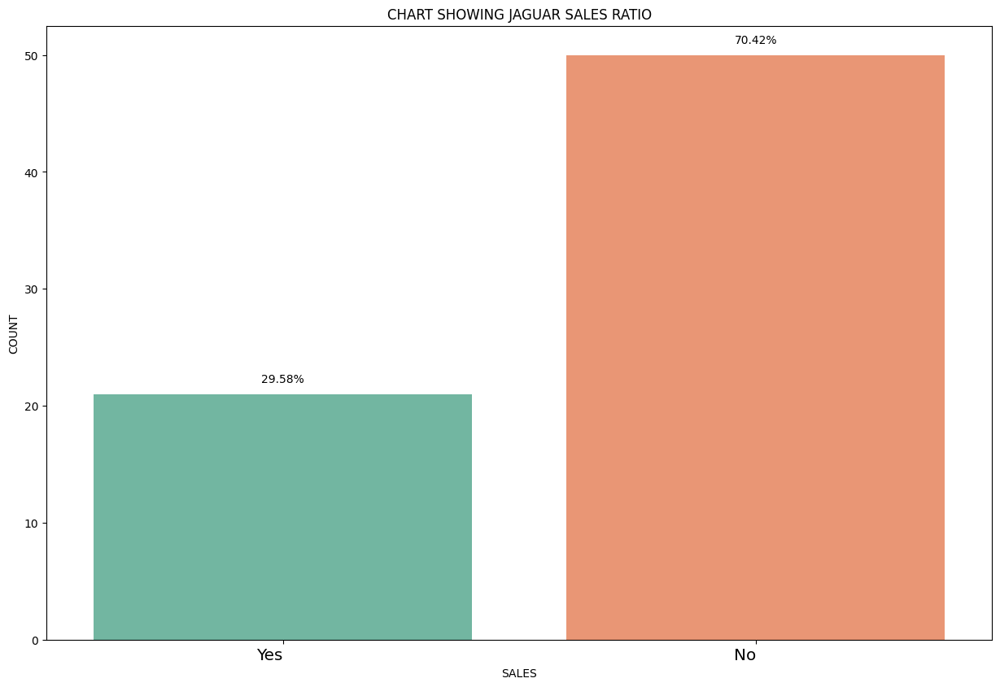

In [152]:
# Exploring the vehicles with name murati
jaguar_data = make_report(jaguar_df, "Jaguar").main_prog()
jaguar_data

### Land Rover

In [153]:
land_df = car_df[lambda x:x["name"] =="Land"]
land_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
130,136,Land,2019,54000,21000,West,California,Los Angeles,Diesel,Dealer,Automatic,First_Owner,12.83,1999,148.31,7,Y,382.0,2000,54000.0
2073,2138,Land,2013,19800,64788,Central,Texas,Victoria,Diesel,Dealer,Automatic,First_Owner,0.00,2179,115.00,5,N,400.0,2212,19800.0
3140,3241,Land,2019,54000,21000,West,Idaho,Nampa,Diesel,Dealer,Automatic,First_Owner,12.83,1999,148.31,7,N,382.0,2000,54000.0
5113,5258,Land,2019,54000,21000,South,Louisiana,Baton Rouge,Diesel,Dealer,Automatic,First_Owner,12.83,1999,148.31,7,N,382.0,2000,54000.0
6538,6725,Land,2013,24000,77500,East,Massachusetts,Leominster,Diesel,Individual,Automatic,Third_Owner,12.70,2179,187.70,5,N,420.0,2000,24000.0
7496,7712,Land,2019,54000,21000,West,Montana,Bozeman,Diesel,Dealer,Automatic,First_Owner,12.83,1999,148.31,7,N,382.0,2000,54000.0



Year
: 2019    4
2013    2
Name: year, dtype: int64

Selling Price:
 54000    4
19800    1
24000    1
Name: selling_price, dtype: int64

KM Driven:
 21000    4
64788    1
77500    1
Name: km_driven, dtype: int64

Region report:
 West       3
Central    1
South      1
East       1
Name: Region, dtype: int64

City:
 Los Angeles    1
Victoria       1
Nampa          1
Baton Rouge    1
Leominster     1
Bozeman        1
Name: City, dtype: int64

State o Province:
 California       1
Texas            1
Idaho            1
Louisiana        1
Massachusetts    1
Montana          1
Name: State or Province, dtype: int64

Fuel Type:
 Diesel    6
Name: fuel, dtype: int64

Seller Type:
 Dealer        5
Individual    1
Name: seller_type, dtype: int64

Transmission:
 Automatic    6
Name: transmission, dtype: int64

Owner:
 First_Owner    5
Third_Owner    1
Name: owner, dtype: int64

Sold:
 N    5
Y    1
Name: sold, dtype: int64
Unique Value:
 ['Y' 'N'] 

 Mode Value:
 0    N
Name: sold, dtype: object 


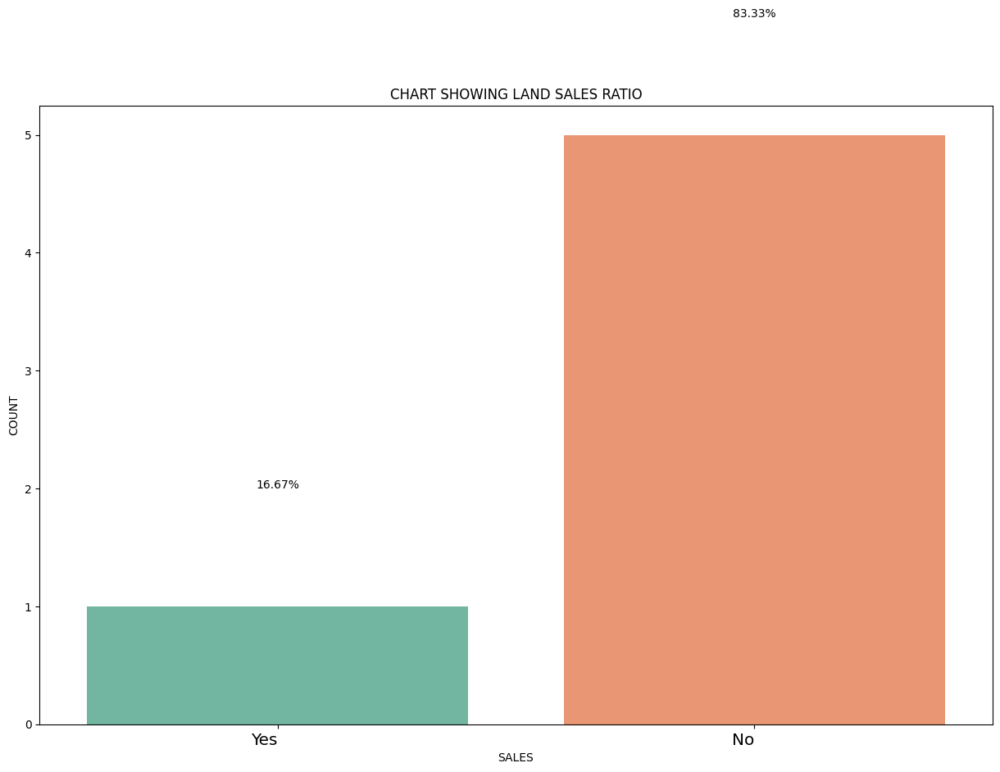

In [154]:
# Exploring the vehicles with name murati
land_data = make_report(land_df, "Land").main_prog()
land_data

### MG

In [155]:
mg_df = car_df[lambda x:x["name"] =="MG"]
mg_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
136,143,MG,2019,21000,19000,West,California,San Diego,Petrol,Dealer,Automatic,First_Owner,13.96,1451,141.0,5,Y,250.0,2600,21000.0
1930,1990,MG,2020,22800,1600,West,Oregon,Aloha,Petrol,Dealer,Automatic,First_Owner,13.96,1451,141.0,5,Y,250.0,2600,22800.0
4085,4209,MG,2019,20400,16500,East,Delaware,Dover,Petrol,Dealer,Automatic,First_Owner,13.96,1451,141.0,5,N,250.0,2600,20400.0



Year
: 2019    2
2020    1
Name: year, dtype: int64

Selling Price:
 21000    1
22800    1
20400    1
Name: selling_price, dtype: int64

KM Driven:
 19000    1
1600     1
16500    1
Name: km_driven, dtype: int64

Region report:
 West    2
East    1
Name: Region, dtype: int64

City:
 San Diego    1
Aloha        1
Dover        1
Name: City, dtype: int64

State o Province:
 California    1
Oregon        1
Delaware      1
Name: State or Province, dtype: int64

Fuel Type:
 Petrol    3
Name: fuel, dtype: int64

Seller Type:
 Dealer    3
Name: seller_type, dtype: int64

Transmission:
 Automatic    3
Name: transmission, dtype: int64

Owner:
 First_Owner    3
Name: owner, dtype: int64

Sold:
 Y    2
N    1
Name: sold, dtype: int64
Unique Value:
 ['Y' 'N'] 

 Mode Value:
 0    Y
Name: sold, dtype: object 

 Count of Unique Values:
 Y    2
N    1
Name: sold, dtype: int64 

 Description of the Series:
 count     3
unique    2
top       Y
freq      2
Name: sold, dtype: object 

 Sum of null rows:


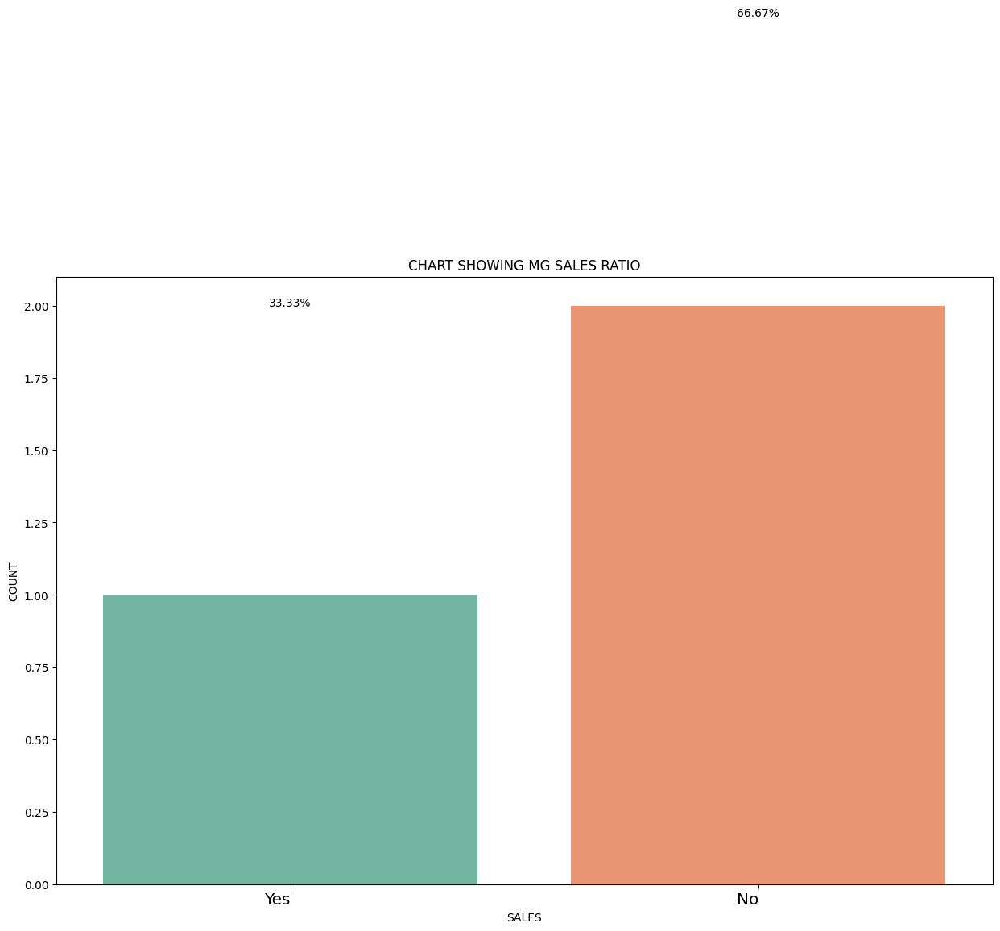

In [156]:
# Exploring the vehicles with name murati
mg_data = make_report(mg_df, "MG").main_prog()
mg_data

### Volvo

In [157]:
volvo_df = car_df[lambda x:x["name"] =="Volvo"]
volvo_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
139,146,Volvo,2018,40800,22000,East,District of Columbia,Washington,Diesel,Dealer,Automatic,First_Owner,18.0,1969,190.0,5,Y,400.0,2212,40800.0
164,171,Volvo,2017,120000,30000,East,New York,New York City,Petrol,Individual,Automatic,First_Owner,42.0,1969,400.0,4,Y,640.0,1740,120000.0
361,375,Volvo,2019,45600,20000,Central,Michigan,Detroit,Diesel,Individual,Automatic,First_Owner,18.0,1969,190.0,5,Y,400.0,2212,45600.0
375,389,Volvo,2018,29700,2000,Central,Michigan,Detroit,Diesel,Dealer,Automatic,First_Owner,16.8,1984,150.0,5,Y,350.0,2125,29700.0
399,414,Volvo,2019,45600,20000,West,California,Los Angeles,Diesel,Individual,Automatic,First_Owner,18.0,1969,190.0,5,Y,400.0,2212,45600.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6784,6978,Volvo,2018,29700,2000,Central,Michigan,Roseville,Diesel,Dealer,Automatic,First_Owner,16.8,1984,150.0,5,N,350.0,2125,29700.0
7307,7517,Volvo,2018,66000,50000,Central,Michigan,Adrian,Diesel,Individual,Automatic,First_Owner,11.2,1969,235.0,5,N,480.0,2000,66000.0
7644,7863,Volvo,2019,45600,20000,Central,Texas,Lufkin,Diesel,Individual,Automatic,First_Owner,18.0,1969,190.0,5,N,400.0,2212,45600.0
7658,7877,Volvo,2018,29700,2000,South,Mississippi,Pearl,Diesel,Dealer,Automatic,First_Owner,16.8,1984,150.0,5,N,350.0,2125,29700.0



Year
: 2018    32
2019    31
2017     1
2016     1
2013     1
2014     1
Name: year, dtype: int64

Selling Price:
 45600     30
29700     29
40800      2
66000      2
120000     1
23400      1
14400      1
30000      1
Name: selling_price, dtype: int64

KM Driven:
 20000    30
2000     29
22000     2
30000     2
48000     1
72500     1
50000     1
17000     1
Name: km_driven, dtype: int64

Region report:
 Central    23
East       17
South      17
West       10
Name: Region, dtype: int64

City:
 Washington           2
Detroit              2
Los Angeles          2
League City          1
Baton Rouge          1
Middle River         1
Fort Wayne           1
Garden City          1
Buffalo              1
Salisbury            1
Garfield Heights     1
East Point           1
Norfolk              1
Syracuse             1
Murray               1
College Park         1
Bartlesville         1
Rochester            1
Royal Palm Beach     1
Sioux Falls          1
North Haven          1
Bethel Park     

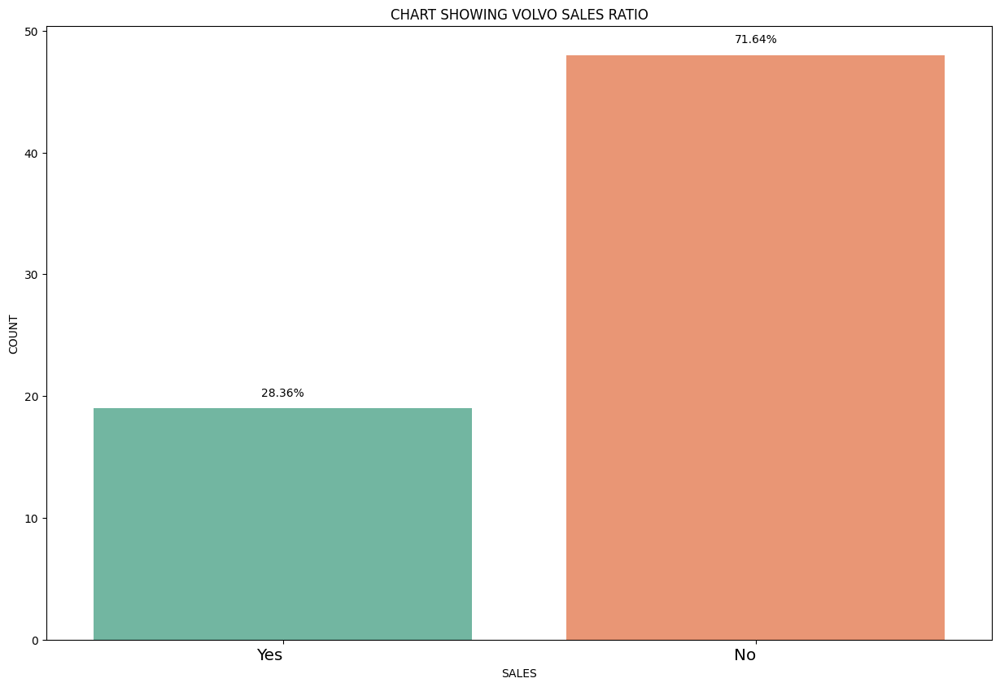

In [158]:
# Exploring the vehicles with name murati
volvo_data = make_report(volvo_df, "Volvo").main_prog()
volvo_data

### Daewoo

In [159]:
daewoo_df = car_df[lambda x:x["name"] =="Daewoo"]
daewoo_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
180,187,Daewoo,2000,1200,60000,East,Massachusetts,Boston,Petrol,Individual,Manual,First_Owner,18.5,796,53.0,5,Y,71.0,3500,1200.0
2076,2141,Daewoo,2000,1032,46951,Central,Texas,Victoria,Petrol,Individual,Manual,First_Owner,18.5,796,53.0,5,N,71.0,3500,1032.0
3913,4034,Daewoo,2001,540,137000,South,Florida,North Miami Beach,Petrol,Individual,Manual,First_Owner,18.5,796,53.0,5,N,71.0,3500,540.0



Year
: 2000    2
2001    1
Name: year, dtype: int64

Selling Price:
 1200    1
1032    1
540     1
Name: selling_price, dtype: int64

KM Driven:
 60000     1
46951     1
137000    1
Name: km_driven, dtype: int64

Region report:
 East       1
Central    1
South      1
Name: Region, dtype: int64

City:
 Boston               1
Victoria             1
North Miami Beach    1
Name: City, dtype: int64

State o Province:
 Massachusetts    1
Texas            1
Florida          1
Name: State or Province, dtype: int64

Fuel Type:
 Petrol    3
Name: fuel, dtype: int64

Seller Type:
 Individual    3
Name: seller_type, dtype: int64

Transmission:
 Manual    3
Name: transmission, dtype: int64

Owner:
 First_Owner    3
Name: owner, dtype: int64

Sold:
 N    2
Y    1
Name: sold, dtype: int64
Unique Value:
 ['Y' 'N'] 

 Mode Value:
 0    N
Name: sold, dtype: object 

 Count of Unique Values:
 N    2
Y    1
Name: sold, dtype: int64 

 Description of the Series:
 count     3
unique    2
top       N
freq  

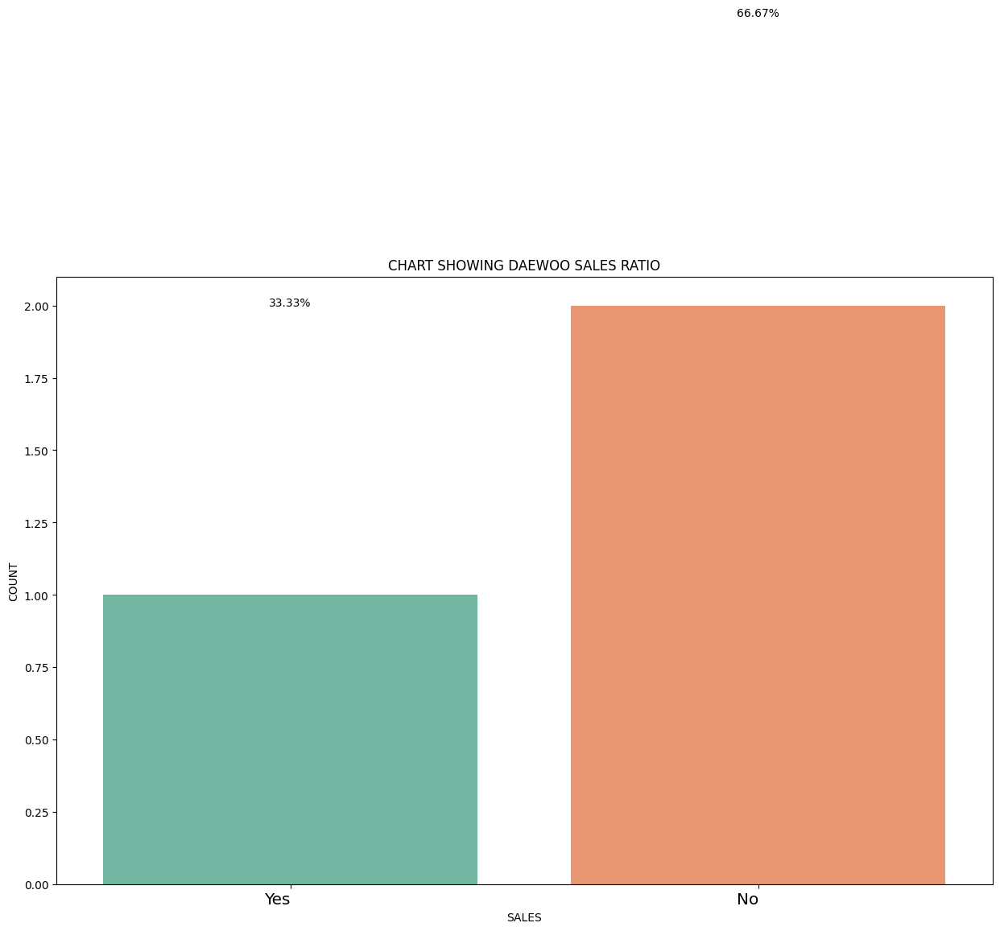

In [160]:
# Exploring the vehicles with name murati
daewoo_data = make_report(daewoo_df, "Daewoo").main_prog()
daewoo_data

### Kia

In [161]:
kia_df = car_df[lambda x:x["name"] =="Kia"]
kia_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
474,489,Kia,2019,7716,10000,South,North Carolina,Charlotte,Diesel,Individual,Manual,First_Owner,20.8,1493,113.4,5,Y,250.0,2125,7716.0
1036,1068,Kia,2020,22800,5000,Central,Iowa,Ankeny,Diesel,Dealer,Automatic,First_Owner,17.8,1493,113.4,5,Y,250.0,2125,22800.0
3974,4098,Kia,2020,22800,5000,South,Virginia,Richmond,Diesel,Dealer,Automatic,First_Owner,17.8,1493,113.4,5,N,250.0,2125,22800.0
7886,8109,Kia,2019,18900,20000,West,California,Laguna Hills,Diesel,Individual,Automatic,First_Owner,17.8,1493,113.4,5,N,250.0,2125,18900.0



Year
: 2019    2
2020    2
Name: year, dtype: int64

Selling Price:
 22800    2
7716     1
18900    1
Name: selling_price, dtype: int64

KM Driven:
 5000     2
10000    1
20000    1
Name: km_driven, dtype: int64

Region report:
 South      2
Central    1
West       1
Name: Region, dtype: int64

City:
 Charlotte       1
Ankeny          1
Richmond        1
Laguna Hills    1
Name: City, dtype: int64

State o Province:
 North Carolina    1
Iowa              1
Virginia          1
California        1
Name: State or Province, dtype: int64

Fuel Type:
 Diesel    4
Name: fuel, dtype: int64

Seller Type:
 Individual    2
Dealer        2
Name: seller_type, dtype: int64

Transmission:
 Automatic    3
Manual       1
Name: transmission, dtype: int64

Owner:
 First_Owner    4
Name: owner, dtype: int64

Sold:
 Y    2
N    2
Name: sold, dtype: int64
Unique Value:
 ['Y' 'N'] 

 Mode Value:
 0    N
1    Y
Name: sold, dtype: object 

 Count of Unique Values:
 Y    2
N    2
Name: sold, dtype: int64 

 Des

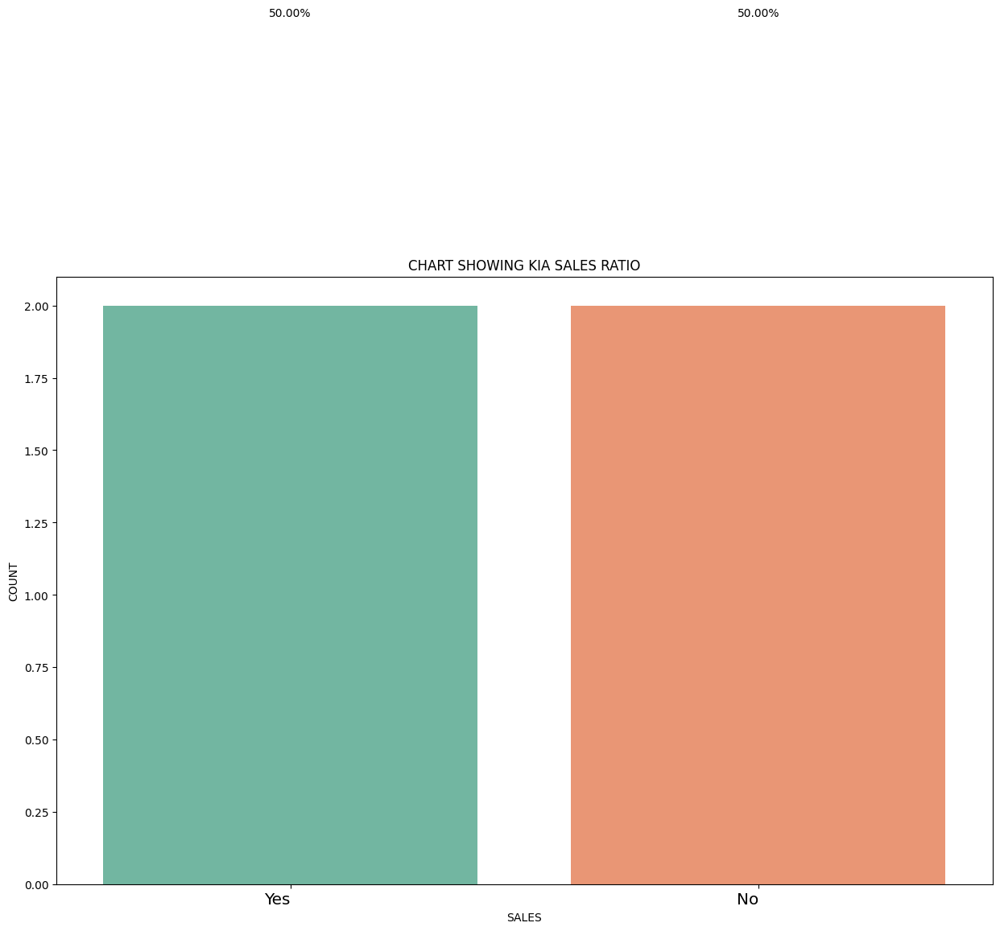

In [162]:
# Exploring the vehicles with name murati
kia_data = make_report(kia_df, "Kia").main_prog()
kia_data

### Fiat

In [163]:
fiat_df = car_df[lambda x:x["name"] =="Fiat"]
fiat_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
650,670,Fiat,2013,4800,90000,South,Florida,Miami,Diesel,Individual,Manual,First_Owner,20.3,1248,92.00,5,Y,209.0,2000,4800.0
741,767,Fiat,2010,2400,80000,East,New York,New York City,Diesel,Individual,Manual,Second_Owner,20.4,1248,91.20,5,Y,209.0,2000,2400.0
1257,1296,Fiat,2011,3360,200000,West,Oregon,West Linn,Diesel,Individual,Manual,First_Owner,20.5,1248,91.70,5,Y,209.0,2000,3360.0
1365,1409,Fiat,2010,2280,178000,Central,Texas,Cedar Hill,Diesel,Individual,Manual,Second_Owner,20.4,1248,91.70,5,Y,209.0,2000,2280.0
1442,1489,Fiat,2014,3900,142500,East,New York,Dix Hills,Diesel,Individual,Manual,First_Owner,19.5,1248,75.00,5,Y,197.0,1750,3900.0
1632,1683,Fiat,2015,8400,20000,East,Pennsylvania,Hanover,Diesel,Individual,Manual,First_Owner,20.4,1248,91.70,5,Y,209.0,2000,8400.0
2038,2100,Fiat,2015,3600,95000,East,Ohio,Sandusky,Diesel,Individual,Manual,Third_Owner,21.2,1248,75.00,5,N,197.0,1750,3600.0
2133,2200,Fiat,2013,3360,52000,Central,Kansas,Shawnee,Diesel,Individual,Manual,First_Owner,20.3,1248,75.00,5,N,197.0,1750,3360.0
2249,2323,Fiat,2011,3000,30000,Central,Missouri,Ferguson,Diesel,Individual,Manual,First_Owner,20.4,1248,91.20,5,N,209.0,2000,3000.0
2449,2533,Fiat,2014,3840,39395,East,New Jersey,Westfield,Diesel,Individual,Manual,First_Owner,21.2,1248,75.00,5,N,197.0,1750,3840.0



Year
: 2015    11
2010     6
2013     5
2011     5
2009     4
2012     4
2014     3
2016     3
Name: year, dtype: int64

Selling Price:
 3600    5
1800    3
3360    3
3000    2
6000    2
3180    2
4320    2
5400    2
8400    2
4200    1
1200    1
4500    1
3300    1
2640    1
3059    1
5519    1
3420    1
4800    1
6600    1
2040    1
5100    1
2400    1
1680    1
3840    1
3900    1
2280    1
1500    1
Name: selling_price, dtype: int64

KM Driven:
 60000     5
100000    4
70000     3
110000    2
20000     2
55000     2
96500     2
67000     2
33003     1
61000     1
82500     1
117000    1
133000    1
77000     1
120000    1
90000     1
80000     1
47000     1
185000    1
39395     1
30000     1
52000     1
95000     1
142500    1
178000    1
200000    1
40000     1
Name: km_driven, dtype: int64

Region report:
 Central    17
East       12
West        7
South       5
Name: Region, dtype: int64

City:
 Miami            1
Weslaco          1
Lynchburg        1
Middle River     1
Palm Sp

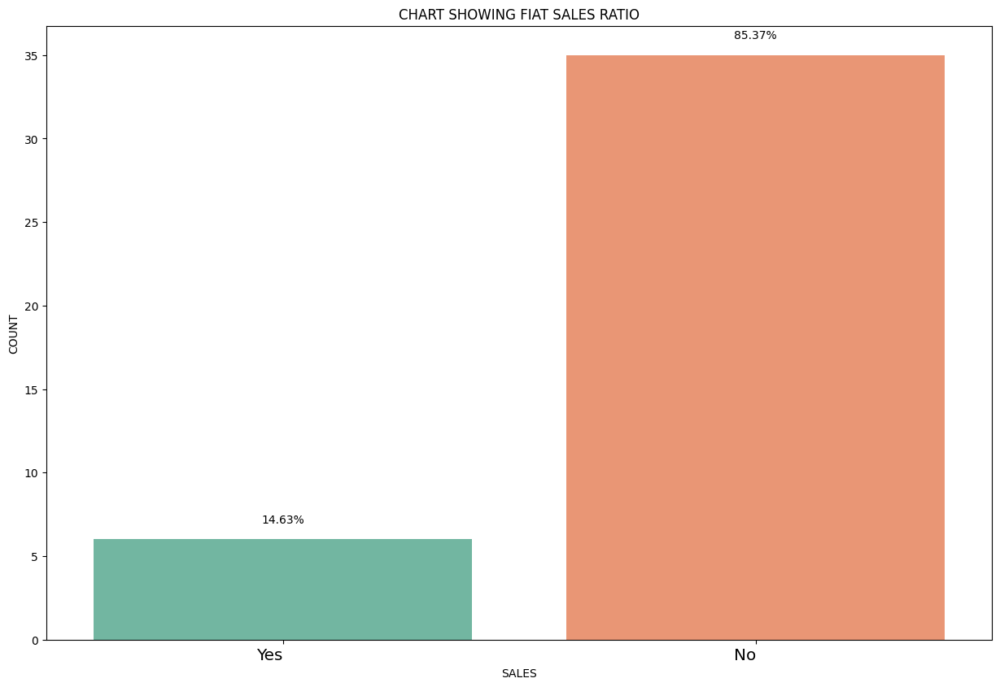

In [164]:
# Exploring the vehicles with name murati
fiat_data = make_report(fiat_df, "Fiat").main_prog()
fiat_data

### Force

In [165]:
force_df = car_df[lambda x:x["name"] =="Force"]
force_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
1923,1983,Force,2018,10920,20000,Central,Indiana,Merrillville,Diesel,Dealer,Manual,First_Owner,17.0,2596,80.80,5,Y,230.0,1900,10920.0
2541,2628,Force,2018,12600,13000,West,Utah,Springville,Diesel,Individual,Manual,First_Owner,17.0,2200,139.01,7,N,321.0,2000,12600.0
3573,3688,Force,2018,12600,13000,East,Ohio,Reynoldsburg,Diesel,Individual,Manual,First_Owner,17.0,2200,139.01,7,N,321.0,2000,12600.0
4517,4652,Force,2018,10200,120000,South,Alabama,Opelika,Diesel,Individual,Manual,Second_Owner,17.0,2650,80.84,7,N,230.0,1900,10200.0
4745,4883,Force,2014,6660,147279,Central,Illinois,Romeoville,Diesel,Individual,Manual,Second_Owner,17.0,2200,139.01,7,N,321.0,2000,6660.0
7140,7342,Force,2018,10920,20000,West,Idaho,Eagle,Diesel,Dealer,Manual,First_Owner,17.0,2596,80.80,5,N,230.0,1900,10920.0



Year
: 2018    5
2014    1
Name: year, dtype: int64

Selling Price:
 10920    2
12600    2
10200    1
6660     1
Name: selling_price, dtype: int64

KM Driven:
 20000     2
13000     2
120000    1
147279    1
Name: km_driven, dtype: int64

Region report:
 Central    2
West       2
East       1
South      1
Name: Region, dtype: int64

City:
 Merrillville    1
Springville     1
Reynoldsburg    1
Opelika         1
Romeoville      1
Eagle           1
Name: City, dtype: int64

State o Province:
 Indiana     1
Utah        1
Ohio        1
Alabama     1
Illinois    1
Idaho       1
Name: State or Province, dtype: int64

Fuel Type:
 Diesel    6
Name: fuel, dtype: int64

Seller Type:
 Individual    4
Dealer        2
Name: seller_type, dtype: int64

Transmission:
 Manual    6
Name: transmission, dtype: int64

Owner:
 First_Owner     4
Second_Owner    2
Name: owner, dtype: int64

Sold:
 N    5
Y    1
Name: sold, dtype: int64
Unique Value:
 ['Y' 'N'] 

 Mode Value:
 0    N
Name: sold, dtype: object 

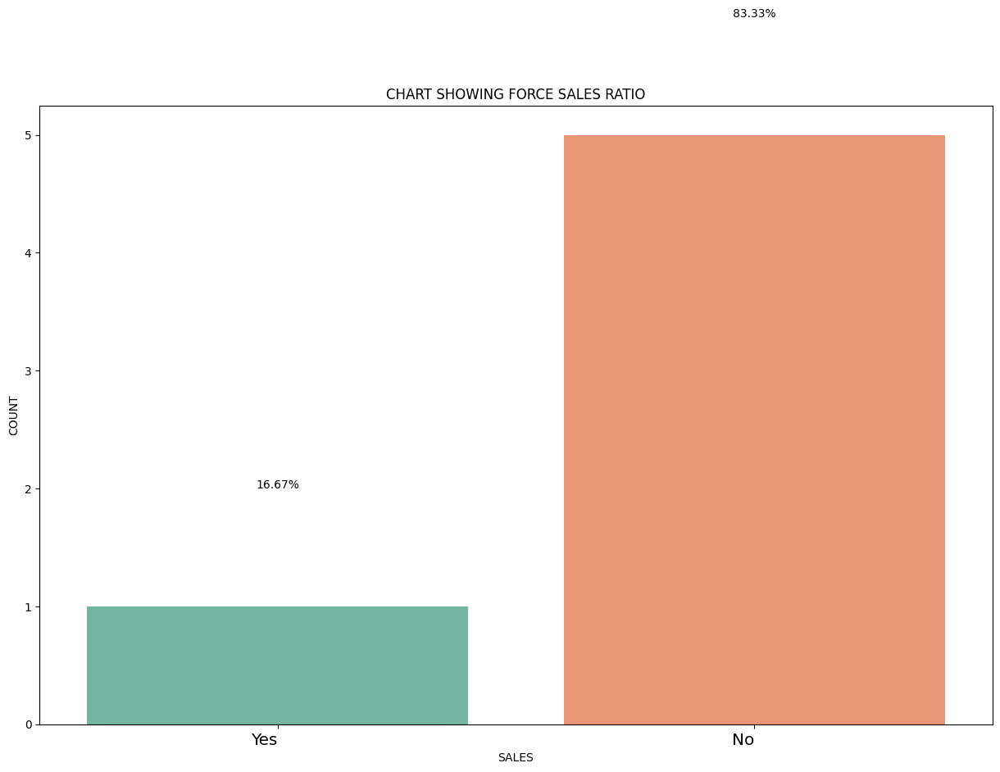

In [166]:
# Exploring the vehicles with name murati
force_data = make_report(force_df, "Force").main_prog()
force_data

### Ambassador

In [167]:
ambassador_df = car_df[lambda x:x["name"] =="Ambassador"]
ambassador_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
3275,3379,Ambassador,2000,900,90000,South,Virginia,Arlington,Diesel,Individual,Manual,Second_Owner,12.8,1489,35.5,5,N,72.9,2250,900.0
4577,4713,Ambassador,1994,1188,100000,South,Georgia,Peachtree City,Diesel,Individual,Manual,Second_Owner,12.8,1995,52.0,5,N,106.0,2200,1188.0
4834,4975,Ambassador,2008,1464,60000,West,Washington,Anacortes,Diesel,Individual,Manual,Second_Owner,12.8,1995,52.0,5,N,106.0,2200,1464.0
7678,7897,Ambassador,2008,2400,80000,Central,Indiana,Lafayette,Diesel,Individual,Manual,Third_Owner,13.5,1995,52.0,5,N,106.0,2200,2400.0


In [168]:
# Exploring the vehicles with name murati
ambassador_data = make_report(ambassador_df, "Ambassador").main_prog()
ambassador_data


Year
: 2008    2
2000    1
1994    1
Name: year, dtype: int64

Selling Price:
 900     1
1188    1
1464    1
2400    1
Name: selling_price, dtype: int64

KM Driven:
 90000     1
100000    1
60000     1
80000     1
Name: km_driven, dtype: int64

Region report:
 South      2
West       1
Central    1
Name: Region, dtype: int64

City:
 Arlington         1
Peachtree City    1
Anacortes         1
Lafayette         1
Name: City, dtype: int64

State o Province:
 Virginia      1
Georgia       1
Washington    1
Indiana       1
Name: State or Province, dtype: int64

Fuel Type:
 Diesel    4
Name: fuel, dtype: int64

Seller Type:
 Individual    4
Name: seller_type, dtype: int64

Transmission:
 Manual    4
Name: transmission, dtype: int64

Owner:
 Second_Owner    3
Third_Owner     1
Name: owner, dtype: int64

Sold:
 N    4
Name: sold, dtype: int64


### Ashok

In [169]:
ashok_df = car_df[lambda x:x["name"] =="Ashok"]
ashok_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
3891,4012,Ashok,2013,3600,200000,South,North Carolina,Jacksonville,Diesel,Individual,Manual,Second_Owner,20.07,1461,75.0,8,N,185.0,2250,3600.0


In [170]:
# Exploring the vehicles with name murati
ashok_data = make_report(ashok_df, "Ashok").main_prog()
ashok_data


Year
: 2013    1
Name: year, dtype: int64

Selling Price:
 3600    1
Name: selling_price, dtype: int64

KM Driven:
 200000    1
Name: km_driven, dtype: int64

Region report:
 South    1
Name: Region, dtype: int64

City:
 Jacksonville    1
Name: City, dtype: int64

State o Province:
 North Carolina    1
Name: State or Province, dtype: int64

Fuel Type:
 Diesel    1
Name: fuel, dtype: int64

Seller Type:
 Individual    1
Name: seller_type, dtype: int64

Transmission:
 Manual    1
Name: transmission, dtype: int64

Owner:
 Second_Owner    1
Name: owner, dtype: int64

Sold:
 N    1
Name: sold, dtype: int64


### Isuzu

In [171]:
isuzu_df = car_df[lambda x:x["name"] =="Isuzu"]
isuzu_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
4073,4197,Isuzu,2019,32400,10000,East,New York,Franklin Square,Diesel,Individual,Automatic,First_Owner,13.80,2999,174.57,7,N,380.0,2300,32400.0
4268,4396,Isuzu,2019,32400,10000,West,California,Santa Clara,Diesel,Individual,Automatic,First_Owner,13.80,2999,174.57,7,N,380.0,2300,32400.0
5670,5837,Isuzu,2019,22800,30000,East,New Jersey,Elmwood Park,Diesel,Individual,Automatic,First_Owner,12.40,1999,147.90,5,N,350.0,2200,22800.0
7135,7337,Isuzu,2016,13920,121000,West,Idaho,Eagle,Diesel,Dealer,Automatic,First_Owner,12.08,2999,161.00,7,N,333.0,2400,13920.0
7529,7747,Isuzu,2017,15000,56800,West,Arizona,Prescott,Diesel,Individual,Manual,First_Owner,12.40,2499,134.00,5,N,320.0,2300,15000.0


In [172]:
# Exploring the vehicles with name murati
isuzu_data = make_report(isuzu_df, "Isuzu").main_prog()
isuzu_data


Year
: 2019    3
2016    1
2017    1
Name: year, dtype: int64

Selling Price:
 32400    2
22800    1
13920    1
15000    1
Name: selling_price, dtype: int64

KM Driven:
 10000     2
30000     1
121000    1
56800     1
Name: km_driven, dtype: int64

Region report:
 West    3
East    2
Name: Region, dtype: int64

City:
 Franklin Square    1
Santa Clara        1
Elmwood Park       1
Eagle              1
Prescott           1
Name: City, dtype: int64

State o Province:
 New York      1
California    1
New Jersey    1
Idaho         1
Arizona       1
Name: State or Province, dtype: int64

Fuel Type:
 Diesel    5
Name: fuel, dtype: int64

Seller Type:
 Individual    4
Dealer        1
Name: seller_type, dtype: int64

Transmission:
 Automatic    4
Manual       1
Name: transmission, dtype: int64

Owner:
 First_Owner    5
Name: owner, dtype: int64

Sold:
 N    5
Name: sold, dtype: int64


### Opel

In [173]:
opel_df = car_df[lambda x:x["name"] =="Opel"]
opel_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
4245,4373,Opel,1998,816,110000,West,Washington,Bellevue,Petrol,Individual,Manual,Third_Owner,13.1,1598,77.0,5,N,121.0,2800,816.0


In [174]:
# Exploring the vehicles with name murati
opel_data = make_report(opel_df, "Opel").main_prog()
opel_data


Year
: 1998    1
Name: year, dtype: int64

Selling Price:
 816    1
Name: selling_price, dtype: int64

KM Driven:
 110000    1
Name: km_driven, dtype: int64

Region report:
 West    1
Name: Region, dtype: int64

City:
 Bellevue    1
Name: City, dtype: int64

State o Province:
 Washington    1
Name: State or Province, dtype: int64

Fuel Type:
 Petrol    1
Name: fuel, dtype: int64

Seller Type:
 Individual    1
Name: seller_type, dtype: int64

Transmission:
 Manual    1
Name: transmission, dtype: int64

Owner:
 Third_Owner    1
Name: owner, dtype: int64

Sold:
 N    1
Name: sold, dtype: int64


### Sold and Not Sold Analysis

In [175]:
# Function to write percentage value on patches
def with_hue(plot_axes, df, col_name, unique_values, number_of_categories, hue_categories):
    inc = 0
    a = [p.get_height() for p in plot_axes.patches]
    patch = [p for p in plot_axes.patches]
    for i in unique_values:
        total = len(df[lambda x:x[col_name] == i])
        for j in range(hue_categories):
            percentage = '{:.1f}%'.format(100 * a[(j*number_of_categories + inc)]/total)
            x = patch[(j*number_of_categories + inc)].get_x() + patch[(j*number_of_categories + inc)].get_width() / 2 - 0.15
            y = patch[(j*number_of_categories + inc)].get_y() + patch[(j*number_of_categories + inc)].get_height() 
            plot_axes.annotate(percentage, (x, y), size = 12)
        inc+=1
        
def without_hue(plot_axes, df, col_name):
    total = len(df[col_name])
    for p in plot_axes.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        plot_axes.annotate(percentage, (x, y), size = 12)

In [176]:
# function to explore combined columns of sold and not sold targets
def column_comb_explore(col_name,df=car_df,sold_checker=0, hue_checker = 0): 
    try:
        if sold_checker == 0:
            title = ("CHART SHOWING "+col_name+" OF CARS SOLD AND NOT SOLD").upper()

            sold_status_plot = plt.figure(figsize=(15,10), dpi = 100 )
            sold_status_chart = sns.countplot(data=df, x= col_name, palette='Set2', hue="sold" )
            sold_status_chart.set_xticklabels(sold_status_chart.get_xticklabels(), rotation=45, horizontalalignment='right',fontweight='light', fontsize='x-large')
            sold_status_chart.set(xlabel=col_name, ylabel='COUNT')
            plt.title(title)
            if hue_checker == 0:
                with_hue(sold_status_chart, df, col_name, df[col_name].unique(), len(df[col_name].unique()), 2)
            if hue_checker == 1:
                without_hue(sold_status_chart, df, col_name)
            plt.show()
            result = sold_status_plot
        elif sold_checker == 1:
            result = [sold_cars_df, not_sold_cars_df]  # Sold cars is first index and not sold is second index.
    except:
        result = print("The dataframe you passed in is not valid for this operation.")

    return result

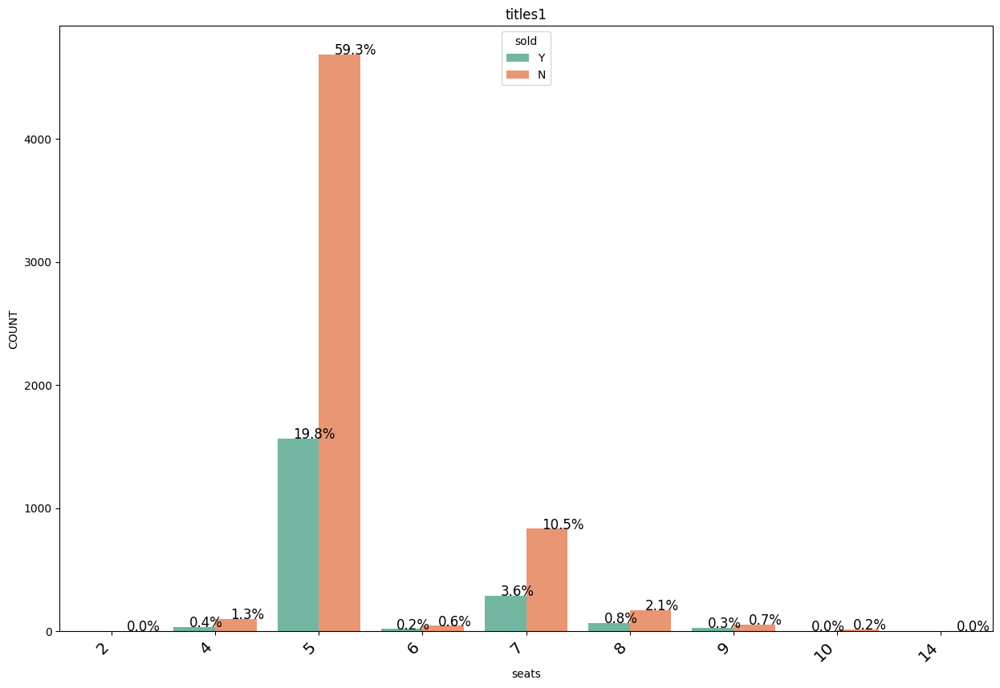

In [177]:
sold_status_plot = plt.figure(figsize=(15,10), dpi = 100 )
sold_status_chart = sns.countplot(data=car_df, x= "seats", palette='Set2', hue="sold" )
sold_status_chart.set_xticklabels(sold_status_chart.get_xticklabels(), rotation=45, horizontalalignment='right',fontweight='light', fontsize='x-large')
sold_status_chart.set(xlabel="seats", ylabel='COUNT')
plt.title("titles1")
#with_hue(sold_status_chart,car_df,"seats",sorted(car_df.seller_type.unique()[0:7]),len(car_df.seller_type.unique()[0:5]), 2)
without_hue(sold_status_chart,car_df,"seats")
plt.show()

In [178]:
#column_comb_explore("seats")
sorted(car_df.seats.unique()[0:9])

[2, 4, 5, 6, 7, 8, 9, 10, 14]

In [179]:
# function to explore columns
def column_explore(col_name,df=car_df,sold_checker=0): 
    try:
        # Splitting sold and not sold dataframe
        sold_cars_df = df[lambda x: x.sold == "Y"]
        not_sold_cars_df = df[lambda x: x.sold == "N"]
        if sold_checker == 0:
            titles1 = ("CHART SHOWING "+col_name+" OF CARS SOLD").upper()
            titles2 = ("CHART SHOWING "+col_name+" OF CARS NOT SOLD").upper()

            sold_status_plot = plt.figure(figsize=(15,10), dpi = 100 )
            plt.subplot(1, 2, 1)
            sold_status_chart = sns.countplot(data=sold_cars_df, x= col_name, palette='Set2' )
            sold_status_chart.set_xticklabels(sold_status_chart.get_xticklabels(), rotation=45, horizontalalignment='right',fontweight='light', fontsize='x-large')
            sold_status_chart.set(xlabel=col_name, ylabel='COUNT')
            plt.title(titles1)
            for p in sold_status_chart.patches:
                height = p.get_height()
                sold_status_chart.text(p.get_x()+p.get_width()/2., height + 1, "{:1.2f}".format((height/len(sold_cars_df))*100) + "%", ha="center")  
            plt.subplot(1, 2, 2)
            sold_status_chart = sns.countplot(data=not_sold_cars_df, x= col_name, palette='Set2' )
            sold_status_chart.set_xticklabels(sold_status_chart.get_xticklabels(), rotation=45, horizontalalignment='right',fontweight='light', fontsize='x-large')
            sold_status_chart.set(xlabel=col_name, ylabel='COUNT')
            plt.title(titles2)
            for p in sold_status_chart.patches:
                height = p.get_height()
                sold_status_chart.text(p.get_x()+p.get_width()/2., height + 1, "{:1.2f}".format((height/len(not_sold_cars_df))*100) + "%", ha="center")  
            plt.show()

            result = sold_status_plot
        elif sold_checker == 1:
            result = [sold_cars_df, not_sold_cars_df]  # Sold cars is first index and not sold is second index.
    except:
        result = print("The dataframe you passed in is not valid for this operation. \nUse the car or not sold dataframe")

    return result

In [180]:
# function to explore combined columns of sold and not sold targets
"""
def column_comb_explore(col_name,df=car_df,sold_checker=0): 
    try:
        if sold_checker == 0:
            titles1 = ("CHART SHOWING "+col_name+" OF CARS SOLD").upper()
            titles2 = ("CHART SHOWING "+col_name+" OF CARS NOT SOLD").upper()

            sold_status_plot = plt.figure(figsize=(15,10), dpi = 100 )
            sold_status_chart = sns.countplot(data=df, x= col_name, palette='Set2', hue="sold" )
            sold_status_chart.set_xticklabels(sold_status_chart.get_xticklabels(), rotation=45, horizontalalignment='right',fontweight='light', fontsize='x-large')
            sold_status_chart.set(xlabel=col_name, ylabel='COUNT')
            plt.title(titles1)
            a = [p.get_height() for p in sold_status_chart.patches]
            patch = [p for p in sold_status_chart.patches]
            for i in range(len(df[col_name].unique())):
                total = df[col_name].value_counts().values[i]
                for j in range(len(df["sold"].unique())):
                    percentage = '{:.1f}%'.format(100 * a[(j*len(df[col_name].unique() + i))]/total)
                    x = patch[(j*len(df[col_name].unique() + i))].get_x() + patch[(j*len(df[col_name].unique() + i))].get_width() / 2 - 0.15
                    y = patch[(j*len(df[col_name].unique() + i))].get_y() + patch[(j*len(df[col_name].unique() + i))].get_height() 
                    ax.annotate(percentage, (x, y), size = 12)
            result = sold_status_plot
        elif sold_checker == 1:
            result = [sold_cars_df, not_sold_cars_df]  # Sold cars is first index and not sold is second index.
    except:
        result = print("The dataframe you passed in is not valid for this operation.")

    return result
"""

'\ndef column_comb_explore(col_name,df=car_df,sold_checker=0): \n    try:\n        if sold_checker == 0:\n            titles1 = ("CHART SHOWING "+col_name+" OF CARS SOLD").upper()\n            titles2 = ("CHART SHOWING "+col_name+" OF CARS NOT SOLD").upper()\n\n            sold_status_plot = plt.figure(figsize=(15,10), dpi = 100 )\n            sold_status_chart = sns.countplot(data=df, x= col_name, palette=\'Set2\', hue="sold" )\n            sold_status_chart.set_xticklabels(sold_status_chart.get_xticklabels(), rotation=45, horizontalalignment=\'right\',fontweight=\'light\', fontsize=\'x-large\')\n            sold_status_chart.set(xlabel=col_name, ylabel=\'COUNT\')\n            plt.title(titles1)\n            a = [p.get_height() for p in sold_status_chart.patches]\n            patch = [p for p in sold_status_chart.patches]\n            for i in range(len(df[col_name].unique())):\n                total = df[col_name].value_counts().values[i]\n                for j in range(len(df["sold"

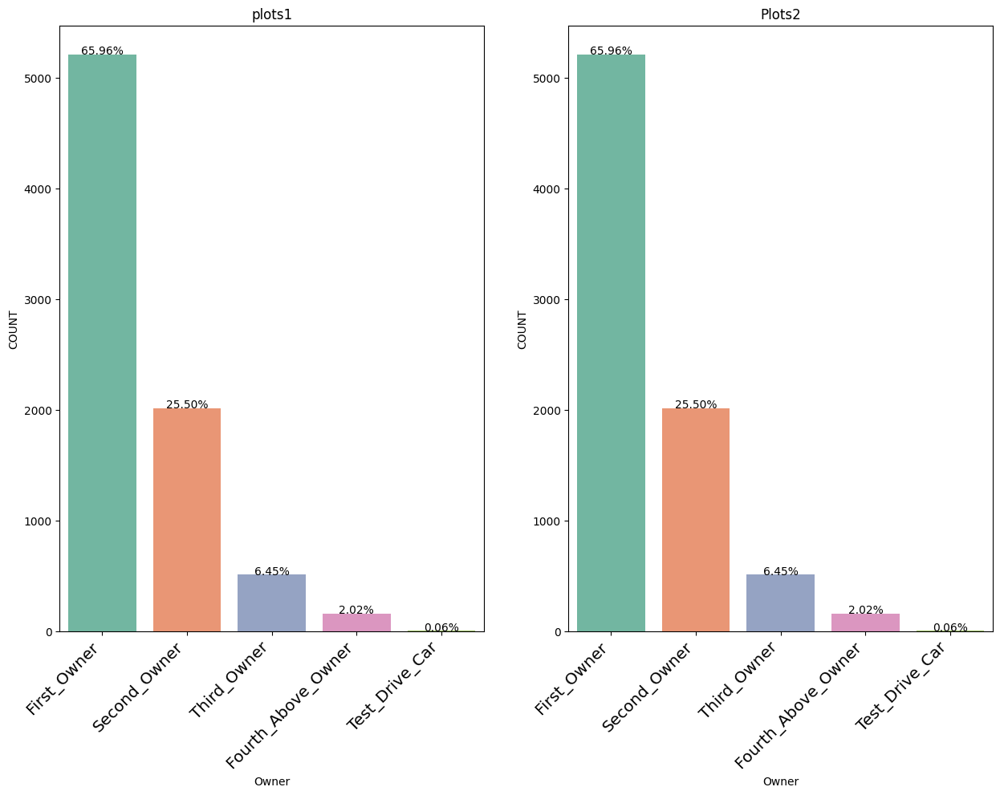

In [181]:
sold_status_plot = plt.figure(figsize=(15,10), dpi = 100 )
plt.subplot(1, 2, 1)
sold_status_chart = sns.countplot(data=car_df, x= "owner", palette='Set2' )
sold_status_chart.set_xticklabels(sold_status_chart.get_xticklabels(), rotation=45, horizontalalignment='right',fontweight='light', fontsize='x-large')
sold_status_chart.set(xlabel="Owner", ylabel='COUNT')
plt.title("plots1")
for p in sold_status_chart.patches:
    height = p.get_height()
    sold_status_chart.text(p.get_x()+p.get_width()/2., height + 1, "{:1.2f}".format((height/len(car_df))*100) + "%", ha="center")  
plt.subplot(1, 2, 2)
sold_status_chart = sns.countplot(data=car_df, x= "owner", palette='Set2' )
sold_status_chart.set_xticklabels(sold_status_chart.get_xticklabels(), rotation=45, horizontalalignment='right',fontweight='light', fontsize='x-large')
sold_status_chart.set(xlabel="Owner", ylabel='COUNT')
plt.title("Plots2")
for p in sold_status_chart.patches:
    height = p.get_height()
    sold_status_chart.text(p.get_x()+p.get_width()/2., height + 1, "{:1.2f}".format((height/len(car_df))*100) + "%", ha="center")  
    
plt.show()

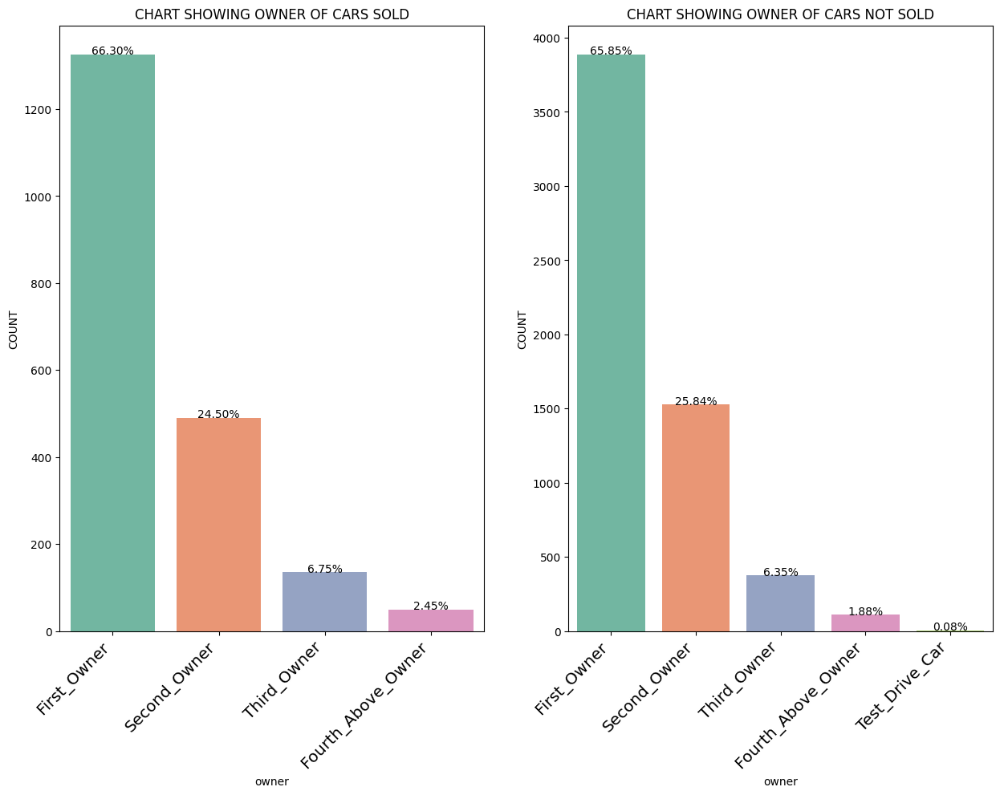

In [182]:
# Exploring the owner series
owner_col_expl = column_explore("owner")
#Owner_explored_not_sold = column_explore("owner", 1)

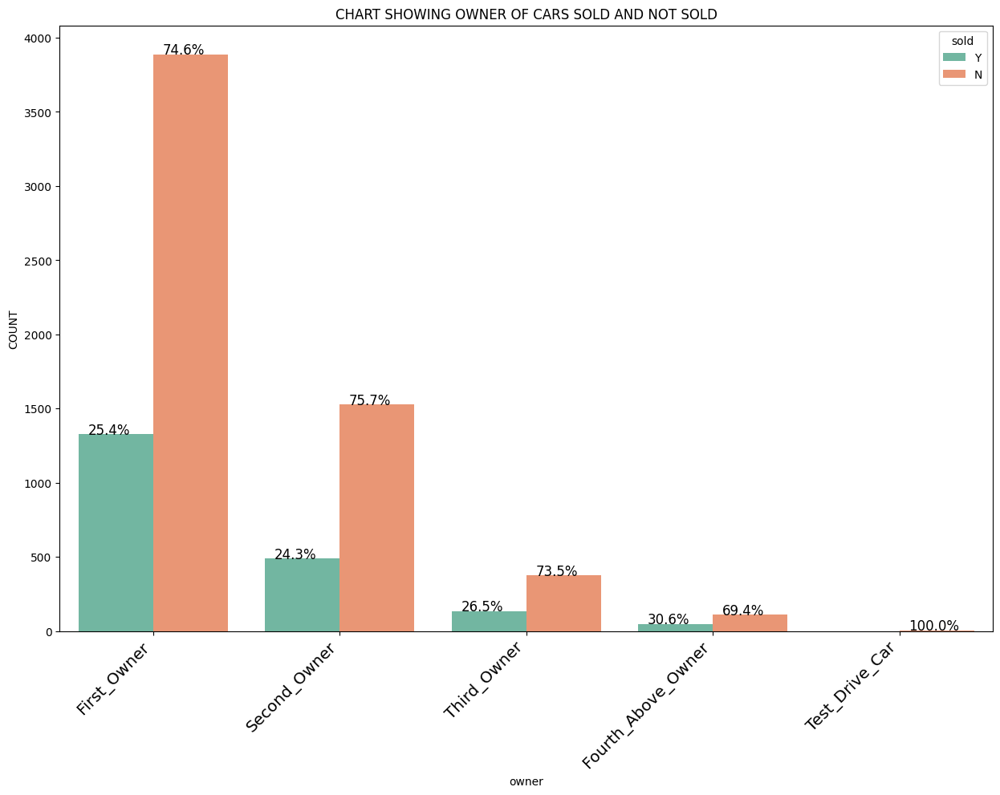

In [183]:
owner_col_expl_ver2= column_comb_explore("owner")

In [184]:
# Looking more into fourth_above_owner
fourth_owner = car_df[lambda x: x.owner == "Fourth_Above_Owner"]
fourth_owner 

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
118,124,Maruti,2012,4440,175000,South,North Carolina,Charlotte,Diesel,Individual,Manual,Fourth_Above_Owner,19.30,1248,73.90,5,Y,190.0,2000,4440.0
121,127,Maruti,2008,1260,65000,East,Massachusetts,Boston,Petrol,Individual,Manual,Fourth_Above_Owner,19.70,796,46.30,5,Y,62.0,3000,1260.0
265,276,Hyundai,2015,6000,70000,West,California,San Diego,Diesel,Individual,Manual,Fourth_Above_Owner,22.54,1396,88.73,5,Y,219.7,2125,6000.0
315,328,Hyundai,2010,3059,80000,Central,Illinois,Chicago,Petrol,Individual,Manual,Fourth_Above_Owner,17.00,1197,80.00,5,Y,140.0,4000,3059.0
316,329,Maruti,2003,780,60000,Central,Illinois,Chicago,Petrol,Individual,Manual,Fourth_Above_Owner,17.30,993,60.00,5,Y,78.0,4500,780.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7698,7917,Hyundai,2014,7200,100000,South,Tennessee,Bristol,Diesel,Individual,Manual,Fourth_Above_Owner,22.54,1396,88.73,5,N,219.7,2125,7200.0
7797,8018,Tata,2008,720,120000,Central,Texas,Coppell,Diesel,Individual,Manual,Fourth_Above_Owner,17.88,1396,52.80,5,N,85.0,2500,720.0
7821,8042,Maruti,2007,1080,110000,East,Ohio,Lima,Petrol,Individual,Manual,Fourth_Above_Owner,18.90,1061,67.00,5,N,84.0,3500,1080.0
7847,8068,Mahindra,2011,4320,100000,West,New Mexico,Alamogordo,Diesel,Individual,Manual,Fourth_Above_Owner,13.50,2179,115.00,5,N,277.5,1950,4320.0


In [185]:
# Function to return if sold Y or not sold N 
fourth_owner_col_expl = column_explore(_, fourth_owner, 1)

# Index 0 is for sold
fourth_owner_col_expl[0] 

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
118,124,Maruti,2012,4440,175000,South,North Carolina,Charlotte,Diesel,Individual,Manual,Fourth_Above_Owner,19.30,1248,73.90,5,Y,190.0,2000,4440.0
121,127,Maruti,2008,1260,65000,East,Massachusetts,Boston,Petrol,Individual,Manual,Fourth_Above_Owner,19.70,796,46.30,5,Y,62.0,3000,1260.0
265,276,Hyundai,2015,6000,70000,West,California,San Diego,Diesel,Individual,Manual,Fourth_Above_Owner,22.54,1396,88.73,5,Y,219.7,2125,6000.0
315,328,Hyundai,2010,3059,80000,Central,Illinois,Chicago,Petrol,Individual,Manual,Fourth_Above_Owner,17.00,1197,80.00,5,Y,140.0,4000,3059.0
316,329,Maruti,2003,780,60000,Central,Illinois,Chicago,Petrol,Individual,Manual,Fourth_Above_Owner,17.30,993,60.00,5,Y,78.0,4500,780.0
321,334,Maruti,2002,720,100000,West,California,San Diego,Petrol,Individual,Manual,Fourth_Above_Owner,17.30,993,60.00,5,Y,78.0,4500,720.0
324,338,Maruti,2005,1020,80000,Central,Texas,Dallas,Petrol,Individual,Manual,Fourth_Above_Owner,19.70,796,46.30,5,Y,62.0,3000,1020.0
325,339,Maruti,2011,3180,90000,East,New York,New York City,Diesel,Individual,Manual,Fourth_Above_Owner,19.30,1248,73.90,5,Y,190.0,2000,3180.0
346,360,Toyota,2008,3900,80000,East,Pennsylvania,Philadelphia,Diesel,Individual,Manual,Fourth_Above_Owner,12.80,2494,102.00,7,Y,140.0,2400,3900.0
354,368,Hyundai,2010,1680,70000,East,New York,New York City,Petrol,Individual,Manual,Fourth_Above_Owner,20.36,1197,78.90,5,Y,111.7,4000,1680.0


In [186]:
# Index 1 is for not sold
fourth_owner_col_expl[1]

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
2039,2101,Maruti,2008,3000,70000,East,Ohio,Sandusky,Petrol,Individual,Manual,Fourth_Above_Owner,17.50,1298,85.80,5,N,114.0,4000,3000.0
2051,2115,Maruti,2004,900,46000,Central,Illinois,Pekin,Petrol,Individual,Manual,Fourth_Above_Owner,16.10,796,37.00,4,N,59.0,2500,900.0
2059,2123,Chevrolet,2009,960,80000,East,Maine,Auburn,Petrol,Individual,Manual,Fourth_Above_Owner,18.00,995,62.00,5,N,90.3,4200,960.0
2101,2167,Maruti,2010,2400,40000,West,California,San Gabriel,LPG,Individual,Manual,Fourth_Above_Owner,17.30,1061,57.50,5,N,140.0,4500,2400.0
2115,2181,Maruti,2009,1500,120000,Central,Missouri,Kirkwood,Petrol,Individual,Manual,Fourth_Above_Owner,18.90,1061,67.00,5,N,84.0,3500,1500.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7698,7917,Hyundai,2014,7200,100000,South,Tennessee,Bristol,Diesel,Individual,Manual,Fourth_Above_Owner,22.54,1396,88.73,5,N,219.7,2125,7200.0
7797,8018,Tata,2008,720,120000,Central,Texas,Coppell,Diesel,Individual,Manual,Fourth_Above_Owner,17.88,1396,52.80,5,N,85.0,2500,720.0
7821,8042,Maruti,2007,1080,110000,East,Ohio,Lima,Petrol,Individual,Manual,Fourth_Above_Owner,18.90,1061,67.00,5,N,84.0,3500,1080.0
7847,8068,Mahindra,2011,4320,100000,West,New Mexico,Alamogordo,Diesel,Individual,Manual,Fourth_Above_Owner,13.50,2179,115.00,5,N,277.5,1950,4320.0


In [187]:
fourth_seller_sold_rv = initial_view(fourth_owner_col_expl[0],"name").run_all_init()

Unique Value:
 ['Maruti' 'Hyundai' 'Toyota' 'Nissan' 'Chevrolet' 'Tata' 'Volkswagen'
 'Mahindra' 'Ford' 'Honda'] 

 Mode Value:
 0    Maruti
Name: name, dtype: object 

 Count of Unique Values:
 Maruti        18
Hyundai       14
Chevrolet      4
Tata           3
Volkswagen     3
Mahindra       3
Toyota         1
Nissan         1
Ford           1
Honda          1
Name: name, dtype: int64 

 Description of the Series:
 count         49
unique        10
top       Maruti
freq          18
Name: name, dtype: object 

 Sum of null rows:
 0 




In [188]:
# Exploring the name series
name_col_expl = column_explore("name", car_df ,1)
name_col_expl[0]

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
0,1,Maruti,2014,5400,145500,East,District of Columbia,Washington,Diesel,Individual,Manual,First_Owner,23.40,1248,74.00,5,Y,190.0,2000,5400.0
1,2,Skoda,2014,4440,120000,East,New York,New York City,Diesel,Individual,Manual,Second_Owner,21.14,1498,103.52,5,Y,250.0,2000,4440.0
2,3,Honda,2006,1896,140000,Central,Illinois,Chicago,Petrol,Individual,Manual,Third_Owner,17.70,1497,78.00,5,Y,140.0,2700,1896.0
3,4,Hyundai,2010,2700,127000,Central,Illinois,Chicago,Diesel,Individual,Manual,First_Owner,23.00,1396,90.00,5,Y,140.0,2250,2700.0
4,5,Maruti,2007,1560,120000,East,New York,New York City,Petrol,Individual,Manual,First_Owner,16.10,1298,88.20,5,Y,140.0,4500,1560.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,2057,Mahindra,2017,9000,60000,Central,Illinois,Joliet,Diesel,Individual,Manual,First_Owner,18.49,1493,100.00,7,Y,240.0,2200,9000.0
1996,2058,Chevrolet,2011,1800,80000,West,Utah,Layton,Petrol,Individual,Manual,First_Owner,18.00,995,62.00,5,Y,90.3,4200,1800.0
1997,2059,Maruti,2016,2940,50000,West,Utah,Layton,Petrol,Individual,Manual,First_Owner,22.74,796,47.30,5,Y,69.0,3500,2940.0
1998,2060,Tata,2013,3120,189000,West,Utah,Kearns,Diesel,Individual,Manual,First_Owner,21.02,1248,88.76,5,Y,200.0,2375,3120.0


In [189]:
name_sold_rv = initial_view(name_col_expl[0],"name").run_all_init()

Unique Value:
 ['Maruti' 'Skoda' 'Honda' 'Hyundai' 'Toyota' 'Ford' 'Renault' 'Mahindra'
 'Tata' 'Chevrolet' 'Datsun' 'Jeep' 'Mercedes' 'Mitsubishi' 'Audi'
 'Volkswagen' 'BMW' 'Nissan' 'Lexus' 'Jaguar' 'Land' 'MG' 'Volvo' 'Daewoo'
 'Kia' 'Fiat' 'Force'] 

 Mode Value:
 0    Maruti
Name: name, dtype: object 

 Count of Unique Values:
 Maruti        597
Hyundai       332
Mahindra      201
Tata          178
Toyota        126
Honda         124
Ford           92
Renault        56
Chevrolet      56
Volkswagen     39
Nissan         33
BMW            29
Jaguar         21
Skoda          20
Volvo          19
Datsun         16
Mercedes       16
Lexus          11
Audi            9
Jeep            9
Fiat            6
Mitsubishi      3
MG              2
Kia             2
Daewoo          1
Land            1
Force           1
Name: name, dtype: int64 

 Description of the Series:
 count       2000
unique        27
top       Maruti
freq         597
Name: name, dtype: object 

 Sum of null rows:
 0 




In [190]:
name_sold_rv[1][2]

Maruti        597
Hyundai       332
Mahindra      201
Tata          178
Toyota        126
Honda         124
Ford           92
Renault        56
Chevrolet      56
Volkswagen     39
Nissan         33
BMW            29
Jaguar         21
Skoda          20
Volvo          19
Datsun         16
Mercedes       16
Lexus          11
Audi            9
Jeep            9
Fiat            6
Mitsubishi      3
MG              2
Kia             2
Daewoo          1
Land            1
Force           1
Name: name, dtype: int64

In [191]:
print(fourth_seller_sold_rv[1][2], name_sold_rv[1][2])

Maruti        18
Hyundai       14
Chevrolet      4
Tata           3
Volkswagen     3
Mahindra       3
Toyota         1
Nissan         1
Ford           1
Honda          1
Name: name, dtype: int64 Maruti        597
Hyundai       332
Mahindra      201
Tata          178
Toyota        126
Honda         124
Ford           92
Renault        56
Chevrolet      56
Volkswagen     39
Nissan         33
BMW            29
Jaguar         21
Skoda          20
Volvo          19
Datsun         16
Mercedes       16
Lexus          11
Audi            9
Jeep            9
Fiat            6
Mitsubishi      3
MG              2
Kia             2
Daewoo          1
Land            1
Force           1
Name: name, dtype: int64


In [192]:
fourth_owner_col_expl[0].name.unique()

array(['Maruti', 'Hyundai', 'Toyota', 'Nissan', 'Chevrolet', 'Tata',
       'Volkswagen', 'Mahindra', 'Ford', 'Honda'], dtype=object)

#### Statistics for fourth owner and over sold with respect to the sold vehicles for each brand

In [193]:
def  get_name_stats(df1, df2, col_name):
    result = round((len(df2)/len(df1))*100,2)
    return print("{}: {}%".format(col_name, result))

In [194]:
for i in fourth_owner_col_expl[0].name.unique():
    d1 = name_col_expl[0][lambda x: x.name == i]
    d2 = fourth_owner_col_expl[0][lambda x: x.name == i]
    get_name_stats(d1,d2,i)

Maruti: 3.02%
Hyundai: 4.22%
Toyota: 0.79%
Nissan: 3.03%
Chevrolet: 7.14%
Tata: 1.69%
Volkswagen: 7.69%
Mahindra: 1.49%
Ford: 1.09%
Honda: 0.81%


In [195]:
# Checking for most bought model for Hyundai for the fourthh owner
fourth_owner_col_expl[0][lambda x: x.name == "Hyundai"].year.mode()
len(fourth_owner_col_expl[0][lambda x: x.name == "Hyundai"][lambda x: x.year == 2010])

4

In [196]:
# Function to get insight on the percentage sold, not sold, quantity sold, quantity not sold, total quantity in dataset
def  get_sales_stats(df1, df2, df3, col_name):
    perc_sold = round((len(df1)/len(df3))*100,2)
    perc_not_sold = round((len(df2)/len(df3))*100,2)
    return print("\n{}: \nPercentage Sold:{}% | Percentage not sold: {}% | Total Vehicles: {} | Total Sold: {} | Total Not Sold: {} |".format(col_name, perc_sold, perc_not_sold, len(df3), len(df1), len(df2)))

In [197]:
# Percentage of sold an not sold foir each car using fourth vehicle brand function
for i in car_df.name.unique():
    d1 = car_df[lambda x: x.name == i][lambda x:x.sold == "Y"]
    d2 = car_df[lambda x: x.name == i][lambda x:x.sold == "N"]
    d3 = car_df[lambda x: x.name == i]
    get_sales_stats(d1, d2, d3, i)


Maruti: 
Percentage Sold:25.22% | Percentage not sold: 74.78% | Total Vehicles: 2367 | Total Sold: 597 | Total Not Sold: 1770 |

Skoda: 
Percentage Sold:19.23% | Percentage not sold: 80.77% | Total Vehicles: 104 | Total Sold: 20 | Total Not Sold: 84 |

Honda: 
Percentage Sold:26.61% | Percentage not sold: 73.39% | Total Vehicles: 466 | Total Sold: 124 | Total Not Sold: 342 |

Hyundai: 
Percentage Sold:24.41% | Percentage not sold: 75.59% | Total Vehicles: 1360 | Total Sold: 332 | Total Not Sold: 1028 |

Toyota: 
Percentage Sold:27.88% | Percentage not sold: 72.12% | Total Vehicles: 452 | Total Sold: 126 | Total Not Sold: 326 |

Ford: 
Percentage Sold:23.71% | Percentage not sold: 76.29% | Total Vehicles: 388 | Total Sold: 92 | Total Not Sold: 296 |

Renault: 
Percentage Sold:24.56% | Percentage not sold: 75.44% | Total Vehicles: 228 | Total Sold: 56 | Total Not Sold: 172 |

Mahindra: 
Percentage Sold:26.52% | Percentage not sold: 73.48% | Total Vehicles: 758 | Total Sold: 201 | Total 

### Insights and investigations

In [198]:
# Percentage of sold an not sold for each car using Region ( Where he should invest in the future)
for i in car_df.Region.unique():
    d1 = car_df[lambda x: x.Region == i][lambda x:x.sold == "Y"]
    d2 = car_df[lambda x: x.Region == i][lambda x:x.sold == "N"]
    d3 = car_df[lambda x: x.Region == i]
    get_sales_stats(d1, d2, d3, i)


East: 
Percentage Sold:32.49% | Percentage not sold: 67.51% | Total Vehicles: 1939 | Total Sold: 630 | Total Not Sold: 1309 |

Central: 
Percentage Sold:22.73% | Percentage not sold: 77.27% | Total Vehicles: 2376 | Total Sold: 540 | Total Not Sold: 1836 |

West: 
Percentage Sold:24.65% | Percentage not sold: 75.35% | Total Vehicles: 1976 | Total Sold: 487 | Total Not Sold: 1489 |

South: 
Percentage Sold:21.24% | Percentage not sold: 78.76% | Total Vehicles: 1615 | Total Sold: 343 | Total Not Sold: 1272 |


In [199]:
# Percentage of sold an not sold for each car using Fuel ( Where he should invest in the future)
for i in car_df.fuel.unique():
    d1 = car_df[lambda x: x.fuel == i][lambda x:x.sold == "Y"]
    d2 = car_df[lambda x: x.fuel == i][lambda x:x.sold == "N"]
    d3 = car_df[lambda x: x.fuel == i]
    get_sales_stats(d1, d2, d3, i)


Diesel: 
Percentage Sold:24.47% | Percentage not sold: 75.53% | Total Vehicles: 4299 | Total Sold: 1052 | Total Not Sold: 3247 |

Petrol: 
Percentage Sold:26.56% | Percentage not sold: 73.44% | Total Vehicles: 3520 | Total Sold: 935 | Total Not Sold: 2585 |

LPG: 
Percentage Sold:17.14% | Percentage not sold: 82.86% | Total Vehicles: 35 | Total Sold: 6 | Total Not Sold: 29 |

CNG: 
Percentage Sold:13.46% | Percentage not sold: 86.54% | Total Vehicles: 52 | Total Sold: 7 | Total Not Sold: 45 |


In [200]:
# Percentage of sold an not sold for each car using Transmission ( Where he should invest in the future)
for i in car_df.transmission.unique():
    d1 = car_df[lambda x: x.transmission == i][lambda x:x.sold == "Y"]
    d2 = car_df[lambda x: x.transmission == i][lambda x:x.sold == "N"]
    d3 = car_df[lambda x: x.transmission == i]
    get_sales_stats(d1, d2, d3, i)


Manual: 
Percentage Sold:24.97% | Percentage not sold: 75.03% | Total Vehicles: 6865 | Total Sold: 1714 | Total Not Sold: 5151 |

Automatic: 
Percentage Sold:27.47% | Percentage not sold: 72.53% | Total Vehicles: 1041 | Total Sold: 286 | Total Not Sold: 755 |


In [201]:
# Average selling price of cars sold and not sold for automatic
d1 = car_df[lambda x: x.transmission == "Automatic"][lambda x:x.sold == "Y"]
d2 = car_df[lambda x: x.transmission == "Automatic"][lambda x:x.sold == "N"]
print("Automatic average selling price for sold: ",round(d1.selling_price.mean(),2))
print("Automatic average selling price for not sold: ",round(d2.selling_price.mean(),2))
print("Most Expensive Automatic Transmission: ", car_df[lambda x: x.transmission == "Automatic"].selling_price.max())
print("Cheapest Automatic Transmission: ", car_df[lambda x: x.transmission == "Automatic"].selling_price.min())
print("Most popular automatic sold car: ", d1.name.mode())
print("Most popular automatic not sold car: ", d2.name.mode())
print(
    "Region with most sales of automatic vehicles: \n", car_df[lambda x: x.transmission == "Automatic"][lambda x:x.sold == "Y"].Region.value_counts(),
     "Region with most no sales of automatic vehicles: \n", car_df[lambda x: x.transmission == "Automatic"][lambda x:x.sold == "N"].Region.value_counts(),
     )

Automatic average selling price for sold:  23802.2
Automatic average selling price for not sold:  22138.6
Most Expensive Automatic Transmission:  120000
Cheapest Automatic Transmission:  900
Most popular automatic sold car:  0    Maruti
Name: name, dtype: object
Most popular automatic not sold car:  0    Maruti
Name: name, dtype: object
Region with most sales of automatic vehicles: 
 East       87
West       75
South      66
Central    58
Name: Region, dtype: int64 Region with most no sales of automatic vehicles: 
 Central    244
West       186
South      171
East       154
Name: Region, dtype: int64


In [202]:
# Average selling price of cars sold and not sold for manual
d1 = car_df[lambda x: x.transmission == "Manual"][lambda x:x.sold == "Y"]
d2 = car_df[lambda x: x.transmission == "Manual"][lambda x:x.sold == "N"]
print("Manual average selling price for sold: ",round(d1.selling_price.mean(),2))
print("Manual average selling price for not sold: ",round(d2.selling_price.mean(),2))
print("Most Expensive Manual Transmission: ", car_df[lambda x: x.transmission == "Manual"].selling_price.max())
print("Cheapest Manual Transmission: ", car_df[lambda x: x.transmission == "Manual"].selling_price.min())
print("Most popular manual sold car: ", d1.name.mode())
print("Most popular manual not sold car: ", d2.name.mode())
print(
    "Region with most sales of manual vehicles: \n", car_df[lambda x: x.transmission == "Manual"][lambda x:x.sold == "Y"].Region.value_counts(),
     "Region with most no sales of manual vehicles: \n", car_df[lambda x: x.transmission == "Manual"][lambda x:x.sold == "N"].Region.value_counts(),
     )

Manual average selling price for sold:  5499.07
Manual average selling price for not sold:  5571.99
Most Expensive Manual Transmission:  38400
Cheapest Manual Transmission:  359
Most popular manual sold car:  0    Maruti
Name: name, dtype: object
Most popular manual not sold car:  0    Maruti
Name: name, dtype: object
Region with most sales of manual vehicles: 
 East       543
Central    482
West       412
South      277
Name: Region, dtype: int64 Region with most no sales of manual vehicles: 
 Central    1592
West       1303
East       1155
South      1101
Name: Region, dtype: int64


In [203]:
# Percentage of sold an not sold foir each car using seats
for i in car_df.seats.unique():
    d1 = car_df[lambda x: x.seats == i][lambda x:x.sold == "Y"]
    d2 = car_df[lambda x: x.seats == i][lambda x:x.sold == "N"]
    d3 = car_df[lambda x: x.seats == i]
    get_sales_stats(d1, d2, d3, i)


5: 
Percentage Sold:25.07% | Percentage not sold: 74.93% | Total Vehicles: 6254 | Total Sold: 1568 | Total Not Sold: 4686 |

4: 
Percentage Sold:25.56% | Percentage not sold: 74.44% | Total Vehicles: 133 | Total Sold: 34 | Total Not Sold: 99 |

7: 
Percentage Sold:25.62% | Percentage not sold: 74.38% | Total Vehicles: 1120 | Total Sold: 287 | Total Not Sold: 833 |

8: 
Percentage Sold:28.09% | Percentage not sold: 71.91% | Total Vehicles: 235 | Total Sold: 66 | Total Not Sold: 169 |

6: 
Percentage Sold:29.03% | Percentage not sold: 70.97% | Total Vehicles: 62 | Total Sold: 18 | Total Not Sold: 44 |

9: 
Percentage Sold:31.25% | Percentage not sold: 68.75% | Total Vehicles: 80 | Total Sold: 25 | Total Not Sold: 55 |

10: 
Percentage Sold:10.53% | Percentage not sold: 89.47% | Total Vehicles: 19 | Total Sold: 2 | Total Not Sold: 17 |

14: 
Percentage Sold:0.0% | Percentage not sold: 100.0% | Total Vehicles: 1 | Total Sold: 0 | Total Not Sold: 1 |

2: 
Percentage Sold:0.0% | Percentage 

In [204]:
car_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
0,1,Maruti,2014,5400,145500,East,District of Columbia,Washington,Diesel,Individual,Manual,First_Owner,23.40,1248,74.00,5,Y,190.0,2000,5400.0
1,2,Skoda,2014,4440,120000,East,New York,New York City,Diesel,Individual,Manual,Second_Owner,21.14,1498,103.52,5,Y,250.0,2000,4440.0
2,3,Honda,2006,1896,140000,Central,Illinois,Chicago,Petrol,Individual,Manual,Third_Owner,17.70,1497,78.00,5,Y,140.0,2700,1896.0
3,4,Hyundai,2010,2700,127000,Central,Illinois,Chicago,Diesel,Individual,Manual,First_Owner,23.00,1396,90.00,5,Y,140.0,2250,2700.0
4,5,Maruti,2007,1560,120000,East,New York,New York City,Petrol,Individual,Manual,First_Owner,16.10,1298,88.20,5,Y,140.0,4500,1560.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7901,8124,Hyundai,2013,3840,110000,Central,Texas,Plano,Petrol,Individual,Manual,First_Owner,18.50,1197,82.85,5,N,113.7,4000,3840.0
7902,8125,Hyundai,2007,1620,119000,Central,Texas,Port Arthur,Diesel,Individual,Manual,Fourth_Above_Owner,16.80,1493,110.00,5,N,140.0,2325,1620.0
7903,8126,Maruti,2009,4584,120000,Central,Texas,Port Arthur,Diesel,Individual,Manual,First_Owner,19.30,1248,73.90,5,N,190.0,2000,4584.0
7904,8127,Tata,2013,3480,25000,East,Massachusetts,Lunenburg,Diesel,Individual,Manual,First_Owner,23.57,1396,70.00,5,N,140.0,2400,3480.0


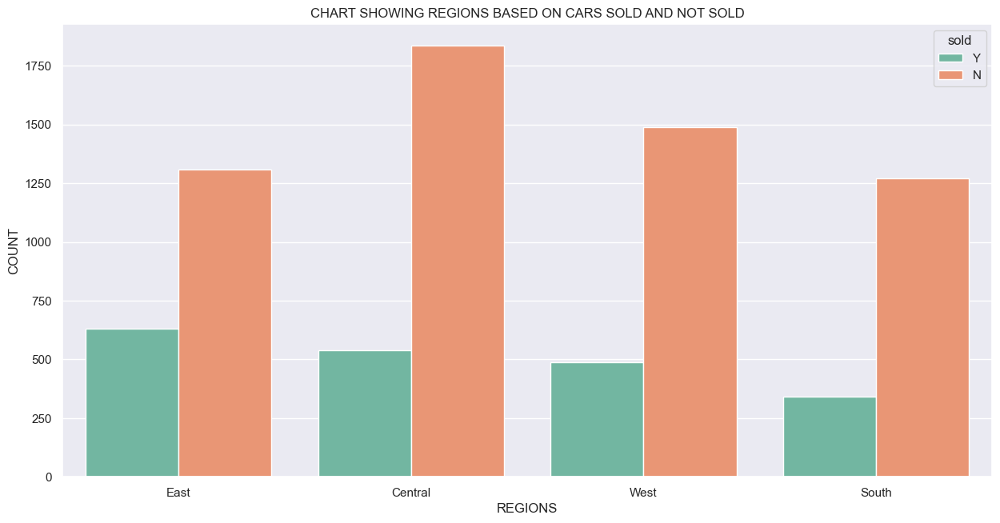

In [205]:
# Visualising the Region series with respect to sold and not sold
region_sales_plot = plt.figure(figsize=(15,7.5), dpi = 100 )
sns.set_theme()
region_sales_chart = sns.countplot(data = car_df,x ='Region', hue='sold', palette='Set2')
region_sales_chart.set(xlabel='REGIONS', ylabel='COUNT')
plt.title('CHART SHOWING REGIONS BASED ON CARS SOLD AND NOT SOLD')
plt.show()

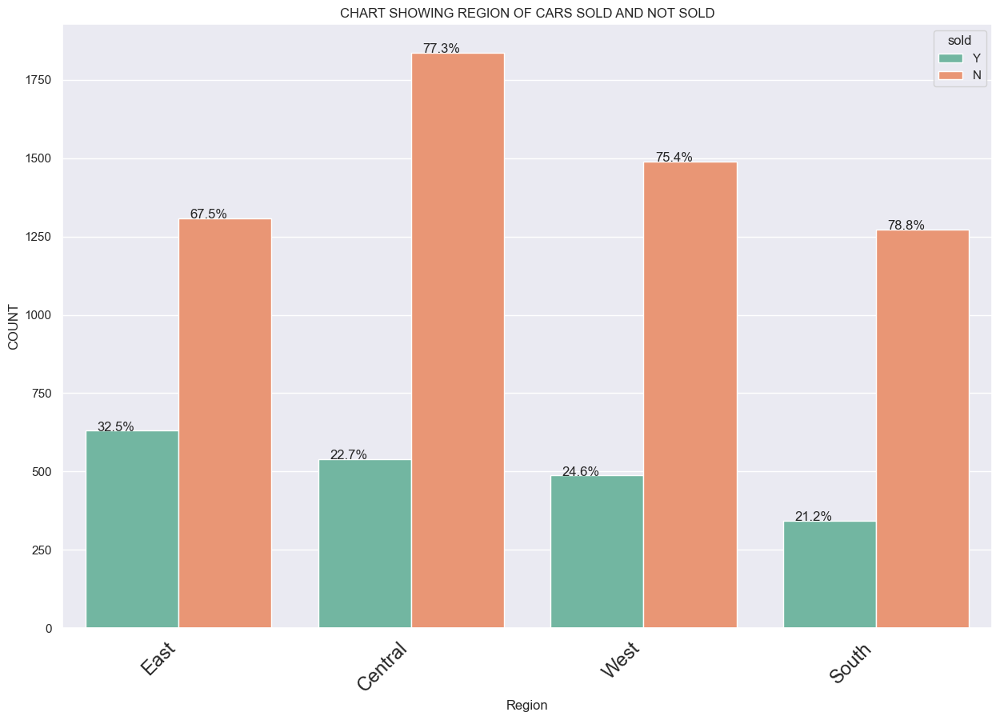

In [206]:
region_col_expl = column_comb_explore("Region")

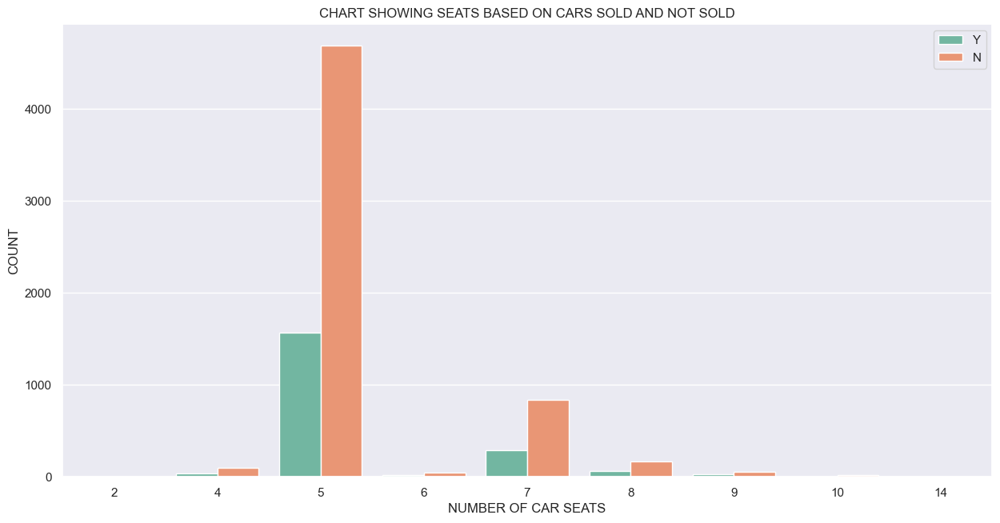

In [207]:
# Visualising the seats series with respect to sold and not sold
seats_sales_plot = plt.figure(figsize=(15,7.5), dpi = 100 )
sns.set_theme()
seats_sales_chart = sns.countplot(data = car_df,x ='seats', hue='sold', palette='Set2' )
seats_sales_chart.set(xlabel='NUMBER OF CAR SEATS', ylabel='COUNT')
plt.title('CHART SHOWING SEATS BASED ON CARS SOLD AND NOT SOLD')
plt.legend(loc=1)
plt.show()

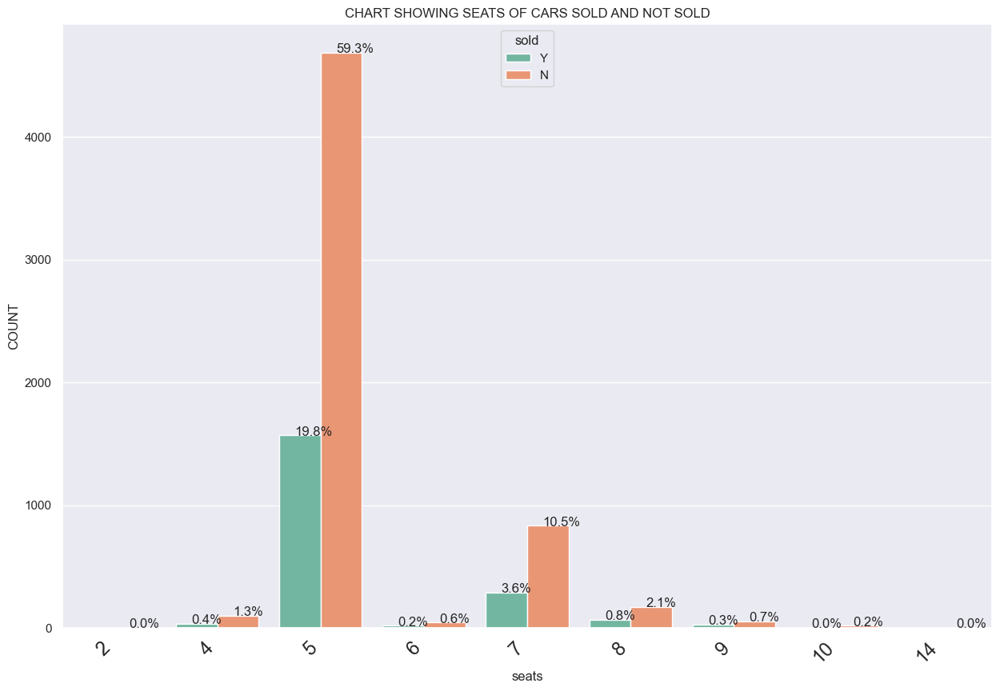

In [208]:
seats_col_expl = column_comb_explore("seats", hue_checker =1)

In [209]:
def seats_explore(d1,d2,d3, col_name):    
    print("\n\n",col_name,"seats average selling price for sold: ",round(d1.selling_price.mean(),2),"\n")
    print(col_name,"seats average selling price for not sold: ",round(d2.selling_price.mean(),2),"\n")
    print("Most Expensive ",col_name,"seats cars: ", d3[lambda x: x.seats == col_name].selling_price.max(),"\n")
    print("Cheapest ",col_name," seats cars: ", d3[lambda x: x.seats == col_name].selling_price.min(),"\n")
    print("Most popular ",col_name,"seats sold car: ", d1.name.mode(),"\n")
    print("nMost popular ",col_name,"seats not sold car: ", d2.name.mode(),"\n")
    print(
        "Region with most sales of ",col_name,"seats vehicles: \n", d1[lambda x: x.seats == col_name][lambda x:x.sold == "Y"].Region.value_counts(),
         "Region with most no sales of ",col_name,"seats vehicles: \n", d2[lambda x: x.seats == col_name][lambda x:x.sold == "N"].Region.value_counts(),"\n",
         )
    print(
        "Car brands with most sales of ",col_name,"seats vehicles: \n", d1[lambda x: x.seats == col_name][lambda x:x.sold == "Y"].name.value_counts(),
         "Car brands with most no sales of ",col_name,"seats vehicles: \n", d2[lambda x: x.seats == col_name][lambda x:x.sold == "N"].name.value_counts(),"\n",
         )
    perc_sold = round((len(d1)/len(d3))*100,2)
    perc_not_sold = round((len(d2)/len(d3))*100,2)
    print("{}: \nPercentage Sold:{}% | Percentage not sold: {}% | Total Vehicles: {} | Total Sold: {} | Total Not Sold: {} |".format(col_name, perc_sold, perc_not_sold, len(d3), len(d1), len(d2)))
    

In [210]:
# Get extra insights on seat data series
for i in car_df.seats.unique():
    d1 = car_df[lambda x: x.seats == i][lambda x:x.sold == "Y"]
    d2 = car_df[lambda x: x.seats == i][lambda x:x.sold == "N"]
    d3 = car_df[lambda x: x.seats == i]
    seats_explore(d1, d2, d3, i)



 5 seats average selling price for sold:  7990.36 

5 seats average selling price for not sold:  7416.66 

Most Expensive  5 seats cars:  78276 

Cheapest  5  seats cars:  360 

Most popular  5 seats sold car:  0    Maruti
Name: name, dtype: object 

nMost popular  5 seats not sold car:  0    Maruti
Name: name, dtype: object 

Region with most sales of  5 seats vehicles: 
 East       510
Central    409
West       388
South      261
Name: Region, dtype: int64 Region with most no sales of  5 seats vehicles: 
 Central    1449
West       1197
South      1031
East       1009
Name: Region, dtype: int64 

Car brands with most sales of  5 seats vehicles: 
 Maruti        512
Hyundai       330
Tata          129
Honda         117
Ford           85
Renault        53
Toyota         50
Chevrolet      44
Volkswagen     39
Nissan         33
BMW            27
Mahindra       21
Jaguar         21
Skoda          20
Volvo          18
Mercedes       16
Datsun         13
Lexus          11
Jeep            9

In [211]:
# Exploring data of cars with 8 seats
d1 = car_df[lambda x: x.seats == 8][lambda x:x.sold == "Y"]
d2 = car_df[lambda x: x.seats == 8][lambda x:x.sold == "N"]
print("Manual average selling price for sold: ",round(d1.selling_price.mean(),2))
print("Manual average selling price for not sold: ",round(d2.selling_price.mean(),2))
print("Most Expensive Manual Transmission: ", car_df[lambda x: x.transmission == "Manual"].selling_price.max())
print("Cheapest Manual Transmission: ", car_df[lambda x: x.transmission == "Manual"].selling_price.min())
print("Most popular manual sold car: ", d1.name.mode())
print("Most popular manual not sold car: ", d2.name.mode())
print(
    "Region with most sales of manual vehicles: \n", car_df[lambda x: x.transmission == "Manual"][lambda x:x.sold == "Y"].Region.value_counts(),
     "Region with most no sales of manual vehicles: \n", car_df[lambda x: x.transmission == "Manual"][lambda x:x.sold == "N"].Region.value_counts(),
     )

Manual average selling price for sold:  6546.15
Manual average selling price for not sold:  7219.27
Most Expensive Manual Transmission:  38400
Cheapest Manual Transmission:  359
Most popular manual sold car:  0    Mahindra
Name: name, dtype: object
Most popular manual not sold car:  0    Toyota
Name: name, dtype: object
Region with most sales of manual vehicles: 
 East       543
Central    482
West       412
South      277
Name: Region, dtype: int64 Region with most no sales of manual vehicles: 
 Central    1592
West       1303
East       1155
South      1101
Name: Region, dtype: int64


In [212]:
# Exploring data of cars with 9 seats
d1 = car_df[lambda x: x.seats == 8][lambda x:x.sold == "Y"]
d2 = car_df[lambda x: x.seats == 8][lambda x:x.sold == "N"]
print("Manual average selling price for sold: ",round(d1.selling_price.mean(),2))
print("Manual average selling price for not sold: ",round(d2.selling_price.mean(),2))
print("Most Expensive Manual Transmission: ", car_df[lambda x: x.transmission == "Manual"].selling_price.max())
print("Cheapest Manual Transmission: ", car_df[lambda x: x.transmission == "Manual"].selling_price.min())
print("Most popular manual sold car: ", d1.name.mode())
print("Most popular manual not sold car: ", d2.name.mode())
print(
    "Region with most sales of manual vehicles: \n", car_df[lambda x: x.transmission == "Manual"][lambda x:x.sold == "Y"].Region.value_counts(),
     "Region with most no sales of manual vehicles: \n", car_df[lambda x: x.transmission == "Manual"][lambda x:x.sold == "N"].Region.value_counts(),
     )

Manual average selling price for sold:  6546.15
Manual average selling price for not sold:  7219.27
Most Expensive Manual Transmission:  38400
Cheapest Manual Transmission:  359
Most popular manual sold car:  0    Mahindra
Name: name, dtype: object
Most popular manual not sold car:  0    Toyota
Name: name, dtype: object
Region with most sales of manual vehicles: 
 East       543
Central    482
West       412
South      277
Name: Region, dtype: int64 Region with most no sales of manual vehicles: 
 Central    1592
West       1303
East       1155
South      1101
Name: Region, dtype: int64


### Spltting Engine power into groups

In [213]:
# Function to return query results for splitted datasets for a unique value in a series and if sold or not sold
def ten_splitter_func(d1,d2,d3,r1,r2,details):
    print("\n\n",r1,"and",r2, details, "average selling price for sold: ",round(d1.selling_price.mean(),2),"\n")
    print(r1,"and",r2, details, "average selling price for not sold: ",round(d2.selling_price.mean(),2),"\n")
    print("Most Expensive ",r1,"and",r2, details, " cars: ", d3.selling_price.max(),"\n")
    print("Cheapest ",r1,"and",r2, details, " cars: ", d3.selling_price.min(),"\n")
    print("Most popular ",r1,"and",r2, details, " sold car: ", d1.name.mode(),"\n")
    print("Most popular ",r1,"and",r2, details, " not sold car: ", d2.name.mode(),"\n")
    print(
        "Region with most sales of between",r1,"and",r2, details, " vehicles: \n", d1.Region.value_counts(),
         "Region with most no sales of between ",r1,"and",r2, details, " vehicles: \n", d2.Region.value_counts(),"\n",
         )
    print(
        "Car brands with most sales of between",r1,"and",r2, details, " vehicles: \n", d1.name.value_counts(),
         "Car brands with most no sales of between",r1,"and",r2, details, " vehicles: \n", d2.name.value_counts(),"\n",
         )
    perc_sold = round((len(d1)/len(d3))*100,2)
    perc_not_sold = round((len(d2)/len(d3))*100,2)
    print("{} and {}: \nPercentage Sold:{}% | Percentage not sold: {}% | Total Vehicles: {} | Total Sold: {} | Total Not Sold: {} |".format(r1 , r2, perc_sold, perc_not_sold, len(d3), len(d1), len(d2)))
    

In [214]:
inc = 325
eng_cap = 600
for e, i in enumerate(range(10)):
    r1 = (eng_cap + (e * inc))
    r2 = (eng_cap + ((e + 1) * inc))
    d3 = car_df[lambda x:x.engine > r1][lambda x:x.engine < r2]
    d2 = d3[lambda x:x.sold == "N"]
    d1 = d3[lambda x:x.sold == "Y"]
    ten_splitter_func(d1,d2,d3,r1,r2,"Engine capacity")



 600 and 925 Engine capacity average selling price for sold:  2361.04 

600 and 925 Engine capacity average selling price for not sold:  2325.04 

Most Expensive  600 and 925 Engine capacity  cars:  6000 

Cheapest  600 and 925 Engine capacity  cars:  359 

Most popular  600 and 925 Engine capacity  sold car:  0    Maruti
Name: name, dtype: object 

Most popular  600 and 925 Engine capacity  not sold car:  0    Maruti
Name: name, dtype: object 

Region with most sales of between 600 and 925 Engine capacity  vehicles: 
 East       61
West       50
Central    46
South      21
Name: Region, dtype: int64 Region with most no sales of between  600 and 925 Engine capacity  vehicles: 
 Central    163
West       123
East       113
South      100
Name: Region, dtype: int64 

Car brands with most sales of between 600 and 925 Engine capacity  vehicles: 
 Maruti      117
Hyundai      27
Renault      22
Tata          5
Datsun        5
Daewoo        1
Mahindra      1
Name: name, dtype: int64 Car br

 3525 and 3850 Engine capacity average selling price for sold:  49200.0 

3525 and 3850 Engine capacity average selling price for not sold:  49200.0 

Most Expensive  3525 and 3850 Engine capacity  cars:  49200 

Cheapest  3525 and 3850 Engine capacity  cars:  49200 

Most popular  3525 and 3850 Engine capacity  sold car:  0    Jeep
Name: name, dtype: object 

Most popular  3525 and 3850 Engine capacity  not sold car:  0    Jeep
Name: name, dtype: object 

Region with most sales of between 3525 and 3850 Engine capacity  vehicles: 
 West    2
East    1
Name: Region, dtype: int64 Region with most no sales of between  3525 and 3850 Engine capacity  vehicles: 
 South    2
West     1
Name: Region, dtype: int64 

Car brands with most sales of between 3525 and 3850 Engine capacity  vehicles: 
 Jeep    3
Name: name, dtype: int64 Car brands with most no sales of between 3525 and 3850 Engine capacity  vehicles: 
 Jeep    3
Name: name, dtype: int64 

3525 and 3850: 
Percentage Sold:50.0% | Percen

### Splitting KM Driven

In [215]:
# Splitting kilometer driven
inc = 200000
eng_cap = 0
for e, i in enumerate(range(3)):
    r1 = int(eng_cap + (e * inc))
    r2 = int(eng_cap + ((e + 1) * inc))
    d3 = car_df[lambda x:x.km_driven > r1][lambda x:x.km_driven < r2]
    d2 = d3[lambda x:x.sold == "N"]
    d1 = d3[lambda x:x.sold == "Y"]
    ten_splitter_func(d1,d2,d3,r1,r2, "KM Driven")



 0 and 200000 KM Driven average selling price for sold:  8169.42 

0 and 200000 KM Driven average selling price for not sold:  7744.63 

Most Expensive  0 and 200000 KM Driven  cars:  120000 

Cheapest  0 and 200000 KM Driven  cars:  359 

Most popular  0 and 200000 KM Driven  sold car:  0    Maruti
Name: name, dtype: object 

Most popular  0 and 200000 KM Driven  not sold car:  0    Maruti
Name: name, dtype: object 

Region with most sales of between 0 and 200000 KM Driven  vehicles: 
 East       621
Central    534
West       479
South      336
Name: Region, dtype: int64 Region with most no sales of between  0 and 200000 KM Driven  vehicles: 
 Central    1804
West       1456
East       1280
South      1243
Name: Region, dtype: int64 

Car brands with most sales of between 0 and 200000 KM Driven  vehicles: 
 Maruti        592
Hyundai       329
Mahindra      194
Tata          174
Honda         123
Toyota        118
Ford           92
Renault        56
Chevrolet      56
Volkswagen     3

In [216]:
car_df.km_driven.max()

2360457

In [217]:
# There exist two cars that have been driven over six hundred thousand kilometers, this happen's to have been driven
# over a million kilometers two. The one in the central has been sold but the one in the south is still not sold
car_df[lambda x:x.km_driven > 600000]

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
1757,1811,Mahindra,2012,6000,1500000,Central,Illinois,West Chicago,Diesel,Individual,Manual,First_Owner,15.1,2179,140.00,7,Y,330.0,2200,6000.0
3377,3487,Hyundai,2007,6600,2360457,South,Mississippi,Clinton,Petrol,Individual,Manual,Second_Owner,18.6,1197,81.83,5,N,114.7,4000,6600.0


### Exploring the seller type series

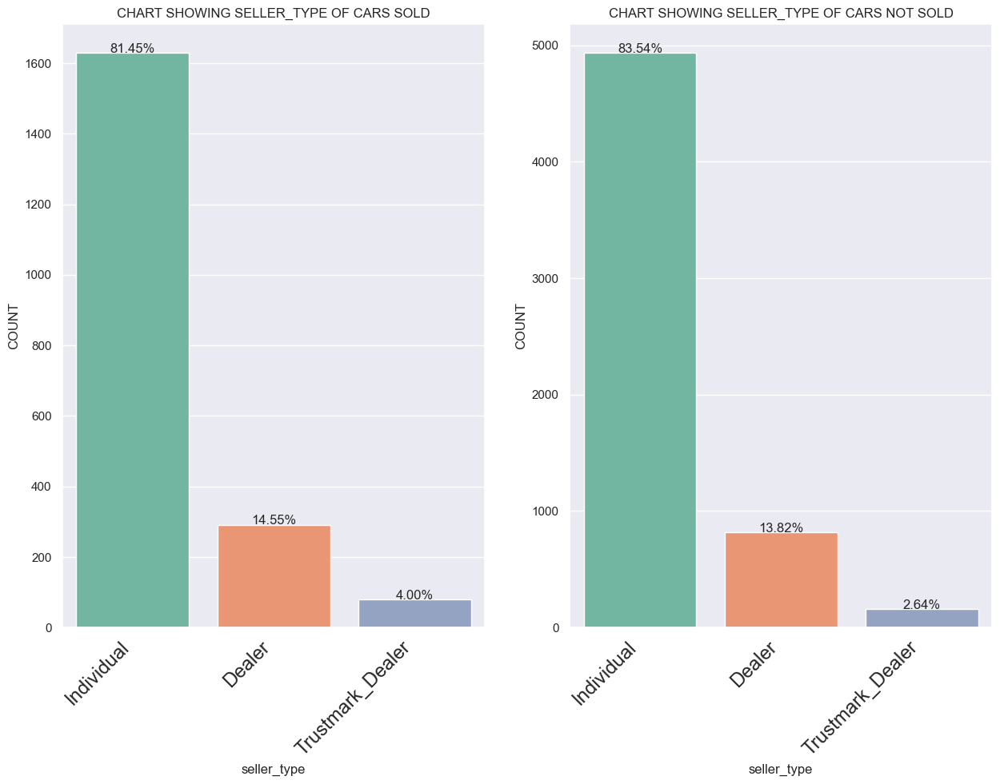

In [218]:
# Exloring the seller_type series
seller_type_col_expl = column_explore("seller_type")
#seller_type_col_expl = column_explore("owner", 1)

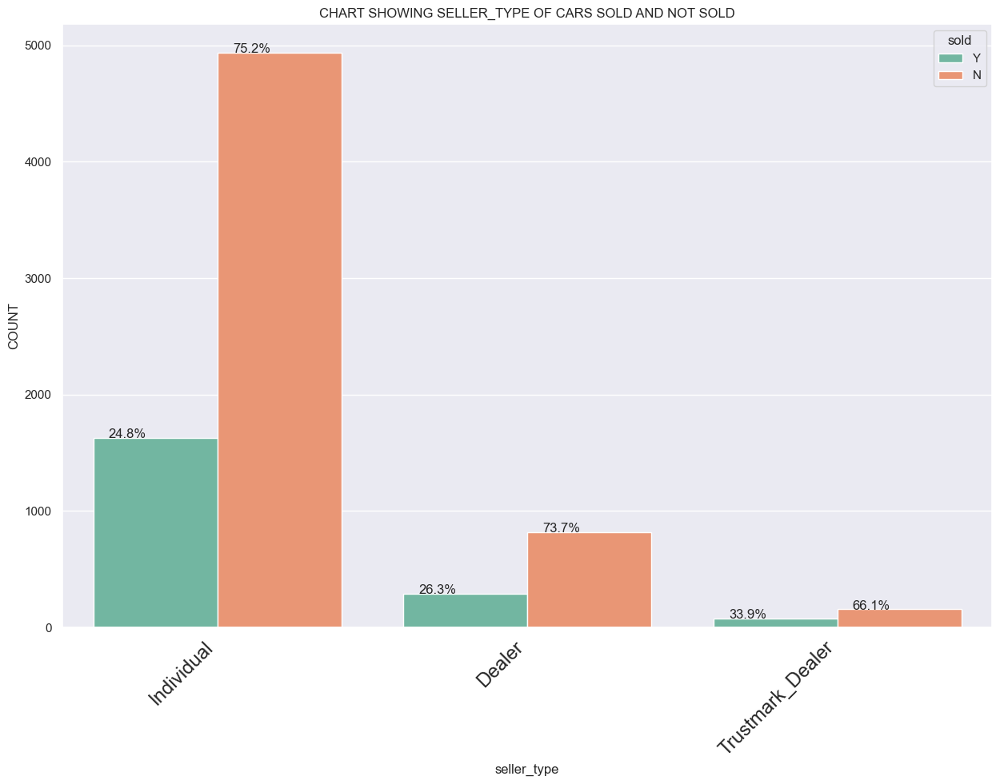

In [219]:
# Exloring the seller_type series
seller_type_com_expl = column_comb_explore("seller_type")

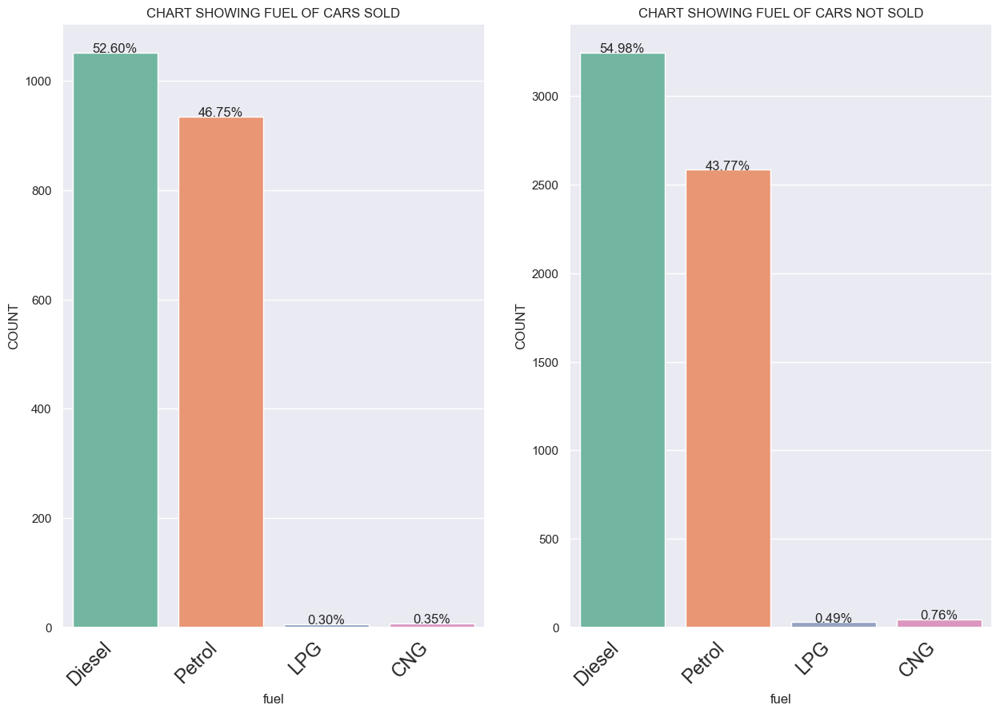

In [220]:
# Exloring the seller_type series
fuel_col_expl = column_explore("fuel")

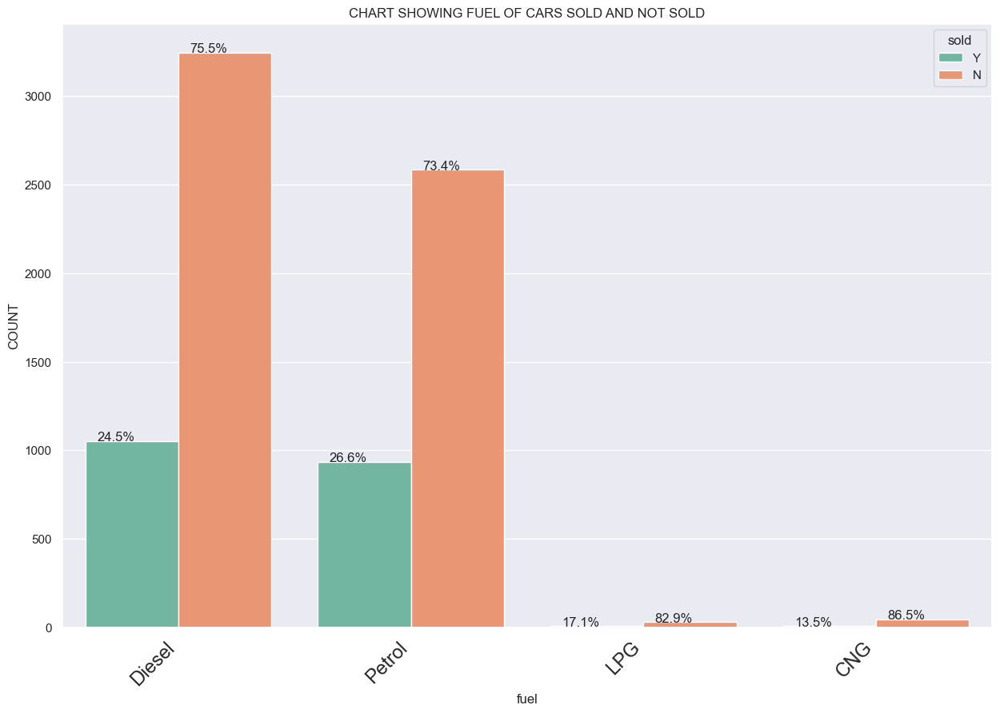

In [221]:
# Exloring the fuel series
fuel_com_expl = column_comb_explore("fuel")

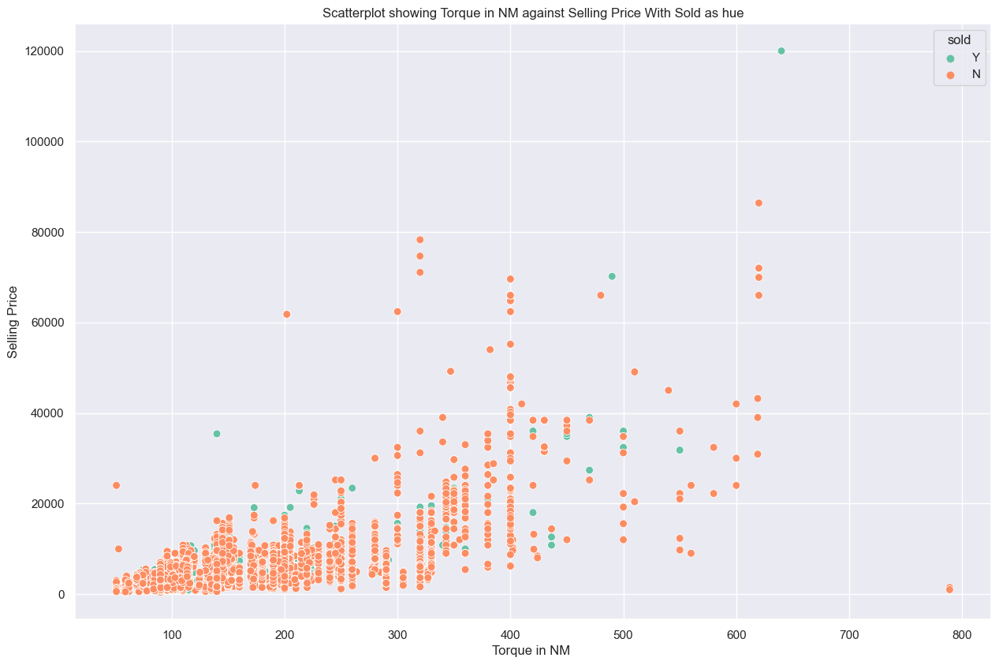

In [222]:
# Line plot of torque_splitnm and selling price

torque_nm_plot = plt.figure(figsize=(15,10), dpi = 100 )
torque_nm_chart = sns.scatterplot(data=car_df, x= "torque_splitnm", y="selling_price", s=50, hue="sold", palette='Set2' )
torque_nm_chart.set(xlabel="Torque in NM ", ylabel='Selling Price')
plt.title("Scatterplot showing Torque in NM against Selling Price With Sold as hue")
plt.show()

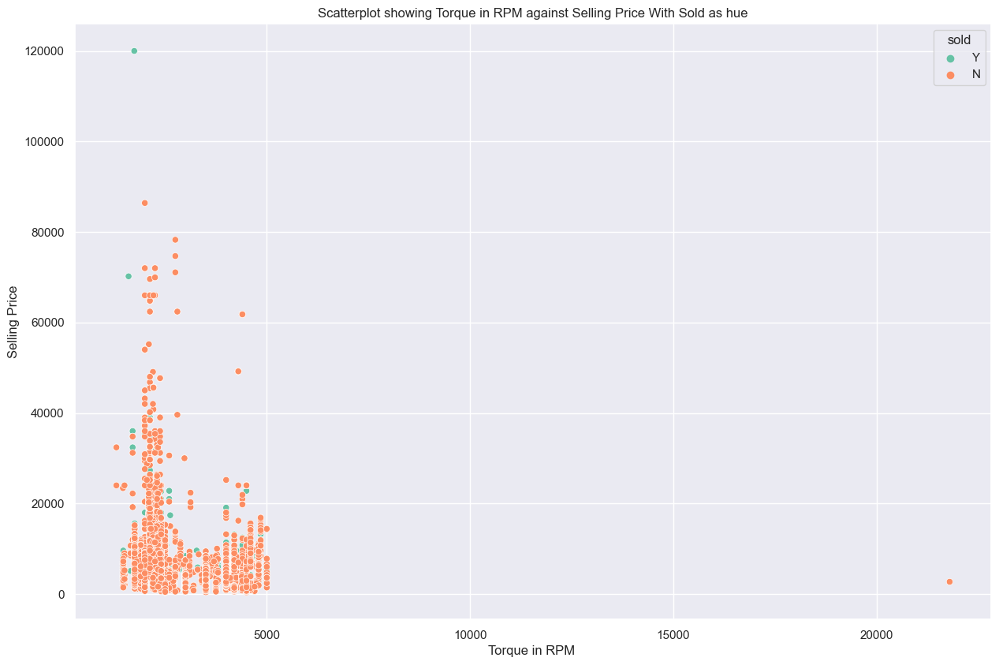

In [223]:
# Line plot of torque_splitrpm and selling price

torque_nm_plot = plt.figure(figsize=(15,10), dpi = 100 )
torque_nm_chart = sns.scatterplot(data=car_df, x= "torque_splitrpm", y="selling_price", hue="sold", palette='Set2' )
torque_nm_chart.set(xlabel="Torque in RPM ", ylabel='Selling Price')
plt.title("Scatterplot showing Torque in RPM against Selling Price With Sold as hue")
plt.show()

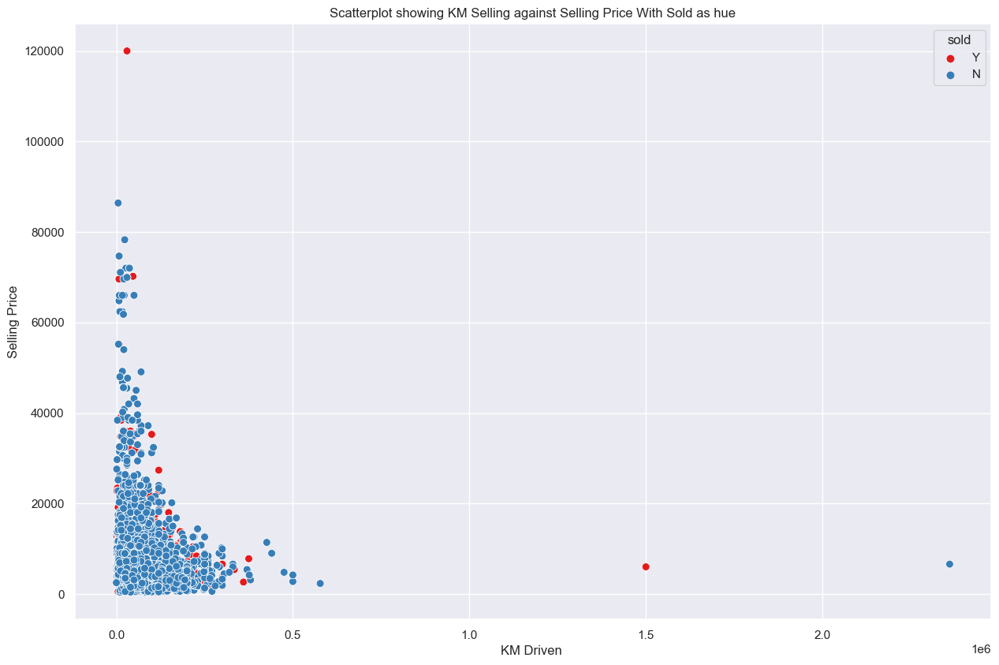

In [224]:
# Line plot of km_driven and selling price

torque_nm_plot = plt.figure(figsize=(15,10), dpi = 100 )
torque_nm_chart = sns.scatterplot(data=car_df, x= "km_driven", y="selling_price", s=50, hue="sold", palette='Set1' )
torque_nm_chart.set(xlabel="KM Driven ", ylabel='Selling Price')
plt.title("Scatterplot showing KM Selling against Selling Price With Sold as hue")
plt.show()

In [225]:
car_df.km_driven.max()

2360457

In [226]:
car_df_sold, car_df_not_sold = column_explore(_, car_df, 1)

In [227]:
car_df_sold["year_sell_price_sold"] = car_df_sold.groupby(["selling_price"])["selling_price"].transform("mean")
car_df_not_sold["year_sell_price_not_sold"] = car_df_not_sold.groupby(["selling_price"])["selling_price"].transform("mean")


car_df_sold["year_sell_price_sold_count"] = car_df_sold.groupby(["selling_price"])["selling_price"].transform("count")
car_df_not_sold["year_sell_price_not_sold_count"] = car_df_not_sold.groupby(["selling_price"])["selling_price"].transform("count")


In [228]:
car_df_sold

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,...,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped,year_sell_price_sold,year_sell_price_sold_count
0,1,Maruti,2014,5400,145500,East,District of Columbia,Washington,Diesel,Individual,...,23.40,1248,74.00,5,Y,190.0,2000,5400.0,5400.0,55
1,2,Skoda,2014,4440,120000,East,New York,New York City,Diesel,Individual,...,21.14,1498,103.52,5,Y,250.0,2000,4440.0,4440.0,8
2,3,Honda,2006,1896,140000,Central,Illinois,Chicago,Petrol,Individual,...,17.70,1497,78.00,5,Y,140.0,2700,1896.0,1896.0,2
3,4,Hyundai,2010,2700,127000,Central,Illinois,Chicago,Diesel,Individual,...,23.00,1396,90.00,5,Y,140.0,2250,2700.0,2700.0,21
4,5,Maruti,2007,1560,120000,East,New York,New York City,Petrol,Individual,...,16.10,1298,88.20,5,Y,140.0,4500,1560.0,1560.0,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,2057,Mahindra,2017,9000,60000,Central,Illinois,Joliet,Diesel,Individual,...,18.49,1493,100.00,7,Y,240.0,2200,9000.0,9000.0,32
1996,2058,Chevrolet,2011,1800,80000,West,Utah,Layton,Petrol,Individual,...,18.00,995,62.00,5,Y,90.3,4200,1800.0,1800.0,34
1997,2059,Maruti,2016,2940,50000,West,Utah,Layton,Petrol,Individual,...,22.74,796,47.30,5,Y,69.0,3500,2940.0,2940.0,4
1998,2060,Tata,2013,3120,189000,West,Utah,Kearns,Diesel,Individual,...,21.02,1248,88.76,5,Y,200.0,2375,3120.0,3120.0,16


In [229]:
car_df_not_sold

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,...,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped,year_sell_price_not_sold,year_sell_price_not_sold_count
2000,2062,Hyundai,2014,5400,56000,West,Utah,Layton,Diesel,Individual,...,21.90,1396,88.76,5,N,219.6,2250,5400.0,5400.0,139
2001,2063,BMW,2012,15600,140000,West,Utah,Layton,Diesel,Individual,...,18.88,1995,184.00,5,N,380.0,2250,15600.0,15600.0,13
2002,2064,Maruti,2016,4212,60000,West,Utah,Kearns,Petrol,Individual,...,23.10,998,67.04,5,N,90.0,3500,4212.0,4212.0,3
2003,2065,Mahindra,2012,6600,130000,West,Utah,Kearns,Diesel,Individual,...,15.10,2179,140.00,7,N,330.0,2200,6600.0,6600.0,154
2004,2066,BMW,2013,15600,140000,West,Utah,Kearns,Diesel,Individual,...,18.88,1995,184.00,5,N,380.0,2250,15600.0,15600.0,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7901,8124,Hyundai,2013,3840,110000,Central,Texas,Plano,Petrol,Individual,...,18.50,1197,82.85,5,N,113.7,4000,3840.0,3840.0,52
7902,8125,Hyundai,2007,1620,119000,Central,Texas,Port Arthur,Diesel,Individual,...,16.80,1493,110.00,5,N,140.0,2325,1620.0,1620.0,24
7903,8126,Maruti,2009,4584,120000,Central,Texas,Port Arthur,Diesel,Individual,...,19.30,1248,73.90,5,N,190.0,2000,4584.0,4584.0,2
7904,8127,Tata,2013,3480,25000,East,Massachusetts,Lunenburg,Diesel,Individual,...,23.57,1396,70.00,5,N,140.0,2400,3480.0,3480.0,33


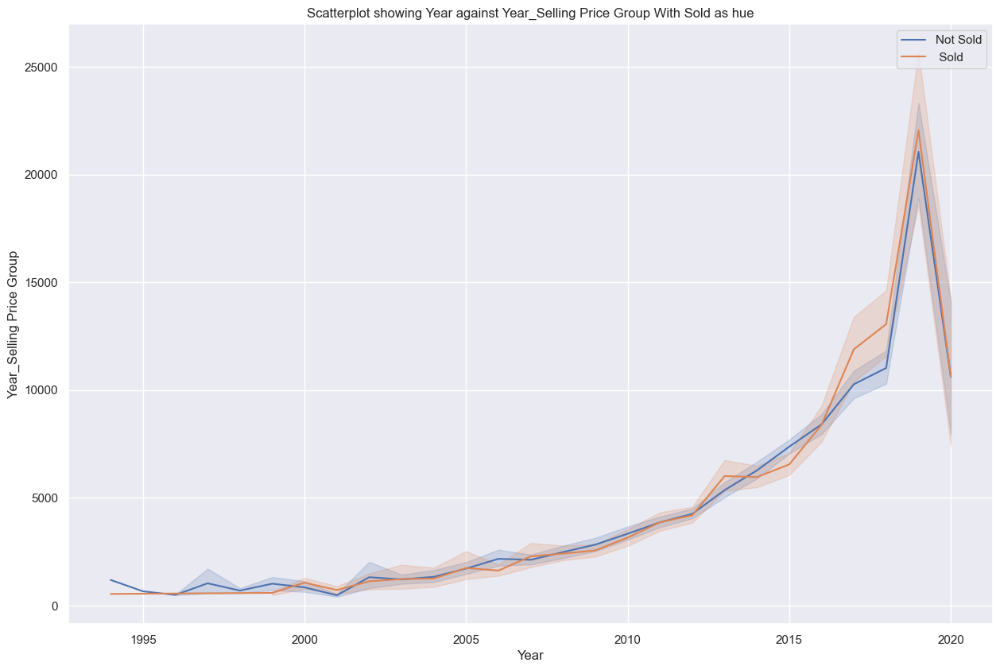

In [230]:
# Line plot of year and selling price

torque_nm_plot = plt.figure(figsize=(15,10), dpi = 100 )
torque_nm_charts = sns.lineplot(data=car_df_not_sold, x= "year", y="year_sell_price_not_sold", palette='Set2', label="Not Sold" )
torque_nm_chart = sns.lineplot(data=car_df_sold, x= "year", y="year_sell_price_sold", palette='Set2', label=" Sold" )
torque_nm_chart.set(xlabel="Year", ylabel='Year_Selling Price Group')
plt.title("Scatterplot showing Year against Year_Selling Price Group With Sold as hue")
plt.show()

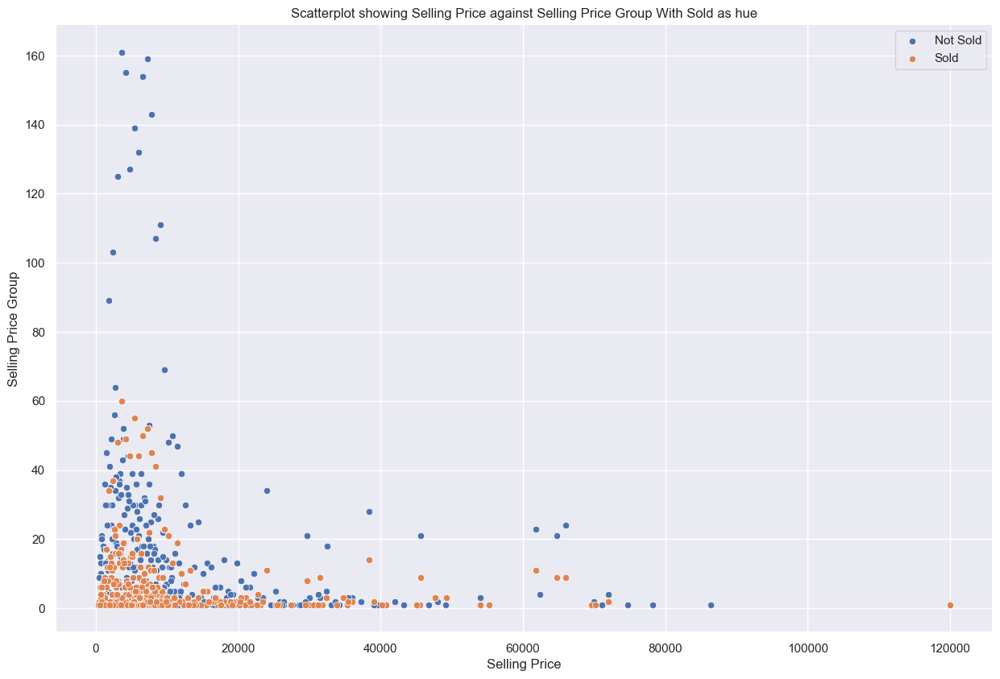

In [231]:
# scatterplot plot of selling price and selling price group count

selling_price_count_grp_plot = plt.figure(figsize=(15,10), dpi = 100 )
selling_price_count_grp_chart = sns.scatterplot(data=car_df_not_sold, x= "year_sell_price_not_sold", y="year_sell_price_not_sold_count", palette='Set2', label="Not Sold" )
selling_price_count_grp_chart = sns.scatterplot(data=car_df_sold, x= "year_sell_price_sold", y="year_sell_price_sold_count", palette='Set2', label="Sold" )
selling_price_count_grp_chart.set(xlabel="Selling Price", ylabel='Selling Price Group')
plt.title("Scatterplot showing Selling Price against Selling Price Group With Sold as hue")
plt.legend()
plt.show()

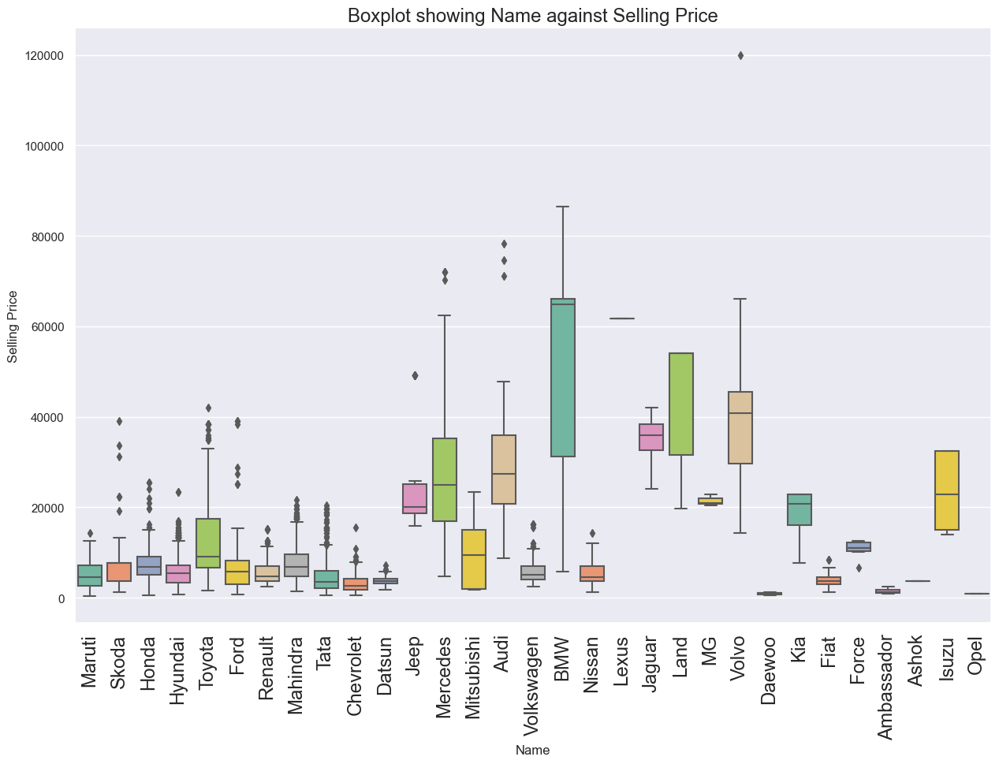

In [232]:
# scatterplot plot of selling price and selling price group count

name_selling_price_box_plot = plt.figure(figsize=(15,10), dpi = 100 )
name_selling_price_box_chart = sns.boxplot(data=car_df, x= "name", y="selling_price", palette='Set2')
name_selling_price_box_chart.set(xlabel="Name", ylabel='Selling Price')
name_selling_price_box_chart.set_xticklabels(name_selling_price_box_chart.get_xticklabels(), rotation=90, horizontalalignment='center',fontweight='light', fontsize='x-large')
plt.title("Boxplot showing Name against Selling Price", fontsize="x-large" , fontweight="light", loc="center")
plt.show()

# Feature Engineering 

### Checking for relationship between columns

In [233]:
car_df.owner.unique()

array(['First_Owner', 'Second_Owner', 'Third_Owner', 'Fourth_Above_Owner',
       'Test_Drive_Car'], dtype=object)

In [234]:
#refined_car_df.sold = refined_car_df.sold.map({"Y":1, "N":0 }, ["Y","N"])
#refined_car_df.sold

In [235]:
# Creating a copy of the original dataframe and then replace the values Y and N with 1 and 0 for correlation analysis
refined_car_df = car_df.copy()
sold_sheet_dict = dict()
fuel_sheet_dict = dict()
seller_type_sheet_dict = dict()
region_sheet_dict = dict()
owner_sheet_dict = dict()
transmission_sheet_dict = dict()
name_sheet_dict = dict()
city_sheet_dict = dict()
state_province_sheet_dict = dict()

le = LabelEncoder()

refined_car_df.sold = le.fit_transform(refined_car_df.sold)
sold_sheet_dict["Y"]=1
sold_sheet_dict["N"]=0

refined_car_df.fuel.replace(["Diesel","Petrol","LPG","CNG"], [0,1,2,3], inplace=True)
fuel_sheet_dict["Diesel"]=0
fuel_sheet_dict["Petrol"]=1
fuel_sheet_dict["LPG"]=2
fuel_sheet_dict["CNG"]=3

refined_car_df.seller_type.replace(["Individual","Dealer","Trustmark_Dealer"], [0,1,2], inplace=True)
seller_type_sheet_dict["Individual"]=0
seller_type_sheet_dict["Dealer"]=1
seller_type_sheet_dict["Trustmark_Dealer"]=2

refined_car_df.Region.replace(["East","Central","West","South"], [0,1,2,3], inplace=True)
region_sheet_dict["East"]=0
region_sheet_dict["Central"]=1
region_sheet_dict["West"]=2
region_sheet_dict["South"]=3

refined_car_df.owner.replace(["First_Owner","Second_Owner","Third_Owner","Fourth_Above_Owner","Test_Drive_Car"], [0,1,2,3,4], inplace=True)
owner_sheet_dict["First_Owner"]=0
owner_sheet_dict["Second_Owner"]=1
owner_sheet_dict["Third_Owner"]=2
owner_sheet_dict["Fourth_Above_Owner"]=3
owner_sheet_dict["Test_Drive_Car"]=4

refined_car_df.transmission.replace(["Manual","Automatic"], [0,1], inplace=True)
transmission_sheet_dict["Manual"]=0
transmission_sheet_dict["Automatic"]=1


cars_name_list = ['Ambassador','Ashok','Audi','BMW','Chevrolet',
     'Daewoo','Datsun','Fiat','Force','Ford','Honda','Hyundai','Isuzu','Jaguar','Jeep','Kia','Land','Lexus','MG',
         'Mahindra','Maruti','Mercedes','Mitsubishi','Nissan','Opel',
             'Renault','Skoda','Tata','Toyota','Volkswagen','Volvo']
cars_designated_numbers = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30]
for f_val, s_val in  zip(cars_name_list,cars_designated_numbers):
    refined_car_df.name.replace(f_val, s_val, inplace=True)
    name_sheet_dict[f_val]=s_val

for e,i in enumerate(car_df.City.unique()):
    refined_car_df.City.replace( i, e, inplace=True)
    city_sheet_dict[i]=e

for e,i in enumerate(car_df["State or Province"].unique()):
    refined_car_df["State or Province"].replace( i, e, inplace=True)
    state_province_sheet_dict[i]=e
    
refined_car_df.drop(labels=["selling_price_grouped", "Sales_ID"], axis=1, inplace=True)
refined_car_df

,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm
0,20,2014,5400,145500,0,0,0,0,0,0,0,23.40,1248,74.00,5,1,190.0,2000
1,26,2014,4440,120000,0,1,1,0,0,0,1,21.14,1498,103.52,5,1,250.0,2000
2,10,2006,1896,140000,1,2,2,1,0,0,2,17.70,1497,78.00,5,1,140.0,2700
3,11,2010,2700,127000,1,2,2,0,0,0,0,23.00,1396,90.00,5,1,140.0,2250
4,20,2007,1560,120000,0,1,1,1,0,0,0,16.10,1298,88.20,5,1,140.0,4500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7901,11,2013,3840,110000,1,4,467,1,0,0,0,18.50,1197,82.85,5,0,113.7,4000
7902,11,2007,1620,119000,1,4,574,0,0,0,3,16.80,1493,110.00,5,0,140.0,2325
7903,20,2009,4584,120000,1,4,574,0,0,0,0,19.30,1248,73.90,5,0,190.0,2000
7904,27,2013,3480,25000,0,5,1309,0,0,0,0,23.57,1396,70.00,5,0,140.0,2400


In [236]:
car_df.City.unique()

array(['Washington', 'New York City', 'Chicago', ..., 'Elkhart',
       'Mooresville', 'Lunenburg'], dtype=object)

In [237]:
empty_space_dict = dict()
empty_space_dict[" "] = " "

In [238]:
sold_df = pd.DataFrame.from_dict(sold_sheet_dict, orient="Index", columns=["Assigned Value"])
fuel_df = pd.DataFrame.from_dict(fuel_sheet_dict, orient="Index", columns=["Assigned Value"])
seller_type_df = pd.DataFrame.from_dict(seller_type_sheet_dict, orient="Index", columns=["Assigned Value"])
region_df = pd.DataFrame.from_dict(region_sheet_dict, orient="Index", columns=["Assigned Value"])
owner_df = pd.DataFrame.from_dict(owner_sheet_dict, orient="Index", columns=["Assigned Value"])
transmission_df = pd.DataFrame.from_dict(transmission_sheet_dict, orient="Index", columns=["Assigned Value"])
name_df = pd.DataFrame.from_dict(name_sheet_dict, orient="Index", columns=["Assigned Value"])
city_df = pd.DataFrame.from_dict(city_sheet_dict, orient="Index", columns=["Assigned Value"])
state_province_df = pd.DataFrame.from_dict(state_province_sheet_dict, orient="Index", columns=["Assigned Value"])
empty_space_df = pd.DataFrame.from_dict(empty_space_dict, orient="Index", columns=None)

In [239]:
#all_dict_list = [year_sheet_dict, fuel_sheet_dict, seller_type_sheet_dict, region_sheet_dict, owner_sheet_dict, transmission_sheet_dict, name_sheet_dict , city_sheet_dict, state_province_sheet_dict]

filepath = Path('New_Guide_Sheets/Excel_file/Dataset guide for names and corresponding numbers.xlsx')  
filepath.parent.mkdir(parents=True, exist_ok=True) 

all_dict_names = ["sold_assigned_values", "fuel_assigned_values", "seller_type_assigned_values", "region_assigned_values", "owner_assigned_values", "transmission_assigned_values","name_assigned_values", "city_assigned_values", "state_province_assigned_values"]   
all_new_df = [sold_df, fuel_df, seller_type_df, region_df, owner_df, transmission_df, name_df, city_df, state_province_df]   

writer = pd.ExcelWriter(filepath) 
for i in range(len(all_dict_names)):
    (all_new_df[i]).to_excel(writer, sheet_name=all_dict_names[i])
writer.close()

In [240]:
file_tag = ["Sold", "Fuel", "Seller Type", "Region", "Owner", "Transmission","Name", "City", "State or Province"]
filepath = Path('New_Guide_Sheets/CSV_file/Dataset guide for names and corresponding numbers.csv')  
filepath.parent.mkdir(parents=True, exist_ok=True) 
sold_df.to_csv(filepath, sep=",", mode="w", header=True, index_label="Sold") 
for i in range(len(all_dict_names)):
    if i == 0:
        continue
    else:
        empty_space_df.to_csv(filepath, sep=",", mode="a", header=True,) 
        (all_new_df[i]).to_csv(filepath, sep=",", mode="a", header=True, index_label=file_tag[i]) 

<AxesSubplot:>

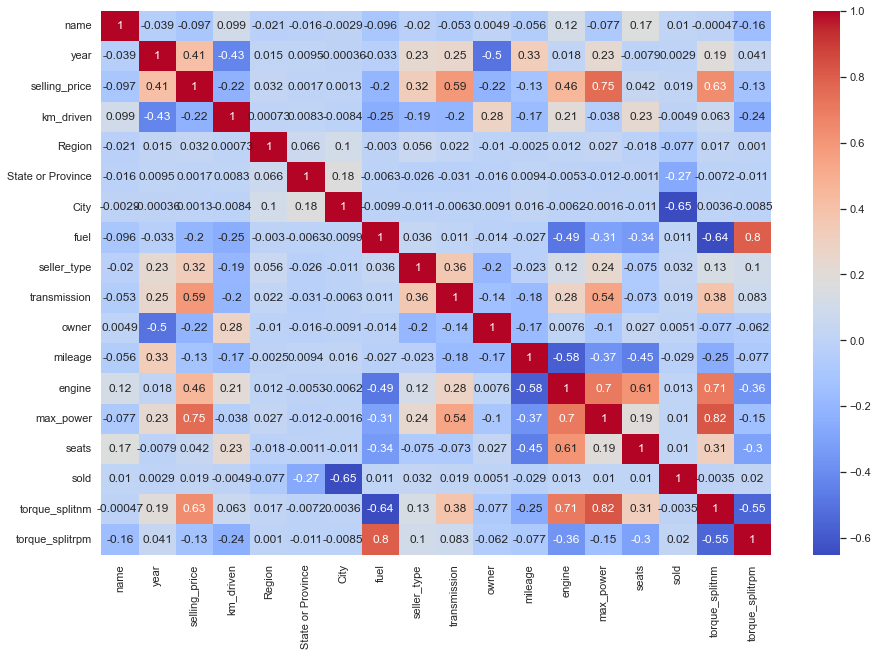

In [241]:
# Using the heatmap to visualise the relationship between columns
corr_plot = plt.figure(figsize = (15,10))
sns.heatmap(refined_car_df.corr(),annot=True, cmap = "coolwarm") 

In [242]:
refined_car_df.corr()

,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm
name,1.000000,-0.038812,-0.096519,0.099116,-0.021352,-0.016243,-0.002935,-0.096001,-0.020435,-0.053056,0.004889,-0.055903,0.115131,-0.077337,0.172441,0.010007,-0.000466,-0.157230
year,-0.038812,1.000000,0.412301,-0.428548,0.015275,0.009543,-0.000357,-0.032935,0.231798,0.249002,-0.499703,0.328544,0.018263,0.226598,-0.007923,0.002871,0.193878,0.040711
selling_price,-0.096519,0.412301,1.000000,-0.222159,0.031903,0.001732,0.001337,-0.201221,0.321390,0.590269,-0.216515,-0.126280,0.455682,0.749674,0.041617,0.018997,0.633162,-0.134313
km_driven,0.099116,-0.428548,-0.222159,1.000000,0.000734,0.008259,-0.008395,-0.246821,-0.192788,-0.201186,0.281182,-0.172980,0.206031,-0.038159,0.227259,-0.004931,0.063046,-0.242577
Region,-0.021352,0.015275,0.031903,0.000734,1.000000,0.065809,0.104294,-0.003030,0.056473,0.022347,-0.010190,-0.002488,0.011547,0.026848,-0.018311,-0.077195,0.017189,0.001041
State or Province,-0.016243,0.009543,0.001732,0.008259,0.065809,1.000000,0.180573,-0.006287,-0.025582,-0.030904,-0.016026,0.009368,-0.005336,-0.012289,-0.001146,-0.266595,-0.007169,-0.010776
City,-0.002935,-0.000357,0.001337,-0.008395,0.104294,0.180573,1.000000,-0.009900,-0.010701,-0.006265,-0.009069,0.016353,-0.006220,-0.001578,-0.011123,-0.650418,0.003602,-0.008503
fuel,-0.096001,-0.032935,-0.201221,-0.246821,-0.003030,-0.006287,-0.009900,1.000000,0.036044,0.010803,-0.014162,-0.026830,-0.487862,-0.306224,-0.338849,0.010861,-0.644596,0.797529
seller_type,-0.020435,0.231798,0.321390,-0.192788,0.056473,-0.025582,-0.010701,0.036044,1.000000,0.357740,-0.197571,-0.022672,0.120017,0.239235,-0.075284,0.032016,0.131454,0.103662
transmission,-0.053056,0.249002,0.590269,-0.201186,0.022347,-0.030904,-0.006265,0.010803,0.357740,1.000000,-0.141350,-0.178986,0.283206,0.541870,-0.072722,0.019495,0.381549,0.083043


In [243]:
# Code gives the index of the resulting query
#refined_car_df.loc[car_df['km_driven'] > 600000].index

In [244]:
# Support function

class calculations:
    def __init__(self,df,target_1,target_2,ante_column,cons_column):
        self.df = df
        self.target_1 = target_1
        self.target_2 = target_2
        self.ante_column = ante_column
        self.cons_column = cons_column

    #initialisation of parameters
        self.df1 = df.loc[lambda x: x[ante_column]==target_1]
        self.df2 = df.loc[lambda x: x[cons_column]==target_2]
        self.df_total = self.df1.loc[lambda x: x[cons_column]==target_2]
        self.df1_freq = len(self.df1)
        self.df2_freq = len(self.df2)
        self.dftotal_freq = len(self.df_total)
        self.total_dfl = len(df)


    # Support function        
    def support_func (self):
        result_support = self.dftotal_freq/self.total_dfl
        return print(f"The support value is :{result_support}")

    # Confidence function
    def confidence_func (self):
        result_confidence = self.dftotal_freq/self.df1_freq
        return print(f"The confidence value is :{result_confidence}")

    # completeness function
    def completeness_func (self):
        result_completeness = self.dftotal_freq/self.df2_freq
        return print(f"The completeness value is :{result_completeness}")

    # lift function
    def lift_func (self):
        support_a = self.df1_freq/self.total_dfl
        support_b = self.df2_freq/self.total_dfl
        result_support = self.dftotal_freq/self.total_dfl
        result_lift = result_support/(support_a*support_b)
        return print(f"The lift value is :{result_lift}")

    # Conviction function
    def conviction_func (self):
        support_b = self.df2_freq/self.total_dfl
        result_confidence = self.dftotal_freq/self.df1_freq
        result_conviction = (1-support_b)/(1-result_confidence)
        return print(f"The conviction value is :{result_conviction}")

    # RI function
    def ri_func (self):
        result_ri = (self.dftotal_freq - (self.df1_freq*(self.df2_freq/self.total_dfl))) # Calculated using BODMAS formular
        return print(f"The RI value is :{result_ri}")

    # Calling each fucntion for return value

    # Report function
    def report_func(self):
        self.support_func ()
        self.confidence_func ()
        self.completeness_func ()
        self.lift_func ()
        self.conviction_func ()
        self.ri_func () 

In [245]:
print(calculations(car_df,"N","South","sold","Region").report_func())

The support value is :0.1608904629395396
The confidence value is :0.21537419573315272
The completeness value is :0.7876160990712074
The lift value is :1.0543333693289816
The conviction value is :1.0141455476907615
The RI value is :65.5504679989881
None


In [246]:
# rule check of various series with sold series

# creating a list containing the unique values of the name series.
name_unique = car_df.name.unique()
name_grp = []
for i in name_unique:
    if len(car_df[lambda x: x.name == i]) > 10:
        name_grp.append(i)

# creating a list containing the unique values of the fuel series
fuel_unique = car_df.fuel.unique()
fuel_grp = []
for i in fuel_unique:
    if len(car_df[lambda x: x.fuel == i]) > 10:
        fuel_grp.append(i)

# creating a list containing the unique values of the seller_type series
seller_type_unique = car_df.seller_type.unique()
seller_type_grp = []
for i in seller_type_unique:
    if len(car_df[lambda x: x.seller_type == i]) > 10:
        seller_type_grp.append(i)

# creating a list containing the unique values of the owner series
owner_unique = car_df.owner.unique()
owner_grp = []
for i in owner_unique:
    if len(car_df[lambda x: x.owner == i]) > 10:
        owner_grp.append(i)

# creating a list containing the unique values of the region series
region_grp = car_df.Region.unique()

# creating a list containing the unique values of the year series
year_unique = car_df.year.unique()
year_grp = []
for i in year_unique:
    if len(car_df[lambda x: x.year == i]) > 10:
        year_grp.append(i)

# creating a list containing the unique values of the sold series
sold_grp = car_df.sold.unique()

general_grp = [name_grp, fuel_grp, seller_type_grp, owner_grp, region_grp, year_grp]
grp_names = ["name", "fuel", "seller_type", "owner", "Region", "year"]

In [247]:
name_grp = []
for i in name_unique:
    if len(car_df[lambda x: x.name == i]) > 10:
        name_grp.append(i)
        



In [248]:
car_df
#print(calculations(car_df,"Y","South","sold","Region").report_func())

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped
0,1,Maruti,2014,5400,145500,East,District of Columbia,Washington,Diesel,Individual,Manual,First_Owner,23.40,1248,74.00,5,Y,190.0,2000,5400.0
1,2,Skoda,2014,4440,120000,East,New York,New York City,Diesel,Individual,Manual,Second_Owner,21.14,1498,103.52,5,Y,250.0,2000,4440.0
2,3,Honda,2006,1896,140000,Central,Illinois,Chicago,Petrol,Individual,Manual,Third_Owner,17.70,1497,78.00,5,Y,140.0,2700,1896.0
3,4,Hyundai,2010,2700,127000,Central,Illinois,Chicago,Diesel,Individual,Manual,First_Owner,23.00,1396,90.00,5,Y,140.0,2250,2700.0
4,5,Maruti,2007,1560,120000,East,New York,New York City,Petrol,Individual,Manual,First_Owner,16.10,1298,88.20,5,Y,140.0,4500,1560.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7901,8124,Hyundai,2013,3840,110000,Central,Texas,Plano,Petrol,Individual,Manual,First_Owner,18.50,1197,82.85,5,N,113.7,4000,3840.0
7902,8125,Hyundai,2007,1620,119000,Central,Texas,Port Arthur,Diesel,Individual,Manual,Fourth_Above_Owner,16.80,1493,110.00,5,N,140.0,2325,1620.0
7903,8126,Maruti,2009,4584,120000,Central,Texas,Port Arthur,Diesel,Individual,Manual,First_Owner,19.30,1248,73.90,5,N,190.0,2000,4584.0
7904,8127,Tata,2013,3480,25000,East,Massachusetts,Lunenburg,Diesel,Individual,Manual,First_Owner,23.57,1396,70.00,5,N,140.0,2400,3480.0


In [249]:
# Creating the loop to run our report for each rule.

# iterator for accident severity names that is "l"
l = 0
for grp in general_grp:
    for i in grp:
        for j in sold_grp:
            print (f"Report of analysis on the Assocition pattern mining for our dataset with special interest of {i} and sold_grp = {j}({grp_names[l]})")   
            print(calculations(car_df,j,i,"sold", grp_names[l]).report_func(),"\n")
    l+=1

Report of analysis on the Assocition pattern mining for our dataset with special interest of Maruti and sold_grp = Y(name)
The support value is :0.07551226916266127
The confidence value is :0.2985
The completeness value is :0.2522179974651457
The lift value is :0.9970177439797211
The conviction value is :0.9987272043085008
The RI value is :-1.7857323551733089
None 

Report of analysis on the Assocition pattern mining for our dataset with special interest of Maruti and sold_grp = N(name)
The support value is :0.22388059701492538
The confidence value is :0.29969522519471725
The completeness value is :0.7477820025348543
The lift value is :1.0010099072198708
The conviction value is :1.0004317534707865
The RI value is :1.7857323551731952
None 

Report of analysis on the Assocition pattern mining for our dataset with special interest of Skoda and sold_grp = Y(name)
The support value is :0.0025297242600556538
The confidence value is :0.01
The completeness value is :0.19230769230769232
The lif

The support value is :0.0036681001770806983
The confidence value is :0.0145
The completeness value is :0.2457627118644068
The lift value is :0.9714999999999999
The conviction value is :0.9995683682046388
The RI value is :-0.8507462686567173
None 

Report of analysis on the Assocition pattern mining for our dataset with special interest of BMW and sold_grp = N(name)
The support value is :0.01125727295724766
The confidence value is :0.015069420927869963
The completeness value is :0.7542372881355932
The lift value is :1.0096512021672874
The conviction value is :1.0001462517223065
The RI value is :0.8507462686567209
None 

Report of analysis on the Assocition pattern mining for our dataset with special interest of Nissan and sold_grp = Y(name)
The support value is :0.004174045029091829
The confidence value is :0.0165
The completeness value is :0.4074074074074074
The lift value is :1.6104814814814814
The conviction value is :1.006359549310396
The RI value is :12.5092334935492
None 

Report 

None 

Report of analysis on the Assocition pattern mining for our dataset with special interest of Fourth_Above_Owner and sold_grp = Y(owner)
The support value is :0.0061978244371363525
The confidence value is :0.0245
The completeness value is :0.30625
The lift value is :1.21060625
The conviction value is :1.004369252608462
The RI value is :8.52441183910954
None 

Report of analysis on the Assocition pattern mining for our dataset with special interest of Fourth_Above_Owner and sold_grp = N(owner)
The support value is :0.01403996964330888
The confidence value is :0.018794446325770403
The completeness value is :0.69375
The lift value is :0.9286805790721301
The conviction value is :0.998529005722328
The RI value is :-8.524411839109533
None 

Report of analysis on the Assocition pattern mining for our dataset with special interest of East and sold_grp = Y(Region)
The support value is :0.0796863141917531
The confidence value is :0.315
The completeness value is :0.3249097472924188
The lift

The support value is :0.07272957247660006
The confidence value is :0.09735861835421605
The completeness value is :0.7419354838709677
The lift value is :0.9931835312366867
The conviction value is :0.9992597317865904
The RI value is :-3.9463698456868315
None 

Report of analysis on the Assocition pattern mining for our dataset with special interest of 2018 and sold_grp = Y(year)
The support value is :0.023652921831520363
The confidence value is :0.0935
The completeness value is :0.23200992555831265
The lift value is :0.9171352357320098
The conviction value is :0.9906807637283587
The RI value is :-16.895775360485686
None 

Report of analysis on the Assocition pattern mining for our dataset with special interest of 2018 and sold_grp = N(year)
The support value is :0.07829496584872249
The confidence value is :0.10480866915001694
The completeness value is :0.7679900744416873
The lift value is :1.0280612137717542
The conviction value is :1.0031957207037046
The RI value is :16.895775360485686


### Apriori

#### First Apriori test

In [250]:
a = pd.get_dummies(car_df.sold, prefix='Sold')

b = pd.get_dummies(car_df.Region, prefix='Region')

c = pd.get_dummies(car_df.name , prefix='Name')

d = pd.get_dummies(car_df.mileage , prefix='Mileage')

e = pd.get_dummies(car_df.fuel , prefix='Fuel')

f = pd.get_dummies(car_df.transmission , prefix='Transmission')

g = pd.get_dummies(car_df.seller_type , prefix='Seller Type')

h = pd.get_dummies(car_df.selling_price , prefix='Price')

apriori_df_a = pd.DataFrame(a)
apriori_df_a = apriori_df_a.reset_index()
apriori_df_b = pd.DataFrame(b)
apriori_df_b = apriori_df_b.reset_index()
apriori_df_c = pd.DataFrame(c)
apriori_df_c = apriori_df_c.reset_index()
apriori_df_d = pd.DataFrame(d)
apriori_df_d = apriori_df_d.reset_index()
apriori_df_e = pd.DataFrame(e)
apriori_df_e = apriori_df_e.reset_index()
apriori_df_f = pd.DataFrame(f)
apriori_df_f = apriori_df_f.reset_index()
apriori_df_g = pd.DataFrame(g)
apriori_df_g = apriori_df_g.reset_index()
apriori_df_h = pd.DataFrame(h)
apriori_df_h = apriori_df_h.reset_index()
apriori_df_ab = pd.merge(apriori_df_a,apriori_df_b, how="inner", on="index")
apriori_df_abc = pd.merge(apriori_df_ab,apriori_df_c,how="inner", on = "index")
apriori_df_abcd = pd.merge(apriori_df_abc,apriori_df_d,how="inner", on = "index")
apriori_df_abcde = pd.merge(apriori_df_abcd,apriori_df_e,how="inner", on = "index")
apriori_df_abcdef = pd.merge(apriori_df_abcde,apriori_df_f,how="inner", on = "index")
apriori_df_abcdefg = pd.merge(apriori_df_abcdef,apriori_df_g,how="inner", on = "index")
apriori_df_abcdefg_sold = pd.merge(apriori_df_abcdefg,apriori_df_h,how="inner", on = "index")
apriori_df_abcdefg_sold= apriori_df_abcdefg.drop(labels="index", axis = 1)
apriori_df_abcdefg_sold

,Sold_N,Sold_Y,Region_Central,Region_East,Region_South,Region_West,Name_Ambassador,Name_Ashok,Name_Audi,Name_BMW,...,Mileage_42.0,Fuel_CNG,Fuel_Diesel,Fuel_LPG,Fuel_Petrol,Transmission_Automatic,Transmission_Manual,Seller Type_Dealer,Seller Type_Individual,Seller Type_Trustmark_Dealer
0,0,1,0,1,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,1,0
1,0,1,0,1,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,1,0
2,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,1,0
3,0,1,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,1,0
4,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7901,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,1,0
7902,1,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,1,0
7903,1,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,1,0
7904,1,0,0,1,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,1,0


In [251]:
frequent_itemsets = apriori(apriori_df_abcdefg_sold,min_support=0.50,use_colnames=True)
frequent_itemsets

,support,itemsets
0,0.747028,(Sold_N)
1,0.543764,(Fuel_Diesel)
2,0.868328,(Transmission_Manual)
3,0.830129,(Seller Type_Individual)
4,0.651530,"(Sold_N, Transmission_Manual)"
5,0.624083,"(Sold_N, Seller Type_Individual)"
6,0.768910,"(Seller Type_Individual, Transmission_Manual)"
7,0.578295,"(Sold_N, Transmission_Manual, Seller Type_Indi..."


In [252]:
rules_report  = association_rules(frequent_itemsets, metric="lift", min_threshold=0.5)
rules_report

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Sold_N),(Transmission_Manual),0.747028,0.868328,0.651530,0.872164,1.004418,0.002866,1.030008
1,(Transmission_Manual),(Sold_N),0.868328,0.747028,0.651530,0.750328,1.004418,0.002866,1.013218
2,(Sold_N),(Seller Type_Individual),0.747028,0.830129,0.624083,0.835422,1.006376,0.003954,1.032158
3,(Seller Type_Individual),(Sold_N),0.830129,0.747028,0.624083,0.751790,1.006376,0.003954,1.019188
4,(Seller Type_Individual),(Transmission_Manual),0.830129,0.868328,0.768910,0.926253,1.066709,0.048086,1.785463
5,(Transmission_Manual),(Seller Type_Individual),0.868328,0.830129,0.768910,0.885506,1.066709,0.048086,1.483670
6,"(Sold_N, Transmission_Manual)",(Seller Type_Individual),0.651530,0.830129,0.578295,0.887595,1.069225,0.037441,1.511236
7,"(Sold_N, Seller Type_Individual)",(Transmission_Manual),0.624083,0.868328,0.578295,0.926632,1.067145,0.036386,1.794670
8,"(Seller Type_Individual, Transmission_Manual)",(Sold_N),0.768910,0.747028,0.578295,0.752097,1.006787,0.003898,1.020451
9,(Sold_N),"(Seller Type_Individual, Transmission_Manual)",0.747028,0.768910,0.578295,0.774128,1.006787,0.003898,1.023103


#### Second Apriori test

In [253]:
a = pd.get_dummies(car_df.selling_price, prefix='Price')

b = pd.get_dummies(car_df.Region, prefix='Region')

c = pd.get_dummies(car_df.name , prefix='Name')

d = pd.get_dummies(car_df.mileage , prefix='Mileage')

e = pd.get_dummies(car_df.fuel , prefix='Fuel')

f = pd.get_dummies(car_df.transmission , prefix='Transmission')

g = pd.get_dummies(car_df.seller_type , prefix='Seller Type')

h = pd.get_dummies(car_df.sold , prefix='Sold')

apriori_df_a = pd.DataFrame(a)
apriori_df_a = apriori_df_a.reset_index()
apriori_df_b = pd.DataFrame(b)
apriori_df_b = apriori_df_b.reset_index()
apriori_df_c = pd.DataFrame(c)
apriori_df_c = apriori_df_c.reset_index()
apriori_df_d = pd.DataFrame(d)
apriori_df_d = apriori_df_d.reset_index()
apriori_df_e = pd.DataFrame(e)
apriori_df_e = apriori_df_e.reset_index()
apriori_df_f = pd.DataFrame(f)
apriori_df_f = apriori_df_f.reset_index()
apriori_df_g = pd.DataFrame(g)
apriori_df_g = apriori_df_g.reset_index()
apriori_df_h = pd.DataFrame(h)
apriori_df_h = apriori_df_h.reset_index()
apriori_df_ab = pd.merge(apriori_df_a,apriori_df_b, how="inner", on="index")
apriori_df_abc = pd.merge(apriori_df_ab,apriori_df_c,how="inner", on = "index")
apriori_df_abcd = pd.merge(apriori_df_abc,apriori_df_d,how="inner", on = "index")
apriori_df_abcde = pd.merge(apriori_df_abcd,apriori_df_e,how="inner", on = "index")
apriori_df_abcdef = pd.merge(apriori_df_abcde,apriori_df_f,how="inner", on = "index")
apriori_df_abcdefg = pd.merge(apriori_df_abcdef,apriori_df_g,how="inner", on = "index")
apriori_df_abcdefg_price = pd.merge(apriori_df_abcdefg,apriori_df_h,how="inner", on = "index")
apriori_df_abcdefg_price= apriori_df_abcdefg.drop(labels="index", axis = 1)
apriori_df_abcdefg_price

,Price_359,Price_360,Price_372,Price_378,Price_400,Price_420,Price_468,Price_480,Price_504,Price_540,...,Mileage_42.0,Fuel_CNG,Fuel_Diesel,Fuel_LPG,Fuel_Petrol,Transmission_Automatic,Transmission_Manual,Seller Type_Dealer,Seller Type_Individual,Seller Type_Trustmark_Dealer
0,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,1,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,1,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7901,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,1,0
7902,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,1,0
7903,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,1,0
7904,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,1,0


In [254]:
frequent_itemsets = apriori(apriori_df_abcdefg_price,min_support=0.50,use_colnames=True)
frequent_itemsets

,support,itemsets
0,0.543764,(Fuel_Diesel)
1,0.868328,(Transmission_Manual)
2,0.830129,(Seller Type_Individual)
3,0.768910,"(Seller Type_Individual, Transmission_Manual)"


In [255]:
rules_report  = association_rules(frequent_itemsets, metric="lift", min_threshold=0.5)
rules_report

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Seller Type_Individual),(Transmission_Manual),0.830129,0.868328,0.76891,0.926253,1.066709,0.048086,1.785463
1,(Transmission_Manual),(Seller Type_Individual),0.868328,0.830129,0.76891,0.885506,1.066709,0.048086,1.483670


#### Third Apriori test

In [256]:
a = pd.get_dummies(car_df.selling_price, prefix='Price')

b = pd.get_dummies(car_df.max_power, prefix='Max Power')

c = pd.get_dummies(car_df.seats , prefix='Seats')

d = pd.get_dummies(car_df.mileage , prefix='Mileage')

e = pd.get_dummies(car_df.torque_splitnm , prefix='Torque_splitnm')

f = pd.get_dummies(car_df.torque_splitrpm , prefix='Torque_splitrpm')

g = pd.get_dummies(car_df.km_driven , prefix='KM Driven')

h = pd.get_dummies(car_df.engine , prefix='Engine')

i = pd.get_dummies(car_df.sold , prefix='Sold')

apriori_df_a = pd.DataFrame(a)
apriori_df_a = apriori_df_a.reset_index()
apriori_df_b = pd.DataFrame(b)
apriori_df_b = apriori_df_b.reset_index()
apriori_df_c = pd.DataFrame(c)
apriori_df_c = apriori_df_c.reset_index()
apriori_df_d = pd.DataFrame(d)
apriori_df_d = apriori_df_d.reset_index()
apriori_df_e = pd.DataFrame(e)
apriori_df_e = apriori_df_e.reset_index()
apriori_df_f = pd.DataFrame(f)
apriori_df_f = apriori_df_f.reset_index()
apriori_df_g = pd.DataFrame(g)
apriori_df_g = apriori_df_g.reset_index()
apriori_df_h = pd.DataFrame(h)
apriori_df_h = apriori_df_h.reset_index()
apriori_df_i = pd.DataFrame(i)
apriori_df_i = apriori_df_i.reset_index()
apriori_df_ab = pd.merge(apriori_df_a,apriori_df_b, how="inner", on="index")
apriori_df_abc = pd.merge(apriori_df_ab,apriori_df_c,how="inner", on = "index")
apriori_df_abcd = pd.merge(apriori_df_abc,apriori_df_d,how="inner", on = "index")
apriori_df_abcde = pd.merge(apriori_df_abcd,apriori_df_e,how="inner", on = "index")
apriori_df_abcdef = pd.merge(apriori_df_abcde,apriori_df_f,how="inner", on = "index")
apriori_df_abcdefg = pd.merge(apriori_df_abcdef,apriori_df_g,how="inner", on = "index")
apriori_df_abcdefgh = pd.merge(apriori_df_abcdefg,apriori_df_h,how="inner", on = "index")
apriori_df_abcdefg_price2 = pd.merge(apriori_df_abcdefgh,apriori_df_i,how="inner", on = "index")
apriori_df_abcdefg_price2= apriori_df_abcdefg_price2.drop(labels="index", axis = 1)
apriori_df_abcdefg_price2

,Price_359,Price_360,Price_372,Price_378,Price_400,Price_420,Price_468,Price_480,Price_504,Price_540,...,Engine_2982,Engine_2987,Engine_2993,Engine_2997,Engine_2999,Engine_3198,Engine_3498,Engine_3604,Sold_N,Sold_Y
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7901,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
7902,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
7903,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
7904,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [257]:
frequent_itemsets_1 = apriori(apriori_df_abcdefg_price2,min_support=0.50,use_colnames=True)
frequent_itemsets_1


,support,itemsets
0,0.791045,(Seats_5)
1,0.747028,(Sold_N)
2,0.592714,"(Seats_5, Sold_N)"


In [258]:
rules_report  = association_rules(frequent_itemsets_1, metric="lift", min_threshold=0.5)
rules_report

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Seats_5),(Sold_N),0.791045,0.747028,0.592714,0.74928,1.003016,0.001782,1.008986
1,(Sold_N),(Seats_5),0.747028,0.791045,0.592714,0.79343,1.003016,0.001782,1.011549


In [259]:
a = pd.get_dummies(car_df.selling_price, prefix='Price')

b = pd.get_dummies(car_df.max_power, prefix='Max Power')

c = pd.get_dummies(car_df.torque_splitnm , prefix='Torque_splitnm')

d = pd.get_dummies(car_df.torque_splitrpm , prefix='Torque_splitrpm')

e = pd.get_dummies(car_df.km_driven , prefix='KM Driven')

f = pd.get_dummies(car_df.engine , prefix='Engine')

g = pd.get_dummies(car_df.sold , prefix='Sold')

apriori_df_a = pd.DataFrame(a)
apriori_df_a = apriori_df_a.reset_index()
apriori_df_b = pd.DataFrame(b)
apriori_df_b = apriori_df_b.reset_index()
apriori_df_c = pd.DataFrame(c)
apriori_df_c = apriori_df_c.reset_index()
apriori_df_d = pd.DataFrame(d)
apriori_df_d = apriori_df_d.reset_index()
apriori_df_e = pd.DataFrame(e)
apriori_df_e = apriori_df_e.reset_index()
apriori_df_f = pd.DataFrame(f)
apriori_df_f = apriori_df_f.reset_index()
apriori_df_ab = pd.merge(apriori_df_a,apriori_df_b, how="inner", on="index")
apriori_df_abc = pd.merge(apriori_df_ab,apriori_df_c,how="inner", on = "index")
apriori_df_abcd = pd.merge(apriori_df_abc,apriori_df_d,how="inner", on = "index")
apriori_df_abcde = pd.merge(apriori_df_abcd,apriori_df_e,how="inner", on = "index")
apriori_df_abcdef = pd.merge(apriori_df_abcde,apriori_df_f,how="inner", on = "index")
apriori_df_abcdefg_price3 = pd.merge(apriori_df_abcdef,apriori_df_g,how="inner", on = "index")
apriori_df_abcdefg_price3= apriori_df_abcdefg_price3.drop(labels="index", axis = 1)
apriori_df_abcdefg_price3

,Price_359,Price_360,Price_372,Price_378,Price_400,Price_420,Price_468,Price_480,Price_504,Price_540,...,KM Driven_375000_y,KM Driven_376412_y,KM Driven_380000_y,KM Driven_426000_y,KM Driven_440000_y,KM Driven_475000_y,KM Driven_500000_y,KM Driven_577414_y,KM Driven_1500000_y,KM Driven_2360457_y
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7901,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7902,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7903,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7904,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [260]:
frequent_itemsets_3 = apriori(apriori_df_abcdefg_price3,min_support=0.10,use_colnames=True)
frequent_itemsets_3

,support,itemsets
0,0.136985,(Torque_splitrpm_2000)
1,0.114344,(Torque_splitrpm_4000)
2,0.105237,(Engine_1197)
3,0.128636,(Engine_1248)


In [261]:
rules_report  = association_rules(frequent_itemsets_3, metric="lift", min_threshold=0.5)
rules_report

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction


### Using Clustering techniques for more insights

In [262]:
# Extracting a dataframe of selling price and max power from the main dataset.
price_power_df  = car_df[["selling_price","max_power"]]
price_power_df

,selling_price,max_power
0,5400,74.00
1,4440,103.52
2,1896,78.00
3,2700,90.00
4,1560,88.20
...,...,...
7901,3840,82.85
7902,1620,110.00
7903,4584,73.90
7904,3480,70.00


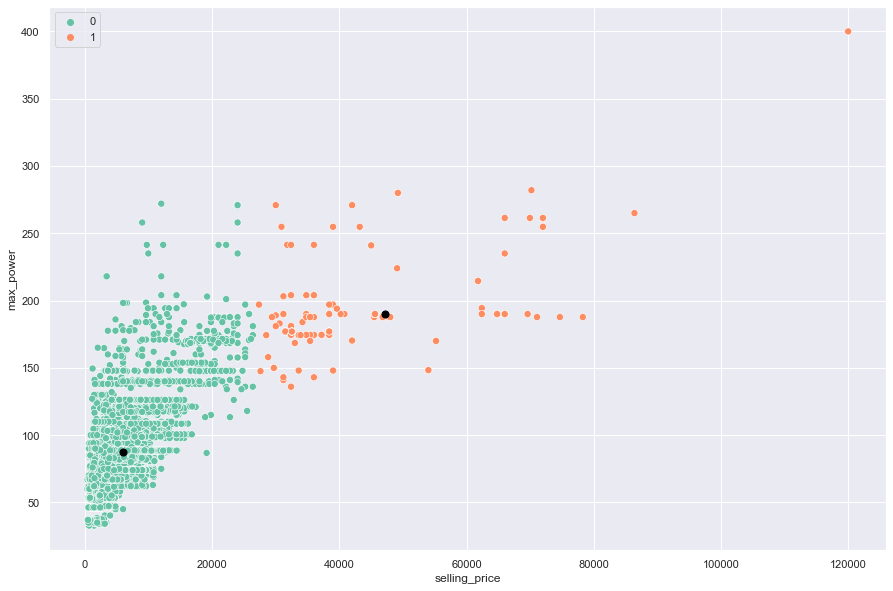

In [263]:
kmeans = KMeans(n_clusters = 2, init = "k-means++")
kmeans.fit(price_power_df)
labels_means = kmeans.predict(price_power_df)
centroids = kmeans.cluster_centers_

fig  = plt.figure(figsize=(15,10))
colour = map(lambda x: colmap[x+1], labels_means)
sns.scatterplot(x = price_power_df["selling_price"],y = price_power_df["max_power"], s = 50, hue = labels_means, palette = "Set2", norm=0.2, vmin=0, vmax=1,)
#plt.ylim(0, 1500)
#plt.xlim(0, 1500)
plt.scatter(centroids[:,0],centroids[:,1], color = "black", s = 50)
plt.show()

In [264]:
# Extracting a dataframe of selling price and engine from the main dataset.
price_engine_df  = car_df[["selling_price","engine"]]
price_engine_df

,selling_price,engine
0,5400,1248
1,4440,1498
2,1896,1497
3,2700,1396
4,1560,1298
...,...,...
7901,3840,1197
7902,1620,1493
7903,4584,1248
7904,3480,1396


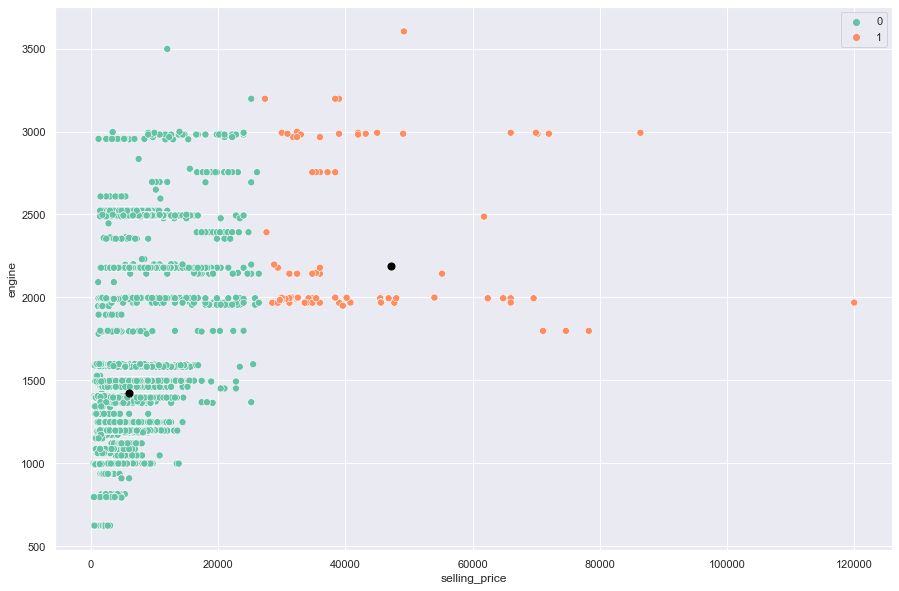

In [265]:
kmeans = KMeans(n_clusters = 2, init = "k-means++")
kmeans.fit(price_engine_df)
labels_means = kmeans.predict(price_engine_df)
centroids = kmeans.cluster_centers_

fig  = plt.figure(figsize=(15,10))
colour = map(lambda x: colmap[x+1], labels_means)
sns.scatterplot(x = price_engine_df["selling_price"], y = price_engine_df["engine"], s = 50, hue = labels_means, palette = "Set2", norm=0.2, vmin=0, vmax=1,)
#plt.ylim(0, 1500)
#plt.xlim(0, 1500)
plt.scatter(centroids[:,0],centroids[:,1], color = "black", s = 50)
plt.show()

In [266]:
# Extracting a dataframe of selling price and engine from the main dataset.
sold_region_df  = car_df[["sold","Region"]]
sold_region_df

,sold,Region
0,Y,East
1,Y,East
2,Y,Central
3,Y,Central
4,Y,East
...,...,...
7901,N,Central
7902,N,Central
7903,N,Central
7904,N,East


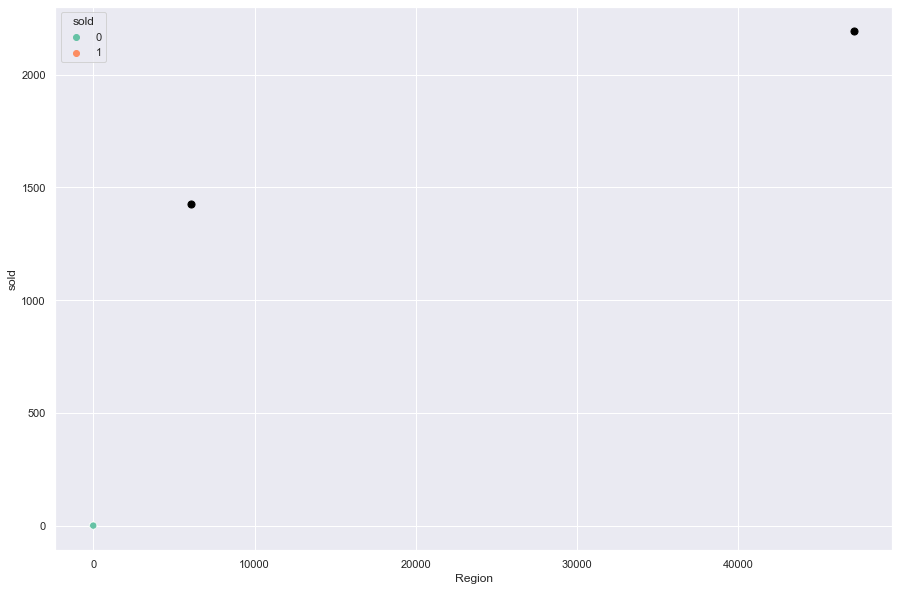

In [267]:
kmeans = KMeans(n_clusters = 2, init = "k-means++")
kmeans.fit(price_engine_df)
labels_means = kmeans.predict(price_engine_df)
centroids = kmeans.cluster_centers_

fig  = plt.figure(figsize=(15,10))
colour = map(lambda x: colmap[x+1], labels_means)
sns.scatterplot(x = refined_car_df["Region"], y = refined_car_df["sold"], s = 50, hue = refined_car_df["sold"], palette = "Set2", norm=0.2, vmin=0, vmax=1,)
#plt.ylim(0, 1500)
#plt.xlim(0, 1500)
plt.scatter(centroids[:,0],centroids[:,1], color = "black", s = 50)
plt.show()

In [268]:
#!python.exe -m pip install --upgrade pip

In [269]:
features = refined_car_df.drop(labels=["selling_price"], axis = 1)
target = refined_car_df["selling_price"]

In [270]:
from scipy.stats import zscore
car_df["std_price"] = zscore(car_df.selling_price)
car_df

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,...,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped,std_price
0,1,Maruti,2014,5400,145500,East,District of Columbia,Washington,Diesel,Individual,...,First_Owner,23.40,1248,74.00,5,Y,190.0,2000,5400.0,-0.245609
1,2,Skoda,2014,4440,120000,East,New York,New York City,Diesel,Individual,...,Second_Owner,21.14,1498,103.52,5,Y,250.0,2000,4440.0,-0.343945
2,3,Honda,2006,1896,140000,Central,Illinois,Chicago,Petrol,Individual,...,Third_Owner,17.70,1497,78.00,5,Y,140.0,2700,1896.0,-0.604537
3,4,Hyundai,2010,2700,127000,Central,Illinois,Chicago,Diesel,Individual,...,First_Owner,23.00,1396,90.00,5,Y,140.0,2250,2700.0,-0.522180
4,5,Maruti,2007,1560,120000,East,New York,New York City,Petrol,Individual,...,First_Owner,16.10,1298,88.20,5,Y,140.0,4500,1560.0,-0.638955
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7901,8124,Hyundai,2013,3840,110000,Central,Texas,Plano,Petrol,Individual,...,First_Owner,18.50,1197,82.85,5,N,113.7,4000,3840.0,-0.405406
7902,8125,Hyundai,2007,1620,119000,Central,Texas,Port Arthur,Diesel,Individual,...,Fourth_Above_Owner,16.80,1493,110.00,5,N,140.0,2325,1620.0,-0.632809
7903,8126,Maruti,2009,4584,120000,Central,Texas,Port Arthur,Diesel,Individual,...,First_Owner,19.30,1248,73.90,5,N,190.0,2000,4584.0,-0.329195
7904,8127,Tata,2013,3480,25000,East,Massachusetts,Lunenburg,Diesel,Individual,...,First_Owner,23.57,1396,70.00,5,N,140.0,2400,3480.0,-0.442282


In [271]:
transmission_dummies = pd.get_dummies(car_df.transmission, prefix="Transmission" )
transmission_dummies

,Transmission_Automatic,Transmission_Manual
0,0,1
1,0,1
2,0,1
3,0,1
4,0,1
...,...,...
7901,0,1
7902,0,1
7903,0,1
7904,0,1


In [272]:
#car_df_test = pd.merge(car_df[["max_power", "engine", "year", "selling_price"]],transmission_dummies, how="inner", left_index=True, right_index=True )

car_df_test = refined_car_df[["max_power", "engine", "year", "transmission", "selling_price"]]
car_df_test

,max_power,engine,year,transmission,selling_price
0,74.00,1248,2014,0,5400
1,103.52,1498,2014,0,4440
2,78.00,1497,2006,0,1896
3,90.00,1396,2010,0,2700
4,88.20,1298,2007,0,1560
...,...,...,...,...,...
7901,82.85,1197,2013,0,3840
7902,110.00,1493,2007,0,1620
7903,73.90,1248,2009,0,4584
7904,70.00,1396,2013,0,3480


In [273]:
# Reshuffling a dataset arrangement
car_df_test = car_df_test.reindex(np.random.permutation(car_df_test.index))
car_df_test

,max_power,engine,year,transmission,selling_price
3273,57.6,936,2013,0,2400
1888,65.0,1461,2012,0,2400
2356,75.0,2523,2015,0,7800
2451,117.6,1497,2019,1,15600
1897,46.3,796,2010,0,1800
...,...,...,...,...,...
6621,53.3,799,2016,0,3780
5558,140.0,2179,2016,1,15600
7560,55.2,814,2013,0,2580
677,63.0,2523,2014,0,4200


### Selling Price Best Feature Selection

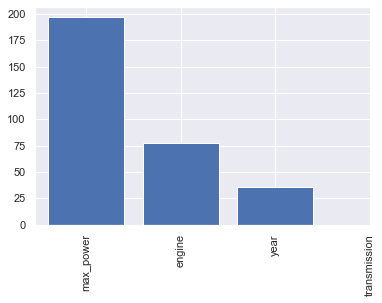

In [274]:
# Read in the accident database using Pandas. Then type:
from sklearn.feature_selection import SelectKBest, chi2, f_regression, f_classif

#Drop any columns that you have not cleaned up or that still have NaNs within. You can 
# return to imputation at a later date if needed. 
# We will need to specify some targets:
predictors = ["max_power", "engine", "year", "transmission"]

#We will also need to get rid of negative values as these can cause problems. 
usethis = refined_car_df
usethis.reset_index(drop=True)
usethis = usethis.filter(['max_power','engine', 'year', 'transmission', 'selling_price'], axis=1)
usethisnow = usethis[(usethis['max_power']>0) & (usethis['engine']>0) & (usethis['year']>0) & (usethis['transmission']>0)]
usethisnow

# Now let’s see what the top N conditions are for our target variable (i.e., accident severity).
# Perform the feature selection
selector = SelectKBest(f_regression, k="all")
selector.fit(usethisnow[predictors], usethisnow["selling_price"])

# Here we will get the p-values for each feature and then transform from p-values into some scores
scores = -np.log10(selector.pvalues_)

# Use plt to plot the scores!  
plt.bar(range(len(predictors)), scores)
plt.xticks(range(len(predictors)), predictors, rotation='vertical')
plt.show()

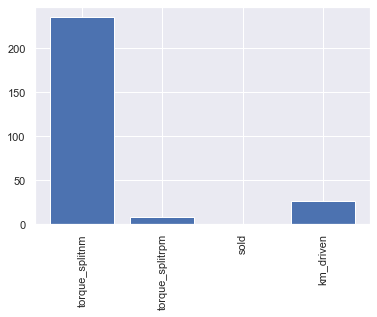

In [275]:
# Read in the accident database using Pandas. Then type:
from sklearn.feature_selection import SelectKBest, chi2, f_regression, f_classif

#Drop any columns that you have not cleaned up or that still have NaNs within. You can 
# return to imputation at a later date if needed. 
# We will need to specify some targets:
predictors = ["torque_splitnm", "torque_splitrpm", "sold", "km_driven"]

#We will also need to get rid of negative values as these can cause problems. 
usethis = refined_car_df
usethis.reset_index(drop=True)
usethis = usethis.filter(['torque_splitnm','torque_splitrpm', 'sold', 'km_driven', 'selling_price'], axis=1)
usethisnow = usethis[(usethis['torque_splitnm']>0) & (usethis['torque_splitrpm']>0) & (usethis['sold']>0) & (usethis['km_driven']>0)]
usethisnow

# Now let’s see what the top N conditions are for our target variable (i.e., accident severity).
# Perform the feature selection
selector = SelectKBest(f_regression, k="all")
selector.fit(usethisnow[predictors], usethisnow["selling_price"])

# Here we will get the p-values for each feature and then transform from p-values into some scores
scores = -np.log10(selector.pvalues_)

# Use plt to plot the scores!  
plt.bar(range(len(predictors)), scores)
plt.xticks(range(len(predictors)), predictors, rotation='vertical')
plt.show()

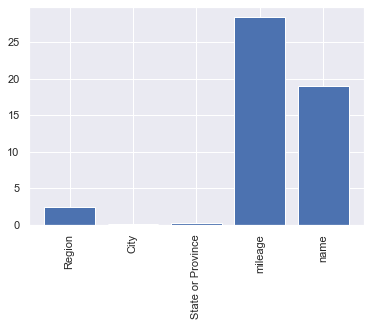

In [276]:
# Read in the accident database using Pandas. Then type:
from sklearn.feature_selection import SelectKBest, chi2, f_regression, f_classif

#Drop any columns that you have not cleaned up or that still have NaNs within. You can 
# return to imputation at a later date if needed. 
# We will need to specify some targets:
predictors = ["Region", "City", "State or Province", "mileage", "name"]

#We will also need to get rid of negative values as these can cause problems. 
usethis = refined_car_df
usethis.reset_index(drop=True)
usethis = usethis.filter(['Region','City', 'State or Province', 'mileage', 'name', 'selling_price'], axis=1)
usethisnow = usethis[(usethis['Region']>0) & (usethis['City']>0) & (usethis['State or Province']>0) & (usethis['mileage']>0) & (usethis['name']>0)]
usethisnow

# Now let’s see what the top N conditions are for our target variable (i.e., accident severity).
# Perform the feature selection
selector = SelectKBest(f_regression, k="all")
selector.fit(usethisnow[predictors], usethisnow["selling_price"])

# Here we will get the p-values for each feature and then transform from p-values into some scores
scores = -np.log10(selector.pvalues_)

# Use plt to plot the scores!  
plt.bar(range(len(predictors)), scores)
plt.xticks(range(len(predictors)), predictors, rotation='vertical')
plt.show()

### Sold Best Feature Selection

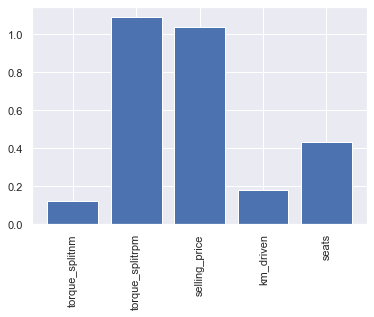

In [277]:
# Read in the accident database using Pandas. Then type:
from sklearn.feature_selection import SelectKBest, chi2, f_regression, f_classif

#Drop any columns that you have not cleaned up or that still have NaNs within. You can 
# return to imputation at a later date if needed. 
# We will need to specify some targets:
predictors = ["torque_splitnm", "torque_splitrpm", "selling_price", "km_driven", "seats"]

#We will also need to get rid of negative values as these can cause problems. 
usethis = refined_car_df
usethis.reset_index(drop=True)
usethis = usethis.filter(['torque_splitnm','torque_splitrpm', 'selling_price', 'km_driven', 'seats', 'sold'], axis=1)
usethisnow = usethis[(usethis['torque_splitnm']>0) & (usethis['torque_splitrpm']>0) & (usethis['selling_price']>0) & (usethis['km_driven']>0) & (usethis['seats']>0)]
usethisnow

# Now let’s see what the top N conditions are for our target variable (i.e., accident severity).
# Perform the feature selection
selector = SelectKBest(f_regression, k="all")
selector.fit(usethisnow[predictors], usethisnow["sold"])

# Here we will get the p-values for each feature and then transform from p-values into some scores
scores = -np.log10(selector.pvalues_)

# Use plt to plot the scores!  
plt.bar(range(len(predictors)), scores)
plt.xticks(range(len(predictors)), predictors, rotation='vertical')
plt.show()

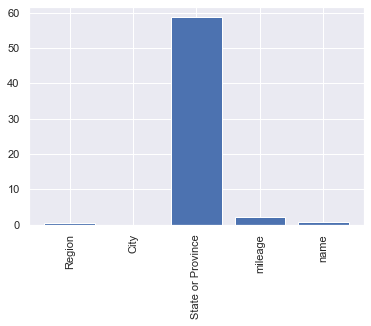

In [278]:
# Read in the accident database using Pandas. Then type:
from sklearn.feature_selection import SelectKBest, chi2, f_regression, f_classif

#Drop any columns that you have not cleaned up or that still have NaNs within. You can 
# return to imputation at a later date if needed. 
# We will need to specify some targets:
predictors = ["Region", "City", "State or Province", "mileage", "name"]

#We will also need to get rid of negative values as these can cause problems. 
usethis = refined_car_df
usethis.reset_index(drop=True)
usethis = usethis.filter(['Region','City', 'State or Province', 'mileage', 'name', 'sold'], axis=1)
usethisnow = usethis[(usethis['Region']>0) & (usethis['City']>0) & (usethis['State or Province']>0) & (usethis['mileage']>0) & (usethis['name']>0)]
usethisnow

# Now let’s see what the top N conditions are for our target variable (i.e., accident severity).
# Perform the feature selection
selector = SelectKBest(f_regression, k="all")
selector.fit(usethisnow[predictors], usethisnow["sold"])

# Here we will get the p-values for each feature and then transform from p-values into some scores
scores = -np.log10(selector.pvalues_)

# Use plt to plot the scores!  
plt.bar(range(len(predictors)), scores)
plt.xticks(range(len(predictors)), predictors, rotation='vertical')
plt.show()

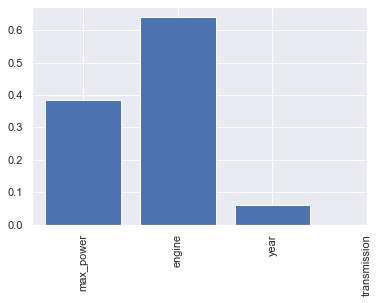

In [279]:
# Read in the accident database using Pandas. Then type:
from sklearn.feature_selection import SelectKBest, chi2, f_regression, f_classif

#Drop any columns that you have not cleaned up or that still have NaNs within. You can 
# return to imputation at a later date if needed. 
# We will need to specify some targets:
predictors = ["max_power", "engine", "year", "transmission"]

#We will also need to get rid of negative values as these can cause problems. 
usethis = refined_car_df
usethis.reset_index(drop=True)
usethis = usethis.filter(['max_power','engine', 'year', 'transmission', 'sold'], axis=1)
usethisnow = usethis[(usethis['max_power']>0) & (usethis['engine']>0) & (usethis['year']>0) & (usethis['transmission']>0)]
usethisnow

# Now let’s see what the top N conditions are for our target variable (i.e., accident severity).
# Perform the feature selection
selector = SelectKBest(f_classif, k="all")
selector.fit(usethisnow[predictors], usethisnow["sold"])

# Here we will get the p-values for each feature and then transform from p-values into some scores
scores = -np.log10(selector.pvalues_)

# Use plt to plot the scores!  
plt.bar(range(len(predictors)), scores)
plt.xticks(range(len(predictors)), predictors, rotation='vertical')
plt.show()

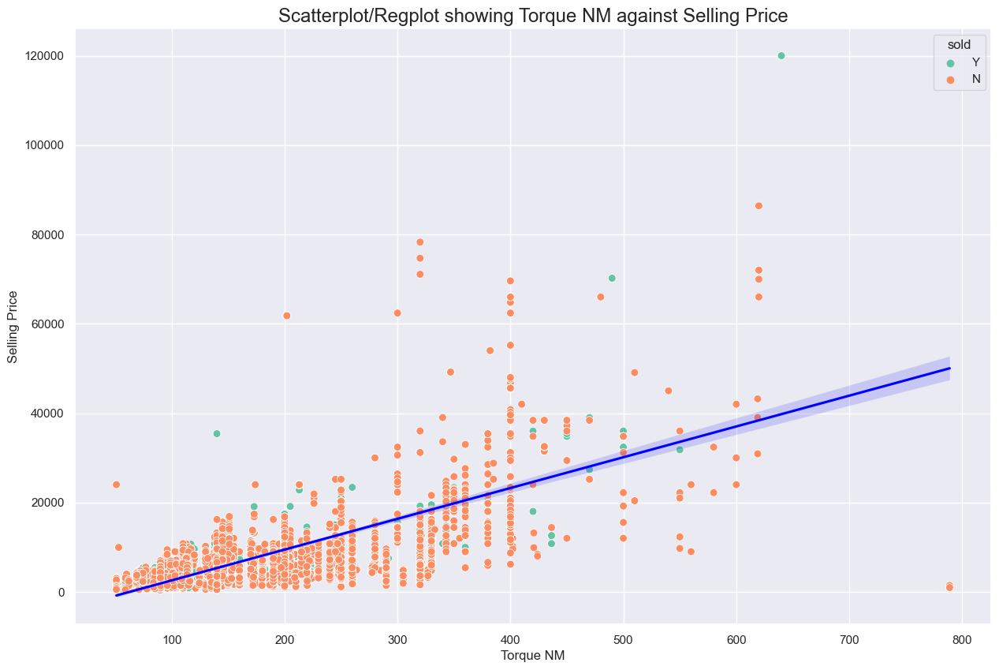

In [280]:
# Regplot plot of selling price and selling price group count

nm_selling_price_reg_plot = plt.figure(figsize=(15,10), dpi = 100 )
nm_selling_price_reg_chart = sns.scatterplot(data=car_df, x= "torque_splitnm", y="selling_price", s=50, marker="o", hue="sold", palette="Set2")
nm_selling_price_reg_chart2 = sns.regplot(data=car_df, x= "torque_splitnm", y="selling_price", fit_reg=True, scatter=False, line_kws={"color":"blue"})
nm_selling_price_reg_chart.set(xlabel="Torque NM", ylabel='Selling Price')
#nm_selling_price_reg_chart.set_xticklabels(name_selling_price_box_chart.get_xticklabels(), rotation=90, horizontalalignment='center',fontweight='light', fontsize='x-large')
plt.title("Scatterplot/Regplot showing Torque NM against Selling Price", fontsize="x-large" , fontweight="light", loc="center")
plt.show()

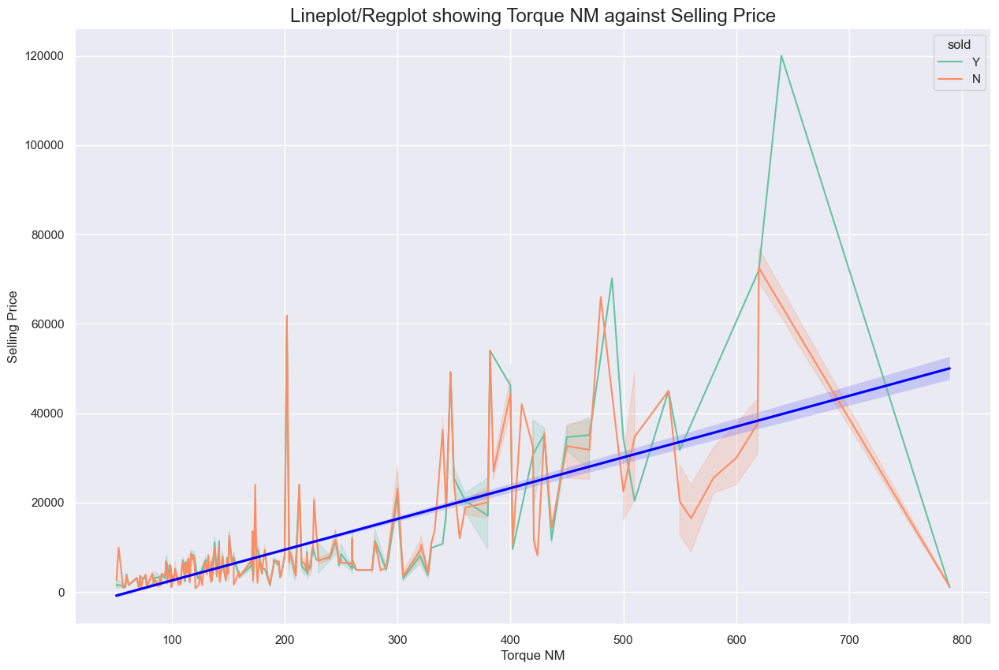

In [281]:
# Regplot plot of selling price and selling price group count

nm_selling_price_line_plot2 = plt.figure(figsize=(15,10), dpi = 100 )
nm_selling_price_reg_chart = sns.lineplot(data=car_df, x= "torque_splitnm", y="selling_price", hue="sold", palette="Set2")
nm_selling_price_reg_chart2 = sns.regplot(data=car_df, x= "torque_splitnm", y="selling_price", fit_reg=True, scatter=False, line_kws={"color":"blue"})
nm_selling_price_reg_chart.set(xlabel="Torque NM", ylabel='Selling Price')
#nm_selling_price_reg_chart.set_xticklabels(name_selling_price_box_chart.get_xticklabels(), rotation=90, horizontalalignment='center',fontweight='light', fontsize='x-large')
plt.title("Lineplot/Regplot showing Torque NM against Selling Price", fontsize="x-large" , fontweight="light", loc="center")
plt.show()

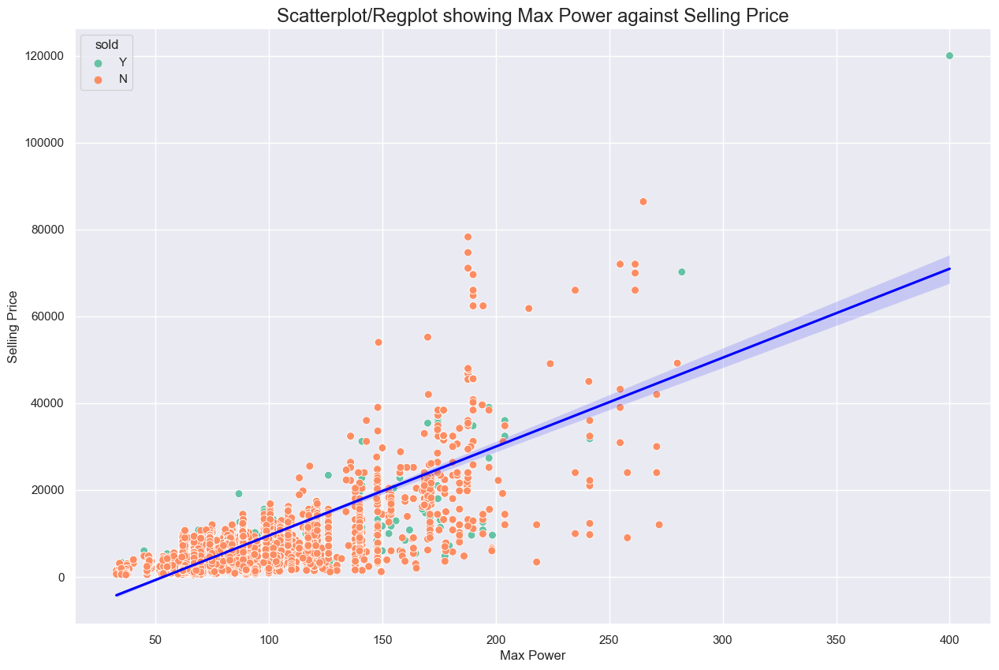

In [282]:
# Regplot plot of selling price and selling price group count

max_pow_selling_price_reg_plot = plt.figure(figsize=(15,10), dpi = 100 )
max_pow_selling_price_reg_chart = sns.scatterplot(data=car_df, x= "max_power", y="selling_price", s=50, marker="o", hue="sold", palette="Set2")
max_pow_selling_price_reg_chart2 = sns.regplot(data=car_df, x= "max_power", y="selling_price", fit_reg=True, scatter=False, line_kws={"color":"blue"})
max_pow_selling_price_reg_chart.set(xlabel="Max Power", ylabel='Selling Price')
#nm_selling_price_reg_chart.set_xticklabels(name_selling_price_box_chart.get_xticklabels(), rotation=90, horizontalalignment='center',fontweight='light', fontsize='x-large')
plt.title("Scatterplot/Regplot showing Max Power against Selling Price", fontsize="x-large" , fontweight="light", loc="center")
plt.show()

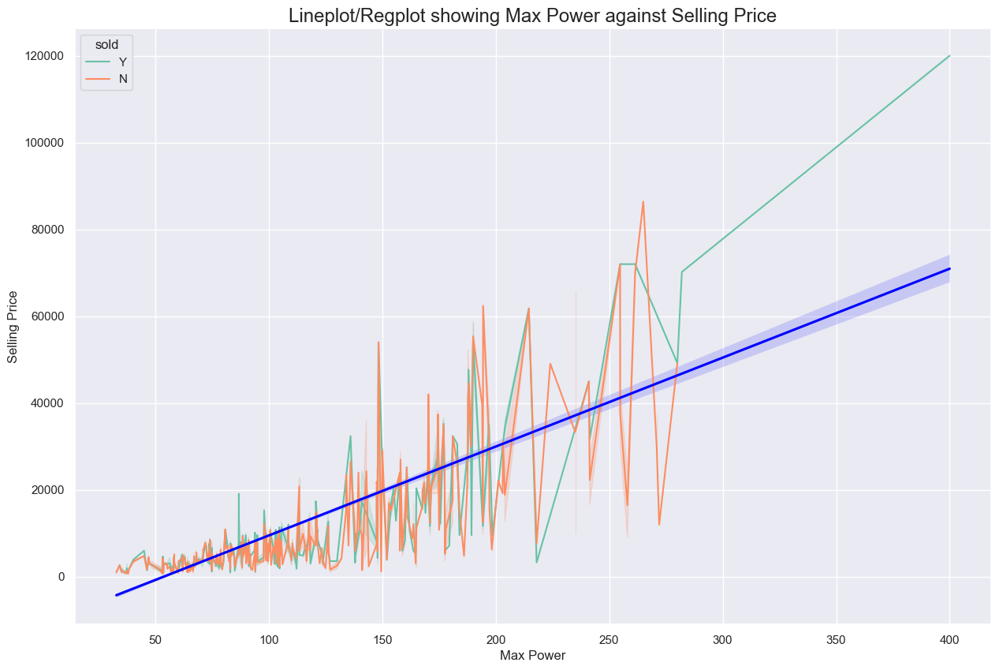

In [283]:
# Regplot plot of selling price and selling price group count

max_pow_selling_price_line_plot2 = plt.figure(figsize=(15,10), dpi = 100 )
max_pow_selling_price_reg_chart = sns.lineplot(data=car_df, x= "max_power", y="selling_price", hue="sold", palette="Set2")
max_pow_selling_price_reg_chart2 = sns.regplot(data=car_df, x= "max_power", y="selling_price", fit_reg=True, scatter=False, line_kws={"color":"blue"})
max_pow_selling_price_reg_chart.set(xlabel="Max Power", ylabel='Selling Price')
#nm_selling_price_reg_chart.set_xticklabels(name_selling_price_box_chart.get_xticklabels(), rotation=90, horizontalalignment='center',fontweight='light', fontsize='x-large')
plt.title("Lineplot/Regplot showing Max Power against Selling Price", fontsize="x-large" , fontweight="light", loc="center")
plt.show()

### Processing Model for Price Prediction Task

In [284]:
refined_car_df[["torque_splitnm", "max_power", "engine", "year"]]

,torque_splitnm,max_power,engine,year
0,190.0,74.00,1248,2014
1,250.0,103.52,1498,2014
2,140.0,78.00,1497,2006
3,140.0,90.00,1396,2010
4,140.0,88.20,1298,2007
...,...,...,...,...
7901,113.7,82.85,1197,2013
7902,140.0,110.00,1493,2007
7903,190.0,73.90,1248,2009
7904,140.0,70.00,1396,2013


In [285]:
features_selling_price = refined_car_df[["torque_splitnm", "max_power", "engine", "year"]]
target_selling_price = refined_car_df["selling_price"]

x_train,x_test,y_train ,y_test=  train_test_split(features_selling_price,target_selling_price, test_size = 0.25, random_state = 42, shuffle=True, stratify=None)

In [286]:
x_train

,torque_splitnm,max_power,engine,year
964,140.0,70.00,1405,2006
3790,60.0,40.30,796,2017
1423,290.0,120.00,2179,2003
122,200.0,88.76,1248,2013
3927,114.0,84.00,1199,2017
...,...,...,...,...
5226,115.0,83.10,1197,2019
5390,109.0,86.80,1198,2016
860,140.0,94.00,1495,2003
7603,380.0,181.00,1995,2012


In [287]:
# Get the index of x_test values
x_test_index = x_test.index
x_train_index = x_train.index

In [288]:
x_train = x_train.values
x_train

array([[ 140.  ,   70.  , 1405.  , 2006.  ],
       [  60.  ,   40.3 ,  796.  , 2017.  ],
       [ 290.  ,  120.  , 2179.  , 2003.  ],
       ...,
       [ 140.  ,   94.  , 1495.  , 2003.  ],
       [ 380.  ,  181.  , 1995.  , 2012.  ],
       [ 117.  ,   81.86, 1197.  , 2018.  ]])

In [289]:
x_test = x_test.values
x_test

array([[ 190. ,   74. , 1248. , 2014. ],
       [ 190. ,   74. , 1248. , 2015. ],
       [ 135.4,   70. , 1405. , 2012. ],
       ...,
       [  74.5,   55.2,  814. , 2012. ],
       [ 215. ,   99. , 1498. , 2017. ],
       [ 138. ,  103. , 1462. , 2018. ]])

In [290]:
x_train.shape

(5929, 4)

In [291]:
x_test.shape

(1977, 4)

In [292]:
y_train = y_train.values
y_train

array([ 1200,  3120,  3600, ...,  1320, 10800,  9600], dtype=int64)

In [293]:
y_test = y_test.values
y_test

array([6012, 5280, 1680, ..., 2280, 5160, 8400], dtype=int64)

In [294]:
y_train.shape

(5929,)

In [295]:
y_test.shape

(1977,)

### Standardising the data

In [296]:
# MinMax Scaler was chosen to standardise the data because it preserves the relationship in the data.
standard_scaler = StandardScaler()
x_train_min_max = standard_scaler.fit_transform(x_train)
x_test_min_max = standard_scaler.transform(x_test)

### Metrics for Regressor Models

In [297]:
class get_reg_metrics:
    
    def __init__(self,model,reg_name, checker=0, features=features_selling_price,target=target_selling_price):
        if (checker == 0):
            self.model = model
            self.train = y_train
            self.test = y_test
            self.reg_name = reg_name
            self.features = features
            self.target = target
            self.checker = checker

            # Predicting training data
            self.train_pred = (self.model).predict(x_train)

            # predicting test data
            self.test_pred = (self.model).predict(x_test)
        
        elif (checker == 1):
            self.model = model
            self.train = standard_scaler.inverse_transform(y_train_min_max.reshape(-1,1))
            self.test = standard_scaler.inverse_transform(y_test_min_max.reshape(-1,1))
            self.reg_name = reg_name
            self.features = pd.DataFrame(x_train_min_max)
            self.target = pd.DataFrame(y_train_min_max)
            self.checker = checker

            # Predicting training data
            self.train_pred = standard_scaler.inverse_transform((self.model).predict(x_train_min_max).reshape(-1,1))

            # predicting test data
            self.test_pred = standard_scaler.inverse_transform((self.model).predict(x_test_min_max).reshape(-1,1))
            
        else:
            print("Use either 0 or 1 for checker parameter")
    
    # Make predictions on the training and test datasets
    def get_pred(self):
        print("Training predictions are : \n{}\n\nTest predictions are : \n{}".format(self.train_pred,self.test_pred))
        self.result =  [self.train_pred, self.test_pred]
        return self.result
        
    # Evaluating model train and test accuracy score
    def get_accuracy_score(self):
        print("The training accuracy for {} is {}".format(self.reg_name, r2_score(self.train, self.train_pred, multioutput='uniform_average')))
        print("The test accuracy for {} is {}".format(self.reg_name, r2_score(self.test, self.test_pred, multioutput='uniform_average')))

    # Evaluating the Algorithm
    def get_error_metrics(self): 
        print("Mean Absolute Error for {} : {}".format(self.reg_name,mean_absolute_error(self.test, self.test_pred)))  
        print("Mean Squared Error for {} : {}".format(self.reg_name,mean_squared_error(self.test, self.test_pred)))
        print("Root Mean Squared Error for {} : {}".format(self.reg_name, np.sqrt(mean_squared_error(self.test, self.test_pred))))
        
    # To check the mean bias error of the predictions if they are positive or negative
    def mean_bias_error(self):
        bias_error = self.test - self.test_pred
        mbe_loss = np.mean(np.sum(bias_error) / self.test.size)
        print("Mean bias error for {} : {}".format(self.reg_name, mbe_loss))
    
    # Performance metric measurement of the model
    def relative_root_mean_squrae_error(self):
        number = np.sum(np.square(self.test - self.test_pred))
        density = np.sum(np.square(self.test_pred))
        squared_error =  number/density
        rrmse_loss = np.sqrt(squared_error)
        print("Relative root mean square error for {} : {}".format(self.reg_name, rrmse_loss))

    # Perform cross-validation on the model with the data
    def get_cross_val_result(self):
            if (self.checker == 0):
                cv = RepeatedStratifiedKFold(n_splits=3, n_repeats=3, random_state=1)
                scores = cross_validate(self.model, self.features, self.target, cv=cv,
                                       scoring=('r2', "neg_mean_absolute_error", "neg_mean_squared_error" ,'neg_root_mean_squared_error'),
                                       return_train_score=True)
                scores = pd.DataFrame(scores)
                print("Train Data Accuracy Average After Cross_validation with {} : {}".format(self.reg_name, scores["train_r2"].mean()))
                print("Test Data Accuracy Average After Cross_validation with {} : {}".format(self.reg_name, scores["test_r2"].mean()))
                display(scores)
            else:
                pass
              
    # Compare predicted and actual prices in created dataframe
    def get_new_dfs(self):
        if (self.checker == 0):
              
            # Concatenating the predicted prices to actual dataset rows for comparism
            car_train_df= refined_car_df.loc[x_train_index]
            car_test_df = refined_car_df.loc[x_test_index]

            car_train_df = car_train_df.reset_index()
            car_test_df = car_test_df.reset_index()     

            train_pred_df = pd.DataFrame(data=self.train_pred, index=x_train_index, columns=["Predicted Selling Price"])
            train_pred_df = train_pred_df.reset_index()
            test_pred_df = pd.DataFrame(data=self.test_pred, index=x_test_index, columns=["Predicted Selling Price"])
            test_pred_df = test_pred_df.reset_index()
            car_train_df = pd.merge(car_train_df,round(train_pred_df,2), how="inner", on="index")
            car_test_df = pd.merge(car_test_df,round(test_pred_df,2), how="inner", on="index")

            car_train_df.drop(labels="index", axis=1, inplace=True)
            car_test_df.drop(labels="index", axis=1, inplace=True)

            car_train_df["selling_diff"] = car_train_df["selling_price"] - car_train_df["Predicted Selling Price"]
            car_train_df["upper_limit_train_thres"] = car_train_df["selling_price"]*1.05 - car_train_df["selling_price"]
            car_train_df["lower_limit_train_thres"] = car_train_df["selling_price"]*0.95 - car_train_df["selling_price"]
            car_train_df["+/-train_threshold"] = car_train_df["selling_price"]*1.05 - car_train_df["selling_price"]
            
            print("Train prediction mean deviation: ",car_train_df["selling_diff"].mean())
            print("Train prediction standard deviation: ",car_train_df["selling_diff"].std())
            self.train_sell_df = car_train_df[["torque_splitnm","selling_price","Predicted Selling Price", "selling_diff", "+/-train_threshold"]]
            display((car_train_df[["torque_splitnm","selling_price","Predicted Selling Price","selling_diff", "lower_limit_train_thres", "+/-train_threshold"]]).head(10))

            car_test_df["selling_diff"] = car_test_df["selling_price"] - car_test_df["Predicted Selling Price"]
            car_test_df["upper_limit_test_thres"] = car_test_df["selling_price"]*1.05 - car_test_df["selling_price"]
            car_test_df["lower_limit_test_thres"] = car_test_df["selling_price"]*0.95 - car_test_df["selling_price"]
            car_test_df["+/-test_threshold"] = car_test_df["selling_price"]*1.05 - car_test_df["selling_price"]
            
            print("Test prediction mean deviation: ",car_test_df["selling_diff"].mean())
            print("Test prediction standard deviation: ",car_test_df["selling_diff"].std())
            self.test_sell_df = car_test_df[["torque_splitnm","selling_price","Predicted Selling Price", "selling_diff", "+/-test_threshold"]]
            display((car_test_df[["torque_splitnm","selling_price","Predicted Selling Price", "selling_diff", "+/-test_threshold",]]).head(10))
            
            within_train_limit = car_train_df[(car_train_df["selling_diff"] > car_train_df['upper_limit_train_thres']) | (car_train_df["selling_diff"] < car_train_df["lower_limit_train_thres"])]
            perc_within_train_limit = len(within_train_limit)/len(car_train_df)
            print("The percentage of train predictions within limit are: ",perc_within_train_limit)
            print("The percentage of train predictions outside limit are: ",1-perc_within_train_limit)
            
            within_test_limit = car_test_df[(car_test_df["selling_diff"] > car_test_df['upper_limit_test_thres']) | (car_test_df["selling_diff"] < car_test_df["lower_limit_test_thres"])]
            perc_within_test_limit = len(within_test_limit)/len(car_test_df)
            print("The percentage of test predictions within limit are: ",perc_within_test_limit)
            print("The percentage of test predictions outside limit are: ",1-perc_within_test_limit)
        
        elif (self.checker == 1):
            # Concatenating the predicted prices to actual dataset rows for comparism
            car_train_df= refined_car_df.loc[x_train_stdzz.index]
            car_test_df = refined_car_df.loc[x_test_stdzz.index]

            car_train_df = car_train_df.reset_index()
            car_test_df = car_test_df.reset_index()  
            
            self.train_pred = np.reshape(self.train_pred,len(self.train_pred))
            self.test_pred = np.reshape(self.test_pred,len(self.test_pred))

            train_pred_df = pd.DataFrame(data=self.train_pred, index=x_train_stdzz.index, columns=["Predicted Selling Price"])
            train_pred_df = train_pred_df.reset_index()
            test_pred_df = pd.DataFrame(data=self.test_pred, index=x_test_stdzz.index, columns=["Predicted Selling Price"])
            test_pred_df = test_pred_df.reset_index()
            car_train_df = pd.merge(car_train_df,round(train_pred_df,2), how="inner", on="index")
            car_test_df = pd.merge(car_test_df,round(test_pred_df,2), how="inner", on="index")

            car_train_df.drop(labels="index", axis=1, inplace=True)
            car_test_df.drop(labels="index", axis=1, inplace=True)

            car_train_df["selling_diff"] = car_train_df["selling_price"] - car_train_df["Predicted Selling Price"]
            car_train_df["upper_limit_train_thres"] = car_train_df["selling_price"]*1.05 - car_train_df["selling_price"]
            car_train_df["lower_limit_train_thres"] = car_train_df["selling_price"]*0.95 - car_train_df["selling_price"]
            car_train_df["+/-train_threshold"] = car_train_df["selling_price"]*1.05 - car_train_df["selling_price"]
            
            print("Train prediction mean deviation: ",car_train_df["selling_diff"].mean())
            print("Train prediction standard deviation: ",car_train_df["selling_diff"].std())
            self.train_sell_df = car_train_df[["torque_splitnm","selling_price","Predicted Selling Price", "selling_diff", "+/-train_threshold"]]
            display((car_train_df[["torque_splitnm","selling_price","Predicted Selling Price","selling_diff", "+/-train_threshold"]]).head(10))

            car_test_df["selling_diff"] = car_test_df["selling_price"] - car_test_df["Predicted Selling Price"]
            car_test_df["upper_limit_test_thres"] = car_test_df["selling_price"]*1.05 - car_test_df["selling_price"]
            car_test_df["lower_limit_test_thres"] = car_test_df["selling_price"]*0.95 - car_test_df["selling_price"]
            car_test_df["+/-test_threshold"] = car_test_df["selling_price"]*1.05 - car_test_df["selling_price"]
            
            print("Test prediction mean deviation: ",car_test_df["selling_diff"].mean())
            print("Test prediction standard deviation: ",car_test_df["selling_diff"].std())
            self.test_sell_df = car_test_df[["torque_splitnm","selling_price","Predicted Selling Price", "selling_diff", "+/-test_threshold"]]
            display((car_test_df[["torque_splitnm","selling_price","Predicted Selling Price", "selling_diff", "+/-test_threshold"]]).head(10))
        
            within_train_limit = car_train_df[(car_train_df["selling_diff"] < car_train_df['upper_limit_train_thres']) | (car_train_df["selling_diff"] < car_train_df["lower_limit_train_thres"])]
            perc_within_train_limit = len(within_train_limit)/len(car_train_df)
            print("The percentage of train predictions within limit are: ",perc_within_train_limit)
            print("The percentage of train predictions outside limit are: ",1-perc_within_train_limit)
            
            within_test_limit = car_test_df[(car_test_df["selling_diff"] < car_test_df['upper_limit_test_thres']) | (car_test_df["selling_diff"] < car_test_df["lower_limit_test_thres"])]
            perc_within_test_limit = len(within_test_limit)/len(car_test_df)
            print("The percentage of test predictions within limit are: ",perc_within_test_limit)
            print("The percentage of test predictions outside limit are: ",1-perc_within_test_limit)
            
            
        else:
            print("Use either 0 or 1 for checker parameter")
            
        
     # Execute all functions in the class         
    def execute_metrics(self):
        self.get_pred()
        print("\n")
        self.get_accuracy_score()
        print("\n")
        self.get_error_metrics()
        print("\n")
        self.mean_bias_error()
        print("\n")
        self.relative_root_mean_squrae_error()
        print("\n")
        self.get_cross_val_result()
        print("\n")
        self.get_new_dfs()
        return [self.train_pred, self.test_pred, self.train_sell_df, self.test_sell_df]
    

### Function to generate performance plot

In [298]:
# Lineplot of max power and selling price for the test data
def generate_plot(pred_list, reg_name, checker=0):
    if (checker == 0):
        validation_line_plot = plt.figure(figsize=(20,10), dpi = 100 )
        plt.subplot(1,2,1)
        actual_validation_line_chart = sns.lineplot(x= x_test_torque_nm, y=x_test_sell_pri, palette="Set2", label= "Actual Price")
        actual_validation_line_chart2 = sns.lineplot(x= x_test_torque_nm, y=pred_list[1], palette="Set2", label="Predicted Price" )
        actual_validation_line_chart.set(xlabel="Torque in NM", ylabel='Selling Price')
        plt.title(f"Torque in NM vs actual selling price  and {reg_name} predicted selling price\nfor test dataset", fontsize="large" , fontweight="light", loc="center")
        plt.legend()
        #plt.xlim(50,250)

        plt.subplot(1,2,2)
        # Lineplot of max power and selling price for the training data
        actual_validation_line_chart = sns.lineplot(x= x_train_torque_nm, y=x_train_sell_pri, palette="Set2", label= "Actual Price")
        actual_validation_line_chart2 = sns.lineplot(x= x_train_torque_nm, y=pred_list[0], palette="Set2", label="Predicted Price" )
        actual_validation_line_chart.set(xlabel="Torque in NM", ylabel='Selling Price')
        plt.title(f"Torque in NM vs actual selling price  and {reg_name} predicted selling price\nfor training dataset", fontsize="large" , fontweight="light", loc="center")
        plt.legend()
        #plt.xlim(50,250)
        plt.show()
    
    if (checker == 1):
        validation_line_plot = plt.figure(figsize=(20,10), dpi = 100 )
        plt.subplot(1,2,1)
        actual_validation_line_chart = sns.lineplot(x= pred_list[3].torque_splitnm , y=pred_list[3].selling_price, palette="Set2", label= "Actual Price")
        actual_validation_line_chart2 = sns.lineplot(x= pred_list[3].torque_splitnm , y=pred_list[1], palette="Set2", label="Predicted Price" )
        actual_validation_line_chart.set(xlabel="Torque in NM", ylabel='Selling Price')
        plt.title(f"Torque in NM vs actual selling price  and {reg_name} predicted selling price\nfor test dataset", fontsize="large" , fontweight="light", loc="center")
        plt.legend()
        #plt.xlim(50,250)

        plt.subplot(1,2,2)
        # Lineplot of max power and selling price for the training data
        actual_validation_line_chart = sns.lineplot(x= pred_list[2].torque_splitnm , y=pred_list[2].selling_price, palette="Set2", label= "Actual Price")
        actual_validation_line_chart2 = sns.lineplot(x= pred_list[2].torque_splitnm , y=pred_list[0], palette="Set2", label="Predicted Price" )
        actual_validation_line_chart.set(xlabel="Torque in NM", ylabel='Selling Price')
        plt.title(f"Torque in NM vs actual selling price  and {reg_name} predicted selling price\nfor training dataset", fontsize="large" , fontweight="light", loc="center")
        plt.legend()
        #plt.xlim(50,250)
        plt.show()
    
    return validation_line_plot

In [299]:
x_test_torque_nm = refined_car_df.torque_splitnm.loc[x_test_index]
x_test_sell_pri = refined_car_df.selling_price.loc[x_test_index]
x_train_torque_nm = refined_car_df.torque_splitnm.loc[x_train_index]
x_train_sell_pri = refined_car_df.selling_price.loc[x_train_index]

In [300]:
x_test_torque_nm

3641    190.0
5531    190.0
3524    135.4
7478    205.0
3455    113.0
        ...  
7447    240.0
6353     96.1
7765     74.5
4224    215.0
2251    138.0
Name: torque_splitnm, Length: 1977, dtype: float64

### Random Forest Regressor

In [301]:
# Defining the model parameters and fitting the model
rf_reg = RandomForestRegressor(n_estimators=100,
                               criterion='squared_error', 
                               max_depth=20, 
                               min_samples_split=2, 
                               min_samples_leaf=1, 
                               min_weight_fraction_leaf=0.0,
                               max_features=1.0, 
                               max_leaf_nodes=500,
                               min_impurity_decrease=0.0,
                               bootstrap=True, 
                               oob_score=True,
                               n_jobs=-1,
                               random_state=40, 
                               verbose=0,
                               warm_start=False,
                               ccp_alpha=0.0, 
                               max_samples=None)

rf_reg.fit(x_train, y_train)

# Predicting training data
rf_pred_train = rf_reg.predict(x_train)
# predicting test data
rf_pred = rf_reg.predict(x_test)


In [302]:
rf_reg.decision_path(x_train)

(<5929x99900 sparse matrix of type '<class 'numpy.int64'>'
 	with 7130293 stored elements in Compressed Sparse Row format>,
 array([    0,   999,  1998,  2997,  3996,  4995,  5994,  6993,  7992,
         8991,  9990, 10989, 11988, 12987, 13986, 14985, 15984, 16983,
        17982, 18981, 19980, 20979, 21978, 22977, 23976, 24975, 25974,
        26973, 27972, 28971, 29970, 30969, 31968, 32967, 33966, 34965,
        35964, 36963, 37962, 38961, 39960, 40959, 41958, 42957, 43956,
        44955, 45954, 46953, 47952, 48951, 49950, 50949, 51948, 52947,
        53946, 54945, 55944, 56943, 57942, 58941, 59940, 60939, 61938,
        62937, 63936, 64935, 65934, 66933, 67932, 68931, 69930, 70929,
        71928, 72927, 73926, 74925, 75924, 76923, 77922, 78921, 79920,
        80919, 81918, 82917, 83916, 84915, 85914, 86913, 87912, 88911,
        89910, 90909, 91908, 92907, 93906, 94905, 95904, 96903, 97902,
        98901, 99900], dtype=int32))

In [303]:
# Generate metrics report
rf_reg_pred = get_reg_metrics(rf_reg,"Random Forest Regressor").execute_metrics()

Training predictions are : 
[ 1431.12128531  3276.06907343  2758.17387563 ...  1228.41253732
 12685.18333333  9041.6522642 ]

Test predictions are : 
[5639.6913212  6365.84418285 2244.95759533 ... 2283.74397756 7019.99292265
 9716.12018472]


The training accuracy for Random Forest Regressor is 0.9869567473536864
The test accuracy for Random Forest Regressor is 0.9791780533559505


Mean Absolute Error for Random Forest Regressor : 853.172975450203
Mean Squared Error for Random Forest Regressor : 2178534.1915502893
Root Mean Squared Error for Random Forest Regressor : 1475.985837178084


Mean bias error for Random Forest Regressor : -9.617236873505636


Relative root mean square error for Random Forest Regressor : 0.11521170126772094


Train Data Accuracy Average After Cross_validation with Random Forest Regressor : 0.9877606051486956
Test Data Accuracy Average After Cross_validation with Random Forest Regressor : 0.9697790136529633


,fit_time,score_time,test_r2,train_r2,test_neg_mean_absolute_error,train_neg_mean_absolute_error,test_neg_mean_squared_error,train_neg_mean_squared_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
0,4.671147,0.035955,0.965874,0.987846,-871.690261,-677.660461,-3.305035e+06,-1.148963e+06,-1817.975563,-1071.896889
1,0.487701,0.035539,0.969604,0.988199,-942.476481,-665.133287,-2.884018e+06,-1.127171e+06,-1698.239590,-1061.683096
2,0.526700,0.040976,0.972551,0.986485,-895.202639,-694.720802,-2.585213e+06,-1.295650e+06,-1607.859677,-1138.266074
3,0.495719,0.039278,0.967093,0.987316,-868.347426,-686.290049,-3.186932e+06,-1.199073e+06,-1785.198132,-1095.021983
4,0.489723,0.036325,0.975874,0.987130,-872.403432,-689.705821,-2.289058e+06,-1.229293e+06,-1512.963250,-1108.734844
5,0.502713,0.037935,0.969373,0.988813,-911.361184,-660.868752,-2.884524e+06,-1.072434e+06,-1698.388750,-1035.584021
6,0.532697,0.042596,0.961440,0.988040,-903.696762,-677.815090,-3.734439e+06,-1.130558e+06,-1932.469590,-1063.277155
7,0.525698,0.040997,0.972320,0.987948,-907.759568,-669.154378,-2.626319e+06,-1.151134e+06,-1620.592197,-1072.909347
8,0.498718,0.040545,0.973882,0.988069,-884.516063,-672.863800,-2.459840e+06,-1.143785e+06,-1568.387686,-1069.478731




Train prediction mean deviation:  7.136461460617292
Train prediction standard deviation:  1096.6588675110634


,torque_splitnm,selling_price,Predicted Selling Price,selling_diff,lower_limit_train_thres,+/-train_threshold
0,140.0,1200,1431.12,-231.12,-60.0,60.0
1,60.0,3120,3276.07,-156.07,-156.0,156.0
2,290.0,3600,2758.17,841.83,-180.0,180.0
3,200.0,7500,5674.60,1825.40,-375.0,375.0
4,114.0,5160,5395.90,-235.90,-258.0,258.0
5,114.0,1920,2325.99,-405.99,-96.0,96.0
6,500.0,36000,34335.87,1664.13,-1800.0,1800.0
7,190.0,7920,8611.95,-691.95,-396.0,396.0
8,190.0,7800,7478.30,321.70,-390.0,390.0
9,140.0,5400,5145.36,254.64,-270.0,270.0


Test prediction mean deviation:  -9.61735963581187
Test prediction standard deviation:  1476.3280457874023


,torque_splitnm,selling_price,Predicted Selling Price,selling_diff,+/-test_threshold
0,190.00,6012,5639.69,372.31,300.60
1,190.00,5280,6365.84,-1085.84,264.00
2,135.40,1680,2244.96,-564.96,84.00
3,205.00,5723,4687.60,1035.40,286.15
4,113.00,7440,7287.55,152.45,372.00
5,146.00,4560,4830.76,-270.76,228.00
6,113.75,4320,8308.74,-3988.74,216.00
7,140.00,2220,2325.35,-105.35,111.00
8,59.00,1884,1621.03,262.97,94.20
9,205.00,7200,4687.60,2512.40,360.00


The percentage of train predictions within limit are:  0.6803845505144206
The percentage of train predictions outside limit are:  0.3196154494855794
The percentage of test predictions within limit are:  0.7096611026808295
The percentage of test predictions outside limit are:  0.2903388973191705


### Generating line plot parameters for the random forest regressor

In [304]:
# Training data predictions for random forest regressor
rf_reg_pred[0]

array([ 1431.12128531,  3276.06907343,  2758.17387563, ...,
        1228.41253732, 12685.18333333,  9041.6522642 ])

In [305]:
len(rf_reg_pred[0])

5929

In [306]:
# Test data predictions for random forest regressor
rf_reg_pred[1]

array([5639.6913212 , 6365.84418285, 2244.95759533, ..., 2283.74397756,
       7019.99292265, 9716.12018472])

In [307]:
len(rf_reg_pred[1])

1977

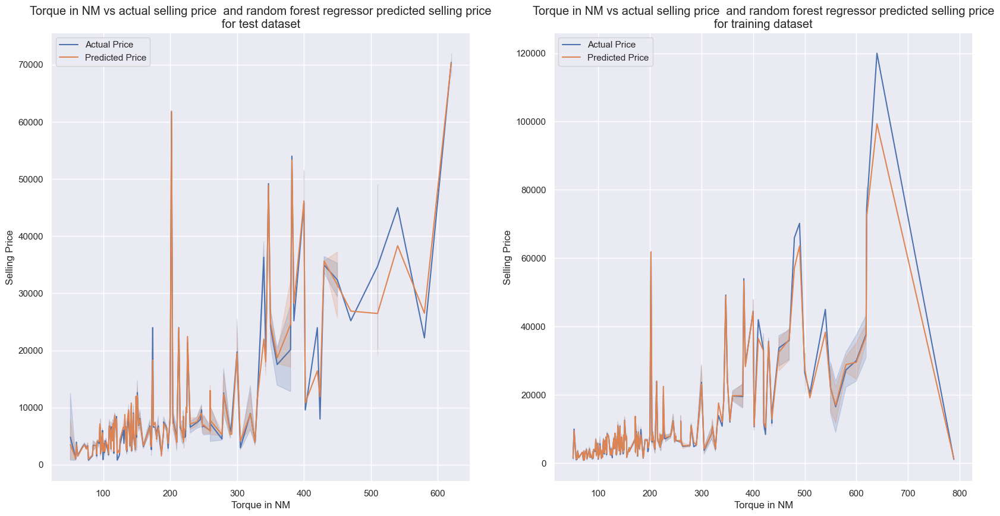

In [308]:
# Plotting performance of random forest regressor of selling price prediction
rf_reg_plot = generate_plot(rf_reg_pred, "random forest regressor")

In [310]:
# # Lineplot of max power and selling price for the test data

# actual_validation_line_plot = plt.figure(figsize=(20,10), dpi = 100 )
# plt.subplot(1,2,1)
# actual_validation_line_chart = sns.lineplot(x= x_test_max_pow, y=x_test_sell_pri, palette="Set2", label= "Actual Price")
# actual_validation_line_chart2 = sns.lineplot(x= x_test_max_pow, y=rf_reg_pred[1], palette="Set2", label="Predicted Price" )
# actual_validation_line_chart.set(xlabel="Torque in NM", ylabel='Selling Price')
# plt.title("Max Power vs actual Selling Price  and Predicted Selling Price for test dataset", fontsize="large" , fontweight="light", loc="center")
# plt.legend()
# #plt.xlim(50,250)

# plt.subplot(1,2,2)
# # Lineplot of max power and selling price for the training data
# actual_validation_line_chart = sns.lineplot(x= x_train_max_pow, y=x_train_sell_pri, palette="Set2", label= "Actual Price")
# actual_validation_line_chart2 = sns.lineplot(x= x_train_max_pow, y=rf_reg_pred[0], palette="Set2", label="Predicted Price" )
# actual_validation_line_chart.set(xlabel="Torque in NM", ylabel='Selling Price')
# plt.title("Max Power vs actual Selling Price  and Predicted Selling Price for training dataset", fontsize="large" , fontweight="light", loc="center")
# plt.legend()
# #plt.xlim(50,250)
# plt.show()

In [311]:
refined_car_df.loc[refined_car_df.max_power > 250]

,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm
129,14,2017,49200,17000,2,3,3,1,0,1,0,9.50,3604,280.00,5,1,347.0,4300
131,21,2017,72000,37000,2,3,3,0,1,1,0,13.50,2987,254.79,5,1,620.0,2000
142,21,2017,70200,47000,2,3,3,0,1,1,0,13.50,2987,282.00,5,1,490.0,1600
164,30,2017,120000,30000,0,1,1,1,0,1,0,42.00,1969,400.00,4,1,640.0,1740
1040,3,2018,72000,28156,1,12,26,0,1,1,0,17.09,2993,261.40,4,1,620.0,2250
1516,14,2017,49200,17000,2,29,64,1,0,1,0,9.50,3604,280.00,5,1,347.0,4300
1806,14,2017,49200,17000,0,1,121,1,0,1,0,9.50,3604,280.00,5,1,347.0,4300
2618,21,2013,43200,50000,1,12,163,0,0,1,0,11.74,2987,254.80,5,0,619.0,2000
2634,3,2007,9000,60000,1,2,426,0,0,1,1,14.49,2993,258.00,5,0,560.0,1500
2737,13,2014,24000,51000,1,11,453,0,0,1,0,14.74,2993,270.90,5,0,600.0,2000


### Linear Regressor

In [312]:
# Building and training a linear regressor
lr_reg = LinearRegression(fit_intercept=True, normalize=True, positive=False, n_jobs=None)
lr_reg = lr_reg.fit(x_train, y_train)

In [313]:
# Generate metrics report
lr_reg_pred = get_reg_metrics(lr_reg,"Multi Linear Regressor").execute_metrics()

Training predictions are : 
[-1248.1119742    313.95454635  6067.28722889 ...  1210.6661479
 23837.53078754  8363.35214067]

Test predictions are : 
[ 5017.1210175   5621.40667524  2339.12558349 ...   132.01831287
 11215.46474927 11976.81512167]


The training accuracy for Multi Linear Regressor is 0.6236446208560754
The test accuracy for Multi Linear Regressor is 0.6402036007672731


Mean Absolute Error for Multi Linear Regressor : 3430.9318226854234
Mean Squared Error for Multi Linear Regressor : 37644355.310514554
Root Mean Squared Error for Multi Linear Regressor : 6135.499597466742


Mean bias error for Multi Linear Regressor : 125.95498789711486


Relative root mean square error for Multi Linear Regressor : 0.5722498916504001


Train Data Accuracy Average After Cross_validation with Multi Linear Regressor : 0.6286810269123203
Test Data Accuracy Average After Cross_validation with Multi Linear Regressor : 0.6282030423513009


,fit_time,score_time,test_r2,train_r2,test_neg_mean_absolute_error,train_neg_mean_absolute_error,test_neg_mean_squared_error,train_neg_mean_squared_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
0,0.004980,0.002995,0.637937,0.623787,-3453.591345,-3478.057313,-3.506462e+07,-3.556413e+07,-5921.538378,-5963.566632
1,0.004977,0.003999,0.623681,0.631066,-3552.363824,-3479.356970,-3.570532e+07,-3.523895e+07,-5975.392549,-5936.240451
2,0.003997,0.004998,0.623502,0.631105,-3466.358470,-3511.565500,-3.545980e+07,-3.536390e+07,-5954.813098,-5946.755525
3,0.005999,0.005994,0.642687,0.621270,-3357.344673,-3514.084801,-3.460466e+07,-3.580204e+07,-5882.572613,-5983.480919
4,0.004998,0.003997,0.613519,0.635953,-3648.332649,-3452.215295,-3.666956e+07,-3.477221e+07,-6055.539907,-5896.796377
5,0.003999,0.003999,0.628140,0.628857,-3471.908069,-3501.838836,-3.502299e+07,-3.557941e+07,-5918.022491,-5964.847847
6,0.004998,0.003998,0.639007,0.623166,-3455.864170,-3473.906409,-3.496101e+07,-3.562285e+07,-5912.783441,-5968.487977
7,0.003999,0.003998,0.624042,0.630784,-3596.665051,-3470.555114,-3.567108e+07,-3.526591e+07,-5972.527494,-5938.510915
8,0.004002,0.004993,0.621311,0.632141,-3424.759382,-3525.802857,-3.566615e+07,-3.526461e+07,-5972.114160,-5938.400958




Train prediction mean deviation:  -5.228537693208377e-05
Train prediction standard deviation:  5890.970783760865


,torque_splitnm,selling_price,Predicted Selling Price,selling_diff,lower_limit_train_thres,+/-train_threshold
0,140.0,1200,-1248.11,2448.11,-60.0,60.0
1,60.0,3120,313.95,2806.05,-156.0,156.0
2,290.0,3600,6067.29,-2467.29,-180.0,180.0
3,200.0,7500,7220.33,279.67,-375.0,375.0
4,114.0,5160,8125.40,-2965.40,-258.0,258.0
5,114.0,1920,2845.88,-925.88,-96.0,96.0
6,500.0,36000,31244.07,4755.93,-1800.0,1800.0
7,190.0,7920,8038.55,-118.55,-396.0,396.0
8,190.0,7800,6829.98,970.02,-390.0,390.0
9,140.0,5400,5840.54,-440.54,-270.0,270.0


Test prediction mean deviation:  125.95484066767831
Test prediction standard deviation:  6135.758724798076


,torque_splitnm,selling_price,Predicted Selling Price,selling_diff,+/-test_threshold
0,190.00,6012,5017.12,994.88,300.60
1,190.00,5280,5621.41,-341.41,264.00
2,135.40,1680,2339.13,-659.13,84.00
3,205.00,5723,6167.12,-444.12,286.15
4,113.00,7440,8318.82,-878.82,372.00
5,146.00,4560,9916.38,-5356.38,228.00
6,113.75,4320,9544.74,-5224.74,216.00
7,140.00,2220,6583.99,-4363.99,111.00
8,59.00,1884,-2720.54,4604.54,94.20
9,205.00,7200,6167.12,1032.88,360.00


The percentage of train predictions within limit are:  0.920053972002024
The percentage of train predictions outside limit are:  0.07994602799797601
The percentage of test predictions within limit are:  0.921092564491654
The percentage of test predictions outside limit are:  0.078907435508346


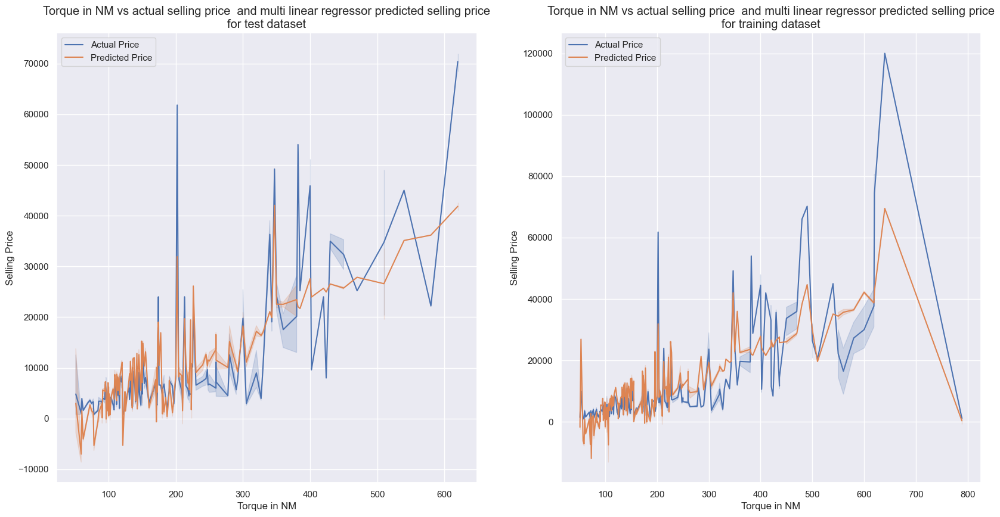

In [314]:
# Plotting performance of multi linear regressor of selling price prediction
lr_reg_plot = generate_plot(lr_reg_pred, "multi linear regressor")

In [315]:
# Viewing the decision influencers for multi linear regressor predictions 
print("Intercept: ", lr_reg.intercept_)
print("Slope: ", lr_reg.coef_)
print("Rank of Matrix: ", lr_reg.rank_)
print("Number of Features: ", lr_reg.n_features_in_)

Intercept:  -1225077.1379311602
Slope:  [  8.36443234 184.54265022  -1.74876122 604.28565774]
Rank of Matrix:  4
Number of Features:  4


### Polynomial Regression

In [316]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline

# define the pipeline and train model
poly_reg = Pipeline([('poly', PolynomialFeatures(degree=2)),
                  ('linear', LinearRegression(fit_intercept=True))])
                  
poly_reg.fit(x_train, y_train)

# print out regression coefficients
print(poly_reg.named_steps['linear'].coef_)    
print(poly_reg.named_steps['linear'].intercept_)  

[ 0.00000000e+00 -6.90373048e+03 -4.68957525e+04  9.66671196e+02
  9.70019179e+03  7.48920583e-02  7.74302235e-02 -3.93015669e-02
  3.44116175e+00  7.63291578e-01 -7.26070505e-03  2.32693407e+01
  2.39683792e-03 -4.79894708e-01 -2.66603948e+00]
-8722466.292869868


In [317]:
# Generate metrics report
pr_reg_pred = get_reg_metrics(poly_reg,"Polynomial Regressor").execute_metrics()

Training predictions are : 
[   428.26304361    468.0552661  -10352.89226868 ...  -4232.87633977
  15785.92183831   7341.66679266]

Test predictions are : 
[ 4430.38987305  5165.9519481   3017.43778451 ...  1845.28615485
 10711.45804859 11658.16295326]


The training accuracy for Polynomial Regressor is 0.85317178751921
The test accuracy for Polynomial Regressor is 0.8615637585139081


Mean Absolute Error for Polynomial Regressor : 2090.3860098775344
Mean Squared Error for Polynomial Regressor : 14484144.570284568
Root Mean Squared Error for Polynomial Regressor : 3805.8040635698217


Mean bias error for Polynomial Regressor : 150.00233254530153


Relative root mean square error for Polynomial Regressor : 0.32251128915753824


Train Data Accuracy Average After Cross_validation with Polynomial Regressor : 0.8574290509917135
Test Data Accuracy Average After Cross_validation with Polynomial Regressor : 0.839791786854334


,fit_time,score_time,test_r2,train_r2,test_neg_mean_absolute_error,train_neg_mean_absolute_error,test_neg_mean_squared_error,train_neg_mean_squared_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
0,0.013186,0.004019,0.843342,0.857278,-2060.362148,-2095.916349,-1.517184e+07,-1.349178e+07,-3895.105237,-3673.115385
1,0.007996,0.007020,0.851901,0.857186,-2120.081462,-2055.898602,-1.405167e+07,-1.364098e+07,-3748.556091,-3693.369950
2,0.008866,0.005995,0.853012,0.857034,-2092.176503,-2099.900311,-1.384383e+07,-1.370537e+07,-3720.729801,-3702.076473
3,0.011995,0.007993,0.835977,0.859860,-2087.395891,-2062.328847,-1.588506e+07,-1.324770e+07,-3985.606327,-3639.739172
4,0.013970,0.003997,0.859408,0.853561,-2079.100487,-2099.102183,-1.333944e+07,-1.398722e+07,-3652.319662,-3739.949581
5,0.009533,0.006001,0.849953,0.858571,-2120.693903,-2087.771055,-1.413192e+07,-1.355804e+07,-3759.244545,-3682.123793
6,0.012974,0.004998,0.842651,0.857467,-2060.456458,-2082.626178,-1.523877e+07,-1.347390e+07,-3903.686463,-3670.680761
7,0.007995,0.006997,0.768906,0.858686,-2246.277037,-2070.763328,-2.192632e+07,-1.349767e+07,-4682.554645,-3673.917336
8,0.007996,0.007017,0.852975,0.857218,-2065.712241,-2090.473473,-1.384727e+07,-1.368767e+07,-3721.191428,-3699.685779




Train prediction mean deviation:  5.52231561204679e-14
Train prediction standard deviation:  3679.5316205358363


,torque_splitnm,selling_price,Predicted Selling Price,selling_diff,lower_limit_train_thres,+/-train_threshold
0,140.0,1200,428.26,771.74,-60.0,60.0
1,60.0,3120,468.06,2651.94,-156.0,156.0
2,290.0,3600,-10352.89,13952.89,-180.0,180.0
3,200.0,7500,4904.73,2595.27,-375.0,375.0
4,114.0,5160,6977.24,-1817.24,-258.0,258.0
5,114.0,1920,623.44,1296.56,-96.0,96.0
6,500.0,36000,39988.43,-3988.43,-1800.0,1800.0
7,190.0,7920,8054.88,-134.88,-396.0,396.0
8,190.0,7800,6621.08,1178.92,-390.0,390.0
9,140.0,5400,5307.02,92.98,-270.0,270.0


Test prediction mean deviation:  150.0021041982803
Test prediction standard deviation:  3803.8087871529888


,torque_splitnm,selling_price,Predicted Selling Price,selling_diff,+/-test_threshold
0,190.00,6012,4430.39,1581.61,300.60
1,190.00,5280,5165.95,114.05,264.00
2,135.40,1680,3017.44,-1337.44,84.00
3,205.00,5723,3570.60,2152.40,286.15
4,113.00,7440,7262.25,177.75,372.00
5,146.00,4560,3250.58,1309.42,228.00
6,113.75,4320,8599.16,-4279.16,216.00
7,140.00,2220,-1013.42,3233.42,111.00
8,59.00,1884,1580.22,303.78,94.20
9,205.00,7200,3570.60,3629.40,360.00


The percentage of train predictions within limit are:  0.8608534322820037
The percentage of train predictions outside limit are:  0.13914656771799627
The percentage of test predictions within limit are:  0.8725341426403642
The percentage of test predictions outside limit are:  0.12746585735963578


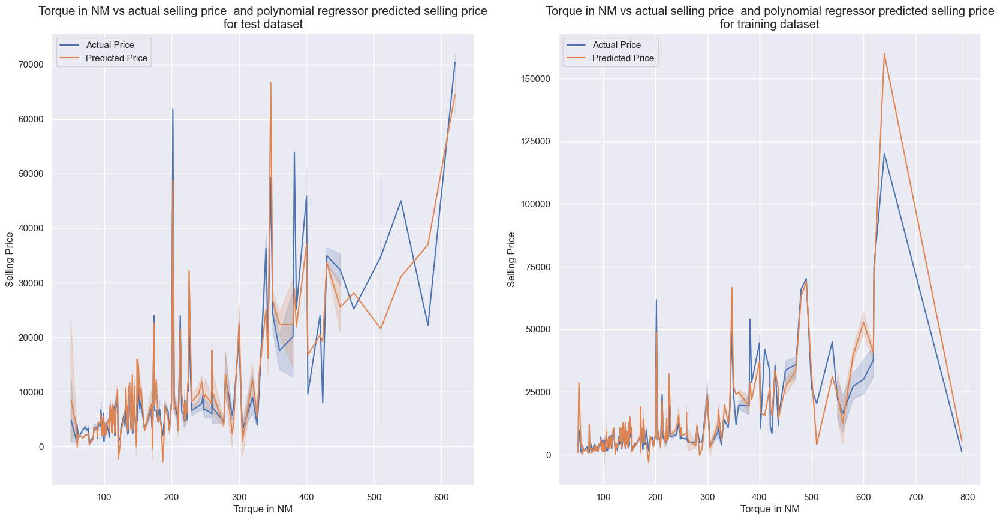

In [318]:
# Plotting performance of polynominal regressor of selling price prediction 
pr_reg_plot = generate_plot(pr_reg_pred, "polynomial regressor")

### RANSAC Regressor

In [319]:
# Define the RANSAc parameters
ransac_reg = RANSACRegressor(RandomForestRegressor() ,
                             max_trials = 5,          # Number of iterations
                             min_samples = 5200 ,        # Minimum size of the sample
                             loss = "absolute_error",   # Metric for loss
                             residual_threshold = 850,   # Threshold
                            random_state = 5,         # How to randomly select data

    )

In [320]:
# Train Model
ransac_reg = ransac_reg.fit(x_train, y_train)

In [321]:
# Generate metrics report
ransac_reg_pred = get_reg_metrics(ransac_reg,"RANSAC Regressor").execute_metrics()

Training predictions are : 
[ 1208.87928571  3092.02009419  3122.29666667 ...  1145.885
 13490.6         9828.98033333]

Test predictions are : 
[ 5614.66320793  6425.75559078  1785.39754762 ...  2316.14746854
  6962.36619048 11413.4212987 ]


The training accuracy for RANSAC Regressor is 0.9298851667445669
The test accuracy for RANSAC Regressor is 0.924300232211544


Mean Absolute Error for RANSAC Regressor : 1096.7911194095657
Mean Squared Error for RANSAC Regressor : 7920226.443702763
Root Mean Squared Error for RANSAC Regressor : 2814.2896872395286


Mean bias error for RANSAC Regressor : 227.09874199257763


Relative root mean square error for RANSAC Regressor : 0.2298190175346762


Train Data Accuracy Average After Cross_validation with RANSAC Regressor : 0.9402943539837185
Test Data Accuracy Average After Cross_validation with RANSAC Regressor : 0.9320345190633587


,fit_time,score_time,test_r2,train_r2,test_neg_mean_absolute_error,train_neg_mean_absolute_error,test_neg_mean_squared_error,train_neg_mean_squared_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
0,5.665786,0.054948,0.926565,0.948278,-1008.182757,-828.262050,-7.111922e+06,-4.889413e+06,-2666.818781,-2211.201597
1,5.311964,0.056991,0.931290,0.932665,-1091.106618,-848.131367,-6.519246e+06,-6.431579e+06,-2553.281422,-2536.055772
2,5.257995,0.053972,0.923433,0.936422,-1104.416961,-898.103864,-7.211296e+06,-6.094833e+06,-2685.385583,-2468.771541
3,4.830242,0.058967,0.940488,0.942972,-1032.058346,-881.649256,-5.763541e+06,-5.390995e+06,-2400.737617,-2321.851682
4,4.763279,0.049973,0.931991,0.927357,-1071.350290,-925.771474,-6.452754e+06,-6.938572e+06,-2540.227195,-2634.117012
5,4.789265,0.052993,0.932368,0.945199,-1042.662390,-810.864976,-6.369803e+06,-5.253440e+06,-2523.846908,-2292.038426
6,4.796261,0.053949,0.935823,0.949289,-1043.621038,-858.586991,-6.215355e+06,-4.793786e+06,-2493.061362,-2189.471577
7,4.859222,0.049972,0.925102,0.934504,-1123.662892,-917.112539,-7.106370e+06,-6.255856e+06,-2665.777567,-2501.170990
8,5.123070,0.053971,0.941250,0.945963,-1012.911383,-831.039794,-5.533230e+06,-5.180207e+06,-2352.281824,-2276.006860




Train prediction mean deviation:  185.17554393658287
Train prediction standard deviation:  2535.933052034469


,torque_splitnm,selling_price,Predicted Selling Price,selling_diff,lower_limit_train_thres,+/-train_threshold
0,140.0,1200,1208.88,-8.88,-60.0,60.0
1,60.0,3120,3092.02,27.98,-156.0,156.0
2,290.0,3600,3122.30,477.70,-180.0,180.0
3,200.0,7500,5932.47,1567.53,-375.0,375.0
4,114.0,5160,5247.28,-87.28,-258.0,258.0
5,114.0,1920,2401.78,-481.78,-96.0,96.0
6,500.0,36000,32928.60,3071.40,-1800.0,1800.0
7,190.0,7920,8204.53,-284.53,-396.0,396.0
8,190.0,7800,7462.90,337.10,-390.0,390.0
9,140.0,5400,4671.24,728.76,-270.0,270.0


Test prediction mean deviation:  227.09875569044004
Test prediction standard deviation:  2805.8214553972566


,torque_splitnm,selling_price,Predicted Selling Price,selling_diff,+/-test_threshold
0,190.00,6012,5614.66,397.34,300.60
1,190.00,5280,6425.76,-1145.76,264.00
2,135.40,1680,1785.40,-105.40,84.00
3,205.00,5723,4839.10,883.90,286.15
4,113.00,7440,7239.57,200.43,372.00
5,146.00,4560,4175.83,384.17,228.00
6,113.75,4320,8351.39,-4031.39,216.00
7,140.00,2220,2660.02,-440.02,111.00
8,59.00,1884,1591.86,292.14,94.20
9,205.00,7200,4839.10,2360.90,360.00


The percentage of train predictions within limit are:  0.6306291111485917
The percentage of train predictions outside limit are:  0.36937088885140834
The percentage of test predictions within limit are:  0.701062215477997
The percentage of test predictions outside limit are:  0.29893778452200304


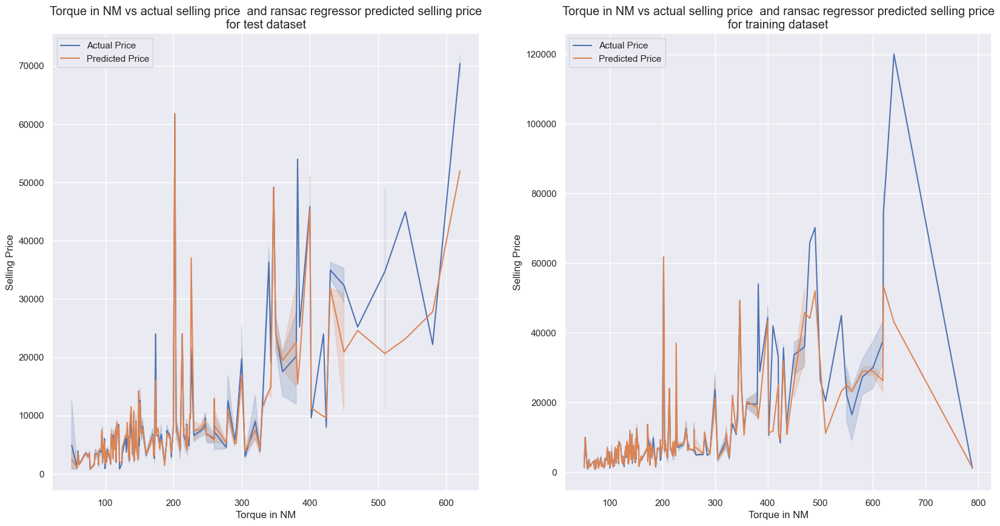

In [322]:
# Plotting performance of polynominal regressor of selling price prediction 
ransac_reg_plot = generate_plot(ransac_reg_pred, "ransac regressor")

### Support Vector Regressor

In [323]:
# Creating features and target variables and splitting of training and test data.
# NB: The new training and test data was created for the ease of carrying out cross-validation on the model, as the model cannot
# Process cross-validation data directly. hence the data has to be randomised and the process ran multiple times to generate mean performance.
features_selling_price = refined_car_df[["torque_splitnm", "max_power", "engine", "year"]] # torque_splitnm, max_power, "engine", "year".
target_selling_price = refined_car_df["selling_price"]


x_train_stdzz,x_test_stdzz,y_train_stdzz ,y_test_stdzz=  train_test_split(features_selling_price,target_selling_price, test_size = 0.20, random_state = 15, shuffle=True, stratify=None)

In [324]:
# Converting training features to an array
x_train_stdz = x_train_stdzz.values
x_train_stdz

array([[ 200. ,  100.6, 2494. , 2013. ],
       [ 400. ,  190. , 1995. , 2019. ],
       [ 160. ,   68. , 1399. , 2010. ],
       ...,
       [ 260. ,  112. , 2498. , 2012. ],
       [ 190. ,   74. , 1248. , 2016. ],
       [ 247. ,  105. , 2498. , 2014. ]])

In [325]:
# Converting test features to an array
x_test_stdz = x_test_stdzz.values
x_test_stdz

array([[ 160.  ,   68.  , 1399.  , 2011.  ],
       [ 114.  ,   82.  , 1197.  , 2013.  ],
       [ 190.  ,   75.  , 1248.  , 2011.  ],
       ...,
       [ 135.  ,   69.01, 1405.  , 2016.  ],
       [ 112.  ,   86.8 , 1196.  , 2017.  ],
       [  72.  ,   53.64,  799.  , 2017.  ]])

In [326]:
# Viewing shape of training features
x_train_stdz.shape

(6324, 4)

In [327]:
# Viewing shape of test features
x_test_stdz.shape

(1582, 4)

In [328]:
# Converting training target to an array 
y_train_stdz = y_train_stdzz.values
y_train_stdz = y_train_stdz.reshape(-1,1)

# Converting test target to an array 
y_test_stdz = y_test_stdzz.values
y_test_stdz = y_test_stdz.reshape(-1,1)

In [329]:
# Viewing shape of training features
y_train_stdz.shape

(6324, 1)

In [330]:
# Viewing shape of test features
y_test_stdz.shape

(1582, 1)

In [331]:
# Fitting and transforming the training and test data using the min max scaler as applicable
standard_scaler = StandardScaler()
x_train_min_max = standard_scaler.fit_transform(x_train_stdz)
x_test_min_max = standard_scaler.transform(x_test_stdz)
y_train_min_max = standard_scaler.fit_transform(y_train_stdz)                                       
y_test_min_max = standard_scaler.transform(y_test_stdz)

In [332]:
# Define Support Vector Regressor model parameters
from sklearn.svm import SVR

svr_reg = SVR(
            kernel='rbf',
            degree=3,
            gamma='scale',
            coef0=0.0,
            tol=0.001,
            C=1.0,
            epsilon=0.1,
            shrinking=True,
            cache_size=200,
            verbose=True,
            max_iter=-1, 
             )

In [333]:
# Fitting the training data to the Support Vector Regressor model
svr_reg = svr_reg.fit(x_train_min_max,y_train_min_max)

[LibSVM]

In [334]:
# Viewing the training accuracy score
svr_reg.score(x_train_min_max,y_train_min_max)

0.9311593159152521

In [335]:
# Viewing the test accuracy score
svr_reg.score(x_test_min_max,y_test_min_max)

0.8770686407501993

In [336]:
# Generate metric report
svr_reg_pred = get_reg_metrics(svr_reg,"Support Vector Regressor",1).execute_metrics()

Training predictions are : 
[[ 8866.23089326]
 [57646.92514115]
 [ 2495.24114062]
 ...
 [ 6141.43258499]
 [ 6718.26939966]
 [ 8845.22809525]]

Test predictions are : 
[[2779.49979539]
 [4134.02146003]
 [3525.81535707]
 ...
 [4736.09904221]
 [6924.4224425 ]
 [3487.85928485]]


The training accuracy for Support Vector Regressor is 0.9311593159152521
The test accuracy for Support Vector Regressor is 0.8770686407501993


Mean Absolute Error for Support Vector Regressor : 1387.489222557284
Mean Squared Error for Support Vector Regressor : 12347613.211152883
Root Mean Squared Error for Support Vector Regressor : 3513.9170751673814


Mean bias error for Support Vector Regressor : 30.973319076564312


Relative root mean square error for Support Vector Regressor : 0.2862240019601968




Train prediction mean deviation:  -4.140414294750161
Train prediction standard deviation:  2544.1126756338913


,torque_splitnm,selling_price,Predicted Selling Price,selling_diff,+/-train_threshold
0,200.00,9000,8866.23,133.77,450.0
1,400.00,64800,57646.93,7153.07,3240.0
2,160.00,2040,2495.24,-455.24,102.0
3,90.00,2700,3300.86,-600.86,135.0
4,300.00,14400,15087.55,-687.55,720.0
5,190.00,8400,8087.98,312.02,420.0
6,259.80,4680,4772.97,-92.97,234.0
7,200.00,7800,8654.28,-854.28,390.0
8,99.04,3444,3903.90,-459.90,172.2
9,160.00,1920,2779.50,-859.50,96.0


Test prediction mean deviation:  30.97353982300883
Test prediction standard deviation:  3514.891640408441


,torque_splitnm,selling_price,Predicted Selling Price,selling_diff,+/-test_threshold
0,160.0,2400,2779.50,-379.50,120.0
1,114.0,3600,4134.02,-534.02,180.0
2,190.0,3660,3525.82,134.18,183.0
3,400.0,64800,57646.93,7153.07,3240.0
4,250.0,6000,9971.36,-3971.36,300.0
5,69.0,3000,2874.13,125.87,150.0
6,109.0,4800,6286.69,-1486.69,240.0
7,109.0,4020,5059.48,-1039.48,201.0
8,104.0,6720,5612.16,1107.84,336.0
9,74.5,3600,3562.89,37.11,180.0


The percentage of train predictions within limit are:  0.6211258697027198
The percentage of train predictions outside limit are:  0.37887413029728023
The percentage of test predictions within limit are:  0.6011378002528445
The percentage of test predictions outside limit are:  0.39886219974715553


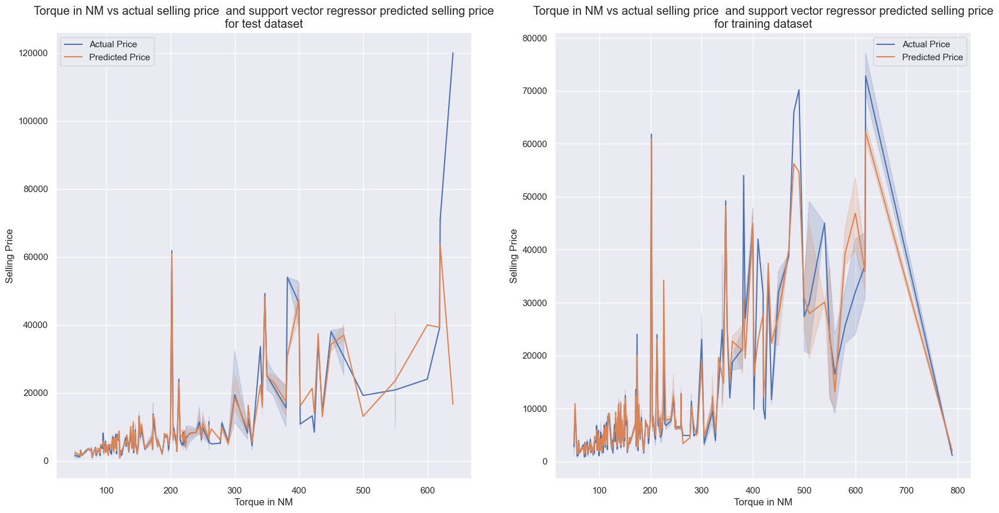

In [337]:
# Plotting performance of support vector regressor (SVR) of selling price prediction 
svr_reg_plot = generate_plot(svr_reg_pred, "support vector regressor",1)

### XGBoost Regressor

In [338]:
# Define Extreme Gradient Boosting (XGB) Regressor model parameters
xgb_reg = XGBRegressor( n_estimators = 1000,
                       objective='reg:squarederror',
                       max_depth = 4,
                       eta = 0.1,
                        subsample = 0.7,
                        colsample_bytree = 1.0,
                       verbosity=0,
                       learning_rate=0.05,)

# Fitting the training data to the Extreme Gradient Boosting (XGB) Regressor model
xgb_reg.fit(x_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1.0, enable_categorical=False,
             eta=0.1, gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.05, max_delta_step=0,
             max_depth=4, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=4,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=0.7,
             tree_method='exact', validate_parameters=1, verbosity=0)

In [339]:
# Generate metrics report
xgb_reg_pred = get_reg_metrics(xgb_reg,"Extreme Gradient Boosting (XGB) Regressor").execute_metrics()

Training predictions are : 
[ 1323.3889  3267.0063  3272.582  ...  1348.4879 13638.092   7729.644 ]

Test predictions are : 
[ 5425.5244  6345.8457  2411.499  ...  2252.6272  7122.5933 10698.981 ]


The training accuracy for Extreme Gradient Boosting (XGB) Regressor is 0.9871434930889383
The test accuracy for Extreme Gradient Boosting (XGB) Regressor is 0.9804152359892216


Mean Absolute Error for Extreme Gradient Boosting (XGB) Regressor : 860.5546368071691
Mean Squared Error for Extreme Gradient Boosting (XGB) Regressor : 2049091.6992680575
Root Mean Squared Error for Extreme Gradient Boosting (XGB) Regressor : 1431.4648788105342


Mean bias error for Extreme Gradient Boosting (XGB) Regressor : -11.955231191416129


Relative root mean square error for Extreme Gradient Boosting (XGB) Regressor : 0.1113647681435328


Train Data Accuracy Average After Cross_validation with Extreme Gradient Boosting (XGB) Regressor : 0.9880693940314969
Test Data Accuracy Average After Cross_validation wi

,fit_time,score_time,test_r2,train_r2,test_neg_mean_absolute_error,train_neg_mean_absolute_error,test_neg_mean_squared_error,train_neg_mean_squared_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
0,2.952334,0.030961,0.968394,0.987709,-870.366871,-729.075398,-3.060900e+06,-1.161853e+06,-1749.542675,-1077.892967
1,2.893348,0.030984,0.973777,0.988771,-920.523383,-715.561309,-2.488021e+06,-1.072576e+06,-1577.346334,-1035.652634
2,2.884372,0.029963,0.974355,0.987799,-886.134541,-733.186394,-2.415304e+06,-1.169688e+06,-1554.124765,-1081.521359
3,2.883354,0.030982,0.967515,0.987793,-869.151197,-725.700550,-3.146113e+06,-1.153912e+06,-1773.728643,-1074.203050
4,2.845375,0.033982,0.977800,0.987237,-870.773909,-750.705673,-2.106392e+06,-1.219091e+06,-1451.341618,-1104.124614
5,2.930327,0.030983,0.972185,0.988812,-891.307448,-713.403123,-2.619676e+06,-1.072537e+06,-1618.541427,-1035.633569
6,3.336118,0.038956,0.966761,0.987671,-880.839347,-730.380459,-3.219131e+06,-1.165456e+06,-1794.193718,-1079.562655
7,3.634924,0.028983,0.961468,0.988060,-924.822989,-723.141989,-3.655932e+06,-1.140466e+06,-1912.049046,-1067.926157
8,2.993293,0.047971,0.975091,0.988773,-878.474999,-720.088927,-2.346053e+06,-1.076303e+06,-1531.683212,-1037.450326




Train prediction mean deviation:  -0.7104436289220621
Train prediction standard deviation:  1088.8027100952766


,torque_splitnm,selling_price,Predicted Selling Price,selling_diff,lower_limit_train_thres,+/-train_threshold
0,140.0,1200,1323.390015,-123.390015,-60.0,60.0
1,60.0,3120,3267.010010,-147.010010,-156.0,156.0
2,290.0,3600,3272.580078,327.419922,-180.0,180.0
3,200.0,7500,5498.759766,2001.240234,-375.0,375.0
4,114.0,5160,5268.209961,-108.209961,-258.0,258.0
5,114.0,1920,2286.070068,-366.070068,-96.0,96.0
6,500.0,36000,34486.921875,1513.078125,-1800.0,1800.0
7,190.0,7920,8874.379883,-954.379883,-396.0,396.0
8,190.0,7800,7683.600098,116.399902,-390.0,390.0
9,140.0,5400,5396.270020,3.729980,-270.0,270.0


Test prediction mean deviation:  -11.955161882399548
Test prediction standard deviation:  1431.7770191375769


,torque_splitnm,selling_price,Predicted Selling Price,selling_diff,+/-test_threshold
0,190.00,6012,5425.520020,586.479980,300.60
1,190.00,5280,6345.850098,-1065.850098,264.00
2,135.40,1680,2411.500000,-731.500000,84.00
3,205.00,5723,6260.209961,-537.209961,286.15
4,113.00,7440,7308.299805,131.700195,372.00
5,146.00,4560,4493.529785,66.470215,228.00
6,113.75,4320,7416.390137,-3096.390137,216.00
7,140.00,2220,2290.770020,-70.770020,111.00
8,59.00,1884,1867.479980,16.520020,94.20
9,205.00,7200,6260.209961,939.790039,360.00


The percentage of train predictions within limit are:  0.7154663518299882
The percentage of train predictions outside limit are:  0.2845336481700118
The percentage of test predictions within limit are:  0.7309054122407689
The percentage of test predictions outside limit are:  0.2690945877592311


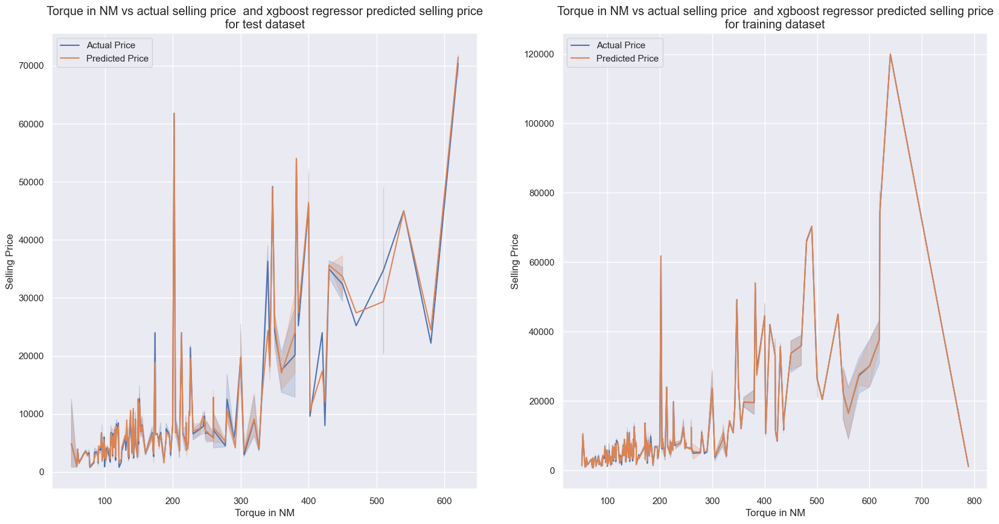

In [340]:
# Plotting performance of Extreme Gradient Boosting (XGB) Regressor regressor of selling price prediction 
xgb_reg_plot = generate_plot(xgb_reg_pred, "xgboost regressor")

### Stacking Regressor Model 

In [341]:
# Defining a function for stacking.
from sklearn.ensemble import StackingRegressor
def get_stacking():
    level0 = list()
    level0.append(('mlr', LinearRegression(fit_intercept=True, normalize=True, positive=False, n_jobs=None)))
    level0.append(('pr', Pipeline([('poly', PolynomialFeatures(degree=2)),
                  ('linear', LinearRegression(fit_intercept=True))])))
    level0.append(('rfr', RandomForestRegressor( n_estimators=100,
                               criterion='mse', 
                               max_depth=20, 
                               min_samples_split=2, 
                               min_samples_leaf=1, 
                               min_weight_fraction_leaf=0.0,
                               max_features=1.0, 
                               max_leaf_nodes=500,
                               min_impurity_decrease=0.0,
                               bootstrap=True, 
                               oob_score=True,
                               n_jobs=-1,
                               random_state=40, 
                               verbose=0,
                               warm_start=False,
                               ccp_alpha=0.0, 
                               max_samples=None
    )))
    level0.append(('xgb1', XGBRegressor( n_estimators = 1000,
                        objective='reg:squarederror',
                       max_depth = 4,
                       eta = 0.1,
                        subsample = 0.7,
                        colsample_bytree = 1.0,
                       verbosity=0,
                       learning_rate=0.05,
    )))
    level0.append(('xgb2', XGBRegressor( n_estimators = 1000,
                        objective='reg:squarederror',
                       max_depth = 4,
                       eta = 0.1,
                        subsample = 0.7,
                        colsample_bytree = 1.0,
                       verbosity=0,
                       learning_rate=0.05,
    )))
    level1 = XGBRegressor( n_estimators = 1000,
                        objective='reg:squarederror',
                       max_depth = 4,
                       eta = 0.1,
                        subsample = 0.7,
                        colsample_bytree = 1.0,
                       verbosity=0,
                       learning_rate=0.05,
    )
    model = StackingRegressor(estimators=level0, final_estimator=level1, cv=5, passthrough=False)
    return model

# Getting the models required after adding stacking
def get_models():
    models =  get_stacking()
    return models

# Function to evaluate the models
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=3, n_repeats=3, random_state=1)
    scores = cross_validate(model, X, y, scoring=('r2', "neg_mean_absolute_error", "neg_mean_squared_error" ,'neg_root_mean_squared_error'), cv=cv, n_jobs=-1, 
    error_score='raise')
    train_result = model.fit(X,y)
    scores = pd.DataFrame(scores)
    return scores, train_result

def get_dataset():
    return x_train, y_train

#Grab hold of the dataset.
X, y = get_dataset()

#Grab the models to use.
stacked_reg_models = get_models()

#Run and Evaluate the models.
scores, stacked_reg_model = evaluate_model(stacked_reg_models, X, y)
display(scores)

,fit_time,score_time,test_r2,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_neg_root_mean_squared_error
0,87.294656,0.109938,0.960989,-976.885021,-3.512812e+06,-1874.249829
1,85.514672,0.223870,0.951216,-992.326122,-4.569455e+06,-2137.628340
2,85.036947,0.140919,0.938519,-1049.871547,-5.709009e+06,-2389.353211
3,85.196849,0.140919,0.962573,-975.511689,-3.370156e+06,-1835.798449
4,74.040714,0.159910,0.956857,-984.619688,-4.041041e+06,-2010.233991
5,74.005733,0.152914,0.966385,-951.191593,-3.121435e+06,-1766.758435
6,74.989174,0.118933,0.959351,-998.523566,-3.660324e+06,-1913.197343
7,75.228035,0.101943,0.946446,-1055.007559,-5.016276e+06,-2239.704513
8,41.743570,0.098664,0.930879,-1016.907387,-6.418475e+06,-2533.471031


In [342]:
# Generate metrics report
stacked_reg_pred = get_reg_metrics(stacked_reg_model,"Stacked Regressors Model").execute_metrics()

Training predictions are : 
[ 1307.41    3044.8425  3119.1265 ...  1326.4586 12427.963   8491.919 ]

Test predictions are : 
[ 5637.904   6245.97    2284.4087 ...  2270.183   7487.093  10618.362 ]


The training accuracy for Stacked Regressors Model is 0.9846353534833928
The test accuracy for Stacked Regressors Model is 0.9756142374741849


Mean Absolute Error for Stacked Regressors Model : 881.5962561152472
Mean Squared Error for Stacked Regressors Model : 2551404.936228496
Root Mean Squared Error for Stacked Regressors Model : 1597.311784288996


Mean bias error for Stacked Regressors Model : -24.462373323493615


Relative root mean square error for Stacked Regressors Model : 0.12422687851964491


Train Data Accuracy Average After Cross_validation with Stacked Regressors Model : 0.9842751036984843
Test Data Accuracy Average After Cross_validation with Stacked Regressors Model : 0.9685262348662742


,fit_time,score_time,test_r2,train_r2,test_neg_mean_absolute_error,train_neg_mean_absolute_error,test_neg_mean_squared_error,train_neg_mean_squared_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
0,44.588031,0.140967,0.972359,0.985139,-888.056545,-742.582678,-2.676944e+06,-1.404851e+06,-1636.137048,-1185.263913
1,49.630146,0.145820,0.968705,0.985738,-966.187144,-727.425146,-2.969292e+06,-1.362219e+06,-1723.163495,-1167.141501
2,45.824858,0.181898,0.967860,0.982249,-931.943167,-782.077432,-3.027092e+06,-1.701700e+06,-1739.853962,-1304.492290
3,46.892406,0.147681,0.972517,0.985033,-887.306235,-738.846397,-2.661606e+06,-1.414855e+06,-1631.443066,-1189.476689
4,41.005366,0.129139,0.976952,0.983127,-877.210706,-764.502406,-2.186762e+06,-1.611604e+06,-1478.770471,-1269.489620
5,41.411689,0.127524,0.966776,0.983079,-974.751840,-779.539756,-3.129147e+06,-1.622108e+06,-1768.939471,-1273.619901
6,43.167574,0.150810,0.967303,0.983707,-947.418250,-774.355689,-3.166634e+06,-1.540237e+06,-1779.503886,-1241.063026
7,45.498625,0.186894,0.953499,0.985812,-953.608071,-723.322609,-4.412047e+06,-1.355212e+06,-2100.487401,-1164.135569
8,46.719888,0.138664,0.970765,0.984592,-954.616257,-774.394162,-2.753430e+06,-1.477073e+06,-1659.346382,-1215.349075




Train prediction mean deviation:  14.475978584308853
Train prediction standard deviation:  1190.1918738251488


,torque_splitnm,selling_price,Predicted Selling Price,selling_diff,lower_limit_train_thres,+/-train_threshold
0,140.0,1200,1307.410034,-107.410034,-60.0,60.0
1,60.0,3120,3044.840088,75.159912,-156.0,156.0
2,290.0,3600,3119.129883,480.870117,-180.0,180.0
3,200.0,7500,5890.839844,1609.160156,-375.0,375.0
4,114.0,5160,5562.080078,-402.080078,-258.0,258.0
5,114.0,1920,2283.679932,-363.679932,-96.0,96.0
6,500.0,36000,34560.679688,1439.320312,-1800.0,1800.0
7,190.0,7920,8677.110352,-757.110352,-396.0,396.0
8,190.0,7800,7811.649902,-11.649902,-390.0,390.0
9,140.0,5400,5267.620117,132.379883,-270.0,270.0


Test prediction mean deviation:  -24.462183889139162
Test prediction standard deviation:  1597.5286491986317


,torque_splitnm,selling_price,Predicted Selling Price,selling_diff,+/-test_threshold
0,190.00,6012,5637.899902,374.100098,300.60
1,190.00,5280,6245.970215,-965.970215,264.00
2,135.40,1680,2284.409912,-604.409912,84.00
3,205.00,5723,5477.959961,245.040039,286.15
4,113.00,7440,7150.020020,289.979980,372.00
5,146.00,4560,4474.899902,85.100098,228.00
6,113.75,4320,8186.080078,-3866.080078,216.00
7,140.00,2220,2346.070068,-126.070068,111.00
8,59.00,1884,1846.630005,37.369995,94.20
9,205.00,7200,5477.959961,1722.040039,360.00


The percentage of train predictions within limit are:  0.7046719514251982
The percentage of train predictions outside limit are:  0.29532804857480177
The percentage of test predictions within limit are:  0.7076378351036925
The percentage of test predictions outside limit are:  0.2923621648963075


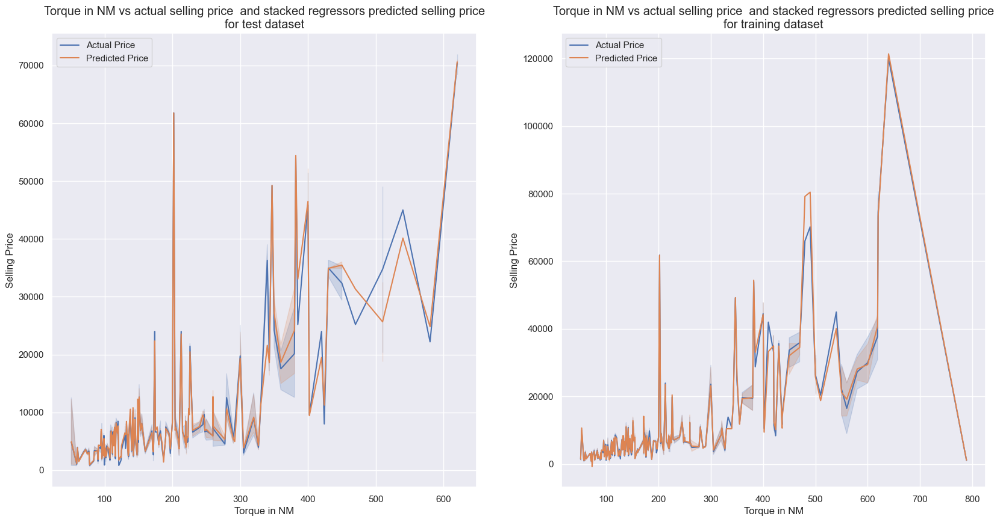

In [343]:
# Plotting performance of Extreme Gradient Boosting (XGB) Regressor regressor of selling price prediction 
stacked_reg_plot = generate_plot(stacked_reg_pred, "stacked regressors")

### Hyperparameters Optimisation

#### Random Forest Regressor Hyperparameters optimisation for regression task

In [344]:
rf = RandomForestRegressor(random_state=15, bootstrap=True, oob_score=True, verbose=0)

param_grid = {
    "n_estimators": [100,300,600],
    "max_depth":[2,5,10,20],
    "max_leaf_nodes":[200,500,1800],
    "min_samples_split":[2,4,5,],
    "min_samples_leaf":[1,2,4],
    "criterion":["squared_error","absolute_error"]
}

# Using 3-fold cross-validation
grid_search_reg = GridSearchCV(rf, param_grid, cv = 3, scoring= ["r2", "neg_mean_squared_error", "neg_mean_absolute_error", "neg_root_mean_squared_error"], refit="r2", return_train_score=True, n_jobs=None)


grid_search_reg.fit(features[0:2000],target[0:2000])

GridSearchCV(cv=3,
             estimator=RandomForestRegressor(oob_score=True, random_state=15),
             param_grid={'criterion': ['squared_error', 'absolute_error'],
                         'max_depth': [2, 5, 10, 20],
                         'max_leaf_nodes': [200, 500, 1800],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 4, 5],
                         'n_estimators': [100, 300, 600]},
             refit='r2', return_train_score=True,
             scoring=['r2', 'neg_mean_squared_error', 'neg_mean_absolute_error',
                      'neg_root_mean_squared_error'])

In [345]:
# Using the grid search estimator to get best parameters for our random forest model.
grid_search_reg.best_estimator_

RandomForestRegressor(criterion='absolute_error', max_depth=20,
                      max_leaf_nodes=500, oob_score=True, random_state=15)

In [346]:
# Best Estimator Parameters
grid_search_reg.best_estimator_.feature_importances_

array([0.02531994, 0.25193037, 0.05546869, 0.00658513, 0.01362737,
       0.01974869, 0.00256765, 0.01228335, 0.00399831, 0.00568181,
       0.03796163, 0.03398323, 0.44938756, 0.00762996, 0.        ,
       0.05371323, 0.02011309])

In [347]:
grid_search_reg.best_params_

{'criterion': 'absolute_error',
 'max_depth': 20,
 'max_leaf_nodes': 500,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 100}

In [348]:
features.columns

Index(['name', 'year', 'km_driven', 'Region', 'State or Province', 'City',
       'fuel', 'seller_type', 'transmission', 'owner', 'mileage', 'engine',
       'max_power', 'seats', 'sold', 'torque_splitnm', 'torque_splitrpm'],
      dtype='object')

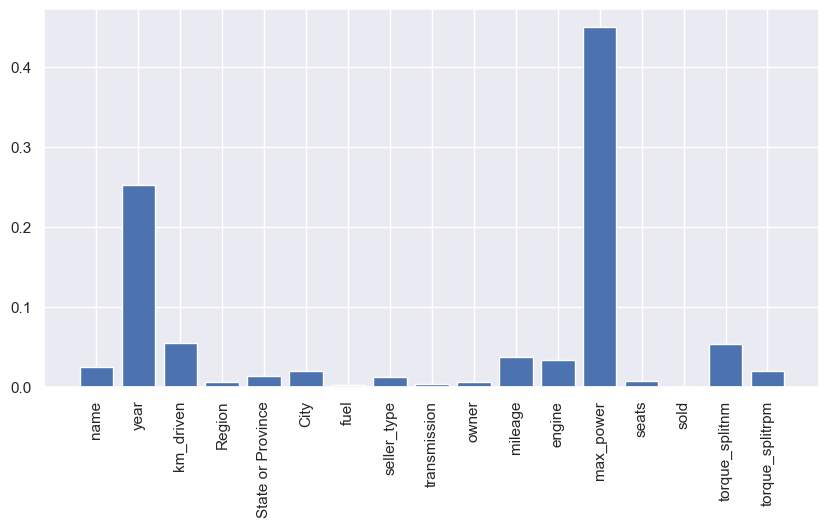

In [349]:
# Plot showing best parameters for random forest predictions
rf_best_params_plot = plt.figure(figsize=(10,5), dpi =100)
plt.bar(range(len(features.columns)), grid_search_reg.best_estimator_.feature_importances_)
plt.xticks(range(len(features.columns)), features.columns, rotation='vertical')
plt.show()

In [350]:
# Visualising the best score for the model 
grid_search_reg.best_score_

0.9343550444187203

In [351]:
# Visualising the cv results for each combination in the model 
grid_search_reg.cv_results_

{'mean_fit_time': array([ 0.25385666,  0.85250839,  1.68803024,  0.25883794,  0.82652028,
         1.68070642,  0.24519968,  0.79820498,  1.70868341,  0.25886559,
         0.78289413,  1.67370343,  0.32447529,  0.86950135,  1.72734229,
         0.24751035,  0.87549988,  1.67804289,  0.23819359,  0.73425062,
         1.45618216,  0.28417087,  0.87782439,  1.51911807,  0.26384838,
         0.73057755,  1.46550171,  0.26251642,  0.77589059,  1.62439958,
         0.27650102,  0.77389002,  1.5694387 ,  0.34580342,  1.24095774,
         1.87891889,  0.42842015,  1.11969241,  3.96073755,  0.4414142 ,
         1.10636592,  1.79263719,  0.24719866,  0.73691909,  1.47214484,
         0.24885694,  0.82351851,  1.47681491,  0.25118057,  0.73159504,
         1.73834817,  0.3214887 ,  0.83251643,  1.88326478,  0.38278047,
         1.00775846,  1.62408153,  0.264177  ,  0.82219728,  1.69203361,
         0.68661014,  2.20907283,  4.02787169,  0.41309706,  1.49781156,
         1.83661795,  0.2661825 , 

In [352]:
rf_reg_params_df = pd.DataFrame.from_dict(grid_search_reg.cv_results_)
display(rf_reg_params_df)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_leaf,param_min_samples_split,param_n_estimators,...,split1_test_neg_root_mean_squared_error,split2_test_neg_root_mean_squared_error,mean_test_neg_root_mean_squared_error,std_test_neg_root_mean_squared_error,rank_test_neg_root_mean_squared_error,split0_train_neg_root_mean_squared_error,split1_train_neg_root_mean_squared_error,split2_train_neg_root_mean_squared_error,mean_train_neg_root_mean_squared_error,std_train_neg_root_mean_squared_error
0,0.253857,0.007128,0.011992,0.000001,squared_error,2,200,1,2,100,...,-4254.119297,-4325.891187,-4819.101095,748.828003,640,-4015.994874,-4690.187169,-4763.067044,-4489.749696,336.313933
1,0.852508,0.100853,0.045307,0.011837,squared_error,2,200,1,2,300,...,-4275.856639,-4301.093350,-4790.102478,709.483201,622,-3910.093150,-4690.385908,-4776.881545,-4459.120201,389.823380
2,1.688030,0.087871,0.102607,0.057624,squared_error,2,200,1,2,600,...,-4262.393709,-4271.890384,-4772.924273,715.294592,595,-3911.317121,-4684.472394,-4756.524586,-4450.771367,382.584232
3,0.258838,0.015578,0.012348,0.000471,squared_error,2,200,1,4,100,...,-4254.119297,-4325.891187,-4819.101095,748.828003,640,-4015.994874,-4690.187169,-4763.067044,-4489.749696,336.313933
4,0.826520,0.124754,0.032321,0.002618,squared_error,2,200,1,4,300,...,-4275.856639,-4301.093350,-4790.102478,709.483201,622,-3910.093150,-4690.385908,-4776.881545,-4459.120201,389.823380
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
643,21.001682,0.721137,0.052630,0.002499,absolute_error,20,1800,4,4,300,...,-2019.960087,-2358.690283,-2947.785210,1081.501846,289,-1655.480880,-2554.193936,-2646.650777,-2285.441865,447.046007
644,40.999285,0.790598,0.097616,0.001255,absolute_error,20,1800,4,4,600,...,-2034.261847,-2354.185061,-2954.175810,1082.641974,307,-1657.691691,-2583.706982,-2656.358688,-2299.252454,454.620521
645,6.762975,0.087585,0.018321,0.000471,absolute_error,20,1800,4,5,100,...,-1981.785991,-2391.825117,-2941.416227,1080.229861,271,-1655.722762,-2536.038932,-2616.327076,-2269.362923,435.145365
646,20.403684,0.086914,0.051302,0.001684,absolute_error,20,1800,4,5,300,...,-2019.960087,-2358.690283,-2947.785210,1081.501846,289,-1655.480880,-2554.193936,-2646.650777,-2285.441865,447.046007


In [353]:
# Selecting some performance metrics for insight
rf_reg_params_df[['mean_train_r2', 'mean_test_r2', 'mean_train_neg_mean_squared_error', 'mean_test_neg_mean_squared_error', 'rank_test_r2']]

,mean_train_r2,mean_test_r2,mean_train_neg_mean_squared_error,mean_test_neg_mean_squared_error,rank_test_r2
0,0.821068,0.791725,-2.027096e+07,-2.378448e+07,640
1,0.823590,0.794252,-2.003572e+07,-2.344845e+07,622
2,0.824232,0.795808,-1.995574e+07,-2.329245e+07,595
3,0.821068,0.791725,-2.027096e+07,-2.378448e+07,640
4,0.823590,0.794252,-2.003572e+07,-2.344845e+07,622
...,...,...,...,...,...
643,0.953203,0.919615,-5.423095e+06,-9.859084e+06,271
644,0.952603,0.919322,-5.493242e+06,-9.899268e+06,298
645,0.953890,0.919776,-5.339360e+06,-9.818826e+06,235
646,0.953203,0.919615,-5.423095e+06,-9.859084e+06,271


In [354]:
# view the best performing model stats
rf_reg_params_df[['mean_train_r2', 'mean_test_r2', 'mean_train_neg_mean_absolute_error', 'mean_test_neg_mean_absolute_error', 'rank_test_r2']].sort_values('rank_test_r2')

,mean_train_r2,mean_test_r2,mean_train_neg_mean_absolute_error,mean_test_neg_mean_absolute_error,rank_test_r2
594,0.990580,0.934355,-430.719763,-1105.961887,1
621,0.990671,0.934347,-419.488163,-1105.815401,2
567,0.989237,0.934181,-551.100764,-1112.535240,3
624,0.988046,0.934142,-473.122569,-1107.231262,4
597,0.988046,0.934142,-473.122569,-1107.231262,4
...,...,...,...,...,...
33,0.821068,0.791725,-2895.073316,-2987.545255,640
54,0.821068,0.791725,-2895.073316,-2987.545255,640
57,0.821068,0.791725,-2895.073316,-2987.545255,640
6,0.821068,0.791725,-2895.073316,-2987.545255,640


In [355]:
# Checking to validate the importance of available features.
features_opt_reg_list = []

feature_importance = grid_search_reg.best_estimator_.feature_importances_

# Note: feature importance output order is as in the order of training so if this is zipped together.

for i,j in sorted(zip(feature_importance,features.columns), reverse=True):
    print(f"{i*100}: {j}")
    features_opt_reg_list.append(j)

44.93875609849927: max_power
25.193036718320183: year
5.546869010017546: km_driven
5.371322594436802: torque_splitnm
3.7961627558994127: mileage
3.398323274395656: engine
2.5319937491949376: name
2.0113091921276305: torque_splitrpm
1.9748692211591896: City
1.362736515409125: State or Province
1.2283353074903298: seller_type
0.7629958730375949: seats
0.6585134552945917: Region
0.5681809550663641: owner
0.3998307710724765: transmission
0.25676450857888655: fuel
0.0: sold


In [356]:
# Viewing the best predicting features after hyperparameter optimisation for regression task
features_opt_reg_list

['max_power',
 'year',
 'km_driven',
 'torque_splitnm',
 'mileage',
 'engine',
 'name',
 'torque_splitrpm',
 'City',
 'State or Province',
 'seller_type',
 'seats',
 'Region',
 'owner',
 'transmission',
 'fuel',
 'sold']

In [357]:
# Selecting the top 4 features suggested by random forest
features_opt_reg_top4 = features_opt_reg_list[0:4]
features_opt_reg_top4

['max_power', 'year', 'km_driven', 'torque_splitnm']

### Data preparation using hyperparameter optimisation  features

In [358]:
refined_car_df[features_opt_reg_top4]

,max_power,year,km_driven,torque_splitnm
0,74.00,2014,145500,190.0
1,103.52,2014,120000,250.0
2,78.00,2006,140000,140.0
3,90.00,2010,127000,140.0
4,88.20,2007,120000,140.0
...,...,...,...,...
7901,82.85,2013,110000,113.7
7902,110.00,2007,119000,140.0
7903,73.90,2009,120000,190.0
7904,70.00,2013,25000,140.0


In [359]:
features_selling_price_top4 = refined_car_df[features_opt_reg_top4]
target_selling_price_top4 = refined_car_df["selling_price"]

x_train_top4,x_test_top4,y_train_top4 ,y_test_top4=  train_test_split(features_selling_price_top4,target_selling_price_top4, test_size = 0.25, random_state = 42, shuffle=True, stratify=None)

In [360]:
x_train_top4

,max_power,year,km_driven,torque_splitnm
964,70.00,2006,120000,140.0
3790,40.30,2017,67000,60.0
1423,120.00,2003,98000,290.0
122,88.76,2013,90000,200.0
3927,84.00,2017,38000,114.0
...,...,...,...,...
5226,83.10,2019,5000,115.0
5390,86.80,2016,60000,109.0
860,94.00,2003,90000,140.0
7603,181.00,2012,155000,380.0


In [361]:
# Get the index of x_test values
x_test_index_top4 = x_test_top4.index
x_train_index_top4 = x_train_top4.index

In [362]:
x_train_top4 = x_train_top4.values
x_train_top4

array([[7.000e+01, 2.006e+03, 1.200e+05, 1.400e+02],
       [4.030e+01, 2.017e+03, 6.700e+04, 6.000e+01],
       [1.200e+02, 2.003e+03, 9.800e+04, 2.900e+02],
       ...,
       [9.400e+01, 2.003e+03, 9.000e+04, 1.400e+02],
       [1.810e+02, 2.012e+03, 1.550e+05, 3.800e+02],
       [8.186e+01, 2.018e+03, 2.500e+04, 1.170e+02]])

In [363]:
x_test_top4 = x_test_top4.values
x_test_top4

array([[7.400e+01, 2.014e+03, 6.800e+04, 1.900e+02],
       [7.400e+01, 2.015e+03, 1.100e+05, 1.900e+02],
       [7.000e+01, 2.012e+03, 1.850e+05, 1.354e+02],
       ...,
       [5.520e+01, 2.012e+03, 6.500e+04, 7.450e+01],
       [9.900e+01, 2.017e+03, 1.130e+05, 2.150e+02],
       [1.030e+02, 2.018e+03, 6.200e+03, 1.380e+02]])

In [364]:
x_train_top4.shape

(5929, 4)

In [365]:
x_test_top4.shape

(1977, 4)

In [366]:
y_train_top4 = y_train_top4.values
y_train_top4

array([ 1200,  3120,  3600, ...,  1320, 10800,  9600], dtype=int64)

In [367]:
y_test_top4 = y_test_top4.values
y_test_top4

array([6012, 5280, 1680, ..., 2280, 5160, 8400], dtype=int64)

In [368]:
y_train_top4.shape

(5929,)

In [369]:
y_test_top4.shape

(1977,)

#### Standardising the data

In [370]:
# MinMax Scaler was chosen to standardise the data because it preserves the relationship in the data.
standard_scaler = StandardScaler()
x_train_min_max_top4 = standard_scaler.fit_transform(x_train_top4)
x_test_min_max_top4 = standard_scaler.transform(x_test_top4)

### Function to generate metrics report of regressor models trained with best features suggested by random forest

In [371]:
class get_opt_reg_metrics:
    
    def __init__(self,model,reg_name, checker=0, features=features_selling_price_top4,target=target_selling_price_top4):
        if (checker == 0):
            self.model = model
            self.train = y_train_top4
            self.test = y_test_top4
            self.reg_name = reg_name
            self.features = features
            self.target = target
            self.checker = checker

            # Predicting training data
            self.train_pred = (self.model).predict(x_train_top4)

            # predicting test data
            self.test_pred = (self.model).predict(x_test_top4)
        
        elif (checker == 1):
            self.model = model
            self.train = standard_scaler.inverse_transform(y_train_min_max_top4.reshape(-1,1))
            self.test = standard_scaler.inverse_transform(y_test_min_max_top4.reshape(-1,1))
            self.reg_name = reg_name
            self.features = pd.DataFrame(x_train_min_max_top4)
            self.target = pd.DataFrame(y_train_min_max_top4)
            self.checker = checker

            # Predicting training data
            self.train_pred = standard_scaler.inverse_transform((self.model).predict(x_train_min_max_top4).reshape(-1,1))

            # predicting test data
            self.test_pred = standard_scaler.inverse_transform((self.model).predict(x_test_min_max_top4).reshape(-1,1))
            
        else:
            print("Use either 0 or 1 for checker parameter")
    
    # Make predictions on the training and test datasets
    def get_opt_pred(self):
        print("Training predictions are : \n{}\n\nTest predictions are : \n{}".format(self.train_pred,self.test_pred))
        self.result =  [self.train_pred, self.test_pred]
        return self.result
        
    # Evaluating model train and test accuracy score
    def get_opt_accuracy_score(self):
        print("The training accuracy for {} is {}".format(self.reg_name, r2_score(self.train, self.train_pred, multioutput='uniform_average')))
        print("The test accuracy for {} is {}".format(self.reg_name, r2_score(self.test, self.test_pred, multioutput='uniform_average')))

    # Evaluating the Algorithm
    def get_opt_error_metrics(self): 
        print("Mean Absolute Error for {} : {}".format(self.reg_name,mean_absolute_error(self.test, self.test_pred)))  
        print("Mean Squared Error for {} : {}".format(self.reg_name,mean_squared_error(self.test, self.test_pred)))
        print("Root Mean Squared Error for {} : {}".format(self.reg_name, np.sqrt(mean_squared_error(self.test, self.test_pred))))
        
    # To check the mean bias error of the predictions if they are positive or negative
    def opt_mean_bias_error(self):
        bias_error = self.test - self.test_pred
        mbe_loss = np.mean(np.sum(bias_error) / self.test.size)
        print("Mean bias error for {} : {}".format(self.reg_name, mbe_loss))
    
    # Performance metric measurement of the model
    def opt_relative_root_mean_squrae_error(self):
        number = np.sum(np.square(self.test - self.test_pred))
        density = np.sum(np.square(self.test_pred))
        squared_error =  number/density
        rrmse_loss = np.sqrt(squared_error)
        print("Relative root mean square error for {} : {}".format(self.reg_name, rrmse_loss))

    # Perform cross-validation on the model with the data
    def get_opt_cross_val_result(self):
            if (self.checker == 0):
                cv = RepeatedStratifiedKFold(n_splits=3, n_repeats=3, random_state=1)
                scores = cross_validate(self.model, self.features, self.target, cv=cv,
                                       scoring=('r2', "neg_mean_absolute_error", "neg_mean_squared_error" ,'neg_root_mean_squared_error'),
                                       return_train_score=True)
                scores = pd.DataFrame(scores)
                print("Train Data Accuracy Average After Cross_validation with {} : {}".format(self.reg_name, scores["train_r2"].mean()))
                print("Test Data Accuracy Average After Cross_validation with {} : {}".format(self.reg_name, scores["test_r2"].mean()))
                display(scores)
            else:
                pass
              
    # Compare predicted and actual prices in created dataframe
    def get_opt_new_dfs(self):
        if (self.checker == 0):
              
            # Concatenating the predicted prices to actual dataset rows for comparism
            car_train_df= refined_car_df.loc[x_train_index_top4]
            car_test_df = refined_car_df.loc[x_test_index_top4]

            car_train_df = car_train_df.reset_index()
            car_test_df = car_test_df.reset_index()     

            train_pred_df = pd.DataFrame(data=self.train_pred, index=x_train_index, columns=["Predicted Selling Price"])
            train_pred_df = train_pred_df.reset_index()
            test_pred_df = pd.DataFrame(data=self.test_pred, index=x_test_index, columns=["Predicted Selling Price"])
            test_pred_df = test_pred_df.reset_index()
            car_train_df = pd.merge(car_train_df,round(train_pred_df,2), how="inner", on="index")
            car_test_df = pd.merge(car_test_df,round(test_pred_df,2), how="inner", on="index")

            car_train_df.drop(labels="index", axis=1, inplace=True)
            car_test_df.drop(labels="index", axis=1, inplace=True)

            car_train_df["selling_diff"] = car_train_df["selling_price"] - car_train_df["Predicted Selling Price"]
            car_train_df["upper_limit_train_thres"] = car_train_df["selling_price"]*1.05 - car_train_df["selling_price"]
            car_train_df["lower_limit_train_thres"] = car_train_df["selling_price"]*0.95 - car_train_df["selling_price"]
            car_train_df["+/-train_threshold"] = car_train_df["selling_price"]*1.05 - car_train_df["selling_price"]
            
            print("Train prediction mean deviation: ",car_train_df["selling_diff"].mean())
            print("Train prediction standard deviation: ",car_train_df["selling_diff"].std())
            self.train_sell_df = car_train_df[["max_power","selling_price","Predicted Selling Price", "selling_diff", "+/-train_threshold"]]
            display((car_train_df[["max_power","selling_price","Predicted Selling Price","selling_diff", "lower_limit_train_thres", "+/-train_threshold"]]).head(10))

            car_test_df["selling_diff"] = car_test_df["selling_price"] - car_test_df["Predicted Selling Price"]
            car_test_df["upper_limit_test_thres"] = car_test_df["selling_price"]*1.05 - car_test_df["selling_price"]
            car_test_df["lower_limit_test_thres"] = car_test_df["selling_price"]*0.95 - car_test_df["selling_price"]
            car_test_df["+/-test_threshold"] = car_test_df["selling_price"]*1.05 - car_test_df["selling_price"]
            
            print("Test prediction mean deviation: ",car_test_df["selling_diff"].mean())
            print("Test prediction standard deviation: ",car_test_df["selling_diff"].std())
            self.test_sell_df = car_test_df[["max_power","selling_price","Predicted Selling Price", "selling_diff", "+/-test_threshold"]]
            display((car_test_df[["max_power","selling_price","Predicted Selling Price", "selling_diff", "+/-test_threshold",]]).head(10))
            
            within_train_limit = car_train_df[(car_train_df["selling_diff"] > car_train_df['upper_limit_train_thres']) | (car_train_df["selling_diff"] < car_train_df["lower_limit_train_thres"])]
            perc_within_train_limit = len(within_train_limit)/len(car_train_df)
            print("The percentage of train predictions within limit are: ",perc_within_train_limit)
            print("The percentage of train predictions outside limit are: ",1-perc_within_train_limit)
            
            within_test_limit = car_test_df[(car_test_df["selling_diff"] > car_test_df['upper_limit_test_thres']) | (car_test_df["selling_diff"] < car_test_df["lower_limit_test_thres"])]
            perc_within_test_limit = len(within_test_limit)/len(car_test_df)
            print("The percentage of test predictions within limit are: ",perc_within_test_limit)
            print("The percentage of test predictions outside limit are: ",1-perc_within_test_limit)
        
        elif (self.checker == 1):
            # Concatenating the predicted prices to actual dataset rows for comparism
            car_train_df= refined_car_df.loc[x_train_stdzz_top4.index]
            car_test_df = refined_car_df.loc[x_test_stdzz_top4.index]

            car_train_df = car_train_df.reset_index()
            car_test_df = car_test_df.reset_index()  
            
            self.train_pred = np.reshape(self.train_pred,len(self.train_pred))
            self.test_pred = np.reshape(self.test_pred,len(self.test_pred))

            train_pred_df = pd.DataFrame(data=self.train_pred, index=x_train_stdzz.index, columns=["Predicted Selling Price"])
            train_pred_df = train_pred_df.reset_index()
            test_pred_df = pd.DataFrame(data=self.test_pred, index=x_test_stdzz.index, columns=["Predicted Selling Price"])
            test_pred_df = test_pred_df.reset_index()
            car_train_df = pd.merge(car_train_df,round(train_pred_df,2), how="inner", on="index")
            car_test_df = pd.merge(car_test_df,round(test_pred_df,2), how="inner", on="index")

            car_train_df.drop(labels="index", axis=1, inplace=True)
            car_test_df.drop(labels="index", axis=1, inplace=True)

            car_train_df["selling_diff"] = car_train_df["selling_price"] - car_train_df["Predicted Selling Price"]
            car_train_df["upper_limit_train_thres"] = car_train_df["selling_price"]*1.05 - car_train_df["selling_price"]
            car_train_df["lower_limit_train_thres"] = car_train_df["selling_price"]*0.95 - car_train_df["selling_price"]
            car_train_df["+/-train_threshold"] = car_train_df["selling_price"]*1.05 - car_train_df["selling_price"]
            
            print("Train prediction mean deviation: ",car_train_df["selling_diff"].mean())
            print("Train prediction standard deviation: ",car_train_df["selling_diff"].std())
            self.train_sell_df = car_train_df[["max_power","selling_price","Predicted Selling Price", "selling_diff", "+/-train_threshold"]]
            display((car_train_df[["max_power","selling_price","Predicted Selling Price","selling_diff", "+/-train_threshold"]]).head(10))

            car_test_df["selling_diff"] = car_test_df["selling_price"] - car_test_df["Predicted Selling Price"]
            car_test_df["upper_limit_test_thres"] = car_test_df["selling_price"]*1.05 - car_test_df["selling_price"]
            car_test_df["lower_limit_test_thres"] = car_test_df["selling_price"]*0.95 - car_test_df["selling_price"]
            car_test_df["+/-test_threshold"] = car_test_df["selling_price"]*1.05 - car_test_df["selling_price"]
            
            print("Test prediction mean deviation: ",car_test_df["selling_diff"].mean())
            print("Test prediction standard deviation: ",car_test_df["selling_diff"].std())
            self.test_sell_df = car_test_df[["max_power","selling_price","Predicted Selling Price", "selling_diff", "+/-test_threshold"]]
            display((car_test_df[["max_power","selling_price","Predicted Selling Price", "selling_diff", "+/-test_threshold"]]).head(10))
        
            within_train_limit = car_train_df[(car_train_df["selling_diff"] < car_train_df['upper_limit_train_thres']) | (car_train_df["selling_diff"] < car_train_df["lower_limit_train_thres"])]
            perc_within_train_limit = len(within_train_limit)/len(car_train_df)
            print("The percentage of train predictions within limit are: ",perc_within_train_limit)
            print("The percentage of train predictions outside limit are: ",1-perc_within_train_limit)
            
            within_test_limit = car_test_df[(car_test_df["selling_diff"] < car_test_df['upper_limit_test_thres']) | (car_test_df["selling_diff"] < car_test_df["lower_limit_test_thres"])]
            perc_within_test_limit = len(within_test_limit)/len(car_test_df)
            print("The percentage of test predictions within limit are: ",perc_within_test_limit)
            print("The percentage of test predictions outside limit are: ",1-perc_within_test_limit)
            
            
        else:
            print("Use either 0 or 1 for checker parameter")
            
        
     # Execute all functions in the class         
    def execute_opt_metrics(self):
        self.get_opt_pred()
        print("\n")
        self.get_opt_accuracy_score()
        print("\n")
        self.get_opt_error_metrics()
        print("\n")
        self.opt_mean_bias_error()
        print("\n")
        self.opt_relative_root_mean_squrae_error()
        print("\n")
        self.get_opt_cross_val_result()
        print("\n")
        self.get_opt_new_dfs()
        return [self.train_pred, self.test_pred, self.train_sell_df, self.test_sell_df]
    

### Function to generate plot of regressor models trained with best features suggested by random forest

In [372]:
# Lineplot of max power and selling price for the test data
def generate_opt_plot(pred_list, reg_name, checker=0):
    if (checker == 0):
        validation_line_plot = plt.figure(figsize=(20,10), dpi = 100 )
        plt.subplot(1,2,1)
        actual_validation_line_chart = sns.lineplot(x= x_test_max_pow_top4, y=x_test_sell_pri_top4, palette="Set2", label= "Actual Price")
        actual_validation_line_chart2 = sns.lineplot(x= x_test_max_pow_top4, y=pred_list[1], palette="Set2", label="Predicted Price" )
        actual_validation_line_chart.set(xlabel="Max Power", ylabel='Selling Price')
        plt.title(f"Max power vs actual selling price  and {reg_name} predicted selling price\nfor test dataset", fontsize="large" , fontweight="light", loc="center")
        plt.legend()
        #plt.xlim(50,250)

        plt.subplot(1,2,2)
        # Lineplot of max power and selling price for the training data
        actual_validation_line_chart = sns.lineplot(x= x_train_max_pow_top4, y=x_train_sell_pri_top4, palette="Set2", label= "Actual Price")
        actual_validation_line_chart2 = sns.lineplot(x= x_train_max_pow_top4, y=pred_list[0], palette="Set2", label="Predicted Price" )
        actual_validation_line_chart.set(xlabel="Max Power", ylabel='Selling Price')
        plt.title(f"Max power vs actual selling price  and {reg_name} predicted selling price\nfor training dataset", fontsize="large" , fontweight="light", loc="center")
        plt.legend()
        #plt.xlim(50,250)
        plt.show()
    
    if (checker == 1):
        validation_line_plot = plt.figure(figsize=(20,10), dpi = 100 )
        plt.subplot(1,2,1)
        actual_validation_line_chart = sns.lineplot(x= pred_list[3].max_power, y=pred_list[3].selling_price, palette="Set2", label= "Actual Price")
        actual_validation_line_chart2 = sns.lineplot(x= pred_list[3].max_power, y=pred_list[1], palette="Set2", label="Predicted Price" )
        actual_validation_line_chart.set(xlabel="Max Power", ylabel='Selling Price')
        plt.title(f"Max power vs actual selling price  and {reg_name} predicted selling price\nfor test dataset", fontsize="large" , fontweight="light", loc="center")
        plt.legend()
        #plt.xlim(50,250)

        plt.subplot(1,2,2)
        # Lineplot of max power and selling price for the training data
        actual_validation_line_chart = sns.lineplot(x= pred_list[2].max_power, y=pred_list[2].selling_price, palette="Set2", label= "Actual Price")
        actual_validation_line_chart2 = sns.lineplot(x= pred_list[2].max_power, y=pred_list[0], palette="Set2", label="Predicted Price" )
        actual_validation_line_chart.set(xlabel="Max Power", ylabel='Selling Price')
        plt.title(f"Max power vs actual selling price  and {reg_name} predicted selling price\nfor training dataset", fontsize="large" , fontweight="light", loc="center")
        plt.legend()
        #plt.xlim(50,250)
        plt.show()
    
    return validation_line_plot

In [373]:
x_test_max_pow_top4 = refined_car_df.max_power.loc[x_test_index_top4]
x_test_sell_pri_top4 = refined_car_df.selling_price.loc[x_test_index_top4]
x_train_max_pow_top4 = refined_car_df.max_power.loc[x_train_index_top4]
x_train_sell_pri_top4 = refined_car_df.selling_price.loc[x_train_index_top4]

In [374]:
x_test_max_pow_top4

3641     74.0
5531     74.0
3524     70.0
7478     87.2
3455     81.8
        ...  
7447    100.0
6353     62.0
7765     55.2
4224     99.0
2251    103.0
Name: max_power, Length: 1977, dtype: float64

In [375]:
"""
The above result happen to be in accordance with our earlier preferred features so I would just fit the existing training and 
test data into an Optimised random forest regressor model.
"""

'\nThe above result happen to be in accordance with our earlier preferred features so I would just fit the existing training and \ntest data into an Optimised random forest regressor model.\n'

In [376]:
# Viewing the best parameters for building the model
grid_search_reg.best_params_

{'criterion': 'absolute_error',
 'max_depth': 20,
 'max_leaf_nodes': 500,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 100}

In [377]:
# Define the model parameters and fitting the model using hyperparameter optimised specification
rf_opt_reg = RandomForestRegressor(n_estimators=100,
                               criterion='absolute_error', 
                               max_depth=20, 
                               min_samples_split=2, 
                               min_samples_leaf=1, 
                               min_weight_fraction_leaf=0.0,
                               max_features=1.0, 
                               max_leaf_nodes=500,
                               min_impurity_decrease=0.0,
                               bootstrap=True, 
                               oob_score=True,
                               n_jobs=-1,
                               random_state=40, 
                               verbose=0,
                               warm_start=False,
                               ccp_alpha=0.0, 
                               max_samples=None)

rf_opt_reg.fit(x_train_top4, y_train_top4)

RandomForestRegressor(criterion='absolute_error', max_depth=20,
                      max_features=1.0, max_leaf_nodes=500, n_jobs=-1,
                      oob_score=True, random_state=40)

In [378]:
# Generate metrics report
rf_opt_reg_pred = get_opt_reg_metrics(rf_opt_reg,"Random Forest Optimised Regressor Model").execute_opt_metrics()

Training predictions are : 
[ 1403.69   3179.19   3221.415 ...  1227.765 12421.2    8611.97 ]

Test predictions are : 
[ 5633.265  6545.465  2244.625 ...  2279.7    7074.9   10830.78 ]


The training accuracy for Random Forest Optimised Regressor Model is 0.9892564299710948
The test accuracy for Random Forest Optimised Regressor Model is 0.9762521361188404


Mean Absolute Error for Random Forest Optimised Regressor Model : 847.9845624683865
Mean Squared Error for Random Forest Optimised Regressor Model : 2484663.6256352807
Root Mean Squared Error for Random Forest Optimised Regressor Model : 1576.2815819628422


Mean bias error for Random Forest Optimised Regressor Model : 14.131729893778452


Relative root mean square error for Random Forest Optimised Regressor Model : 0.12341874493740164


Train Data Accuracy Average After Cross_validation with Random Forest Optimised Regressor Model : 0.9901761258293355
Test Data Accuracy Average After Cross_validation with Random Forest Optimised R

,fit_time,score_time,test_r2,train_r2,test_neg_mean_absolute_error,train_neg_mean_absolute_error,test_neg_mean_squared_error,train_neg_mean_squared_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
0,14.168502,0.038977,0.962908,0.990584,-865.211174,-595.902827,-3.592219e+06,-890116.930900,-1895.315002,-943.460084
1,10.144207,0.046974,0.967137,0.990174,-915.081279,-588.534930,-3.118050e+06,-938528.146518,-1765.800178,-968.776624
2,10.437546,0.037979,0.970333,0.989586,-877.326009,-606.725594,-2.794107e+06,-998328.470834,-1671.558241,-999.163886
3,10.219670,0.040978,0.964728,0.989804,-875.195525,-608.671818,-3.416006e+06,-963822.360522,-1848.244025,-981.744550
4,10.200173,0.038982,0.973636,0.990013,-857.381930,-602.843781,-2.501477e+06,-953905.888927,-1581.605775,-976.681058
5,10.229156,0.039978,0.968231,0.990326,-887.641736,-596.096759,-2.992066e+06,-927363.343844,-1729.759059,-962.997063
6,10.347163,0.036979,0.965482,0.990572,-884.137100,-592.047110,-3.342970e+06,-891211.239185,-1828.379018,-944.039850
7,11.889268,0.041977,0.969699,0.990510,-901.189740,-590.781397,-2.874983e+06,-906475.225146,-1695.577595,-952.089925
8,10.498004,0.035979,0.966552,0.990015,-878.007683,-602.340834,-3.150263e+06,-957173.539546,-1774.898061,-978.352462




Train prediction mean deviation:  34.89647158036768
Train prediction standard deviation:  994.7065568082982


,max_power,selling_price,Predicted Selling Price,selling_diff,lower_limit_train_thres,+/-train_threshold
0,70.00,1200,1403.69,-203.69,-60.0,60.0
1,40.30,3120,3179.19,-59.19,-156.0,156.0
2,120.00,3600,3221.42,378.58,-180.0,180.0
3,88.76,7500,5607.58,1892.42,-375.0,375.0
4,84.00,5160,5256.10,-96.10,-258.0,258.0
5,85.80,1920,2160.16,-240.16,-96.0,96.0
6,204.00,36000,33455.40,2544.60,-1800.0,1800.0
7,74.00,7920,8817.84,-897.84,-396.0,396.0
8,74.00,7800,7814.10,-14.10,-390.0,390.0
9,69.00,5400,5069.46,330.54,-270.0,270.0


Test prediction mean deviation:  14.13177035913
Test prediction standard deviation:  1576.6171300489757


,max_power,selling_price,Predicted Selling Price,selling_diff,+/-test_threshold
0,74.00,6012,5633.26,378.74,300.60
1,74.00,5280,6545.46,-1265.46,264.00
2,70.00,1680,2244.62,-564.62,84.00
3,87.20,5723,4566.06,1156.94,286.15
4,81.80,7440,7210.56,229.44,372.00
5,118.00,4560,3992.58,567.42,228.00
6,81.86,4320,6293.30,-1973.30,216.00
7,110.00,2220,2340.96,-120.96,111.00
8,37.00,1884,1453.32,430.68,94.20
9,87.20,7200,4556.93,2643.07,360.00


The percentage of train predictions within limit are:  0.6505312868949232
The percentage of train predictions outside limit are:  0.34946871310507677
The percentage of test predictions within limit are:  0.708649468892261
The percentage of test predictions outside limit are:  0.291350531107739


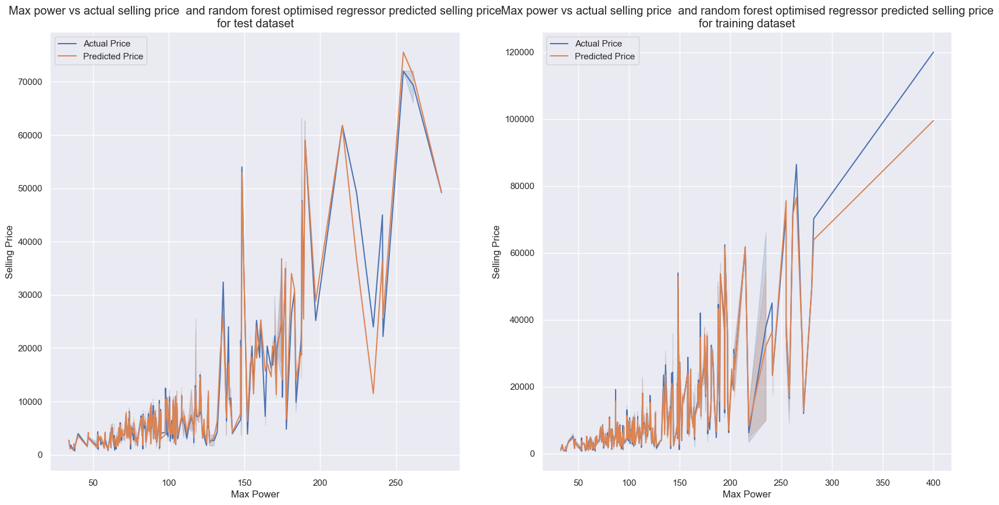

In [379]:
# Plotting performance of Optimised random Forest Regressor of selling price prediction 
rf_opt_reg_plot = generate_opt_plot(rf_opt_reg_pred, "random forest optimised regressor")

### Stacking Regressor Model with optimised features

In [380]:
# Defining a function for stacking.
from sklearn.ensemble import StackingRegressor
def get_stacking():
    level0 = list()
    level0.append(('mlr', LinearRegression(fit_intercept=True, normalize=True, positive=False, n_jobs=None)))
    level0.append(('pr', Pipeline([('poly', PolynomialFeatures(degree=2)),
                  ('linear', LinearRegression(fit_intercept=True))])))
    level0.append(('rfr', RandomForestRegressor( n_estimators=100,
                               criterion='mse', 
                               max_depth=20, 
                               min_samples_split=2, 
                               min_samples_leaf=1, 
                               min_weight_fraction_leaf=0.0,
                               max_features=1.0, 
                               max_leaf_nodes=500,
                               min_impurity_decrease=0.0,
                               bootstrap=True, 
                               oob_score=True,
                               n_jobs=-1,
                               random_state=40, 
                               verbose=0,
                               warm_start=False,
                               ccp_alpha=0.0, 
                               max_samples=None
    )))
    level0.append(('xgb1', XGBRegressor( n_estimators = 1000,
                        objective='reg:squarederror',
                       max_depth = 4,
                       eta = 0.1,
                        subsample = 0.7,
                        colsample_bytree = 1.0,
                       verbosity=0,
                       learning_rate=0.05,
    )))
    level0.append(('xgb2', XGBRegressor( n_estimators = 1000,
                        objective='reg:squarederror',
                       max_depth = 4,
                       eta = 0.1,
                        subsample = 0.7,
                        colsample_bytree = 1.0,
                       verbosity=0,
                       learning_rate=0.05,
    )))
    level1 = XGBRegressor( n_estimators = 1000,
                        objective='reg:squarederror',
                       max_depth = 4,
                       eta = 0.1,
                        subsample = 0.7,
                        colsample_bytree = 1.0,
                       verbosity=0,
                       learning_rate=0.05,
    )
    model = StackingRegressor(estimators=level0, final_estimator=level1, cv=5, passthrough=False)
    return model

# Getting the models required after adding stacking
def get_models():
    models =  get_stacking()
    return models

# Function to evaluate the models
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=3, n_repeats=3, random_state=1)
    scores = cross_validate(model, X, y, scoring=('r2', "neg_mean_absolute_error", "neg_mean_squared_error" ,'neg_root_mean_squared_error'), cv=cv, n_jobs=-1, 
    error_score='raise')
    train_result = model.fit(X,y)
    scores = pd.DataFrame(scores)
    return scores, train_result

def get_dataset():
    return x_train_top4, y_train_top4

#Grab hold of the dataset.
X, y = get_dataset()

#Grab the models to use.
stacked_opt_reg_models = get_models()

#Run and Evaluate the models.
scores, stacked_opt_reg_model = evaluate_model(stacked_opt_reg_models, X, y)
display(scores)

,fit_time,score_time,test_r2,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_neg_root_mean_squared_error
0,75.649536,0.185895,0.959041,-990.015159,-3.688210e+06,-1920.471168
1,75.809443,0.220876,0.952042,-1015.262708,-4.492126e+06,-2119.463506
2,75.801448,0.181895,0.954738,-1035.446764,-4.203008e+06,-2050.123822
3,75.593567,0.167905,0.961648,-971.922819,-3.453523e+06,-1858.365615
4,75.624354,0.131924,0.958719,-987.722748,-3.866679e+06,-1966.387174
5,75.340515,0.149915,0.957269,-1002.309418,-3.967968e+06,-1991.975837
6,75.207592,0.170902,0.960016,-977.380535,-3.600474e+06,-1897.491414
7,76.494857,0.107938,0.951779,-1053.263005,-4.516676e+06,-2125.247322
8,40.528872,0.109915,0.951635,-1022.304207,-4.491105e+06,-2119.222657


In [381]:
# Generate metrics report
stacked_opt_reg_pred = get_opt_reg_metrics(stacked_opt_reg_model,"Stacked Optimised Regressors Model").execute_opt_metrics()

Training predictions are : 
[ 1408.9288  3235.673   2949.1677 ...  1076.4799 12705.909   8579.703 ]

Test predictions are : 
[ 5346.9526  6565.41    2168.2786 ...  2341.0908  6983.072  12263.306 ]


The training accuracy for Stacked Optimised Regressors Model is 0.9872127315271501
The test accuracy for Stacked Optimised Regressors Model is 0.9788649947718975


Mean Absolute Error for Stacked Optimised Regressors Model : 841.7578360558039
Mean Squared Error for Stacked Optimised Regressors Model : 2211288.517597556
Root Mean Squared Error for Stacked Optimised Regressors Model : 1487.0401869477355


Mean bias error for Stacked Optimised Regressors Model : -34.76784878519972


Relative root mean square error for Stacked Optimised Regressors Model : 0.11532088329720123


Train Data Accuracy Average After Cross_validation with Stacked Optimised Regressors Model : 0.9880325614004425
Test Data Accuracy Average After Cross_validation with Stacked Optimised Regressors Model : 0.969309231315603

,fit_time,score_time,test_r2,train_r2,test_neg_mean_absolute_error,train_neg_mean_absolute_error,test_neg_mean_squared_error,train_neg_mean_squared_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
0,42.762380,0.126906,0.967868,0.987808,-893.862918,-686.583252,-3.111899e+06,-1.152488e+06,-1764.057410,-1073.539994
1,44.305140,0.132925,0.969135,0.987765,-951.696933,-674.624205,-2.928458e+06,-1.168641e+06,-1711.273715,-1081.036844
2,43.215333,0.161907,0.966529,0.988144,-933.852779,-692.453337,-3.152409e+06,-1.136553e+06,-1775.502516,-1066.092418
3,43.506861,0.128700,0.965938,0.987790,-919.959569,-678.578306,-3.298807e+06,-1.154192e+06,-1816.261914,-1074.333376
4,42.436017,0.147325,0.973267,0.987476,-888.004635,-682.679173,-2.536404e+06,-1.196250e+06,-1592.609249,-1093.732246
5,43.156815,0.145636,0.969929,0.987811,-926.772425,-698.570272,-2.832213e+06,-1.168461e+06,-1682.918019,-1080.953832
6,42.876570,0.130904,0.971612,0.989557,-894.462423,-648.086653,-2.749288e+06,-9.871500e+05,-1658.097651,-993.554206
7,42.546716,0.128854,0.967801,0.988057,-932.983763,-666.200007,-3.055081e+06,-1.140733e+06,-1747.879013,-1068.051228
8,42.483173,0.144216,0.971704,0.987883,-893.207227,-679.801022,-2.664996e+06,-1.161566e+06,-1632.481617,-1077.759665




Train prediction mean deviation:  -13.368283806291112
Train prediction standard deviation:  1085.784858745896


,max_power,selling_price,Predicted Selling Price,selling_diff,lower_limit_train_thres,+/-train_threshold
0,70.00,1200,1408.930054,-208.930054,-60.0,60.0
1,40.30,3120,3235.669922,-115.669922,-156.0,156.0
2,120.00,3600,2949.169922,650.830078,-180.0,180.0
3,88.76,7500,6121.109863,1378.890137,-375.0,375.0
4,84.00,5160,5246.979980,-86.979980,-258.0,258.0
5,85.80,1920,2216.239990,-296.239990,-96.0,96.0
6,204.00,36000,31512.070312,4487.929688,-1800.0,1800.0
7,74.00,7920,8723.089844,-803.089844,-396.0,396.0
8,74.00,7800,7845.209961,-45.209961,-390.0,390.0
9,69.00,5400,5413.149902,-13.149902,-270.0,270.0


Test prediction mean deviation:  -34.767922910343955
Test prediction standard deviation:  1487.0097245837692


,max_power,selling_price,Predicted Selling Price,selling_diff,+/-test_threshold
0,74.00,6012,5346.950195,665.049805,300.60
1,74.00,5280,6565.410156,-1285.410156,264.00
2,70.00,1680,2168.280029,-488.280029,84.00
3,87.20,5723,5354.250000,368.750000,286.15
4,81.80,7440,7082.509766,357.490234,372.00
5,118.00,4560,3889.409912,670.590088,228.00
6,81.86,4320,6614.509766,-2294.509766,216.00
7,110.00,2220,2450.560059,-230.560059,111.00
8,37.00,1884,1687.050049,196.949951,94.20
9,87.20,7200,5354.250000,1845.750000,360.00


The percentage of train predictions within limit are:  0.6891550008433125
The percentage of train predictions outside limit are:  0.3108449991566875
The percentage of test predictions within limit are:  0.7051087506322711
The percentage of test predictions outside limit are:  0.2948912493677289


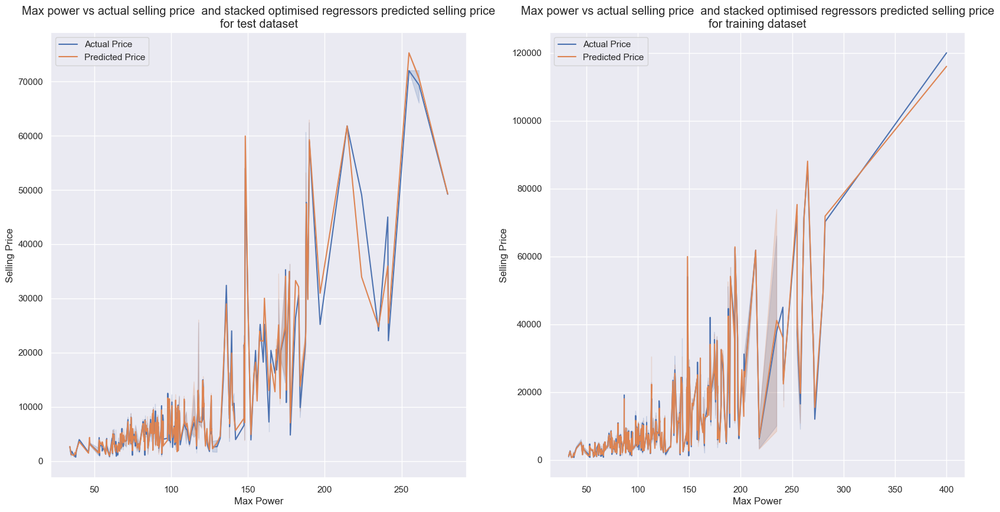

In [382]:
# Plotting performance of Extreme Gradient Boosting (XGB) Regressor regressor of selling price prediction 
stacked_opt_reg_plot = generate_opt_plot(stacked_opt_reg_pred, "stacked optimised regressors")

### XGBoost Regressor Model with optimised features

In [383]:
# Define Extreme Gradient Boosting (XGB) Regressor model parameters
xgb_opt_reg = XGBRegressor( n_estimators = 1000,
                       objective='reg:squarederror',
                       max_depth = 4,
                       eta = 0.1,
                        subsample = 0.7,
                        colsample_bytree = 1.0,
                       verbosity=0,
                       learning_rate=0.05,)

# Fitting the training data to the Extreme Gradient Boosting (XGB) Regressor model
xgb_opt_reg.fit(x_train_top4, y_train_top4)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1.0, enable_categorical=False,
             eta=0.1, gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.05, max_delta_step=0,
             max_depth=4, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=4,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=0.7,
             tree_method='exact', validate_parameters=1, verbosity=0)

In [384]:
# Generate metrics report
xgb_opt_reg_pred = get_opt_reg_metrics(xgb_opt_reg,"Extreme Gradient Boosting (XGB) Optimised Regressor").execute_opt_metrics()

Training predictions are : 
[ 1341.8756  3390.461   3519.9685 ...  1163.9954 12028.226   7851.0337]

Test predictions are : 
[ 5537.368   6017.04    2150.6602 ...  2314.1775  6718.2827 11400.689 ]


The training accuracy for Extreme Gradient Boosting (XGB) Optimised Regressor is 0.9904996746534115
The test accuracy for Extreme Gradient Boosting (XGB) Optimised Regressor is 0.9794793928960451


Mean Absolute Error for Extreme Gradient Boosting (XGB) Optimised Regressor : 824.578564641448
Mean Squared Error for Extreme Gradient Boosting (XGB) Optimised Regressor : 2147005.9918778692
Root Mean Squared Error for Extreme Gradient Boosting (XGB) Optimised Regressor : 1465.266525884581


Mean bias error for Extreme Gradient Boosting (XGB) Optimised Regressor : -5.915976586580638


Relative root mean square error for Extreme Gradient Boosting (XGB) Optimised Regressor : 0.11446801275346438


Train Data Accuracy Average After Cross_validation with Extreme Gradient Boosting (XGB) Optimised Regre

,fit_time,score_time,test_r2,train_r2,test_neg_mean_absolute_error,train_neg_mean_absolute_error,test_neg_mean_squared_error,train_neg_mean_squared_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
0,3.142713,0.031982,0.966332,0.991359,-842.599242,-632.914288,-3.260650e+06,-816839.007328,-1805.726870,-903.791462
1,3.134211,0.030981,0.970123,0.991680,-908.156420,-627.747415,-2.834737e+06,-794718.271314,-1683.667700,-891.469725
2,3.112221,0.030983,0.973528,0.991225,-868.907726,-642.274806,-2.493243e+06,-841198.433551,-1579.000487,-917.168705
3,3.101231,0.029981,0.966429,0.991474,-856.448048,-628.725786,-3.251229e+06,-806021.581207,-1803.116445,-897.787047
4,3.281127,0.043977,0.975686,0.991193,-850.724453,-643.822119,-2.306898e+06,-841161.182334,-1518.847597,-917.148397
5,3.617934,0.032981,0.974490,0.991517,-868.128844,-632.261331,-2.402648e+06,-813213.533390,-1550.047857,-901.783529
6,3.475038,0.028961,0.968325,0.991596,-878.121017,-629.996079,-3.067669e+06,-794446.925030,-1751.476174,-891.317522
7,3.112244,0.029961,0.971851,0.991453,-889.660216,-631.353318,-2.670770e+06,-816349.562359,-1634.249057,-903.520649
8,3.231155,0.030983,0.970873,0.991317,-859.953026,-641.818185,-2.743314e+06,-832346.644917,-1656.295319,-912.330338




Train prediction mean deviation:  -0.47439983365989735
Train prediction standard deviation:  935.9593495827578


,max_power,selling_price,Predicted Selling Price,selling_diff,lower_limit_train_thres,+/-train_threshold
0,70.00,1200,1341.880005,-141.880005,-60.0,60.0
1,40.30,3120,3390.459961,-270.459961,-156.0,156.0
2,120.00,3600,3519.969971,80.030029,-180.0,180.0
3,88.76,7500,5624.729980,1875.270020,-375.0,375.0
4,84.00,5160,5318.220215,-158.220215,-258.0,258.0
5,85.80,1920,2184.810059,-264.810059,-96.0,96.0
6,204.00,36000,36965.269531,-965.269531,-1800.0,1800.0
7,74.00,7920,8849.639648,-929.639648,-396.0,396.0
8,74.00,7800,7917.859863,-117.859863,-390.0,390.0
9,69.00,5400,5183.490234,216.509766,-270.0,270.0


Test prediction mean deviation:  -5.915662781904006
Test prediction standard deviation:  1465.6253113370647


,max_power,selling_price,Predicted Selling Price,selling_diff,+/-test_threshold
0,74.00,6012,5537.370117,474.629883,300.60
1,74.00,5280,6017.040039,-737.040039,264.00
2,70.00,1680,2150.659912,-470.659912,84.00
3,87.20,5723,5377.649902,345.350098,286.15
4,81.80,7440,7236.410156,203.589844,372.00
5,118.00,4560,4022.800049,537.199951,228.00
6,81.86,4320,6095.830078,-1775.830078,216.00
7,110.00,2220,2202.979980,17.020020,111.00
8,37.00,1884,1786.310059,97.689941,94.20
9,87.20,7200,5367.279785,1832.720215,360.00


The percentage of train predictions within limit are:  0.6807218755270703
The percentage of train predictions outside limit are:  0.3192781244729297
The percentage of test predictions within limit are:  0.6960040465351542
The percentage of test predictions outside limit are:  0.30399595346484576


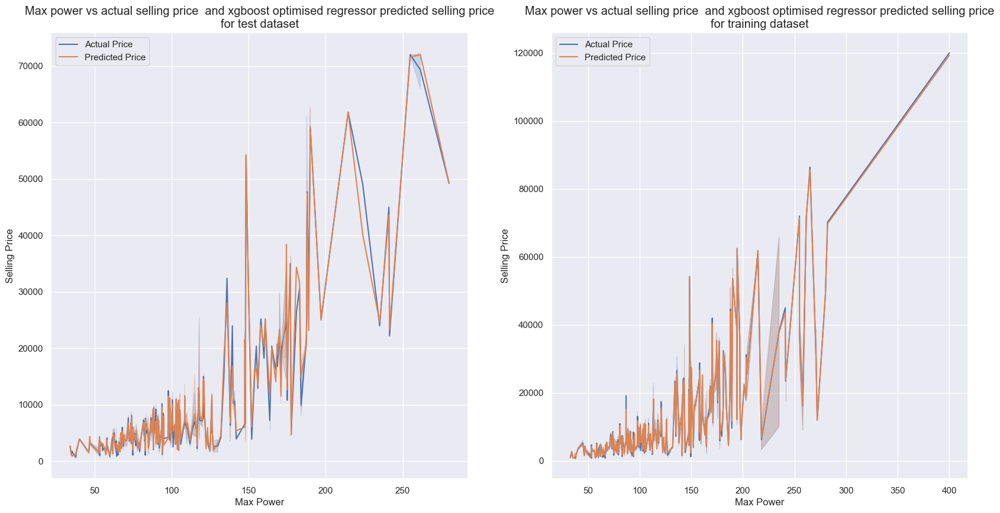

In [385]:
# Plotting performance of Extreme Gradient Boosting (XGB) Regressor regressor of selling price prediction 
xgb_opt_reg_plot = generate_opt_plot(xgb_opt_reg_pred, "xgboost optimised regressor")

### RANSAC Regressor Model with optimised features

In [386]:
# Define the RANSAc parameters
ransac_opt_reg = RANSACRegressor(RandomForestRegressor() ,
                             max_trials = 5,          # Number of iterations
                             min_samples = 5200 ,        # Minimum size of the sample
                             loss = "absolute_error",   # Metric for loss
                             residual_threshold = 850,   # Threshold
                            random_state = 5,         # How to randomly select data

    )

In [387]:
# Train Model
ransac_opt_reg = ransac_opt_reg.fit(x_train_top4, y_train_top4)

In [388]:
# Generate metrics report
ransac_opt_reg_pred = get_opt_reg_metrics(ransac_opt_reg,"RANSAC Optimised Regressor").execute_opt_metrics()

Training predictions are : 
[ 1251.06  2872.08  3269.83 ...  1227.12 14922.    9439.8 ]

Test predictions are : 
[ 6077.19        6392.37428571  1913.87       ...  2265.6
  8301.72       11583.36      ]


The training accuracy for RANSAC Optimised Regressor is 0.9468306890245487
The test accuracy for RANSAC Optimised Regressor is 0.9461977170738072


Mean Absolute Error for RANSAC Optimised Regressor : 982.4484019721858
Mean Squared Error for RANSAC Optimised Regressor : 5629162.101981952
Root Mean Squared Error for RANSAC Optimised Regressor : 2372.585531015047


Mean bias error for RANSAC Optimised Regressor : 61.40990796191905


Relative root mean square error for RANSAC Optimised Regressor : 0.18927795660060942


Train Data Accuracy Average After Cross_validation with RANSAC Optimised Regressor : 0.9540127762588853
Test Data Accuracy Average After Cross_validation with RANSAC Optimised Regressor : 0.9423589894867034


,fit_time,score_time,test_r2,train_r2,test_neg_mean_absolute_error,train_neg_mean_absolute_error,test_neg_mean_squared_error,train_neg_mean_squared_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
0,7.289836,0.062965,0.941539,0.955419,-991.291106,-607.682240,-5.661806e+06,-4.214295e+06,-2379.454876,-2052.874892
1,7.073937,0.063986,0.954838,0.962380,-992.105408,-586.224904,-4.284980e+06,-3.593347e+06,-2070.019275,-1895.612691
2,7.306845,0.063944,0.929887,0.948195,-1044.929569,-636.439136,-6.603512e+06,-4.966250e+06,-2569.729928,-2228.508557
3,7.328815,0.068943,0.931356,0.952548,-994.373312,-636.857873,-6.647953e+06,-4.485707e+06,-2578.362514,-2117.948664
4,7.252838,0.062962,0.950305,0.947629,-965.302974,-639.938419,-4.715090e+06,-5.002219e+06,-2171.425854,-2236.564195
5,7.073978,0.065964,0.941770,0.962937,-1008.180832,-581.530872,-5.484285e+06,-3.553061e+06,-2341.855073,-1884.956550
6,7.264871,0.061967,0.943416,0.953267,-979.202205,-619.027793,-5.479956e+06,-4.417715e+06,-2340.930623,-2101.836217
7,7.167910,0.068962,0.951343,0.952223,-983.012715,-605.981455,-4.616645e+06,-4.563437e+06,-2148.638034,-2136.220179
8,7.251837,0.064967,0.936778,0.951516,-1018.936396,-614.309376,-5.954486e+06,-4.647862e+06,-2440.181616,-2155.890069




Train prediction mean deviation:  25.604592680047222
Train prediction standard deviation:  2214.0594175690926


,max_power,selling_price,Predicted Selling Price,selling_diff,lower_limit_train_thres,+/-train_threshold
0,70.00,1200,1251.06,-51.06,-60.0,60.0
1,40.30,3120,2872.08,247.92,-156.0,156.0
2,120.00,3600,3269.83,330.17,-180.0,180.0
3,88.76,7500,7424.45,75.55,-375.0,375.0
4,84.00,5160,5330.88,-170.88,-258.0,258.0
5,85.80,1920,2036.10,-116.10,-96.0,96.0
6,204.00,36000,34814.40,1185.60,-1800.0,1800.0
7,74.00,7920,8148.36,-228.36,-396.0,396.0
8,74.00,7800,7727.22,72.78,-390.0,390.0
9,69.00,5400,5330.04,69.96,-270.0,270.0


Test prediction mean deviation:  61.409888720283234
Test prediction standard deviation:  2372.39073931943


,max_power,selling_price,Predicted Selling Price,selling_diff,+/-test_threshold
0,74.00,6012,6077.19,-65.19,300.60
1,74.00,5280,6392.37,-1112.37,264.00
2,70.00,1680,1913.87,-233.87,84.00
3,87.20,5723,4544.33,1178.67,286.15
4,81.80,7440,7677.46,-237.46,372.00
5,118.00,4560,3681.72,878.28,228.00
6,81.86,4320,6367.61,-2047.61,216.00
7,110.00,2220,2339.52,-119.52,111.00
8,37.00,1884,1543.98,340.02,94.20
9,87.20,7200,4721.11,2478.89,360.00


The percentage of train predictions within limit are:  0.45909934221622534
The percentage of train predictions outside limit are:  0.5409006577837747
The percentage of test predictions within limit are:  0.6970156803237229
The percentage of test predictions outside limit are:  0.30298431967627715


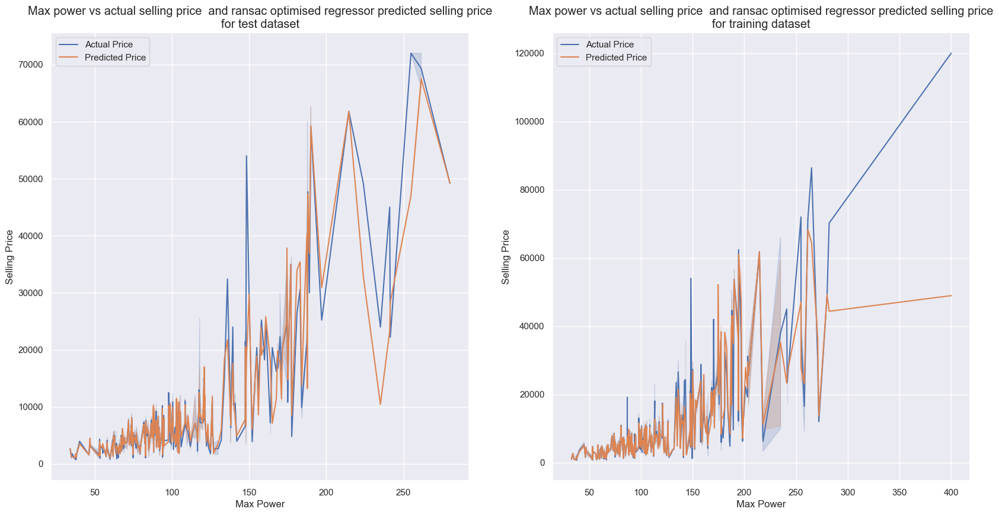

In [389]:
# Plotting performance of polynominal regressor of selling price prediction 
ransac_opt_reg_plot = generate_opt_plot(ransac_opt_reg_pred, "ransac optimised regressor")

### Support Vector Regressor Model with optimised features

In [390]:
# Creating features and target variables and splitting of training and test data.
# NB: The new training and test data was created for the ease of carrying out cross-validation on the model, as the model cannot
# Process cross-validation data directly. hence the data has to be randomised and the process ran multiple times to generate mean performance.
features_selling_price_top4 = refined_car_df[features_opt_reg_top4] # max_power, "year", "torque_splitnm", "km_driven".
target_selling_price_top4 = refined_car_df["selling_price"]


x_train_stdzz_top4, x_test_stdzz_top4, y_train_stdzz_top4 ,y_test_stdzz_top4 =  train_test_split(features_selling_price_top4,target_selling_price_top4, test_size = 0.20, random_state = 15, shuffle=True, stratify=None)

In [391]:
# Converting training features to an array
x_train_stdz_top4 = x_train_stdzz_top4.values
x_train_stdz_top4

array([[1.006e+02, 2.013e+03, 4.400e+05, 2.000e+02],
       [1.900e+02, 2.019e+03, 7.500e+03, 4.000e+02],
       [6.800e+01, 2.010e+03, 9.000e+04, 1.600e+02],
       ...,
       [1.120e+02, 2.012e+03, 5.000e+04, 2.600e+02],
       [7.400e+01, 2.016e+03, 5.000e+04, 1.900e+02],
       [1.050e+02, 2.014e+03, 2.400e+04, 2.470e+02]])

In [392]:
# Converting test features to an array
x_test_stdz_top4 = x_test_stdzz_top4.values
x_test_stdz_top4

array([[6.800e+01, 2.011e+03, 1.700e+05, 1.600e+02],
       [8.200e+01, 2.013e+03, 7.500e+04, 1.140e+02],
       [7.500e+01, 2.011e+03, 1.880e+05, 1.900e+02],
       ...,
       [6.901e+01, 2.016e+03, 6.000e+04, 1.350e+02],
       [8.680e+01, 2.017e+03, 5.000e+03, 1.120e+02],
       [5.364e+01, 2.017e+03, 3.110e+04, 7.200e+01]])

In [393]:
# Viewing shape of training features
x_train_stdz_top4.shape

(6324, 4)

In [394]:
# Viewing shape of test features
x_test_stdz_top4.shape

(1582, 4)

In [395]:
# Converting training target to an array 
y_train_stdz_top4 = y_train_stdzz_top4.values
y_train_stdz_top4 = y_train_stdz_top4.reshape(-1,1)

In [396]:
# Converting test target to an array 
y_test_stdz_top4 = y_test_stdzz_top4.values
y_test_stdz_top4 = y_test_stdz_top4.reshape(-1,1)

In [397]:
# Viewing shape of training features
y_train_stdz_top4.shape

(6324, 1)

In [398]:
# Viewing shape of test features
y_test_stdz_top4.shape

(1582, 1)

In [399]:
# Fitting and transforming the training and test data using the min max scaler as applicable
standard_scaler = StandardScaler()
x_train_min_max_top4 = standard_scaler.fit_transform(x_train_stdz_top4)
x_test_min_max_top4 = standard_scaler.transform(x_test_stdz_top4)
y_train_min_max_top4 = standard_scaler.fit_transform(y_train_stdz_top4)                                       
y_test_min_max_top4 = standard_scaler.transform(y_test_stdz_top4)

In [400]:
# Define Support Vector Regressor model parameters
from sklearn.svm import SVR

svr_opt_reg = SVR(
            kernel='rbf',
            degree=3,
            gamma='scale',
            coef0=0.0,
            tol=0.001,
            C=1.0,
            epsilon=0.1,
            shrinking=True,
            cache_size=200,
            verbose=True,
            max_iter=-1, 
             )

In [401]:
# Fitting the training data to the Support Vector Regressor model
svr_opt_reg = svr_opt_reg.fit(x_train_min_max_top4,y_train_min_max_top4)

[LibSVM]

In [402]:
# Generate metric report
svr_opt_reg_pred = get_opt_reg_metrics(svr_opt_reg,"Support Vector Optimised Regressor",1).execute_opt_metrics()

Training predictions are : 
[[ 8031.75728089]
 [60589.4066098 ]
 [ 2611.49531143]
 ...
 [ 5273.5948532 ]
 [ 6906.29294861]
 [ 7430.75402169]]

Test predictions are : 
[[2603.81136541]
 [3863.62811942]
 [3432.70331063]
 ...
 [4998.37236215]
 [7455.17995891]
 [3366.65939761]]


The training accuracy for Support Vector Optimised Regressor is 0.9316164590168229
The test accuracy for Support Vector Optimised Regressor is 0.8592666422074626


Mean Absolute Error for Support Vector Optimised Regressor : 1507.4323329949752
Mean Squared Error for Support Vector Optimised Regressor : 14135702.057909666
Root Mean Squared Error for Support Vector Optimised Regressor : 3759.7476056125984


Mean bias error for Support Vector Optimised Regressor : 94.81812530713985


Relative root mean square error for Support Vector Optimised Regressor : 0.30348876554058335




Train prediction mean deviation:  -25.91794117647059
Train prediction standard deviation:  2535.5222826677286


,max_power,selling_price,Predicted Selling Price,selling_diff,+/-train_threshold
0,100.60,9000,8031.76,968.24,450.0
1,190.00,64800,60589.41,4210.59,3240.0
2,68.00,2040,2611.50,-571.50,102.0
3,67.05,2700,3133.50,-433.50,135.0
4,115.00,14400,14393.96,6.04,720.0
5,74.02,8400,7932.20,467.80,420.0
6,126.32,4680,4445.14,234.86,234.0
7,88.50,7800,8474.55,-674.55,390.0
8,68.05,3444,3377.34,66.66,172.2
9,68.00,1920,2890.43,-970.43,96.0


Test prediction mean deviation:  94.81821744627055
Test prediction standard deviation:  3759.7401487627208


,max_power,selling_price,Predicted Selling Price,selling_diff,+/-test_threshold
0,68.00,2400,2603.81,-203.81,120.0
1,82.00,3600,3863.63,-263.63,180.0
2,75.00,3660,3432.70,227.30,183.0
3,190.00,64800,60589.41,4210.59,3240.0
4,108.62,6000,9624.87,-3624.87,300.0
5,47.30,3000,2728.95,271.05,150.0
6,86.80,4800,5581.72,-781.72,240.0
7,86.80,4020,5005.59,-985.59,201.0
8,76.00,6720,5804.71,915.29,336.0
9,55.20,3600,3640.85,-40.85,180.0


The percentage of train predictions within limit are:  0.6021505376344086
The percentage of train predictions outside limit are:  0.3978494623655914
The percentage of test predictions within limit are:  0.5689001264222503
The percentage of test predictions outside limit are:  0.4310998735777497


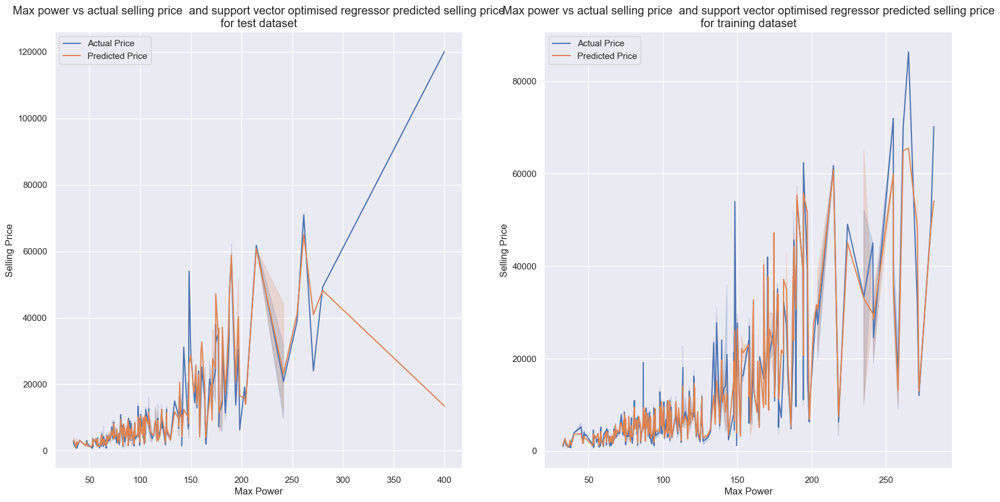

In [403]:
# Plotting performance of support vector regressor (SVR) of selling price prediction 
svr_opt_reg_plot = generate_opt_plot(svr_opt_reg_pred, "support vector optimised regressor",1)

### Polynomial Regressor Model with optimised features

In [404]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline

# define the pipeline and train model
poly_opt_reg = Pipeline([('poly', PolynomialFeatures(degree=2)),
                  ('linear', LinearRegression(fit_intercept=True))])
                  
poly_opt_reg.fit(x_train_top4, y_train_top4)

# print out regression coefficients
print(poly_opt_reg.named_steps['linear'].coef_)    
print(poly_opt_reg.named_steps['linear'].intercept_) 

[ 0.00000000e+00 -3.30985691e+04  3.22101066e+04  7.77322700e+00
 -4.84741703e+03  9.70022465e-01  1.64263205e+01 -4.45970728e-04
 -2.01204791e-01 -8.19789747e+00 -3.83984144e-03  2.41923220e+00
  2.52766768e-08 -8.33505110e-05  2.46587610e-02]
-31620593.86866089


In [405]:
# Generate metrics report
pr_opt_reg_pred = get_opt_reg_metrics(poly_opt_reg,"Polynomial Optimised Regressor").execute_opt_metrics()

Training predictions are : 
[ 1651.02975948   694.00631815 -8170.31410526 ... -3340.72468692
 10710.01717493  7406.88516752]

Test predictions are : 
[ 4709.42983217  4951.80696775  4254.14633775 ...  2125.9468887
  8858.33050373 12501.26357596]


The training accuracy for Polynomial Optimised Regressor is 0.8526638231908121
The test accuracy for Polynomial Optimised Regressor is 0.7033114039632764


Mean Absolute Error for Polynomial Optimised Regressor : 2237.099573487372
Mean Squared Error for Polynomial Optimised Regressor : 31041586.157064147
Root Mean Squared Error for Polynomial Optimised Regressor : 5571.497658355798


Mean bias error for Polynomial Optimised Regressor : 23.611839691106347


Relative root mean square error for Polynomial Optimised Regressor : 0.4442785416745894


Train Data Accuracy Average After Cross_validation with Polynomial Optimised Regressor : 0.8544303933945795
Test Data Accuracy Average After Cross_validation with Polynomial Optimised Regressor : 0.787

,fit_time,score_time,test_r2,train_r2,test_neg_mean_absolute_error,train_neg_mean_absolute_error,test_neg_mean_squared_error,train_neg_mean_squared_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
0,0.008000,0.004012,0.841015,0.851535,-2096.114388,-2149.665012,-1.539715e+07,-1.403471e+07,-3923.919921,-3746.293075
1,0.009869,0.004023,0.846488,0.853770,-2195.034678,-2105.007873,-1.456533e+07,-1.396731e+07,-3816.455082,-3737.286140
2,0.012993,0.007998,0.684340,0.857818,-2199.295157,-2132.755367,-2.972988e+07,-1.363016e+07,-5452.511093,-3691.904663
3,0.009778,0.004019,0.702487,0.854413,-2163.146023,-2105.239316,-2.881323e+07,-1.376265e+07,-5367.796034,-3709.804218
4,0.009991,0.004997,0.834232,0.854245,-2165.587372,-2125.593043,-1.572818e+07,-1.392185e+07,-3965.877527,-3731.200169
5,0.008502,0.004018,0.845585,0.854397,-2167.753465,-2150.622755,-1.454327e+07,-1.395816e+07,-3813.564056,-3736.062090
6,0.008738,0.003999,0.836369,0.853369,-2148.511696,-2118.214492,-1.584716e+07,-1.386133e+07,-3980.849413,-3723.080346
7,0.007975,0.005996,0.647086,0.856667,-2303.890894,-2125.581172,-3.348472e+07,-1.369059e+07,-5786.598088,-3700.079716
8,0.008992,0.003019,0.847390,0.853661,-2092.121926,-2140.325650,-1.437329e+07,-1.402872e+07,-3791.211797,-3745.493480




Train prediction mean deviation:  -1.6866250721823194e-06
Train prediction standard deviation:  3685.891103914156


,max_power,selling_price,Predicted Selling Price,selling_diff,lower_limit_train_thres,+/-train_threshold
0,70.00,1200,1651.03,-451.03,-60.0,60.0
1,40.30,3120,694.01,2425.99,-156.0,156.0
2,120.00,3600,-8170.31,11770.31,-180.0,180.0
3,88.76,7500,4834.51,2665.49,-375.0,375.0
4,84.00,5160,6805.94,-1645.94,-258.0,258.0
5,85.80,1920,1941.10,-21.10,-96.0,96.0
6,204.00,36000,36979.58,-979.58,-1800.0,1800.0
7,74.00,7920,8366.20,-446.20,-396.0,396.0
8,74.00,7800,7228.35,571.65,-390.0,390.0
9,69.00,5400,4675.11,724.89,-270.0,270.0


Test prediction mean deviation:  23.611896813353493
Test prediction standard deviation:  5572.857244085139


,max_power,selling_price,Predicted Selling Price,selling_diff,+/-test_threshold
0,74.00,6012,4709.43,1302.57,300.60
1,74.00,5280,4951.81,328.19,264.00
2,70.00,1680,4254.15,-2574.15,84.00
3,87.20,5723,3985.04,1737.96,286.15
4,81.80,7440,7514.18,-74.18,372.00
5,118.00,4560,3911.74,648.26,228.00
6,81.86,4320,7519.31,-3199.31,216.00
7,110.00,2220,469.73,1750.27,111.00
8,37.00,1884,1292.83,591.17,94.20
9,87.20,7200,4005.47,3194.53,360.00


The percentage of train predictions within limit are:  0.8718164951931185
The percentage of train predictions outside limit are:  0.12818350480688145
The percentage of test predictions within limit are:  0.8887202832574608
The percentage of test predictions outside limit are:  0.11127971674253923


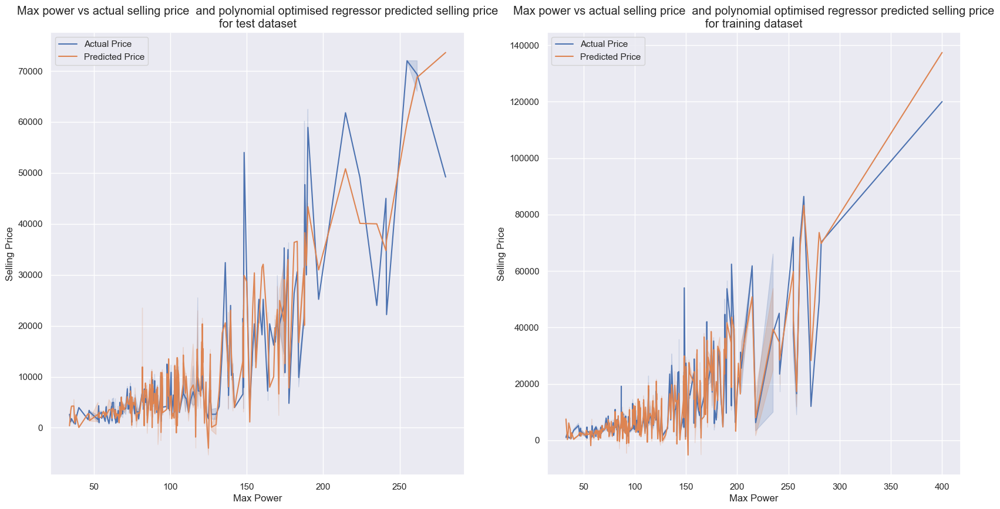

In [406]:
# Plotting performance of polynominal regressor of selling price prediction 
pr_opt_reg_plot = generate_opt_plot(pr_opt_reg_pred, "polynomial optimised regressor")

### Linear Regressor Model with optimised features

In [407]:
# Building and training a linear regressor
lr_opt_reg = LinearRegression(fit_intercept=True, normalize=True, positive=False, n_jobs=None)
lr_opt_reg = lr_opt_reg.fit(x_train_top4, y_train_top4)

In [408]:
# Generate metrics report
lr_opt_reg_pred = get_opt_reg_metrics(lr_opt_reg,"Multi Linear OptimisedRegressor").execute_opt_metrics()

Training predictions are : 
[-1288.09995792  -396.74558889  7604.635552   ...  2064.36600744
 21446.99585865  8634.17740919]

Test predictions are : 
[ 4994.57061043  4388.45507422  -150.55636998 ...  -100.84701423
  9671.23547586 12844.88440348]


The training accuracy for Multi Linear OptimisedRegressor is 0.634622166102647
The test accuracy for Multi Linear OptimisedRegressor is 0.631478169957197


Mean Absolute Error for Multi Linear OptimisedRegressor : 3453.7264327967814
Mean Squared Error for Multi Linear OptimisedRegressor : 38557269.4429302
Root Mean Squared Error for Multi Linear OptimisedRegressor : 6209.450011307781


Mean bias error for Multi Linear OptimisedRegressor : 149.76466141242756


Relative root mean square error for Multi Linear OptimisedRegressor : 0.571973867847273


Train Data Accuracy Average After Cross_validation with Multi Linear OptimisedRegressor : 0.6356154338472991
Test Data Accuracy Average After Cross_validation with Multi Linear OptimisedRegressor :

,fit_time,score_time,test_r2,train_r2,test_neg_mean_absolute_error,train_neg_mean_absolute_error,test_neg_mean_squared_error,train_neg_mean_squared_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
0,0.003001,0.003977,0.646450,0.628976,-3385.875226,-3427.044694,-3.424023e+07,-3.507366e+07,-5851.515398,-5922.301603
1,0.003999,0.002997,0.632582,0.636009,-3497.650704,-3427.760828,-3.486082e+07,-3.476684e+07,-5904.305303,-5896.341644
2,0.004997,0.004000,0.619076,0.641345,-3461.496997,-3478.234253,-3.587670e+07,-3.438218e+07,-5989.716347,-5863.632355
3,0.004001,0.001999,0.634607,0.633207,-3378.396332,-3475.734394,-3.538712e+07,-3.467364e+07,-5948.707748,-5888.432727
4,0.003001,0.003015,0.621995,0.641368,-3599.654572,-3395.066171,-3.586530e+07,-3.425500e+07,-5988.764307,-5852.776780
5,0.003000,0.002996,0.639030,0.632409,-3384.461038,-3460.082615,-3.399737e+07,-3.523883e+07,-5830.726231,-5936.230428
6,0.004022,0.002997,0.645251,0.629635,-3418.060297,-3415.070476,-3.435632e+07,-3.501128e+07,-5861.426856,-5917.033169
7,0.003979,0.003293,0.617155,0.641051,-3590.718764,-3438.811163,-3.632452e+07,-3.428524e+07,-6026.983045,-5855.359908
8,0.003000,0.003003,0.630584,0.636537,-3359.720833,-3482.558732,-3.479283e+07,-3.484310e+07,-5898.544548,-5902.804334




Train prediction mean deviation:  3.541912628143709e-05
Train prediction standard deviation:  5804.4209798418815


,max_power,selling_price,Predicted Selling Price,selling_diff,lower_limit_train_thres,+/-train_threshold
0,70.00,1200,-1288.10,2488.10,-60.0,60.0
1,40.30,3120,-396.75,3516.75,-156.0,156.0
2,120.00,3600,7604.64,-4004.64,-180.0,180.0
3,88.76,7500,6510.08,989.92,-375.0,375.0
4,84.00,5160,8152.63,-2992.63,-258.0,258.0
5,85.80,1920,1980.81,-60.81,-96.0,96.0
6,204.00,36000,31277.35,4722.65,-1800.0,1800.0
7,74.00,7920,8223.95,-303.95,-396.0,396.0
8,74.00,7800,7529.85,270.15,-390.0,390.0
9,69.00,5400,4577.90,822.10,-270.0,270.0


Test prediction mean deviation:  149.76463328275165
Test prediction standard deviation:  6209.21427572004


,max_power,selling_price,Predicted Selling Price,selling_diff,+/-test_threshold
0,74.00,6012,4994.57,1017.43,300.60
1,74.00,5280,4388.46,891.54,264.00
2,70.00,1680,-150.56,1830.56,84.00
3,87.20,5723,5820.60,-97.60,286.15
4,81.80,7440,8844.30,-1404.30,372.00
5,118.00,4560,9587.53,-5027.53,228.00
6,81.86,4320,8524.99,-4204.99,216.00
7,110.00,2220,5866.40,-3646.40,111.00
8,37.00,1884,-2350.44,4234.44,94.20
9,87.20,7200,5949.40,1250.60,360.00


The percentage of train predictions within limit are:  0.917861359419801
The percentage of train predictions outside limit are:  0.08213864058019904
The percentage of test predictions within limit are:  0.9251390996459282
The percentage of test predictions outside limit are:  0.07486090035407178


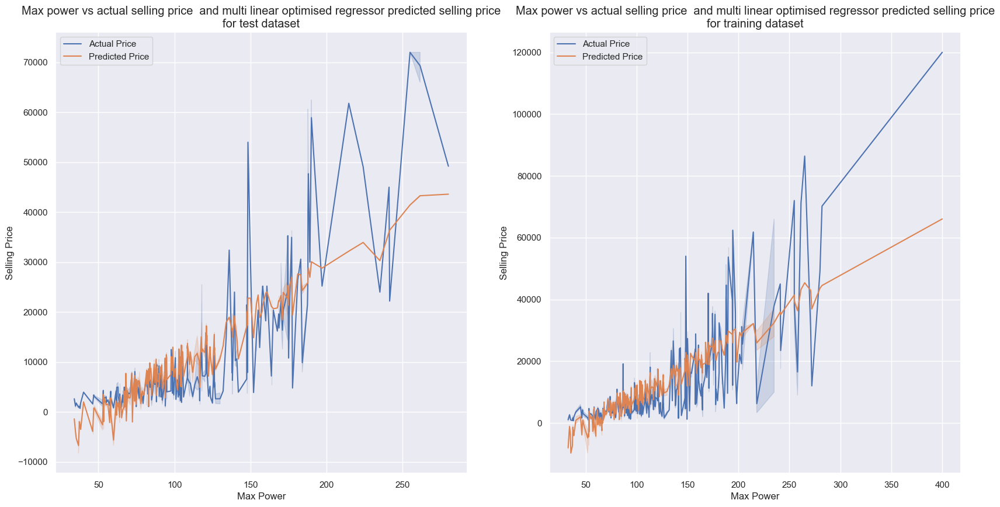

In [409]:
# Plotting performance of multi linear regressor of selling price prediction
lr_opt_reg_plot = generate_opt_plot(lr_opt_reg_pred, "multi linear optimised regressor")

In [410]:
# Viewing the decision influencers for multi linear regressor predictions 
print("Intercept: ", lr_opt_reg.intercept_)
print("Slope: ", lr_opt_reg.coef_)
print("Rank of Matrix: ", lr_opt_reg.rank_)
print("Number of Features: ", lr_opt_reg.n_features_in_)

Intercept:  -965754.6768822218
Slope:  [ 1.66966149e+02  4.75851807e+02 -2.57611272e-02  9.36825796e+00]
Rank of Matrix:  4
Number of Features:  4


## Building models for sold

In [411]:
# Viewing the shape of the target variable
refined_car_df['sold'].value_counts()

0    5906
1    2000
Name: sold, dtype: int64

In [412]:
# Having an unbalanced dataset we have to balance the target variable numbers
# resampling our datset to create a balance in the target distribution

zeros_sampled = (refined_car_df[lambda x:x.sold == 0])
ones_sampled = (refined_car_df[lambda x:x.sold == 1])

ones_upsampled = resample(ones_sampled, replace=True, n_samples = len(zeros_sampled), random_state=25)

print(len(ones_upsampled))
resampled_refined_car_df = pd.concat([zeros_sampled,ones_upsampled])
resampled_refined_car_df

5906


,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm
2000,11,2014,5400,56000,2,33,273,0,0,0,0,21.90,1396,88.76,5,0,219.60,2250
2001,3,2012,15600,140000,2,33,273,0,0,1,1,18.88,1995,184.00,5,0,380.00,2250
2002,20,2016,4212,60000,2,33,274,1,0,0,0,23.10,998,67.04,5,0,90.00,3500
2003,19,2012,6600,130000,2,33,274,0,0,0,0,15.10,2179,140.00,7,0,330.00,2200
2004,3,2013,15600,140000,2,33,274,0,0,1,1,18.88,1995,184.00,5,0,380.00,2250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1719,27,2012,3600,80000,2,29,207,0,0,0,0,17.00,1405,70.00,5,1,140.00,2500
1982,11,2019,7020,8000,3,24,271,1,0,0,0,18.90,1197,81.86,5,1,113.75,4000
1361,9,2011,2040,80000,1,4,115,0,0,0,2,17.80,1399,68.00,5,1,140.00,2000
150,21,2018,30600,18000,1,2,2,1,1,1,0,15.04,1991,183.00,5,1,300.00,2600


In [413]:
# Shuffle Dataframe
resampled_refined_car_df = resampled_refined_car_df.sample(frac = 1, random_state=96)
resampled_refined_car_df

,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm
6339,20,2016,3960,80000,1,26,1124,1,0,0,1,20.51,998,67.04,5,0,90.00,3500
1913,10,2004,2376,110000,0,1,251,1,0,0,2,12.80,1493,100.00,5,1,140.00,4600
3793,7,2016,3180,33003,0,19,307,1,0,0,0,15.70,1172,67.00,5,0,96.00,2500
145,13,2017,31500,9000,0,1,1,0,1,1,0,13.60,1999,177.00,5,1,430.00,2125
386,20,2017,9000,19000,2,3,3,0,0,1,0,28.40,1248,74.02,5,1,190.00,2000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4114,27,2015,6036,110000,1,48,747,0,0,0,0,14.10,2179,147.94,7,0,320.00,2250
1254,9,2015,7200,90000,2,13,85,0,0,0,0,22.77,1498,98.59,5,1,205.00,2500
7748,19,2017,8820,70000,2,45,1297,0,0,0,0,18.49,1493,100.00,7,0,240.00,2200
4412,11,2012,3600,60000,3,34,811,2,0,0,0,19.20,1086,68.05,5,0,99.04,4500


In [414]:
# Selection of the features and target required for building the sold model
features_sold = resampled_refined_car_df[["torque_splitrpm", "selling_price", "engine", "State or Province", "seats", ]]
target_sold = resampled_refined_car_df['sold']

In [415]:
# Splitting the selected features into training and test data
x_train_sd,x_test_sd,y_train_sd ,y_test_sd=  train_test_split(features_sold,target_sold, test_size = 0.20, random_state = 10, shuffle=False, stratify=None)

In [416]:
# Visualising the splitted the data
x_train_sd

,torque_splitrpm,selling_price,engine,State or Province,seats
6339,3500,3960,998,26,5
1913,4600,2376,1493,1,5
3793,2500,3180,1172,19,5
145,2125,31500,1999,1,5
386,2000,9000,1248,3,5
...,...,...,...,...,...
7360,2000,4560,1461,3,5
2407,2500,6000,2953,25,7
6066,2325,9600,1582,34,5
2820,4600,8400,1497,2,7


In [417]:
# Fitting and transforming the training and test data using the standard scaler scaler as applicable
standard_scaler = StandardScaler()
x_train_sd_stdz = standard_scaler.fit_transform(x_train_sd)
x_test_sd_stdz = standard_scaler.transform(x_test_sd)

In [418]:
# Viewing shape of training features
x_train_sd_stdz.shape

(9449, 5)

In [419]:
x_train_sd_stdz

array([[ 0.61814753, -0.39235133, -0.91772887,  0.97478931, -0.44193976],
       [ 1.73206098, -0.55079053,  0.05872873, -0.98608681, -0.44193976],
       [-0.39450105, -0.47037063, -0.57448923,  0.42574399, -0.44193976],
       ...,
       [-0.57171456,  0.17178826,  0.23429383,  1.60226966, -0.44193976],
       [ 1.73206098,  0.05175856,  0.0666193 , -0.90765176,  1.6284067 ],
       [ 1.37763397, -0.4043543 , -0.91575623, -0.28017141, -0.44193976]])

In [420]:
# Viewing shape of test features
x_test_sd_stdz.shape

(2363, 5)

In [421]:
x_test_sd_stdz

array([[ 0.11182324, -0.47637212, -0.52714583,  0.97478931, -0.44193976],
       [-0.77424427,  3.05250104,  1.05688539, -0.20173636, -0.44193976],
       [-0.77424427,  5.81318412,  1.04899482,  0.19043886, -0.44193976],
       ...,
       [-0.69829563,  0.09376895,  0.05872873,  2.46505515,  1.6284067 ],
       [ 1.63079612, -0.42836024, -0.74413641,  1.60226966, -0.44193976],
       [-0.14133891, -0.42956054, -0.53306376, -0.98608681, -0.44193976]])

In [422]:
# Converting training target to an array 
y_train_sd = y_train_sd.values

# Converting test target to an array 
y_test_sd = y_test_sd.values

In [423]:
# Viewing shape of training target
y_train_sd.shape

(9449,)

In [424]:
# Viewing shape of test target
y_test_sd.shape

(2363,)

### Generating Metrics Report for Classifier models

In [425]:
class get_clf_metrics:
    
    def __init__(self,model,reg_name, checker=0, features=features_sold,target=target_sold):
        if checker == 0:
            self.model = model
            self.train = y_train_sd
            self.test = y_test_sd
            self.reg_name = reg_name
            self.features = features
            self.target = target
            self.checker = checker

            # Predicting training data
            self.train_pred = (self.model).predict(x_train_sd_stdz)

            # predicting test data
            self.test_pred = (self.model).predict(x_test_sd_stdz)
        
        elif checker == 1:
            self.model = model
            self.train = y_train_sd_top5
            self.test = y_test_sd_top5
            self.reg_name = reg_name
            self.features = features_sold_top5
            self.target = target_sold_top5
            self.checker = checker

            # Predicting training data
            self.train_pred = (self.model).predict(x_train_sd_stdz_top5)

            # predicting test data
            self.test_pred = (self.model).predict(x_test_sd_stdz_top5)
        
    
    # Make predictions on the training and test datasets
    def get_pred(self):
        print("Training predictions are : \n{}\n\nTest predictions are : \n{}".format(self.train_pred, self.test_pred))
        self.result =  [self.train_pred, self.test_pred]
        return self.result
        
    # Evaluating model train and test accuracy score
    def get_accuracy_score(self):
        print("The Training accuracy score is :",round(accuracy_score(self.train, self.train_pred),4))
        print("The Validation accuracy score is :", round(accuracy_score(self.test, self.test_pred),4))
        print("The number of accurately predicted points out of a total of %d : %d" % (self.test.shape[0], accuracy_score(self.test, self.test_pred, normalize=False)))
        print("The number of mislabeled points out of a total %d points : %d" % (self.test.shape[0], (self.test != self.test_pred).sum()))
        
    # Evaluating the Algorithm
    def get_classification_report(self): 
        # Using classification report
        print(classification_report(self.test,self.test_pred))
        
        # Using confussion matrix
        print(confusion_matrix(self.test,self.test_pred))

    # Perform cross-validation on the model with the data
    def get_cross_val_result(self):
        cv = RepeatedStratifiedKFold(n_splits=3, n_repeats=3, random_state=2)
        scores = cross_validate(self.model, self.features, self.target, cv=cv,
                               scoring=("accuracy"),
                               return_train_score=True)

        scores = pd.DataFrame(scores)
        print("Train Data Accuracy Average After Cross_validation with {} : {}".format(self.reg_name, scores["train_score"].mean()))
        print("Test Data Accuracy Average After Cross_validation with {} : {}".format(self.reg_name, scores["test_score"].mean()))
        display(scores)

    # Compare predicted and actual prices in created dataframe
    # Concatenating the predicted prices to actual dataset rows for comparism
    def get_new_dfs(self):
        if self.checker  == 0:   
            car_train_df= refined_car_df.loc[x_train_sd.index]
            car_test_df = refined_car_df.loc[x_test_sd.index]
        
        elif self.checker == 1:
            car_train_df= refined_car_df.loc[x_train_sd_top5.index]
            car_test_df = refined_car_df.loc[x_test_sd_top5.index]

        car_train_df = car_train_df.reset_index()
        car_test_df = car_test_df.reset_index()     

        train_pred_df = pd.DataFrame(data=self.train_pred, index=x_train_sd.index, columns=["Predicted Sold"])
        train_pred_df = train_pred_df.reset_index()
        test_pred_df = pd.DataFrame(data=self.test_pred, index=x_test_sd.index, columns=["Predicted Sold"])
        test_pred_df = test_pred_df.reset_index()
        car_train_df = pd.merge(car_train_df,train_pred_df, how="inner", on="index")
        car_test_df = pd.merge(car_test_df,test_pred_df, how="inner", on="index")

        car_train_df.drop(labels="index", axis=1, inplace=True)
        car_test_df.drop(labels="index", axis=1, inplace=True)

        print("Training data performance review:")
        self.train_sold_df = car_train_df[["sold","Predicted Sold"]]
        display((car_train_df[["sold","Predicted Sold"]]).head(15))
        print("\n")

        print("Test data performance review:")
        self.test_sold_df = car_test_df[["sold","Predicted Sold"]]
        display((car_test_df[["sold","Predicted Sold"]]).head(15))
        
     # Execute all functions in the class         
    def execute_metrics(self):
        self.get_pred()
        print("\n")
        self.get_accuracy_score()
        print("\n")
        self.get_classification_report()
        print("\n")
        self.get_cross_val_result()
        print("\n")
        self.get_new_dfs()
        return [self.train_pred, self.test_pred, self.train_sold_df, self.test_sold_df]

In [426]:
#Function to call ROC Curve
def get_roc_curve(model, model_name, checker=0):
    
    if checker == 0:
        y_model_score = (model).predict_proba(x_test_sd_stdz)
        fpr_model, tpr_model, thresholds_model = roc_curve(y_test_sd, y_model_score[:, 1])
        auc = round(roc_auc_score(y_test_sd, y_model_score[:, 1]),2)
    
    elif checker == 1:
        y_model_score = (model).predict_proba(x_test_sd_stdz_top5)
        fpr_model, tpr_model, thresholds_model = roc_curve(y_test_sd_top5, y_model_score[:, 1])
        auc = round(roc_auc_score(y_test_sd_top5, y_model_score[:, 1]),2)


    # ROC plot curve for the model
    model_curve = plt.figure(figsize=(10,8))
    plt.plot([0, 1], [0, 1], 'k--')
    plt.plot(fpr_model, tpr_model,label="NB_AUC="+str(auc))
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.title('{} ROC curve%'.format(model_name))
    plt.legend(loc=4)
    plt.show()
    
    return model_curve

### Gaussian Naive Bayes Model 

In [427]:
# Define model parameters and fit model
gnb = GaussianNB()
gnb_clf = gnb.fit(x_train_sd_stdz, y_train_sd)

In [428]:
# Generate classification report
gnb_clf_pred = get_clf_metrics(gnb_clf,"GaussianNB Model").execute_metrics()

Training predictions are : 
[0 1 0 ... 0 1 1]

Test predictions are : 
[0 1 1 ... 0 0 1]


The Training accuracy score is : 0.6342
The Validation accuracy score is : 0.6255
The number of accurately predicted points out of a total of 2363 : 1478
The number of mislabeled points out of a total 2363 points : 885


              precision    recall  f1-score   support

           0       0.70      0.43      0.53      1167
           1       0.59      0.82      0.69      1196

    accuracy                           0.63      2363
   macro avg       0.65      0.62      0.61      2363
weighted avg       0.65      0.63      0.61      2363

[[499 668]
 [217 979]]


Train Data Accuracy Average After Cross_validation with GaussianNB Model : 0.6340021117432006
Test Data Accuracy Average After Cross_validation with GaussianNB Model : 0.6328590929852702


,fit_time,score_time,test_score,train_score
0,0.004976,0.002021,0.629253,0.637541
1,0.005996,0.002998,0.639065,0.629587
2,0.005996,0.002000,0.626619,0.636825
3,0.004998,0.003997,0.632809,0.632080
4,0.004996,0.002999,0.634493,0.635175
5,0.003999,0.002998,0.633985,0.633905
6,0.006016,0.002000,0.641696,0.630048
7,0.004996,0.002976,0.630175,0.634921
8,0.003998,0.002999,0.627635,0.635937




Training data performance review:


,sold,Predicted Sold
0,0,0
1,1,1
2,1,1
3,1,1
4,1,1
5,0,0
6,1,1
7,1,1
8,1,1
9,1,1




Test data performance review:


,sold,Predicted Sold
0,1,0
1,0,1
2,1,1
3,1,1
4,1,1
5,1,1
6,1,1
7,0,1
8,0,0
9,1,1


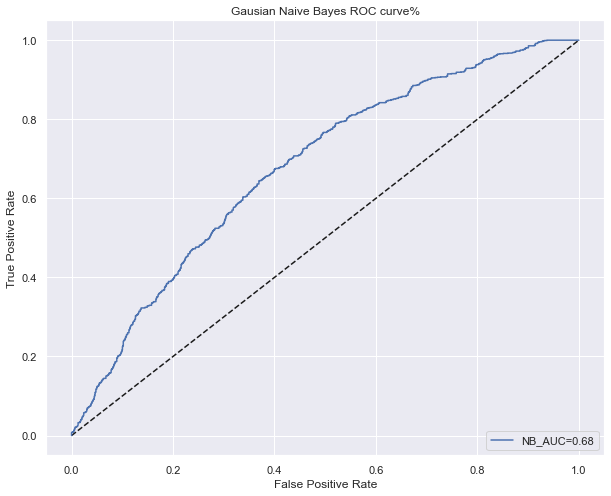

In [429]:
# Plot ROC Curve
gnb_clf_plot = get_roc_curve(gnb_clf, "Gausian Naive Bayes")

### Decision Tree Classifier Model

In [430]:
# Define model parameters and fit model
dt_clf = DecisionTreeClassifier(criterion='gini',
    splitter='best',
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    min_weight_fraction_leaf=0.0,
    max_features=None,)
dt_clf = dt_clf.fit(x_train_sd_stdz, y_train_sd)

In [431]:
# Generate classification report
dt_clf_pred = get_clf_metrics(dt_clf,"Decision Tree Classifier Model").execute_metrics()

Training predictions are : 
[0 1 0 ... 0 0 0]

Test predictions are : 
[1 0 0 ... 0 0 1]


The Training accuracy score is : 0.977
The Validation accuracy score is : 0.843
The number of accurately predicted points out of a total of 2363 : 1992
The number of mislabeled points out of a total 2363 points : 371


              precision    recall  f1-score   support

           0       0.91      0.76      0.83      1167
           1       0.80      0.93      0.86      1196

    accuracy                           0.84      2363
   macro avg       0.85      0.84      0.84      2363
weighted avg       0.85      0.84      0.84      2363

[[ 884  283]
 [  88 1108]]


Train Data Accuracy Average After Cross_validation with Decision Tree Classifier Model : 0.9789620437230293
Test Data Accuracy Average After Cross_validation with Decision Tree Classifier Model : 0.8105036885543553


,fit_time,score_time,test_score,train_score
0,0.023986,0.003020,0.803454,0.978791
1,0.021987,0.003977,0.804928,0.979175
2,0.023984,0.003000,0.818136,0.979556
3,0.027004,0.003999,0.803707,0.978664
4,0.023965,0.003000,0.814072,0.978286
5,0.024987,0.002999,0.810262,0.979683
6,0.023985,0.004000,0.815642,0.977394
7,0.023985,0.002999,0.812548,0.980063
8,0.022985,0.003000,0.811786,0.979048




Training data performance review:


,sold,Predicted Sold
0,0,0
1,1,1
2,1,1
3,1,1
4,1,1
5,0,0
6,1,1
7,1,1
8,1,1
9,1,1




Test data performance review:


,sold,Predicted Sold
0,1,1
1,0,0
2,1,0
3,1,0
4,1,0
5,1,0
6,1,1
7,0,1
8,0,0
9,1,1


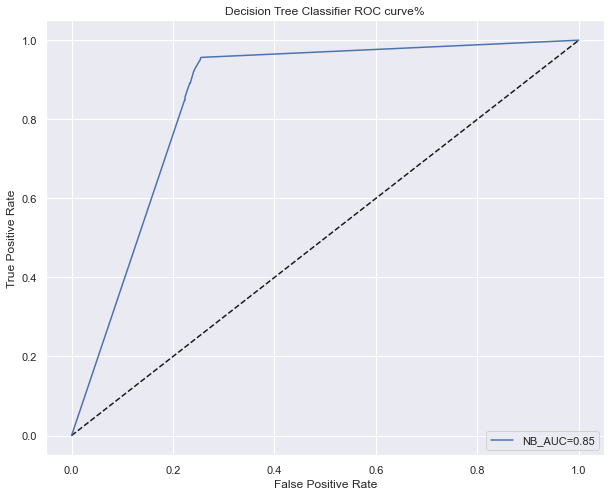

In [432]:
# Plot ROC Curve
dt_clf_plot = get_roc_curve(dt_clf, "Decision Tree Classifier")

### Random Forest Classifier Model

In [433]:
# Define model parameters and fit model
rf_clf = RandomForestClassifier(n_estimators=500, 
                              criterion='gini', 
                              max_depth=30, 
                              min_samples_split=2,
                              min_samples_leaf=1, 
                              min_weight_fraction_leaf=0.0,
                              max_features='auto', 
                              max_leaf_nodes=None,
                              min_impurity_decrease=0.0, 
                              bootstrap=True, 
                              oob_score=True, 
                              n_jobs=None, 
                              random_state=None, 
                              verbose=0,
                              warm_start=False,
                              class_weight=None, 
                              ccp_alpha=0.0,
                              max_samples=None)

rf_clf.fit(x_train_sd_stdz, y_train_sd)

RandomForestClassifier(max_depth=30, n_estimators=500, oob_score=True)

In [434]:
# Generate classification report
rf_clf_pred = get_clf_metrics(rf_clf,"Random Forest Classifier Model").execute_metrics()

Training predictions are : 
[0 1 0 ... 0 0 0]

Test predictions are : 
[1 0 1 ... 0 0 1]


The Training accuracy score is : 0.977
The Validation accuracy score is : 0.8642
The number of accurately predicted points out of a total of 2363 : 2042
The number of mislabeled points out of a total 2363 points : 321


              precision    recall  f1-score   support

           0       0.93      0.79      0.85      1167
           1       0.82      0.94      0.87      1196

    accuracy                           0.86      2363
   macro avg       0.87      0.86      0.86      2363
weighted avg       0.87      0.86      0.86      2363

[[ 919  248]
 [  73 1123]]


Train Data Accuracy Average After Cross_validation with Random Forest Classifier Model : 0.9789620437230293
Test Data Accuracy Average After Cross_validation with Random Forest Classifier Model : 0.8332485446642357


,fit_time,score_time,test_score,train_score
0,5.583832,0.597658,0.833672,0.978791
1,5.666763,0.554683,0.833122,0.979175
2,5.570799,0.562680,0.826772,0.979556
3,5.545833,0.563678,0.828085,0.978664
4,5.460884,0.541708,0.837186,0.978286
5,5.684756,0.559658,0.836424,0.979683
6,5.598781,0.560680,0.842560,0.977394
7,5.562823,0.554664,0.832106,0.980063
8,5.496869,0.553681,0.829312,0.979048




Training data performance review:


,sold,Predicted Sold
0,0,0
1,1,1
2,1,1
3,1,1
4,1,1
5,0,0
6,1,1
7,1,1
8,1,1
9,1,1




Test data performance review:


,sold,Predicted Sold
0,1,1
1,0,0
2,1,1
3,1,1
4,1,1
5,1,1
6,1,1
7,0,1
8,0,0
9,1,1


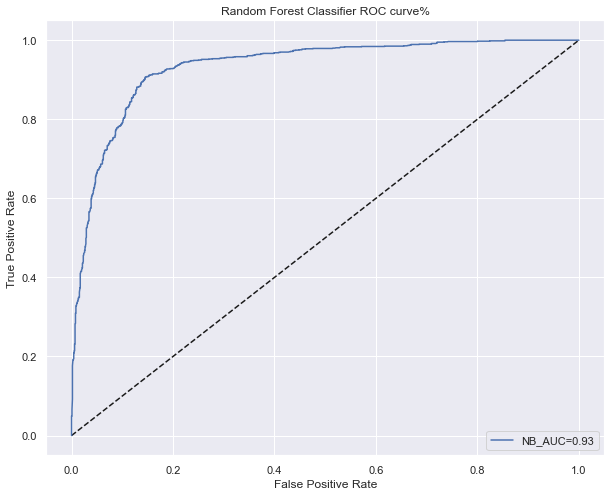

In [435]:
# Plot ROC Curve
rf_clf_plot = get_roc_curve(rf_clf, "Random Forest Classifier")

### Logistic Regression Model

In [436]:
# Define model parameters and fit model
lr_clf = LogisticRegression(
                           penalty='l2',
                            dual=False,
                            tol=0.0001,
                            C=1.0,
                            fit_intercept=True,
                            intercept_scaling=20,
                            class_weight=None,
                            random_state=1, #24
                            solver='lbfgs',
                            max_iter=500,
                            multi_class='auto',
                            verbose=0,
                            warm_start=False,
                            n_jobs=None,
                            l1_ratio=None)

lr_clf = lr_clf.fit(x_train_sd_stdz, y_train_sd)

In [437]:
# Generate classification report
lr_clf_pred = get_clf_metrics(lr_clf,"Logistic Regression Model").execute_metrics()

Training predictions are : 
[0 1 0 ... 0 1 1]

Test predictions are : 
[0 1 0 ... 0 0 1]


The Training accuracy score is : 0.6471
The Validation accuracy score is : 0.6314
The number of accurately predicted points out of a total of 2363 : 1492
The number of mislabeled points out of a total 2363 points : 871


              precision    recall  f1-score   support

           0       0.68      0.47      0.56      1167
           1       0.60      0.78      0.68      1196

    accuracy                           0.63      2363
   macro avg       0.64      0.63      0.62      2363
weighted avg       0.64      0.63      0.62      2363

[[554 613]
 [258 938]]


Train Data Accuracy Average After Cross_validation with Logistic Regression Model : 0.639067589669571
Test Data Accuracy Average After Cross_validation with Logistic Regression Model : 0.6392930271894063


,fit_time,score_time,test_score,train_score
0,0.053952,0.007994,0.637633,0.638938
1,0.044974,0.003001,0.646177,0.636317
2,0.038978,0.003002,0.633731,0.642286
3,0.044992,0.001981,0.644490,0.637160
4,0.049987,0.001983,0.634747,0.638222
5,0.046973,0.002999,0.636525,0.638603
6,0.084043,0.002026,0.648045,0.639319
7,0.044976,0.001994,0.641097,0.637968
8,0.040957,0.001998,0.631191,0.642794




Training data performance review:


,sold,Predicted Sold
0,0,0
1,1,1
2,1,1
3,1,1
4,1,1
5,0,0
6,1,1
7,1,1
8,1,1
9,1,1




Test data performance review:


,sold,Predicted Sold
0,1,0
1,0,1
2,1,0
3,1,0
4,1,0
5,1,0
6,1,1
7,0,1
8,0,0
9,1,1


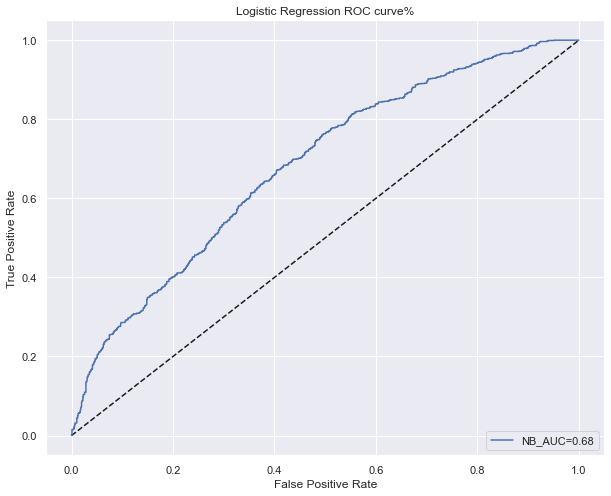

In [438]:
# Plot ROC Curve
lr_clf_plot = get_roc_curve(lr_clf, "Logistic Regression")

### Support Vector Machines Classifier

In [439]:
# Define model parameters and fit model
svm_clf = SVC(
                C=0.8, 
                kernel='rbf', 
                degree = 2, 
                gamma='auto', 
                coef0=1, 
                shrinking=False, 
                probability=True, 
                tol= 0.001, 
                cache_size=200, 
                class_weight=None, 
                verbose=False, 
                max_iter=-1, 
                decision_function_shape='ovr', 
                break_ties=True, 
                random_state=82)

svm_clf.fit(x_train_sd_stdz, y_train_sd)

SVC(C=0.8, break_ties=True, coef0=1, degree=2, gamma='auto', probability=True,
    random_state=82, shrinking=False)

In [440]:
accuracy_score(y_train_sd, svm_clf.predict(x_train_sd_stdz))

0.6513916816594348

In [441]:
# Generate classification report
svm_clf_pred = get_clf_metrics(svm_clf,"Support Vector Machines Classifier Model").execute_metrics()

Training predictions are : 
[0 1 0 ... 0 1 1]

Test predictions are : 
[0 1 1 ... 0 0 1]


The Training accuracy score is : 0.6514
The Validation accuracy score is : 0.6314
The number of accurately predicted points out of a total of 2363 : 1492
The number of mislabeled points out of a total 2363 points : 871


              precision    recall  f1-score   support

           0       0.68      0.47      0.56      1167
           1       0.60      0.79      0.68      1196

    accuracy                           0.63      2363
   macro avg       0.64      0.63      0.62      2363
weighted avg       0.64      0.63      0.62      2363

[[549 618]
 [253 943]]


Train Data Accuracy Average After Cross_validation with Support Vector Machines Classifier Model : 0.9546788353964715
Test Data Accuracy Average After Cross_validation with Support Vector Machines Classifier Model : 0.8621454848575292


,fit_time,score_time,test_score,train_score
0,32.985185,4.745288,0.868461,0.955042
1,31.182701,4.767279,0.858014,0.953905
2,31.732876,4.771272,0.865634,0.955683
3,31.243159,4.717306,0.861097,0.954280
4,31.345098,4.709330,0.865126,0.953143
5,33.587817,4.837234,0.859030,0.955429
6,31.314117,4.760281,0.869477,0.953137
7,32.222599,4.892207,0.854204,0.955302
8,31.612269,4.825243,0.858268,0.956190




Training data performance review:


,sold,Predicted Sold
0,0,0
1,1,1
2,1,1
3,1,1
4,1,1
5,0,0
6,1,1
7,1,1
8,1,1
9,1,1




Test data performance review:


,sold,Predicted Sold
0,1,0
1,0,1
2,1,1
3,1,1
4,1,1
5,1,1
6,1,1
7,0,1
8,0,0
9,1,1


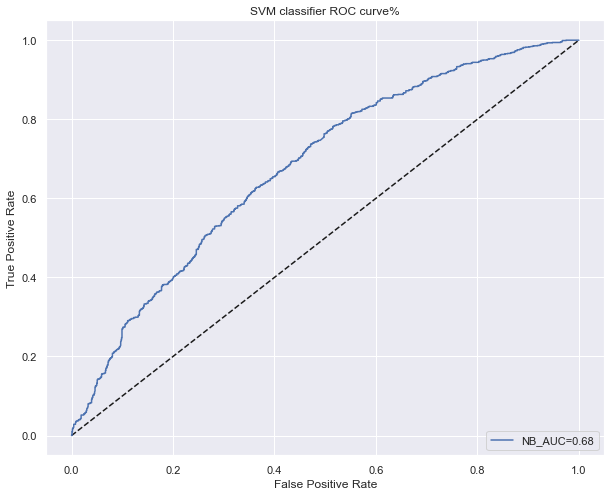

In [442]:
# Plot ROC Curve
svm_clf_plot = get_roc_curve(svm_clf, "SVM classifier")

### XGBoost Classifier Model

In [443]:
# Define model parameters and fit model
xgb_clf = XGBClassifier(
            objective='binary:logistic',
            base_score=0.5, 
            booster='gbtree', 
            colsample_bylevel=1,
            colsample_bynode=0.8, 
            colsample_bytree=1, 
            eval_metric='mlogloss',
            gamma=0, 
            gpu_id=-1, 
            importance_type='gain',
            interaction_constraints='', 
            learning_rate=0.100000012,
            max_delta_step=30, 
            max_depth=20, 
            min_child_weight=1, 
            missing=np.nan,
            monotone_constraints='()', 
            n_estimators=1000, 
            n_jobs=16,
            num_parallel_tree=1, 
            #objective='multi:softprob', 
            random_state=24,
            reg_alpha=0, 
            reg_lambda=1, 
            scale_pos_weight=None, 
            subsample=1,
            tree_method='exact', 
            use_label_encoder=False,
            validate_parameters=1, 
            verbosity=None)

xgb_clf = xgb_clf.fit(x_train_sd_stdz, y_train_sd)

In [444]:
# Generate classification report
xgb_clf_pred = get_clf_metrics(xgb_clf,"XGBoost Classifier Model").execute_metrics()

Training predictions are : 
[0 1 0 ... 0 0 0]

Test predictions are : 
[1 0 0 ... 0 0 1]


The Training accuracy score is : 0.977
The Validation accuracy score is : 0.8561
The number of accurately predicted points out of a total of 2363 : 2023
The number of mislabeled points out of a total 2363 points : 340


              precision    recall  f1-score   support

           0       0.92      0.78      0.84      1167
           1       0.81      0.93      0.87      1196

    accuracy                           0.86      2363
   macro avg       0.86      0.86      0.86      2363
weighted avg       0.86      0.86      0.86      2363

[[ 909  258]
 [  82 1114]]


Train Data Accuracy Average After Cross_validation with XGBoost Classifier Model : 0.9789056063332586
Test Data Accuracy Average After Cross_validation with XGBoost Classifier Model : 0.8317809145070352


,fit_time,score_time,test_score,train_score
0,13.493296,0.191889,0.837989,0.978791
1,13.266497,0.179897,0.827788,0.978921
2,13.465314,0.177894,0.831598,0.979556
3,13.846096,0.189889,0.835196,0.978664
4,13.831101,0.170903,0.831598,0.978286
5,13.678342,0.189890,0.833122,0.979556
6,13.371366,0.190889,0.833672,0.977394
7,13.384429,0.189892,0.833122,0.980063
8,13.760205,0.174895,0.821946,0.978921




Training data performance review:


,sold,Predicted Sold
0,0,0
1,1,1
2,1,1
3,1,1
4,1,1
5,0,0
6,1,1
7,1,1
8,1,1
9,1,1




Test data performance review:


,sold,Predicted Sold
0,1,1
1,0,0
2,1,0
3,1,0
4,1,0
5,1,0
6,1,1
7,0,0
8,0,0
9,1,1


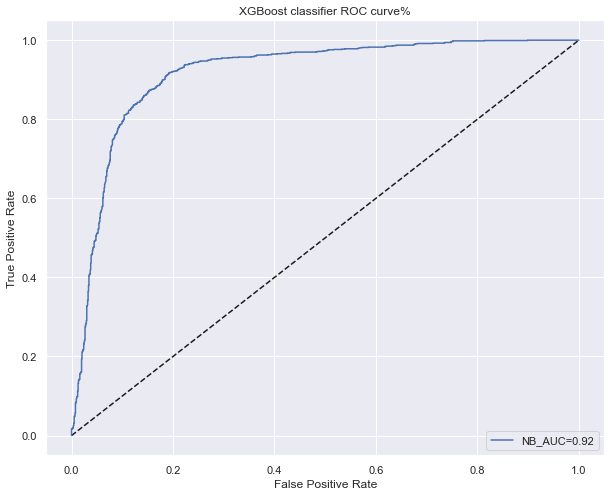

In [445]:
# Plot ROC Curve
xgb_clf_plot = get_roc_curve(xgb_clf, "XGBoost classifier")

### Stacking Classifier Model

In [446]:
# Defining a function for stacking.
def get_stacking():
    level0 = list()
    level0.append(('gnb_clf',GaussianNB()))
    level0.append(('dt_clf', DecisionTreeClassifier (criterion='gini',
                                            splitter='best',
                                            max_depth=None,
                                            min_samples_split=2,
                                            min_samples_leaf=1,
                                            min_weight_fraction_leaf=0.0,
                                            max_features=None)))
    level0.append(('rf_clf', RandomForestClassifier(n_estimators=500, 
                              criterion='gini', 
                              max_depth=30, 
                              min_samples_split=2,
                              min_samples_leaf=1, 
                              min_weight_fraction_leaf=0.0,
                              max_features='auto', 
                              max_leaf_nodes=None,
                              min_impurity_decrease=0.0, 
                              bootstrap=True, 
                              oob_score=True, 
                              n_jobs=None, 
                              random_state=None, 
                              verbose=0,
                              warm_start=False,
                              class_weight=None, 
                              ccp_alpha=0.0,
                              max_samples=None)))
    level0.append(('lr_clf', LogisticRegression(
                           penalty='l2',
                            dual=False,
                            tol=0.0001,
                            C=1.0,
                            fit_intercept=True,
                            intercept_scaling=20,
                            class_weight=None,
                            random_state=24,
                            solver='lbfgs',
                            max_iter=500,
                            multi_class='auto',
                            verbose=0,
                            warm_start=False,
                            n_jobs=None,
                            l1_ratio=None)))
    level0.append(('svm_clf', SVC(
                            C=1.0, 
                            kernel='rbf', 
                            degree=3, 
                            gamma='auto', 
                            coef0=0.0, 
                            shrinking=True, 
                            probability=True, 
                            tol=0.0001, 
                            cache_size=200, 
                            class_weight=None, 
                            verbose=False, 
                            max_iter=-1, 
                            decision_function_shape='ovr', 
                            break_ties=False, 
                            random_state=15)))
    level1 = XGBClassifier(
            objective='binary:logistic',
            base_score=0.5, 
            booster='gbtree', 
            colsample_bylevel=1,
            colsample_bynode=0.8, 
            colsample_bytree=1, 
            eval_metric='mlogloss',
            gamma=0, 
            gpu_id=-1, 
            importance_type='gain',
            interaction_constraints='', 
            learning_rate=0.100000012,
            max_delta_step=30, 
            max_depth=20, 
            min_child_weight=1, 
            missing=np.nan,
            monotone_constraints='()', 
            n_estimators=1000, 
            n_jobs=16,
            num_parallel_tree=1, 
            #objective='multi:softprob', 
            random_state=24,
            reg_alpha=0, 
            reg_lambda=1, 
            scale_pos_weight=None, 
            subsample=1,
            tree_method='exact', 
            use_label_encoder=False,
            validate_parameters=1, 
            verbosity=None)
    
    model = StackingClassifier(estimators=level0, final_estimator=level1, cv=5, passthrough=False)
    return model

# Getting the models required after adding stacking
def get_models():
    models =  get_stacking()
    return models

# Function to evaluate the models
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=3, n_repeats=3, random_state=1)
    scores = cross_validate(model, X, y, scoring=('accuracy', "f1", "neg_log_loss" ,'precision'), cv=cv, n_jobs=-1, 
    error_score='raise')
    train_result = model.fit(X,y)
    scores = pd.DataFrame(scores)
    return scores, train_result

def get_dataset():
    return x_train_sd_stdz, y_train_sd

#Grab hold of the dataset.
X, y = get_dataset()

#Grab the models to use.
stacked_clf_models = get_models()

#Run and Evaluate the models.
scores_clf_df, stacked_clf_model = evaluate_model(stacked_clf_models, X, y)
display(scores_clf_df)

,fit_time,score_time,test_accuracy,test_f1,test_neg_log_loss,test_precision
0,196.756418,10.789838,0.819683,0.815465,-0.654395,0.832228
1,195.427180,10.229155,0.814603,0.813657,-0.681790,0.815217
2,198.676321,11.017712,0.813274,0.811659,-0.680600,0.816366
3,196.215727,10.518993,0.812063,0.809401,-0.656731,0.818359
4,196.810284,10.526991,0.805714,0.803972,-0.664685,0.808634
5,195.751887,10.423047,0.802795,0.800000,-0.703255,0.809121
6,195.511027,10.554970,0.805079,0.803079,-0.685569,0.808786
7,197.287009,10.444035,0.811111,0.808003,-0.623134,0.818836
8,96.412504,4.891207,0.806605,0.804870,-0.678344,0.809800


In [447]:
# Generate classification report
stacked_clf_pred = get_clf_metrics(stacked_clf_models,"Stacked Classifier Model").execute_metrics()

Training predictions are : 
[0 1 0 ... 0 1 0]

Test predictions are : 
[1 0 0 ... 0 0 1]


The Training accuracy score is : 0.955
The Validation accuracy score is : 0.8777
The number of accurately predicted points out of a total of 2363 : 2074
The number of mislabeled points out of a total 2363 points : 289


              precision    recall  f1-score   support

           0       0.88      0.88      0.88      1167
           1       0.88      0.88      0.88      1196

    accuracy                           0.88      2363
   macro avg       0.88      0.88      0.88      2363
weighted avg       0.88      0.88      0.88      2363

[[1022  145]
 [ 144 1052]]


Train Data Accuracy Average After Cross_validation with Stacked Classifier Model : 0.9314968962213057
Test Data Accuracy Average After Cross_validation with Stacked Classifier Model : 0.8562188493374223


,fit_time,score_time,test_score,train_score
0,199.630785,5.557207,0.851955,0.936119
1,199.692811,5.782697,0.868936,0.949333
2,197.805317,5.649753,0.881890,0.948444
3,201.984318,5.538815,0.879126,0.959614
4,200.036189,5.968648,0.856236,0.940952
5,198.454610,5.622768,0.815850,0.902730
6,206.813907,5.855656,0.866430,0.946787
7,200.079694,5.685529,0.873762,0.888762
8,199.222104,5.684751,0.811786,0.910730




Training data performance review:


,sold,Predicted Sold
0,0,0
1,1,1
2,1,1
3,1,1
4,1,1
5,0,0
6,1,1
7,1,1
8,1,1
9,1,1




Test data performance review:


,sold,Predicted Sold
0,1,1
1,0,0
2,1,0
3,1,0
4,1,0
5,1,0
6,1,1
7,0,1
8,0,0
9,1,1


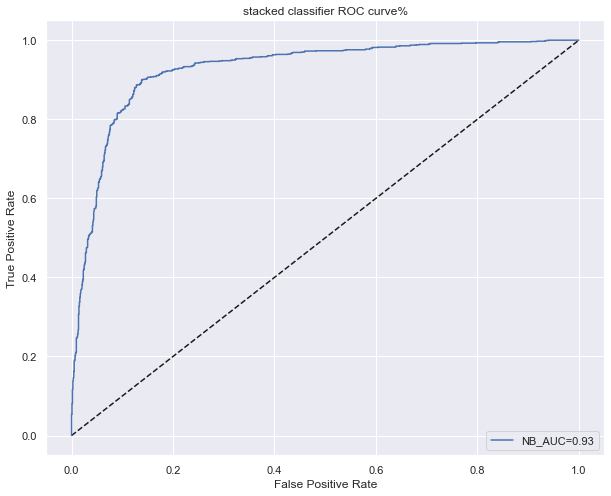

In [448]:
# Plot ROC Curve
stacked_clf_plot = get_roc_curve(stacked_clf_models, "stacked classifier")

### Training an Artificial Neural Network (ANN) to predict sold or not sold

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 200)               1200      
                                                                 
 dropout (Dropout)           (None, 200)               0         
                                                                 
 dense_1 (Dense)             (None, 30)                6030      
                                                                 
 dense_2 (Dense)             (None, 60)                1860      
                                                                 
 dropout_1 (Dropout)         (None, 60)                0         
                                                                 
 dense_3 (Dense)             (None, 60)                3660      
                                                                 
 dense_4 (Dense)             (None, 10)                6

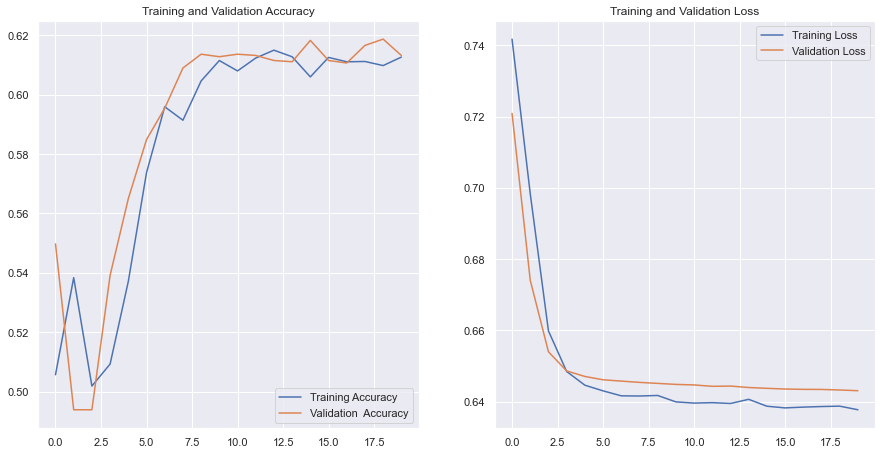

In [449]:
# Trying out PCA feature engineering data on my feedforward neural network

model = Sequential([
    layers.Dense (200, activation="relu", input_dim=x_train_sd_stdz.shape[1]),
    layers.Dropout(0.3),
    layers.Dense(30, activation="relu",),
    layers.Dense(60, activation="relu",),
    layers.Dropout(0.2),
    layers.Dense(60, activation="relu"),
    layers.Dense(10, activation="sigmoid"),
    layers.Dense(1),
])
my_opt = tf.keras.optimizers.Adam(learning_rate = 0.0001)
model.compile(optimizer = my_opt,
            loss = tf.keras.losses.BinaryCrossentropy(from_logits=True),
            metrics = ["accuracy", "mse"],
             )

model.summary()
epochs = 20
history = model.fit(x_train_sd_stdz,y_train_sd, batch_size = 100, epochs = epochs, validation_data = (x_test_sd_stdz,y_test_sd), shuffle=True)

#model.test_on_batch(x_test,y_test)
#model.metrics_names
#model.evaluate()
acc = history.history ["accuracy"]
val_acc = history.history["val_accuracy"]

loss1 = history.history["loss"]
val_loss1 = history.history["val_loss"]

epochs_range = range(epochs)

loss,accuracy,_ = model.evaluate(x_test_sd_stdz,y_test_sd)
print("Test Accuracy :",accuracy)
print("TestLoss: ",loss)


# Plotting the figures

plt.figure(figsize=(15,7.5))
plt.subplot(1,2,1)
plt.plot(epochs_range,acc,label="Training Accuracy")
plt.plot(epochs_range,val_acc,label="Validation  Accuracy")
plt.legend(loc="lower right")
plt.title("Training and Validation Accuracy")

plt.subplot(1,2,2)
plt.plot(epochs_range,loss1,label="Training Loss")
plt.plot(epochs_range,val_loss1,label="Validation Loss")
plt.legend(loc="upper right")
plt.title("Training and Validation Loss")
plt.show()

### Hyperparameters Optimisation

#### Random Forest Classifier Hyperparameters optimisation for classification task

In [450]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

rf = RandomForestClassifier(random_state=40, bootstrap=True, oob_score=True, verbose=0)

param_grid = {
    "n_estimators": [100,600,800],
    "max_depth":[2,20,30],
    "max_leaf_nodes":[200,500,1800],
    "min_samples_split":[2,4,5,],
    "min_samples_leaf":[1,2,4],
    "criterion":["gini","entropy"]
}

# Using 3-fold cross-validation
grid_search_clf = GridSearchCV(rf, param_grid, cv = 3, scoring=["accuracy", "f1", "neg_log_loss"], refit="f1", return_train_score=True, n_jobs=None)


grid_search_clf.fit(resampled_refined_car_df.drop(labels="sold", axis = 1)[0:2000],resampled_refined_car_df.sold[0:2000])

GridSearchCV(cv=3,
             estimator=RandomForestClassifier(oob_score=True, random_state=40),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 20, 30],
                         'max_leaf_nodes': [200, 500, 1800],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 4, 5],
                         'n_estimators': [100, 600, 800]},
             refit='f1', return_train_score=True,
             scoring=['accuracy', 'f1', 'neg_log_loss'])

In [451]:
# Using the grid search estimator to get best parameters for our random forest model.
grid_search_clf.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=20, max_leaf_nodes=200,
                       min_samples_leaf=2, n_estimators=600, oob_score=True,
                       random_state=40)

In [452]:
grid_search_clf.best_params_

{'criterion': 'entropy',
 'max_depth': 20,
 'max_leaf_nodes': 200,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 600}

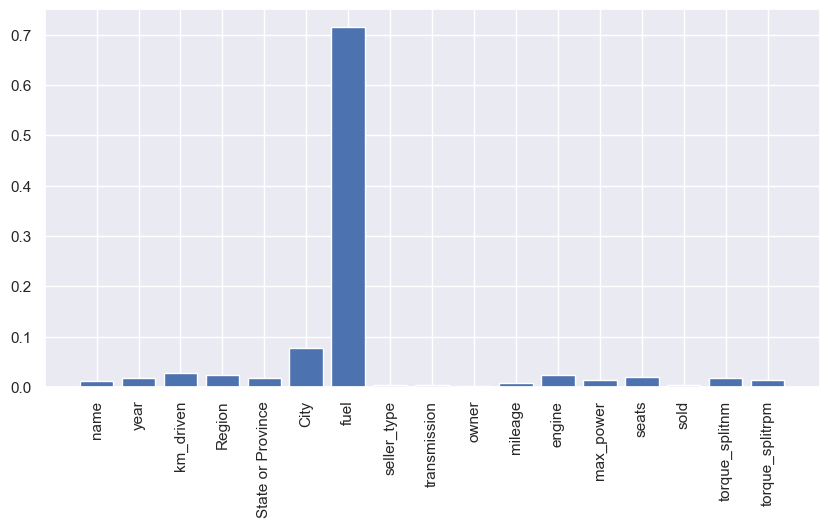

In [453]:
# Plot showing best parameters for random forest predictions
rf_best_params_plot_clf = plt.figure(figsize=(10,5), dpi =100)
plt.bar(range(len(features.columns)), grid_search_clf.best_estimator_.feature_importances_)
plt.xticks(range(len(features.columns)), features.columns, rotation='vertical')
plt.show()

In [454]:
# Visualising the cv results for each combination in the model 
grid_search_clf.cv_results_

{'mean_fit_time': array([0.25952013, 1.40418442, 2.21160173, 0.27284201, 1.40252654,
        1.84195415, 0.22755043, 1.35190304, 1.86227584, 0.23620033,
        1.36687938, 1.80063526, 0.23188194, 1.36655347, 1.79331311,
        0.232541  , 1.35988275, 1.81362621, 0.22287901, 1.37486831,
        1.81996139, 0.22621346, 1.34621803, 1.82895613, 0.22286177,
        1.36289541, 1.8043104 , 0.23553284, 1.39920068, 1.86892533,
        0.29216981, 1.40986141, 1.9039139 , 0.23753031, 1.3945442 ,
        1.87293283, 0.23819176, 1.38588468, 1.87792873, 0.23521487,
        1.47915665, 1.86592905, 0.23419309, 1.40020808, 1.84760563,
        0.2371978 , 1.39621075, 1.9575545 , 0.39743956, 3.12854775,
        1.92790707, 0.31182202, 1.70269616, 2.29036125, 0.27984111,
        1.75432507, 2.45858653, 0.30982359, 1.77998384, 2.22539616,
        0.23952333, 1.55444527, 2.36264579, 0.24853412, 1.47715982,
        2.75109212, 0.33880854, 1.87059927, 1.89058812, 0.23752554,
        1.461169  , 2.14844219,

In [455]:
rf_clf_params_df = pd.DataFrame.from_dict(grid_search_clf.cv_results_)
display(rf_clf_params_df)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_leaf,param_min_samples_split,param_n_estimators,...,split1_test_neg_log_loss,split2_test_neg_log_loss,mean_test_neg_log_loss,std_test_neg_log_loss,rank_test_neg_log_loss,split0_train_neg_log_loss,split1_train_neg_log_loss,split2_train_neg_log_loss,mean_train_neg_log_loss,std_train_neg_log_loss
0,0.259520,0.034565,0.035638,0.000946,gini,2,200,1,2,100,...,-0.412422,-0.392653,-0.399632,0.009057,370,-0.392004,-0.403043,-0.384036,-0.393028,0.007793
1,1.404184,0.048113,0.181237,0.002875,gini,2,200,1,2,600,...,-0.412061,-0.406333,-0.406878,0.004027,415,-0.400069,-0.404329,-0.396193,-0.400197,0.003323
2,2.211602,0.257468,0.310482,0.056365,gini,2,200,1,2,800,...,-0.412639,-0.409595,-0.409373,0.002762,451,-0.403616,-0.405193,-0.399375,-0.402728,0.002457
3,0.272842,0.029012,0.040984,0.007061,gini,2,200,1,4,100,...,-0.412422,-0.392653,-0.399632,0.009057,370,-0.392004,-0.403043,-0.384036,-0.393028,0.007793
4,1.402527,0.036439,0.197901,0.007868,gini,2,200,1,4,600,...,-0.412061,-0.406333,-0.406878,0.004027,415,-0.400069,-0.404329,-0.396193,-0.400197,0.003323
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
481,2.034179,0.008734,0.232513,0.001885,entropy,30,1800,4,4,600,...,-0.205370,-0.207329,-0.199138,0.010230,253,-0.115650,-0.112667,-0.112957,-0.113758,0.001343
482,2.731783,0.031099,0.313487,0.003756,entropy,30,1800,4,4,800,...,-0.204773,-0.206792,-0.198860,0.009824,235,-0.116227,-0.112598,-0.112754,-0.113860,0.001675
483,0.339807,0.005350,0.046309,0.002623,entropy,30,1800,4,5,100,...,-0.208035,-0.203243,-0.197599,0.011537,217,-0.115043,-0.114102,-0.107888,-0.112344,0.003174
484,2.059160,0.028993,0.238196,0.003680,entropy,30,1800,4,5,600,...,-0.205370,-0.207329,-0.199138,0.010230,253,-0.115650,-0.112667,-0.112957,-0.113758,0.001343


In [456]:
rf_clf_params_df.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_criterion', 'param_max_depth', 'param_max_leaf_nodes',
       'param_min_samples_leaf', 'param_min_samples_split',
       'param_n_estimators', 'params', 'split0_test_accuracy',
       'split1_test_accuracy', 'split2_test_accuracy', 'mean_test_accuracy',
       'std_test_accuracy', 'rank_test_accuracy', 'split0_train_accuracy',
       'split1_train_accuracy', 'split2_train_accuracy', 'mean_train_accuracy',
       'std_train_accuracy', 'split0_test_f1', 'split1_test_f1',
       'split2_test_f1', 'mean_test_f1', 'std_test_f1', 'rank_test_f1',
       'split0_train_f1', 'split1_train_f1', 'split2_train_f1',
       'mean_train_f1', 'std_train_f1', 'split0_test_neg_log_loss',
       'split1_test_neg_log_loss', 'split2_test_neg_log_loss',
       'mean_test_neg_log_loss', 'std_test_neg_log_loss',
       'rank_test_neg_log_loss', 'split0_train_neg_log_loss',
       'split1_train_neg_log_loss', 'split2_tra

In [457]:
# Selecting some performance metrics for insight
rf_clf_params_df[['mean_train_accuracy', 'mean_test_accuracy', 'mean_train_f1', 'mean_test_f1', 'rank_test_accuracy']]

,mean_train_accuracy,mean_test_accuracy,mean_train_f1,mean_test_f1,rank_test_accuracy
0,0.93625,0.935499,0.938981,0.938249,58
1,0.93625,0.935499,0.938981,0.938249,58
2,0.93625,0.935499,0.938981,0.938249,58
3,0.93625,0.935499,0.938981,0.938249,58
4,0.93625,0.935499,0.938981,0.938249,58
...,...,...,...,...,...
481,0.96275,0.935499,0.963421,0.938013,58
482,0.96250,0.935499,0.963185,0.938013,58
483,0.96250,0.933501,0.963185,0.936021,331
484,0.96275,0.935499,0.963421,0.938013,58


In [458]:
# view the best performing model stats
rf_clf_params_df[['mean_train_accuracy', 'mean_test_accuracy', 'mean_train_f1', 'mean_test_f1', 'rank_test_accuracy']].sort_values('rank_test_accuracy')

,mean_train_accuracy,mean_test_accuracy,mean_train_f1,mean_test_f1,rank_test_accuracy
418,0.990499,0.936499,0.990412,0.938859,1
391,0.990499,0.936499,0.990412,0.938859,1
388,0.990499,0.936499,0.990412,0.938859,1
442,0.990499,0.936499,0.990412,0.938859,1
445,0.990499,0.936499,0.990412,0.938859,1
...,...,...,...,...,...
474,0.987000,0.931499,0.986922,0.933847,478
366,0.986250,0.931499,0.986178,0.933847,478
327,0.996750,0.931001,0.996698,0.933256,484
381,0.996750,0.931001,0.996698,0.933256,484


In [459]:
# Visualising the best score for the model 
grid_search_clf.best_score_

0.9388592486197807

In [460]:
# Checking to validate the importance of available features.
features_clf_list = []

feature_importance = grid_search_clf.best_estimator_.feature_importances_

# Note: feature importance output order is as in the order of training so if this is zipped together.

for i,j in sorted(zip(feature_importance,features.columns), reverse=True):
    print(f"{i*100}: {j}")
    features_clf_list.append(j)

71.4700363072066: fuel
7.797646514938992: City
2.6723011979711213: km_driven
2.441696952459786: engine
2.3685928992635703: Region
1.9856988886852056: seats
1.8366477519907733: year
1.7439231157725756: torque_splitnm
1.6921312647828788: State or Province
1.449048863618103: max_power
1.3948884430467985: torque_splitrpm
1.2318923352832665: name
0.7333329922747106: mileage
0.3856831506623154: transmission
0.3500769846740044: sold
0.31186314572658724: seller_type
0.1345391916427289: owner


In [461]:
# Select the top 6 features for predicting
features_clf_list_top_5 = features_clf_list[0:5]
features_clf_list_top_5

['fuel', 'City', 'km_driven', 'engine', 'Region']

In [462]:
# Selection of the features and target required for building the sold model after hyperparameter optimisation
features_sold_top5 = resampled_refined_car_df[features_clf_list_top_5]
target_sold_top5 = resampled_refined_car_df['sold']

In [463]:
# Splitting features into training and test data after hyperparameter optimisation
x_train_sd_top5,x_test_sd_top5,y_train_sd_top5 ,y_test_sd_top5=  train_test_split(features_sold_top5,target_sold_top5, test_size = 0.20, random_state = 71, shuffle=True, stratify=None)

In [464]:
# Visualising the splitted data
x_train_sd_top5

,fuel,City,km_driven,engine,Region
6519,0,1151,8500,1995,1
4028,1,730,90000,1591,3
535,0,7,5000,1248,2
1293,0,87,100000,793,2
2387,0,373,70000,1248,2
...,...,...,...,...,...
3468,0,608,152186,1461,0
3918,0,707,120000,1396,3
4178,1,763,25000,1499,2
4997,0,562,60000,2523,0


In [465]:
# Fitting and transforming the training and test data using the standard scaler scaler as applicable
standard_scaler = StandardScaler()
x_train_sd_stdz_top5 = standard_scaler.fit_transform(x_train_sd_top5)
x_test_sd_stdz_top5 = standard_scaler.transform(x_test_sd_top5)

In [466]:
# Viewing shape of training features
x_train_sd_stdz_top5.shape

(9449, 5)

In [467]:
# Viewing shape of training features
x_test_sd_stdz_top5.shape

(2363, 5)

In [468]:
# Converting training target to an array 
y_train_sd_top5 = y_train_sd_top5.values

# Converting test target to an array 
y_test_sd_top5 = y_test_sd_top5.values

In [469]:
# Viewing shape of training target
y_train_sd_top5.shape

(9449,)

In [470]:
# Viewing shape of test target
y_test_sd_top5.shape

(2363,)

In [471]:
# Getting the parameters for the model
grid_search_clf.best_params_

{'criterion': 'entropy',
 'max_depth': 20,
 'max_leaf_nodes': 200,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 600}

In [472]:
# Define model parameters and fit model
rf_opt_clf = RandomForestClassifier(n_estimators=600, 
                              criterion='entropy', 
                              max_depth=20, 
                              min_samples_split=2,
                              min_samples_leaf=2, 
                              min_weight_fraction_leaf=0.0,
                              max_features='auto', 
                              max_leaf_nodes=200,
                              min_impurity_decrease=0.0, 
                              bootstrap=True, 
                              oob_score=True, 
                              n_jobs=None, 
                              random_state=None, 
                              verbose=0,
                              warm_start=False,
                              class_weight=None, 
                              ccp_alpha=0.0,
                              max_samples=None)

rf_opt_clf.fit(x_train_sd_stdz_top5, y_train_sd_top5)

RandomForestClassifier(criterion='entropy', max_depth=20, max_leaf_nodes=200,
                       min_samples_leaf=2, n_estimators=600, oob_score=True)

In [473]:
# Generate classification report
rf_opt_clf_pred = get_clf_metrics(rf_opt_clf,"Random Forest Optimised Classifier Model", 1).execute_metrics()

Training predictions are : 
[0 0 1 ... 0 0 1]

Test predictions are : 
[1 0 1 ... 0 0 1]


The Training accuracy score is : 0.9587
The Validation accuracy score is : 0.942
The number of accurately predicted points out of a total of 2363 : 2226
The number of mislabeled points out of a total 2363 points : 137


              precision    recall  f1-score   support

           0       1.00      0.89      0.94      1178
           1       0.90      1.00      0.95      1185

    accuracy                           0.94      2363
   macro avg       0.95      0.94      0.94      2363
weighted avg       0.95      0.94      0.94      2363

[[1043  135]
 [   2 1183]]


Train Data Accuracy Average After Cross_validation with Random Forest Optimised Classifier Model : 0.9634693853232503
Test Data Accuracy Average After Cross_validation with Random Forest Optimised Classifier Model : 0.9418951872156891


,fit_time,score_time,test_score,train_score
0,4.350516,0.372788,0.938294,0.963678
1,4.364504,0.368791,0.941580,0.963556
2,4.353533,0.357775,0.943866,0.960762
3,4.320533,0.374787,0.944134,0.962916
4,4.269583,0.373765,0.939548,0.964190
5,4.333507,0.361793,0.942342,0.963556
6,4.322529,0.369810,0.945404,0.966091
7,4.386514,0.368770,0.942088,0.961143
8,4.248574,0.368810,0.939802,0.965333




Training data performance review:


,sold,Predicted Sold
0,0,1
1,0,1
2,1,1
3,1,1
4,1,0
5,1,1
6,1,1
7,1,0
8,1,1
9,1,1




Test data performance review:


,sold,Predicted Sold
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1
5,1,1
6,1,0
7,0,1
8,0,1
9,1,1


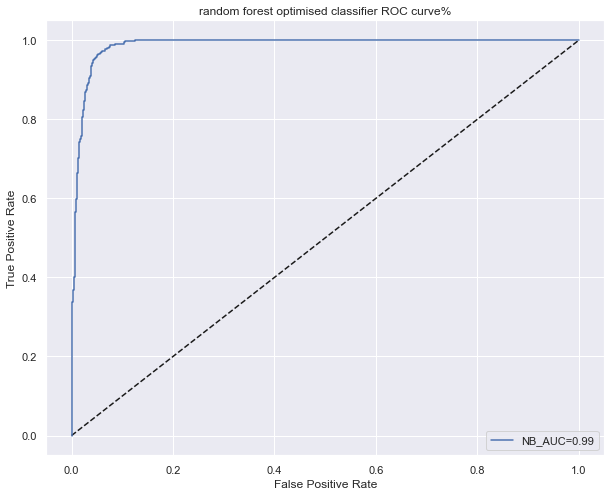

In [474]:
# Plot ROC Curve
rf_opt_clf_plot = get_roc_curve(rf_opt_clf, "random forest optimised classifier", 1)

### Trying out newly selected features on the best performing model earlier to see performance

### Using new features on XGB Classifier

In [475]:
# Define model parameters and fit model
xgb_opt_clf = XGBClassifier(
            objective='binary:logistic',
            base_score=0.5, 
            booster='gbtree', 
            colsample_bylevel=1,
            colsample_bynode=0.8, 
            colsample_bytree=1, 
            eval_metric='mlogloss',
            gamma=0, 
            gpu_id=-1, 
            importance_type='gain',
            interaction_constraints='', 
            learning_rate=0.100000012,
            max_delta_step=30, 
            max_depth=20, 
            min_child_weight=1, 
            missing=np.nan,
            monotone_constraints='()', 
            n_estimators=1000, 
            n_jobs=16,
            num_parallel_tree=1, 
            #objective='multi:softprob', 
            random_state=24,
            reg_alpha=0, 
            reg_lambda=1, 
            scale_pos_weight=None, 
            subsample=1,
            tree_method='exact', 
            use_label_encoder=False,
            validate_parameters=1, 
            verbosity=None)

xgb_opt_clf = xgb_opt_clf.fit(x_train_sd_stdz_top5, y_train_sd_top5)

In [476]:
# Generate classification report
xgb_opt_clf_pred = get_clf_metrics(xgb_opt_clf,"XGBoost Optimised Classifier Model", 1).execute_metrics()

Training predictions are : 
[0 0 1 ... 0 0 1]

Test predictions are : 
[1 0 1 ... 0 0 1]


The Training accuracy score is : 0.9995
The Validation accuracy score is : 0.9615
The number of accurately predicted points out of a total of 2363 : 2272
The number of mislabeled points out of a total 2363 points : 91


              precision    recall  f1-score   support

           0       0.99      0.93      0.96      1178
           1       0.94      0.99      0.96      1185

    accuracy                           0.96      2363
   macro avg       0.96      0.96      0.96      2363
weighted avg       0.96      0.96      0.96      2363

[[1098   80]
 [  11 1174]]


Train Data Accuracy Average After Cross_validation with XGBoost Optimised Classifier Model : 0.9994920384055936
Test Data Accuracy Average After Cross_validation with XGBoost Optimised Classifier Model : 0.9576417495479311


,fit_time,score_time,test_score,train_score
0,8.412276,0.090926,0.958101,0.999238
1,8.151366,0.088928,0.956566,0.999619
2,8.359248,0.088928,0.958852,0.999365
3,8.393229,0.090927,0.962417,0.999492
4,8.241316,0.099922,0.956566,0.999492
5,8.220306,0.088950,0.960122,0.999492
6,8.227302,0.098944,0.959370,0.999492
7,8.133358,0.089946,0.956566,0.999873
8,8.228323,0.093925,0.950216,0.999365




Training data performance review:


,sold,Predicted Sold
0,0,1
1,0,1
2,1,0
3,1,1
4,1,0
5,1,0
6,1,1
7,1,0
8,1,0
9,1,1




Test data performance review:


,sold,Predicted Sold
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1
5,1,1
6,1,0
7,0,1
8,0,1
9,1,1


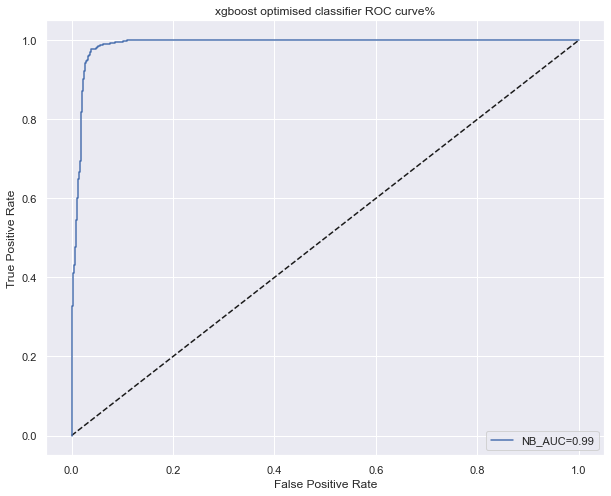

In [477]:
# Plot ROC Curve
xgb_opt_clf_plot = get_roc_curve(xgb_opt_clf, "xgboost optimised classifier", 1)

### Using new features on a Stacking Classifier

In [478]:
# Defining a function for stacking.
def get_stacking():
    level0 = list()
    level0.append(('gnb_clf',GaussianNB()))
    level0.append(('dt_clf', DecisionTreeClassifier (criterion='gini',
                                            splitter='best',
                                            max_depth=None,
                                            min_samples_split=2,
                                            min_samples_leaf=1,
                                            min_weight_fraction_leaf=0.0,
                                            max_features=None)))
    level0.append(('rf_clf', RandomForestClassifier(n_estimators=500, 
                              criterion='gini', 
                              max_depth=30, 
                              min_samples_split=2,
                              min_samples_leaf=1, 
                              min_weight_fraction_leaf=0.0,
                              max_features='auto', 
                              max_leaf_nodes=None,
                              min_impurity_decrease=0.0, 
                              bootstrap=True, 
                              oob_score=True, 
                              n_jobs=None, 
                              random_state=None, 
                              verbose=0,
                              warm_start=False,
                              class_weight=None, 
                              ccp_alpha=0.0,
                              max_samples=None)))
    level0.append(('lr_clf', LogisticRegression(
                           penalty='l2',
                            dual=False,
                            tol=0.0001,
                            C=1.0,
                            fit_intercept=True,
                            intercept_scaling=20,
                            class_weight=None,
                            random_state=24,
                            solver='lbfgs',
                            max_iter=500,
                            multi_class='auto',
                            verbose=0,
                            warm_start=False,
                            n_jobs=None,
                            l1_ratio=None)))
    level0.append(('svm_clf', SVC(
                            C=1.0, 
                            kernel='rbf', 
                            degree=3, 
                            gamma='auto', 
                            coef0=0.0, 
                            shrinking=True, 
                            probability=True, 
                            tol=0.0001, 
                            cache_size=200, 
                            class_weight=None, 
                            verbose=False, 
                            max_iter=-1, 
                            decision_function_shape='ovr', 
                            break_ties=False, 
                            random_state=15)))
    level1 = XGBClassifier(
            objective='binary:logistic',
            base_score=0.5, 
            booster='gbtree', 
            colsample_bylevel=1,
            colsample_bynode=0.8, 
            colsample_bytree=1, 
            eval_metric='mlogloss',
            gamma=0, 
            gpu_id=-1, 
            importance_type='gain',
            interaction_constraints='', 
            learning_rate=0.100000012,
            max_delta_step=30, 
            max_depth=20, 
            min_child_weight=1, 
            missing=np.nan,
            monotone_constraints='()', 
            n_estimators=1000, 
            n_jobs=16,
            num_parallel_tree=1, 
            #objective='multi:softprob', 
            random_state=24,
            reg_alpha=0, 
            reg_lambda=1, 
            scale_pos_weight=None, 
            subsample=1,
            tree_method='exact', 
            use_label_encoder=False,
            validate_parameters=1, 
            verbosity=None)
    
    model = StackingClassifier(estimators=level0, final_estimator=level1, cv=5, passthrough=False)
    return model

# Getting the models required after adding stacking
def get_models():
    models =  get_stacking()
    return models

# Function to evaluate the models
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=3, n_repeats=3, random_state=1)
    scores = cross_validate(model, X, y, scoring=('accuracy', "f1", "neg_log_loss" ,'precision'), cv=cv, n_jobs=-1, 
    error_score='raise')
    train_result = model.fit(X,y)
    scores = pd.DataFrame(scores)
    return scores, train_result

def get_dataset():
    return x_train_sd_stdz_top5, y_train_sd_top5

#Grab hold of the dataset.
X, y = get_dataset()

#Grab the models to use.
stacked_opt_clf_models = get_models()

#Run and Evaluate the models.
scores_clf_df, stacked_opt_clf_model = evaluate_model(stacked_opt_clf_models, X, y)
display(scores_clf_df)

,fit_time,score_time,test_accuracy,test_f1,test_neg_log_loss,test_precision
0,84.468864,3.838807,0.947619,0.948292,-0.202425,0.935683
1,84.594792,3.953742,0.942540,0.943135,-0.191195,0.932878
2,82.413037,3.460024,0.942839,0.944134,-0.222275,0.922377
3,84.089079,3.962740,0.944444,0.945227,-0.199034,0.931524
4,84.286447,3.728870,0.949841,0.950346,-0.199367,0.940299
5,83.374965,3.785837,0.945697,0.946646,-0.198621,0.929534
6,83.747751,3.694892,0.933968,0.934714,-0.236897,0.923697
7,85.826566,3.290120,0.949206,0.949686,-0.215228,0.940224
8,41.194514,2.289692,0.949190,0.949463,-0.174334,0.943503


In [479]:
# Generate classification report
stacked_opt_clf_pred = get_clf_metrics(stacked_opt_clf_models,"Stacked Optimised Classifier Model", 1).execute_metrics()

Training predictions are : 
[0 0 1 ... 0 0 1]

Test predictions are : 
[1 0 1 ... 0 0 1]


The Training accuracy score is : 0.987
The Validation accuracy score is : 0.9585
The number of accurately predicted points out of a total of 2363 : 2265
The number of mislabeled points out of a total 2363 points : 98


              precision    recall  f1-score   support

           0       0.97      0.95      0.96      1178
           1       0.95      0.97      0.96      1185

    accuracy                           0.96      2363
   macro avg       0.96      0.96      0.96      2363
weighted avg       0.96      0.96      0.96      2363

[[1118   60]
 [  38 1147]]


Train Data Accuracy Average After Cross_validation with Stacked Optimised Classifier Model : 0.9913648930084457
Test Data Accuracy Average After Cross_validation with Stacked Optimised Classifier Model : 0.9547913639024616


,fit_time,score_time,test_score,train_score
0,175.062783,5.121055,0.958862,0.993777
1,178.291295,5.158032,0.956312,0.993651
2,176.973963,5.119657,0.953518,0.995810
3,176.383297,5.219017,0.960894,0.996190
4,177.641296,5.127051,0.951740,0.987683
5,176.562912,5.138747,0.948692,0.969778
6,179.164763,5.231014,0.957847,0.996825
7,176.066940,5.834663,0.958598,0.997968
8,177.598992,5.496861,0.946660,0.990603




Training data performance review:


,sold,Predicted Sold
0,0,1
1,0,1
2,1,0
3,1,1
4,1,0
5,1,0
6,1,1
7,1,0
8,1,0
9,1,1




Test data performance review:


,sold,Predicted Sold
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1
5,1,1
6,1,0
7,0,0
8,0,1
9,1,1


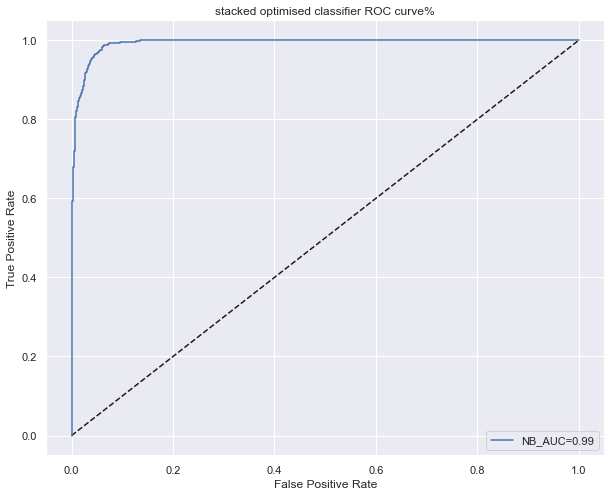

In [480]:
# Plot ROC Curve
stacked_opt_clf_plot = get_roc_curve(stacked_opt_clf_models, "stacked optimised classifier", 1)

###  Trying new features on Training an Artificial Neural Network (ANN) to predict sold or not sold

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 200)               1200      
                                                                 
 dense_7 (Dense)             (None, 300)               60300     
                                                                 
 dense_8 (Dense)             (None, 600)               180600    
                                                                 
 dense_9 (Dense)             (None, 300)               180300    
                                                                 
 dense_10 (Dense)            (None, 50)                15050     
                                                                 
 dense_11 (Dense)            (None, 1)                 51        
                                                                 
Total params: 437,501
Trainable params: 437,501
Non-tr

Epoch 41/100
95/95 [==============================] - 1s 11ms/step - loss: 0.2087 - mse: 0.0620 - accuracy: 0.9226 - val_loss: 0.2216 - val_mse: 0.0656 - val_accuracy: 0.9183
Epoch 42/100
95/95 [==============================] - 1s 11ms/step - loss: 0.2084 - mse: 0.0620 - accuracy: 0.9222 - val_loss: 0.2220 - val_mse: 0.0654 - val_accuracy: 0.9204
Epoch 43/100
95/95 [==============================] - 1s 11ms/step - loss: 0.2080 - mse: 0.0618 - accuracy: 0.9232 - val_loss: 0.2206 - val_mse: 0.0656 - val_accuracy: 0.9196
Epoch 44/100
95/95 [==============================] - 1s 11ms/step - loss: 0.2076 - mse: 0.0618 - accuracy: 0.9242 - val_loss: 0.2205 - val_mse: 0.0656 - val_accuracy: 0.9192
Epoch 45/100
95/95 [==============================] - 1s 11ms/step - loss: 0.2072 - mse: 0.0616 - accuracy: 0.9228 - val_loss: 0.2204 - val_mse: 0.0654 - val_accuracy: 0.9196
Epoch 46/100
95/95 [==============================] - 1s 11ms/step - loss: 0.2069 - mse: 0.0615 - accuracy: 0.9224 - val_loss

Epoch 88/100
95/95 [==============================] - 1s 11ms/step - loss: 0.1952 - mse: 0.0576 - accuracy: 0.9313 - val_loss: 0.2128 - val_mse: 0.0629 - val_accuracy: 0.9230
Epoch 89/100
95/95 [==============================] - 1s 11ms/step - loss: 0.1949 - mse: 0.0575 - accuracy: 0.9314 - val_loss: 0.2123 - val_mse: 0.0630 - val_accuracy: 0.9221
Epoch 90/100
95/95 [==============================] - 1s 11ms/step - loss: 0.1950 - mse: 0.0576 - accuracy: 0.9309 - val_loss: 0.2132 - val_mse: 0.0629 - val_accuracy: 0.9221
Epoch 91/100
95/95 [==============================] - 1s 11ms/step - loss: 0.1945 - mse: 0.0574 - accuracy: 0.9320 - val_loss: 0.2128 - val_mse: 0.0630 - val_accuracy: 0.9192
Epoch 92/100
95/95 [==============================] - 1s 11ms/step - loss: 0.1944 - mse: 0.0573 - accuracy: 0.9315 - val_loss: 0.2119 - val_mse: 0.0631 - val_accuracy: 0.9209
Epoch 93/100
95/95 [==============================] - 1s 11ms/step - loss: 0.1943 - mse: 0.0574 - accuracy: 0.9302 - val_loss

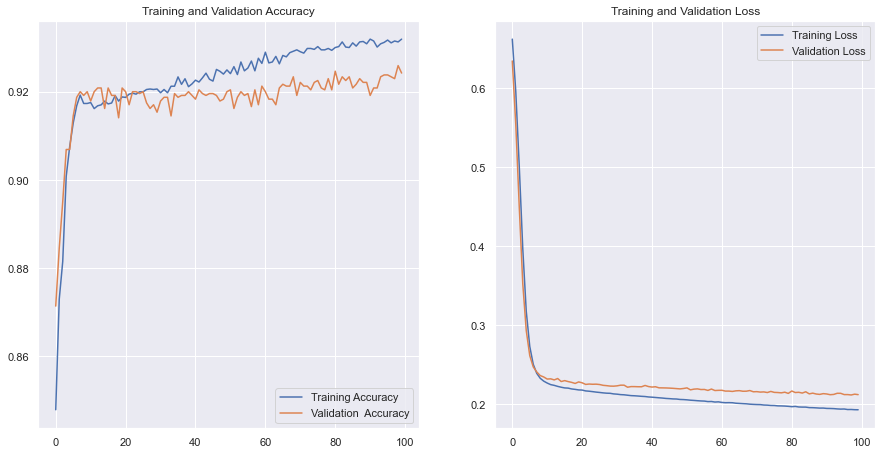

In [481]:
# Trying out optimised features on feed data on my feedforward neural network

model = Sequential([
    layers.Dense (200, activation="relu", input_dim=x_train_sd_stdz_top5.shape[1]),
    #layers.Dropout(0.1),
    layers.Dense(300, activation="relu",),
    layers.Dense(600, activation="relu",),
   # layers.Dropout(0.1),
    layers.Dense(300, activation="relu"),
    layers.Dense(50, activation="relu"),
    layers.Dense(1, activation="sigmoid"),
])
my_opt = tf.keras.optimizers.Adam(learning_rate = 0.00001)
model.compile(optimizer = my_opt,
            loss = "binary_crossentropy",
            metrics = ["mse","accuracy",],
             )

model.summary()
epochs = 100
history = model.fit(x_train_sd_stdz_top5,y_train_sd_top5, batch_size=100, epochs = epochs, validation_data = (x_test_sd_stdz_top5,y_test_sd_top5), shuffle=True)

#model.test_on_batch(x_test,y_test)
#model.metrics_names
#model.evaluate()
acc = history.history ["accuracy"]
val_acc = history.history["val_accuracy"]

loss1 = history.history["loss"]
val_loss1 = history.history["val_loss"]

epochs_range = range(epochs)

loss, _, accuracy = model.evaluate(x_test_sd_stdz_top5,y_test_sd_top5)
print("Test Accuracy :",accuracy)
print("TestLoss: ",loss)


# Plotting the figures

plt.figure(figsize=(15,7.5))
plt.subplot(1,2,1)
plt.plot(epochs_range,acc,label="Training Accuracy")
plt.plot(epochs_range,val_acc,label="Validation  Accuracy")
plt.legend(loc="lower right")
plt.title("Training and Validation Accuracy")

plt.subplot(1,2,2)
plt.plot(epochs_range,loss1,label="Training Loss")
plt.plot(epochs_range,val_loss1,label="Validation Loss")
plt.legend(loc="upper right")
plt.title("Training and Validation Loss")
plt.show()

### Using KNeigbors for hyperparameter optimisation features performance comparism

In [482]:
"""

Testing out an entirely new classifier and regressor and see how it performs with the poor performing models using the 
new found features for classification sold or not sold prediction and the features for the price prediction as confirmed by
hyperparameter optimisation using random forest classifier
The kneighbors classifier and regressor was selected for this task.

"""

'\n\nTesting out an entirely new classifier and regressor and see how it performs with the poor performing models using the \nnew found features for classification sold or not sold prediction and the features for the price prediction as confirmed by\nhyperparameter optimisation using random forest classifier\nThe kneighbors classifier and regressor was selected for this task.\n\n'

### Hyperparameter optimisation fuction to get best kneighnors parameters for the model

In [483]:
# Hyper-parameter Tuning
knn_clf = KNeighborsClassifier()
knn_reg = KNeighborsRegressor()

# Selected parameters of knn classifier optimisation and optimised parameter search
params_knn = {"n_neighbors":np.arange(1, 100)} 
grid_scv_knn_clf = GridSearchCV(knn_clf, param_grid=params_knn, cv=5)

# Selected parameters of knn regressor optimisation and optimised parameter search
params_knn = {"n_neighbors":np.arange(1, 100)} 
grid_scv_knn_reg = GridSearchCV(knn_reg, param_grid=params_knn, cv=5)


def grid_scv_implement(classifier,x_train, y_train):
    result  = classifier.fit(x_train, y_train)
    print(f"The Best parameters for {classifier} are: {classifier.best_params_}")
    return result

### KNeighbors Classifier Model using hyperparameter optimised best feature selected

In [484]:
# Calling KNeighbor hyperparameter optimisation function
knn_clf_result = grid_scv_implement(grid_scv_knn_clf,features_sold_top5, target_sold_top5)

The Best parameters for GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85,
       86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])}) are: {'n_neighbors': 1}


In [485]:
# Printing KNeighbor Optimiser Report
print("KNeighbours Classifier Optimiser Report \n Best Score : {:.4f} \n Best Params: {} \n ".format(knn_clf_result.best_score_, knn_clf_result.best_params_))

KNeighbours Classifier Optimiser Report 
 Best Score : 0.9343 
 Best Params: {'n_neighbors': 1} 
 


In [486]:
# Define model parameters and fit model
knn_opt_clf = KNeighborsClassifier(n_neighbors=1)

knn_opt_clf.fit(x_train_sd_stdz_top5, y_train_sd_top5)

KNeighborsClassifier(n_neighbors=1)

In [487]:
# Generate classification report
knn_opt_clf_pred = get_clf_metrics(knn_opt_clf,"KNeighbors Optimised Classifier Model", 1).execute_metrics()

Training predictions are : 
[0 0 1 ... 0 0 1]

Test predictions are : 
[0 0 1 ... 0 0 1]


The Training accuracy score is : 0.9995
The Validation accuracy score is : 0.9416
The number of accurately predicted points out of a total of 2363 : 2225
The number of mislabeled points out of a total 2363 points : 138


              precision    recall  f1-score   support

           0       0.97      0.91      0.94      1178
           1       0.92      0.97      0.94      1185

    accuracy                           0.94      2363
   macro avg       0.94      0.94      0.94      2363
weighted avg       0.94      0.94      0.94      2363

[[1074  104]
 [  34 1151]]


Train Data Accuracy Average After Cross_validation with KNeighbors Optimised Classifier Model : 0.998969963879963
Test Data Accuracy Average After Cross_validation with KNeighbors Optimised Classifier Model : 0.9236651001940344


,fit_time,score_time,test_score,train_score
0,0.017989,0.148915,0.921788,0.998984
1,0.022986,0.149893,0.930404,0.999238
2,0.018010,0.139920,0.921768,0.998730
3,0.017991,0.136941,0.925597,0.998349
4,0.019011,0.142918,0.923038,0.999238
5,0.017970,0.147935,0.923292,0.998984
6,0.016987,0.148937,0.927120,0.998857
7,0.017969,0.143921,0.921514,0.999365
8,0.018010,0.137921,0.918466,0.998984




Training data performance review:


,sold,Predicted Sold
0,0,1
1,0,1
2,1,0
3,1,1
4,1,0
5,1,0
6,1,1
7,1,0
8,1,0
9,1,1




Test data performance review:


,sold,Predicted Sold
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1
5,1,1
6,1,0
7,0,1
8,0,1
9,1,1


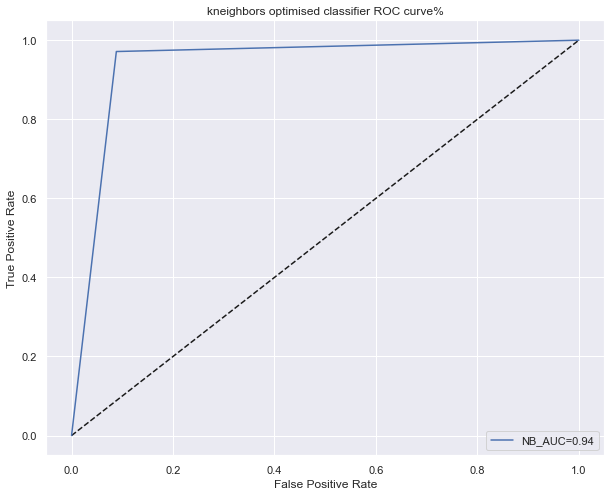

In [488]:
# Plot ROC Curve
knn_opt_clf_plot = get_roc_curve(knn_opt_clf, "kneighbors optimised classifier", 1)

### KNeighbors Classifier Model using KBest feature selected

In [489]:
# Define model parameters and fit model
knn_clf = KNeighborsClassifier(n_neighbors=1)

knn_clf.fit(x_train_sd_stdz, y_train_sd)

KNeighborsClassifier(n_neighbors=1)

In [490]:
# Generate classification report
knn_clf_pred = get_clf_metrics(knn_clf,"KNeighbors Classifier Model").execute_metrics()

Training predictions are : 
[0 1 0 ... 0 0 0]

Test predictions are : 
[1 0 1 ... 0 0 1]


The Training accuracy score is : 0.9693
The Validation accuracy score is : 0.8392
The number of accurately predicted points out of a total of 2363 : 1983
The number of mislabeled points out of a total 2363 points : 380


              precision    recall  f1-score   support

           0       0.90      0.76      0.82      1167
           1       0.79      0.92      0.85      1196

    accuracy                           0.84      2363
   macro avg       0.85      0.84      0.84      2363
weighted avg       0.85      0.84      0.84      2363

[[ 882  285]
 [  95 1101]]


Train Data Accuracy Average After Cross_validation with KNeighbors Classifier Model : 0.9735297191793677
Test Data Accuracy Average After Cross_validation with KNeighbors Classifier Model : 0.7897898833436626


,fit_time,score_time,test_score,train_score
0,0.017008,0.166884,0.795835,0.972695
1,0.015989,0.143901,0.793752,0.973587
2,0.015989,0.128926,0.784354,0.973841
3,0.016969,0.131923,0.789741,0.973584
4,0.018006,0.130925,0.791974,0.973714
5,0.016990,0.141900,0.793752,0.973460
6,0.017990,0.134924,0.789487,0.972568
7,0.016990,0.137941,0.785624,0.974984
8,0.015990,0.132924,0.783592,0.973333




Training data performance review:


,sold,Predicted Sold
0,0,0
1,1,1
2,1,1
3,1,1
4,1,1
5,0,0
6,1,1
7,1,1
8,1,1
9,1,1




Test data performance review:


,sold,Predicted Sold
0,1,1
1,0,0
2,1,1
3,1,1
4,1,1
5,1,1
6,1,1
7,0,1
8,0,0
9,1,1


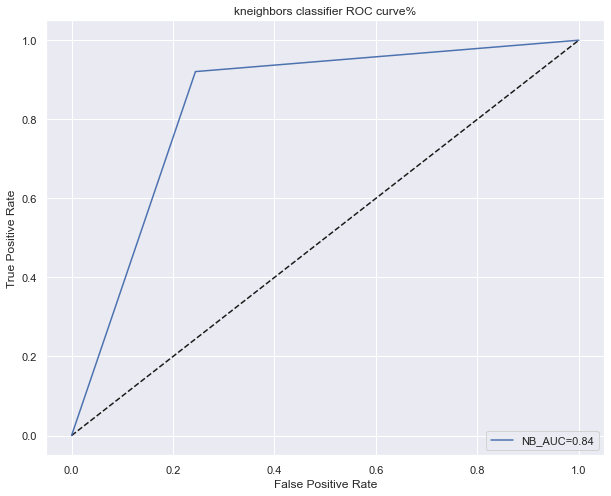

In [491]:
# Plot ROC Curve
knn_clf_plot = get_roc_curve(knn_clf, "kneighbors classifier")

### KNeighbors Regressor Model using hyperparameter optimised best feature selected

In [492]:
# Calling KNeighbor hyperparameter optimisation function
knn_reg_result = grid_scv_implement(grid_scv_knn_reg,features_selling_price, target_selling_price)

The Best parameters for GridSearchCV(cv=5, estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85,
       86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])}) are: {'n_neighbors': 1}


In [493]:
# Printing KNeighbor Optimiser Report
print("KNeighbours Regressor Optimiser Report \n Best Score : {:.4f} \n Best Params: {} \n ".format(knn_reg_result.best_score_, knn_reg_result.best_params_))

KNeighbours Regressor Optimiser Report 
 Best Score : 0.9239 
 Best Params: {'n_neighbors': 1} 
 


In [494]:
# Define model parameters and fit model
knn_opt_reg = KNeighborsRegressor(n_neighbors=1)

knn_opt_reg.fit(x_train_top4, y_train_top4)

KNeighborsRegressor(n_neighbors=1)

In [495]:
# Generate classification report
knn_opt_reg_pred = get_opt_reg_metrics(knn_opt_reg,"KNeighbors Optimised Regressor Model").execute_opt_metrics()

Training predictions are : 
[ 1200.  3120.  3600. ...  1320. 10800.  9600.]

Test predictions are : 
[7800. 7080. 3240. ... 2280. 5160. 7800.]


The training accuracy for KNeighbors Optimised Regressor Model is 0.9976286038571881
The test accuracy for KNeighbors Optimised Regressor Model is 0.852872276348243


Mean Absolute Error for KNeighbors Optimised Regressor Model : 1674.0354071826
Mean Squared Error for KNeighbors Optimised Regressor Model : 15393506.76378351
Root Mean Squared Error for KNeighbors Optimised Regressor Model : 3923.4559719440604


Mean bias error for KNeighbors Optimised Regressor Model : 76.78098128477491


Relative root mean square error for KNeighbors Optimised Regressor Model : 0.3112970471337518


Train Data Accuracy Average After Cross_validation with KNeighbors Optimised Regressor Model : 0.9975080196718551
Test Data Accuracy Average After Cross_validation with KNeighbors Optimised Regressor Model : 0.845553905092863


,fit_time,score_time,test_r2,train_r2,test_neg_mean_absolute_error,train_neg_mean_absolute_error,test_neg_mean_squared_error,train_neg_mean_squared_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
0,0.008994,0.013994,0.876618,0.997087,-1753.663505,-126.603416,-1.194918e+07,-275372.256546,-3456.758123,-524.759237
1,0.007993,0.012016,0.819341,0.997093,-1823.484630,-129.336748,-1.714099e+07,-277689.860747,-4140.168295,-526.962865
2,0.008994,0.015972,0.825167,0.998164,-1745.344213,-106.853918,-1.646631e+07,-175975.343768,-4057.869579,-419.494152
3,0.009995,0.013014,0.873653,0.996831,-1818.438543,-136.105693,-1.223633e+07,-299616.651044,-3498.045906,-547.372498
4,0.008971,0.012995,0.861798,0.996993,-1736.146490,-129.671410,-1.311270e+07,-287251.274521,-3621.145545,-535.958277
5,0.007976,0.013011,0.808129,0.998159,-1769.556736,-107.875925,-1.807106e+07,-176523.214950,-4251.006892,-420.146659
6,0.008976,0.012990,0.857145,0.998041,-1761.769347,-109.255977,-1.383502e+07,-185148.988425,-3719.545937,-430.289424
7,0.009973,0.012993,0.829094,0.997872,-1841.249715,-115.318346,-1.621569e+07,-203222.498008,-4026.871239,-450.802061
8,0.008994,0.010995,0.859040,0.997333,-1659.438330,-122.473155,-1.327607e+07,-255710.701575,-3643.634646,-505.678457




Train prediction mean deviation:  -9.972170686456401
Train prediction standard deviation:  467.5101676076059


,max_power,selling_price,Predicted Selling Price,selling_diff,lower_limit_train_thres,+/-train_threshold
0,70.00,1200,1200.0,0.0,-60.0,60.0
1,40.30,3120,3120.0,0.0,-156.0,156.0
2,120.00,3600,3600.0,0.0,-180.0,180.0
3,88.76,7500,7500.0,0.0,-375.0,375.0
4,84.00,5160,5160.0,0.0,-258.0,258.0
5,85.80,1920,1920.0,0.0,-96.0,96.0
6,204.00,36000,36000.0,0.0,-1800.0,1800.0
7,74.00,7920,7920.0,0.0,-396.0,396.0
8,74.00,7800,7800.0,0.0,-390.0,390.0
9,69.00,5400,5400.0,0.0,-270.0,270.0


Test prediction mean deviation:  76.78098128477491
Test prediction standard deviation:  3923.6970700414513


,max_power,selling_price,Predicted Selling Price,selling_diff,+/-test_threshold
0,74.00,6012,7800.0,-1788.0,300.60
1,74.00,5280,7080.0,-1800.0,264.00
2,70.00,1680,3240.0,-1560.0,84.00
3,87.20,5723,4800.0,923.0,286.15
4,81.80,7440,7800.0,-360.0,372.00
5,118.00,4560,2640.0,1920.0,228.00
6,81.86,4320,6000.0,-1680.0,216.00
7,110.00,2220,2940.0,-720.0,111.00
8,37.00,1884,3960.0,-2076.0,94.20
9,87.20,7200,3000.0,4200.0,360.00


The percentage of train predictions within limit are:  0.10288412885815483
The percentage of train predictions outside limit are:  0.8971158711418452
The percentage of test predictions within limit are:  0.7056145675265554
The percentage of test predictions outside limit are:  0.2943854324734446


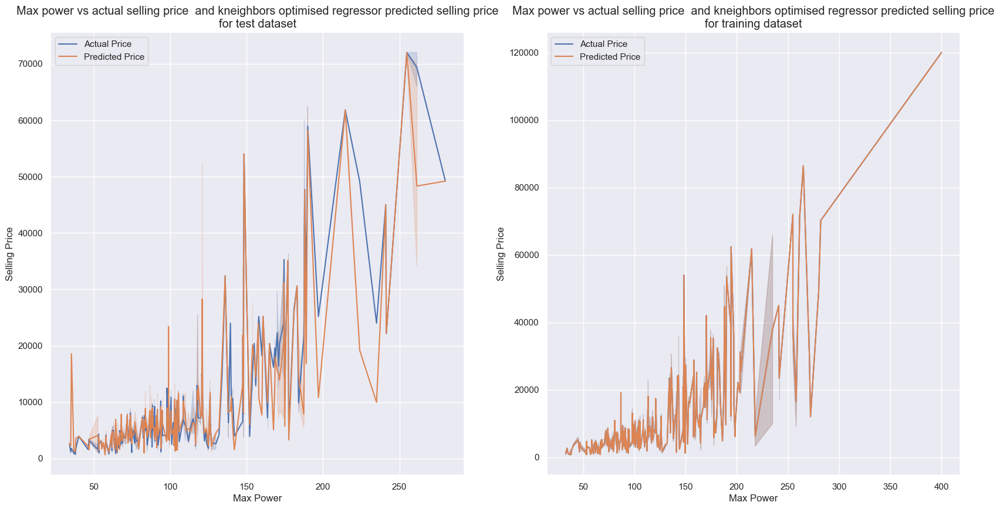

In [496]:
# Plotting performance of Optimised random Forest Regressor of selling price prediction 
knn_opt_reg_plot = generate_opt_plot(knn_opt_reg_pred, "kneighbors optimised regressor")

### KNeighbors Regressor Model using KBest feature selected

In [497]:
# Define model parameters and fit model
knn_reg = KNeighborsRegressor(n_neighbors=1)

knn_reg.fit(x_train, y_train)

KNeighborsRegressor(n_neighbors=1)

In [498]:
# Generate classification report
knn_reg_pred = get_reg_metrics(knn_reg,"KNeighbors Regressor Model").execute_metrics()

Training predictions are : 
[ 1200.  3120.  3600. ...  1320. 13200. 10680.]

Test predictions are : 
[5940. 6840. 3120. ... 1800. 6000. 7800.]


The training accuracy for KNeighbors Regressor Model is 0.9805102747383595
The test accuracy for KNeighbors Regressor Model is 0.9686344328901579


Mean Absolute Error for KNeighbors Regressor Model : 1029.2230652503792
Mean Squared Error for KNeighbors Regressor Model : 3281679.736975215
Root Mean Squared Error for KNeighbors Regressor Model : 1811.5407080646062


Mean bias error for KNeighbors Regressor Model : 3.8654527061203843


Relative root mean square error for KNeighbors Regressor Model : 0.1415384162258079


Train Data Accuracy Average After Cross_validation with KNeighbors Regressor Model : 0.9814679528699352
Test Data Accuracy Average After Cross_validation with KNeighbors Regressor Model : 0.9313280783241635


,fit_time,score_time,test_r2,train_r2,test_neg_mean_absolute_error,train_neg_mean_absolute_error,test_neg_mean_squared_error,train_neg_mean_squared_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error
0,0.009994,0.013995,0.913488,0.982679,-1149.646434,-676.847438,-8.378442e+06,-1.637352e+06,-2894.553887,-1279.590670
1,0.009015,0.013972,0.930096,0.981604,-1185.835674,-719.738759,-6.632537e+06,-1.757107e+06,-2575.371164,-1325.559223
2,0.007993,0.018991,0.936247,0.981450,-1111.383681,-709.987099,-6.004466e+06,-1.778331e+06,-2450.401128,-1333.540749
3,0.007995,0.013994,0.939285,0.978608,-1139.371017,-749.610816,-5.880027e+06,-2.022249e+06,-2424.876694,-1422.057900
4,0.010992,0.014992,0.942219,0.980145,-1130.127514,-730.292354,-5.482334e+06,-1.896439e+06,-2341.438528,-1377.112666
5,0.009992,0.013994,0.942057,0.983357,-1091.458824,-679.376779,-5.457232e+06,-1.595479e+06,-2336.071818,-1263.122639
6,0.008994,0.014993,0.897219,0.980699,-1211.931715,-724.592220,-9.954051e+06,-1.824599e+06,-3155.004121,-1350.777309
7,0.008994,0.013994,0.925393,0.980399,-1172.566603,-727.892810,-7.078769e+06,-1.872226e+06,-2660.595701,-1368.293248
8,0.008994,0.015013,0.955949,0.984271,-1084.176850,-670.209068,-4.148830e+06,-1.507812e+06,-2036.867770,-1227.930161




Train prediction mean deviation:  -31.734187890032047
Train prediction standard deviation:  1340.1978609612036


,torque_splitnm,selling_price,Predicted Selling Price,selling_diff,lower_limit_train_thres,+/-train_threshold
0,140.0,1200,1200.0,0.0,-60.0,60.0
1,60.0,3120,3120.0,0.0,-156.0,156.0
2,290.0,3600,3600.0,0.0,-180.0,180.0
3,200.0,7500,7200.0,300.0,-375.0,375.0
4,114.0,5160,5160.0,0.0,-258.0,258.0
5,114.0,1920,1920.0,0.0,-96.0,96.0
6,500.0,36000,36000.0,0.0,-1800.0,1800.0
7,190.0,7920,7920.0,0.0,-396.0,396.0
8,190.0,7800,7800.0,0.0,-390.0,390.0
9,140.0,5400,5400.0,0.0,-270.0,270.0


Test prediction mean deviation:  3.8654527061203843
Test prediction standard deviation:  1811.9949108059461


,torque_splitnm,selling_price,Predicted Selling Price,selling_diff,+/-test_threshold
0,190.00,6012,5940.0,72.0,300.60
1,190.00,5280,6840.0,-1560.0,264.00
2,135.40,1680,3120.0,-1440.0,84.00
3,205.00,5723,4980.0,743.0,286.15
4,113.00,7440,5760.0,1680.0,372.00
5,146.00,4560,9600.0,-5040.0,228.00
6,113.75,4320,9300.0,-4980.0,216.00
7,140.00,2220,2544.0,-324.0,111.00
8,59.00,1884,1452.0,432.0,94.20
9,205.00,7200,4980.0,2220.0,360.00


The percentage of train predictions within limit are:  0.5312868949232585
The percentage of train predictions outside limit are:  0.46871310507674147
The percentage of test predictions within limit are:  0.7207890743550834
The percentage of test predictions outside limit are:  0.27921092564491656


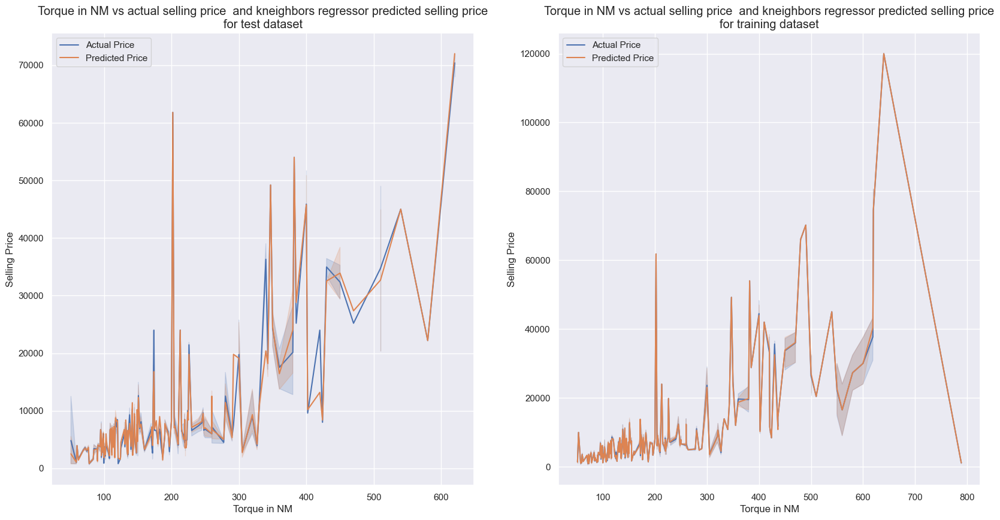

In [499]:
# Plotting performance of Optimised random Forest Regressor of selling price prediction 
knn_reg_plot = generate_plot(knn_reg_pred, "kneighbors regressor")

### Saving the preferred models

In [500]:
# Saving my preffered model which is the stacked models using the stacked classifier and regressor as applicable
price_path = "Saved Model/Car_Price_Estimator_Model.pkl"
sold_path = "Saved Model/Car_Sold_Classifier_Model.pkl"

model_list = [xgb_reg, stacked_opt_clf_models]

path_list = [price_path, sold_path]

model_name = ["xgboost Regressor Model", "Stacked Classifier Model"]

for i,j,k in zip(path_list,model_list,model_name):
    filepath = Path(i)  
    filepath.parent.mkdir(parents=True, exist_ok=True) 
    pickle.dump(j, open(filepath, "wb"))
    print("NOTE: Saved {} model at : {} \n".format(k, i))

NOTE: Saved xgboost Regressor Model model at : Saved Model/Car_Price_Estimator_Model.pkl 

NOTE: Saved Stacked Classifier Model model at : Saved Model/Car_Sold_Classifier_Model.pkl 



### Saving Selected Plots and Visualisations

In [501]:
#Function for saving plotted figures

file_name = [
"name_count_plot", "year_count_plot", "owner_col_expl", "owner_col_expl_ver2", "region_col_expl", "seats_col_expl", "seller_type_col_expl",
"fuel_col_expl", "name_selling_price_box_plot", "corr_plot", "rf_reg_plot", "lr_reg_plot", "pr_reg_plot", "ransac_reg_plot", "svr_reg_plot",
"xgb_reg_plot", "stacked_reg_plot", "knn_reg_plot", "rf_opt_reg_plot", "lr_opt_reg_plot", "pr_opt_reg_plot", "ransac_opt_reg_plot", "svr_opt_reg_plot",
"xgb_opt_reg_plot", "stacked_opt_reg_plot", "knn_opt_reg_plot", "rf_best_params_plot_reg", "rf_best_params_plot_clf",            
            ]
fig_sheet_name = [
name_count_plot, year_count_plot, owner_col_expl, owner_col_expl_ver2, region_col_expl, seats_col_expl, seller_type_col_expl,
fuel_col_expl, name_selling_price_box_plot, corr_plot, rf_reg_plot, lr_reg_plot, pr_reg_plot, ransac_reg_plot, svr_reg_plot,
xgb_reg_plot, stacked_reg_plot, knn_reg_plot,  rf_opt_reg_plot, lr_opt_reg_plot, pr_opt_reg_plot, ransac_opt_reg_plot, svr_opt_reg_plot,
xgb_opt_reg_plot, stacked_opt_reg_plot, knn_opt_reg_plot, rf_best_params_plot, rf_best_params_plot_clf,              
                 ]


def save_plots(plot_figs,folder="./"):
    if(not os.path.exists(folder)):
        os.makedirs(folder)
        print("NOTE: Created new folder at:",folder)
        
    for line_number,f_name in enumerate(file_name):
        save_location = folder + f_name + ".png"
        fig_sheet_name[line_number].savefig(save_location)
        print("NOTE: Saved {} at: {}".format(f_name,folder))
        
# Calling the function that would execute the saving of plots
save_plots(fig_sheet_name,"./saved plots/")

NOTE: Saved name_count_plot at: ./saved plots/
NOTE: Saved year_count_plot at: ./saved plots/
NOTE: Saved owner_col_expl at: ./saved plots/
NOTE: Saved owner_col_expl_ver2 at: ./saved plots/
NOTE: Saved region_col_expl at: ./saved plots/
NOTE: Saved seats_col_expl at: ./saved plots/
NOTE: Saved seller_type_col_expl at: ./saved plots/
NOTE: Saved fuel_col_expl at: ./saved plots/
NOTE: Saved name_selling_price_box_plot at: ./saved plots/
NOTE: Saved corr_plot at: ./saved plots/
NOTE: Saved rf_reg_plot at: ./saved plots/
NOTE: Saved lr_reg_plot at: ./saved plots/
NOTE: Saved pr_reg_plot at: ./saved plots/
NOTE: Saved ransac_reg_plot at: ./saved plots/
NOTE: Saved svr_reg_plot at: ./saved plots/
NOTE: Saved xgb_reg_plot at: ./saved plots/
NOTE: Saved stacked_reg_plot at: ./saved plots/
NOTE: Saved knn_reg_plot at: ./saved plots/
NOTE: Saved rf_opt_reg_plot at: ./saved plots/
NOTE: Saved lr_opt_reg_plot at: ./saved plots/
NOTE: Saved pr_opt_reg_plot at: ./saved plots/
NOTE: Saved ransac_opt

### Save dataframe of features as csv for future use in console

In [502]:
# Save the dataframe needed in the console app as a csv file
features_sold_top5.to_csv("New_Guide_Sheets/CSV_file/features.csv", sep=",", mode="w", header=True, index_label="index") 

In [503]:
features_sold_top5

,fuel,City,km_driven,engine,Region
6339,1,1124,80000,998,1
1913,1,251,110000,1493,0
3793,1,307,33003,1172,0
145,0,1,9000,1999,0
386,0,3,19000,1248,2
...,...,...,...,...,...
4114,0,747,110000,2179,1
1254,0,85,90000,1498,2
7748,0,1297,70000,1493,2
4412,2,811,60000,1086,3


### Saving cleaned data into a csv file

In [504]:
# Save the dataframe needed in the console app as a csv file
car_df.to_csv("New_Guide_Sheets/CSV_file/cleaned_used_cars_data.csv", sep=",", mode="w", header=True, index_label="index") 

In [505]:
car_df[lambda x: x.Region == "South"]

,Sales_ID,name,year,selling_price,km_driven,Region,State or Province,City,fuel,seller_type,...,owner,mileage,engine,max_power,seats,sold,torque_splitnm,torque_splitrpm,selling_price_grouped,std_price
27,29,Maruti,2009,2640,120000,South,Georgia,Atlanta,Petrol,Individual,...,First_Owner,18.90,1061,67.00,5,Y,84.0,3500,2640.0,-0.528327
37,40,Tata,2011,5100,60000,South,North Carolina,Charlotte,Diesel,Individual,...,Second_Owner,13.93,2179,138.03,7,Y,320.0,2200,5100.0,-0.276339
52,55,Honda,2015,6300,63000,South,Georgia,Atlanta,Diesel,Dealer,...,First_Owner,27.30,1498,98.60,5,Y,200.0,1750,6300.0,-0.153418
54,57,Toyota,2016,11400,99000,South,Georgia,Atlanta,Diesel,Dealer,...,First_Owner,12.99,2494,100.60,7,Y,200.0,2400,11400.0,0.368995
55,58,Audi,2013,21000,33900,South,Georgia,Atlanta,Diesel,Dealer,...,Second_Owner,17.68,1968,174.33,5,Y,380.0,2125,21000.0,1.352362
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7894,8117,Maruti,2017,4080,45000,South,North Carolina,Mooresville,Petrol,Individual,...,First_Owner,23.95,998,67.10,5,N,90.0,3500,4080.0,-0.380822
7895,8118,Maruti,2015,7500,50000,South,North Carolina,Monroe,Diesel,Individual,...,First_Owner,26.59,1248,74.00,5,N,190.0,2000,7500.0,-0.030497
7896,8119,Hyundai,2013,4560,25000,South,North Carolina,Mooresville,Petrol,Individual,...,First_Owner,18.50,1197,82.85,5,N,113.7,4000,4560.0,-0.331653
7897,8120,Maruti,2017,4320,80000,South,North Carolina,Monroe,Petrol,Individual,...,First_Owner,20.51,998,67.04,5,N,90.0,3500,4320.0,-0.356237
